In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import r2_score

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

import warnings

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
warnings.filterwarnings('ignore')

In [2]:
dataset_df = pd.read_csv('train.csv')
dataset_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
dataset_df.shape

(1460, 81)

# Step 1: Reading, Understanding, and Visualising the Data

## Dealing with Null Values

In [4]:
dataset_df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType        872
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [5]:
dataset_df['LotFrontage'] = dataset_df['LotFrontage'].fillna(0)
dataset_df['Alley'] = dataset_df['Alley'].fillna('Non')
dataset_df['MasVnrType'] = dataset_df['MasVnrType'].fillna('Non')
dataset_df['BsmtQual'] = dataset_df['BsmtQual'].fillna('Non')
dataset_df['BsmtCond'] = dataset_df['BsmtCond'].fillna('Non')
dataset_df['BsmtExposure'] = dataset_df['BsmtExposure'].fillna('Non')
dataset_df['BsmtFinType1'] = dataset_df['BsmtFinType1'].fillna('Non')
dataset_df['BsmtFinType2'] = dataset_df['BsmtFinType2'].fillna('Non')
dataset_df['FireplaceQu'] = dataset_df['FireplaceQu'].fillna('Non')
dataset_df['GarageYrBlt'] = dataset_df['GarageYrBlt'].fillna('Non')
dataset_df['GarageFinish'] = dataset_df['GarageFinish'].fillna('Non')
dataset_df['GarageType'] = dataset_df['GarageType'].fillna('Non')
dataset_df['GarageQual'] = dataset_df['GarageQual'].fillna('Non')
dataset_df['GarageCond'] = dataset_df['GarageCond'].fillna('Non')
dataset_df['PoolQC'] = dataset_df['PoolQC'].fillna('Non')
dataset_df['Fence'] = dataset_df['Fence'].fillna('Non')
dataset_df['MiscFeature'] = dataset_df['MiscFeature'].fillna('Non')
dataset_df['MasVnrArea'] = dataset_df['MasVnrArea'].fillna(0)

In [6]:
elec_null_idx = dataset_df[dataset_df['Electrical'].isnull()].index
dataset_df = dataset_df.drop(index=elec_null_idx).reset_index(drop=True)

In [7]:
dataset_df.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

## Pre-processing Years

Putting the years into buckets of half a century

In [8]:
year_cols = [ 'YearBuilt', 'YearRemodAdd', 'GarageYrBlt' ]

In [9]:
year_bins = [ 1850, 1900, 1950, 2000, 2025 ]
year_labels = [ '1850-1899', '1900-1949', '1950-1999', '2000-till date' ]

In [10]:
for col in year_cols:
    non_null_GarageYrBlt = (dataset_df[col]!='Non')
    dataset_df.loc[non_null_GarageYrBlt, col] = \
        pd.cut(dataset_df.loc[non_null_GarageYrBlt, col].astype(int), bins=year_bins, labels=year_labels, right=False, ordered=True)

    print(col)
    print(dataset_df.loc[:5, col])
    print()

YearBuilt
0    2000-till date
1         1950-1999
2    2000-till date
3         1900-1949
4    2000-till date
5         1950-1999
Name: YearBuilt, dtype: object

YearRemodAdd
0    2000-till date
1         1950-1999
2    2000-till date
3         1950-1999
4    2000-till date
5         1950-1999
Name: YearRemodAdd, dtype: object

GarageYrBlt
0    2000-till date
1         1950-1999
2    2000-till date
3         1950-1999
4    2000-till date
5         1950-1999
Name: GarageYrBlt, dtype: object



## Analysis on Unique Values

In [11]:
dataset_df.nunique()

Id               1459
MSSubClass         15
MSZoning            5
LotFrontage       111
LotArea          1072
Street              2
Alley               3
LotShape            4
LandContour         4
Utilities           2
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt           4
YearRemodAdd        2
RoofStyle           6
RoofMatl            8
Exterior1st        15
Exterior2nd        16
MasVnrType          4
MasVnrArea        327
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            5
BsmtCond            5
BsmtExposure        5
BsmtFinType1        7
BsmtFinSF1        637
BsmtFinType2        7
BsmtFinSF2        144
BsmtUnfSF         780
TotalBsmtSF       721
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          752
2ndFlrSF          417
LowQualFin

As per the assesment of unique values as well as with the data from data dictionary, separated the columns to the following groups

In [12]:
cat_cols = [ 'MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 
            'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 
            'MasVnrType', 'Foundation', 'Heating', 'CentralAir', 'Electrical', 'Functional', 'GarageType', 'PavedDrive', 'MiscFeature',
            'SaleType', 'SaleCondition', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
             'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'GarageYrBlt',
             'MoSold', 'YrSold', 'YearBuilt', 'YearRemodAdd', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'OverallCond',
             'Fireplaces', 'BedroomAbvGr', 'KitchenAbvGr']
num_cols = [ 'LotFrontage', 'LotArea', 'OverallQual', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF',
            '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'TotRmsAbvGrd', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 
            'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal' ]
other_cols = [ 'Id' ]

target_col = 'SalePrice'

The columns 'MoSold' and 'YrSold' is grouped in categorical columns, but 'YearBuilt', 'YearRemodAdd' and 'GarageYrBlt' are grouped in numerical columns <br>
Reason: <br>
- Too many different values in 'YearBuilt', 'YearRemodAdd' and 'GarageYrBlt', so they can't be grouped with the categorical columns.

## Checking for outliers

In [13]:
dataset_df.describe(percentiles=[0.25, 0.5, 0.75, 0.9, 0.99])

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,730.054832,56.881426,57.612748,10517.363948,6.100069,5.575737,103.187800,443.943797,46.581220,567.366004,1057.891021,1162.906785,346.791638,5.848526,1515.546950,0.425634,0.057574,1.564770,0.382454,2.866347,1.046607,6.517478,0.613434,1.766964,473.030158,94.240576,46.692255,21.969157,3.411926,15.071282,2.760795,43.518849,6.322824,2007.815627,180930.394791
std,421.411181,42.310746,34.673850,9984.666267,1.383171,1.113079,180.773158,456.106417,161.369977,441.992392,438.500975,386.572089,436.610637,48.639512,525.650927,0.518969,0.238830,0.550987,0.502798,0.816050,0.220410,1.625902,0.644687,0.747546,213.869604,125.381679,66.267472,61.137400,29.327247,55.775138,40.191018,496.291826,2.704331,1.328542,79468.964025
min,1.000000,20.000000,0.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.500000,20.000000,42.000000,7549.000000,5.000000,5.000000,0.000000,0.000000,0.000000,223.000000,796.000000,882.000000,0.000000,0.000000,1129.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,333.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129950.000000
50%,730.000000,50.000000,63.000000,9477.000000,6.000000,5.000000,0.000000,384.000000,0.000000,479.000000,992.000000,1088.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1094.500000,70.000000,79.000000,11603.000000,7.000000,6.000000,164.500000,712.500000,0.000000,808.000000,1298.500000,1391.500000,728.000000,0.000000,1777.500000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
90%,1313.200000,120.000000,92.000000,14388.400000,8.000000,7.000000,335.000000,1066.000000,117.400000,1232.000000,1602.400000,1680.000000,954.400000,0.000000,2158.600000,1.000000,0.000000,2.000000,1.000000,4.000000,1.000000,9.000000,1.000000,3.000000,757.200000,262.000000,130.000000,112.000000,0.000000,0.000000,0.000000,0.000000,10.000000,2010.000000,278000.000000
99%,1445.420000,190.000000,137.420000,37593.680000,10.000000,9.000000,791.360000,1572.420000,830.560000,1797.100000,2155.100000,2219.520000,1419.040000,360.000000,3123.760000,2.000000,1.000000,3.000000,1.000000,5.000000,2.000000,11.000000,2.000000,3.000000,1002.980000,505.520000,285.840000,261.100000,168.000000,268.100000,0.000000,700.000000,12.000000,2010.000000,442629.620000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,

Found outliers in 'LotFrontage' column. <br>
It can be clearly seen in the difference bw 99th percentile value (37593.68) and the max value (215245.00)

In [14]:
dataset_df = dataset_df[ dataset_df['LotArea'] <= dataset_df['LotArea'].quantile(0.99) ]

In [15]:
dataset_df.describe(percentiles=[0.25, 0.5, 0.75, 0.9, 0.99])

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000,1444.000000
mean,731.593490,56.966759,57.539474,9776.617729,6.090720,5.574100,101.827562,434.547784,45.303324,569.218144,1049.069252,1155.178670,345.109418,5.909280,1506.197368,0.418283,0.057479,1.561634,0.382271,2.866343,1.047091,6.504155,0.601801,1.761773,471.091413,92.064404,46.145429,22.162742,3.447368,14.961219,2.457064,43.139889,6.318560,2007.815097,179852.663435
std,421.684424,42.306298,33.847593,4240.324624,1.376245,1.114098,178.555170,429.517339,158.389502,442.690265,413.248516,370.620908,434.689227,48.887989,506.246731,0.512733,0.238715,0.546845,0.502927,0.811902,0.221501,1.610124,0.635099,0.748318,212.453421,121.558803,65.324646,61.411491,29.477207,55.651486,38.394101,498.403105,2.702565,1.329768,78522.367193
min,1.000000,20.000000,0.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,366.750000,20.000000,42.750000,7500.000000,5.000000,5.000000,0.000000,0.000000,0.000000,224.000000,794.750000,881.500000,0.000000,0.000000,1126.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,326.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129800.000000
50%,733.500000,50.000000,63.000000,9423.000000,6.000000,5.000000,0.000000,379.500000,0.000000,481.500000,990.000000,1082.000000,0.000000,0.000000,1456.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,478.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,162000.000000
75%,1096.250000,70.000000,79.000000,11475.750000,7.000000,6.000000,163.250000,704.250000,0.000000,808.500000,1281.750000,1382.000000,728.000000,0.000000,1768.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,213000.000000
90%,1313.700000,120.000000,92.000000,14136.000000,8.000000,7.000000,322.800000,1055.100000,107.400000,1233.400000,1593.700000,1666.800000,941.000000,0.000000,2151.800000,1.000000,0.000000,2.000000,1.000000,4.000000,1.000000,9.000000,1.000000,3.000000,753.700000,256.700000,130.000000,112.000000,0.000000,0.000000,0.000000,0.000000,10.000000,2010.000000,275350.000000
99%,1445.570000,190.000000,134.000000,25203.870000,10.000000,9.000000,781.120000,1555.390000,809.240000,1797.850000,2129.550000,2202.270000,1382.540000,360.000000,3037.280000,1.000000,1.000000,3.000000,1.000000,5.000000,2.000000,11.000000,2.000000,3.000000,989.840000,481.700000,278.560000,261.850000,168.000000,268.850000,0.000000,700.000000,12.000000,2010.000000,439475.400000
max,1460.000000,190.000000,313.000000,36500.000000,10.000000,9.000000,1600.000000,2188.000000,1474.000000,2336.000000,3206.000000,3228.000000,2065.000000,572.000000,4476.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1390.000000,736.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.

In [16]:
dataset_df.shape

(1444, 81)

## EDA on Numerical Columns

LotFrontage


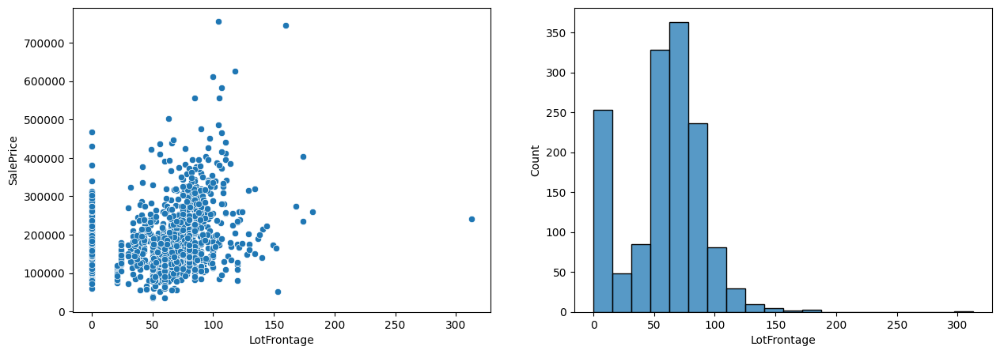

    hist_x  hist_y
0     0.00     253
1    15.65      48
2    31.30      85
3    46.95     328
4    62.60     363
5    78.25     236
6    93.90      81
7   109.55      29
8   125.20      10
9   140.85       5
10  156.50       2
11  172.15       3
12  187.80       0
13  203.45       0
14  219.10       0
15  234.75       0
16  250.40       0
17  266.05       0
18  281.70       0
19  297.35       1


LotArea


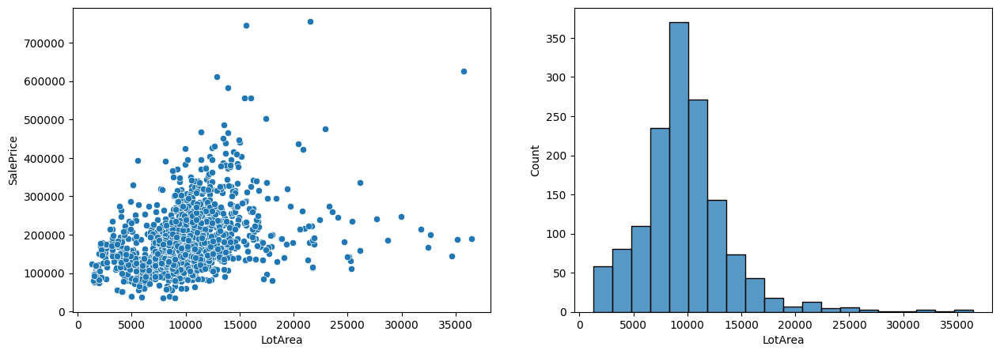

     hist_x  hist_y
0    1300.0      58
1    3060.0      80
2    4820.0     110
3    6580.0     235
4    8340.0     370
5   10100.0     271
6   11860.0     143
7   13620.0      73
8   15380.0      43
9   17140.0      18
10  18900.0       7
11  20660.0      13
12  22420.0       5
13  24180.0       6
14  25940.0       3
15  27700.0       1
16  29460.0       1
17  31220.0       3
18  32980.0       1
19  34740.0       3


OverallQual


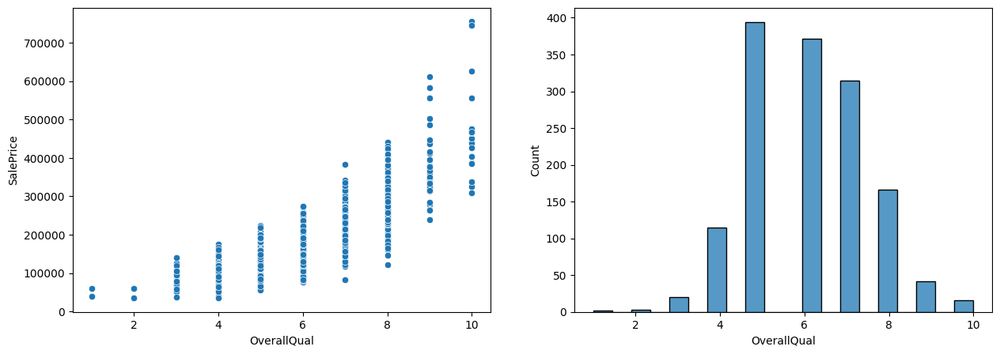

    hist_x  hist_y
0     1.00       2
1     1.45       0
2     1.90       3
3     2.35       0
4     2.80      20
5     3.25       0
6     3.70     115
7     4.15       0
8     4.60     394
9     5.05       0
10    5.50       0
11    5.95     371
12    6.40       0
13    6.85     315
14    7.30       0
15    7.75     166
16    8.20       0
17    8.65      42
18    9.10       0
19    9.55      16


MasVnrArea


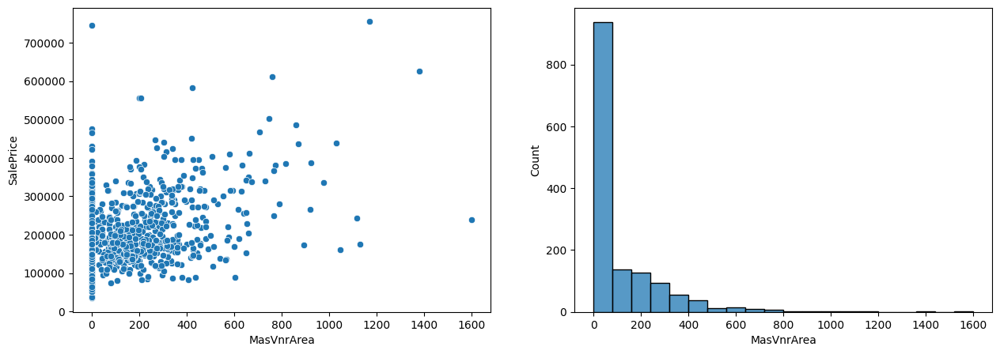

    hist_x  hist_y
0      0.0     937
1     80.0     138
2    160.0     126
3    240.0      93
4    320.0      55
5    400.0      37
6    480.0      12
7    560.0      15
8    640.0      10
9    720.0       7
10   800.0       3
11   880.0       3
12   960.0       2
13  1040.0       2
14  1120.0       2
15  1200.0       0
16  1280.0       0
17  1360.0       1
18  1440.0       0
19  1520.0       1


BsmtFinSF1


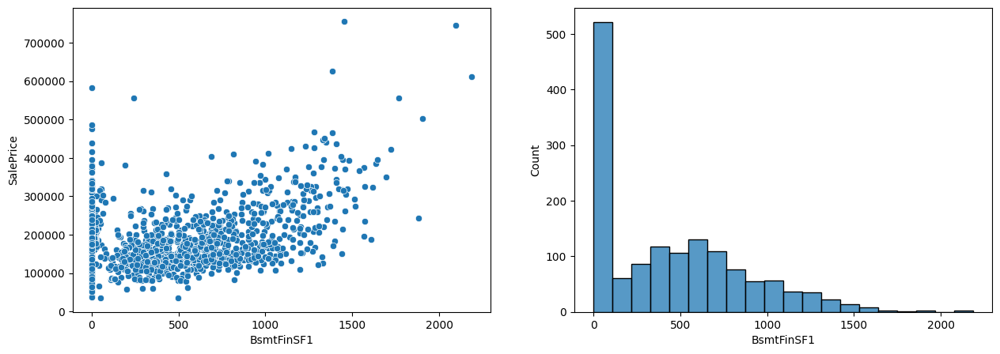

    hist_x  hist_y
0      0.0     521
1    109.4      61
2    218.8      86
3    328.2     117
4    437.6     106
5    547.0     131
6    656.4     109
7    765.8      77
8    875.2      55
9    984.6      56
10  1094.0      37
11  1203.4      35
12  1312.8      23
13  1422.2      14
14  1531.6       8
15  1641.0       3
16  1750.4       1
17  1859.8       2
18  1969.2       0
19  2078.6       2


BsmtFinSF2


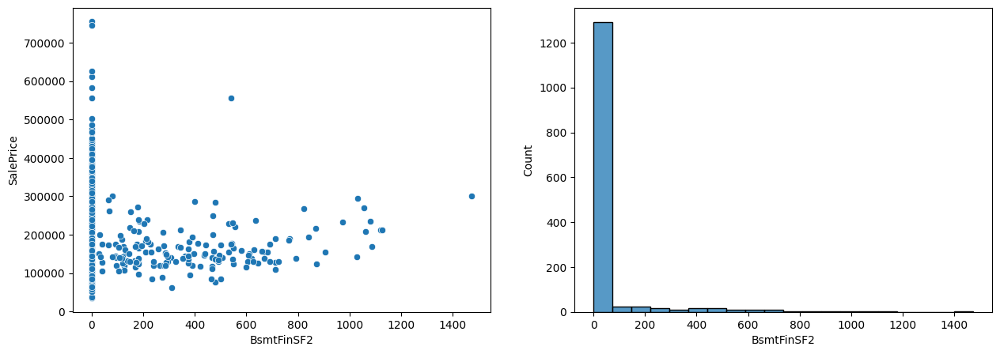

    hist_x  hist_y
0      0.0    1291
1     73.7      22
2    147.4      25
3    221.1      17
4    294.8       9
5    368.5      15
6    442.2      17
7    515.9      11
8    589.6      10
9    663.3       9
10   737.0       3
11   810.7       4
12   884.4       1
13   958.1       3
14  1031.8       4
15  1105.5       2
16  1179.2       0
17  1252.9       0
18  1326.6       0
19  1400.3       1


BsmtUnfSF


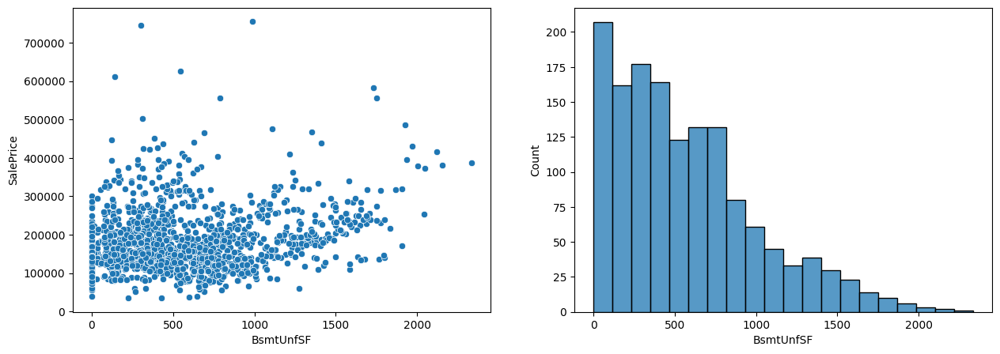

    hist_x  hist_y
0      0.0     207
1    116.8     162
2    233.6     177
3    350.4     164
4    467.2     123
5    584.0     132
6    700.8     132
7    817.6      80
8    934.4      61
9   1051.2      45
10  1168.0      33
11  1284.8      39
12  1401.6      30
13  1518.4      23
14  1635.2      14
15  1752.0      10
16  1868.8       6
17  1985.6       3
18  2102.4       2
19  2219.2       1


TotalBsmtSF


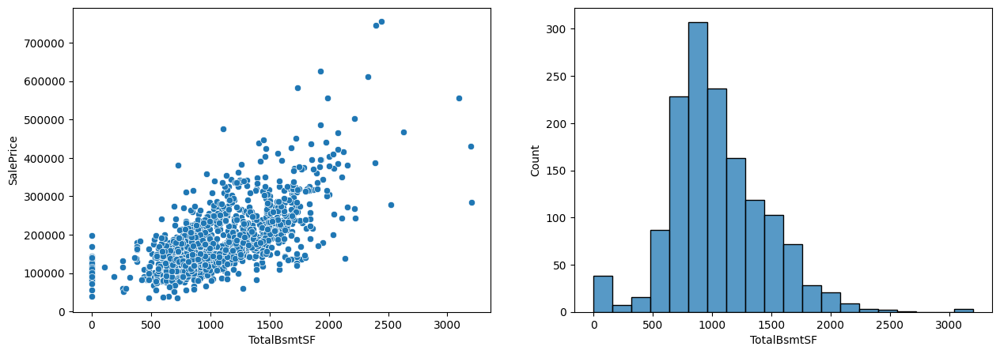

    hist_x  hist_y
0      0.0      38
1    160.3       7
2    320.6      16
3    480.9      87
4    641.2     228
5    801.5     307
6    961.8     237
7   1122.1     163
8   1282.4     119
9   1442.7     103
10  1603.0      72
11  1763.3      28
12  1923.6      21
13  2083.9       9
14  2244.2       3
15  2404.5       2
16  2564.8       1
17  2725.1       0
18  2885.4       0
19  3045.7       3


1stFlrSF


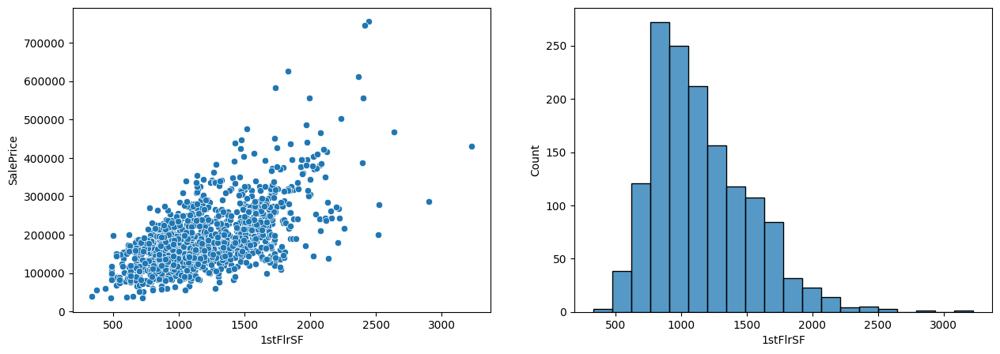

    hist_x  hist_y
0    334.0       3
1    478.7      38
2    623.4     121
3    768.1     272
4    912.8     250
5   1057.5     212
6   1202.2     156
7   1346.9     118
8   1491.6     107
9   1636.3      84
10  1781.0      32
11  1925.7      23
12  2070.4      14
13  2215.1       4
14  2359.8       5
15  2504.5       3
16  2649.2       0
17  2793.9       1
18  2938.6       0
19  3083.3       1


2ndFlrSF


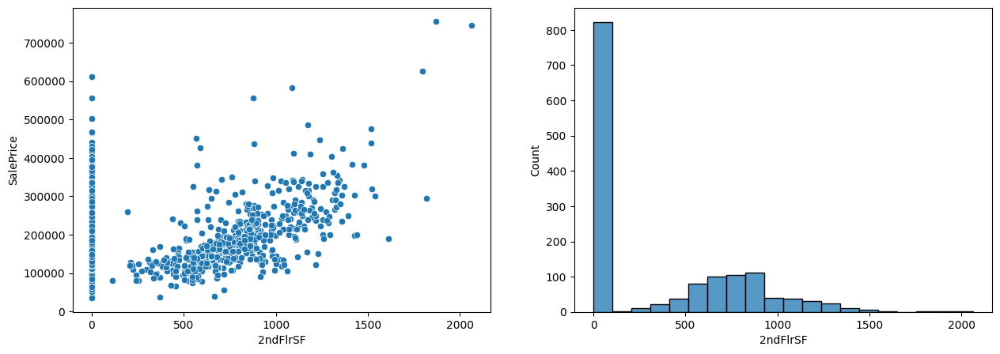

     hist_x  hist_y
0      0.00     822
1    103.25       2
2    206.50      11
3    309.75      21
4    413.00      38
5    516.25      80
6    619.50     101
7    722.75     105
8    826.00     112
9    929.25      40
10  1032.50      38
11  1135.75      30
12  1239.00      23
13  1342.25      11
14  1445.50       5
15  1548.75       1
16  1652.00       0
17  1755.25       2
18  1858.50       1
19  1961.75       1


LowQualFinSF


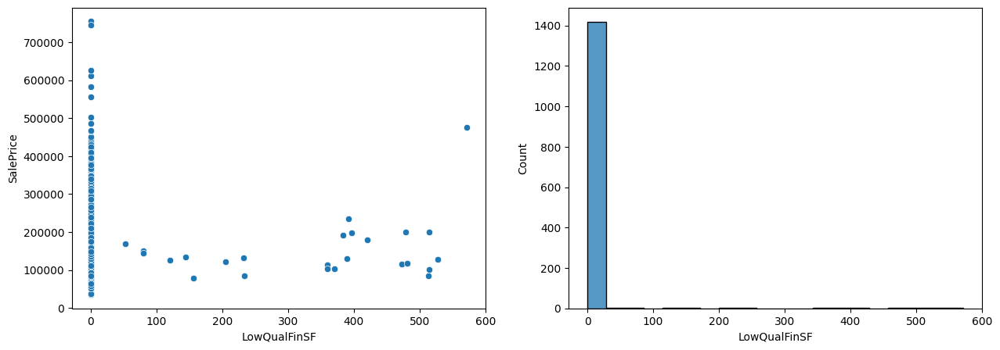

    hist_x  hist_y
0      0.0    1418
1     28.6       1
2     57.2       3
3     85.8       0
4    114.4       1
5    143.0       2
6    171.6       0
7    200.2       1
8    228.8       2
9    257.4       0
10   286.0       0
11   314.6       0
12   343.2       3
13   371.8       4
14   400.4       1
15   429.0       0
16   457.6       3
17   486.2       2
18   514.8       2
19   543.4       1


GrLivArea


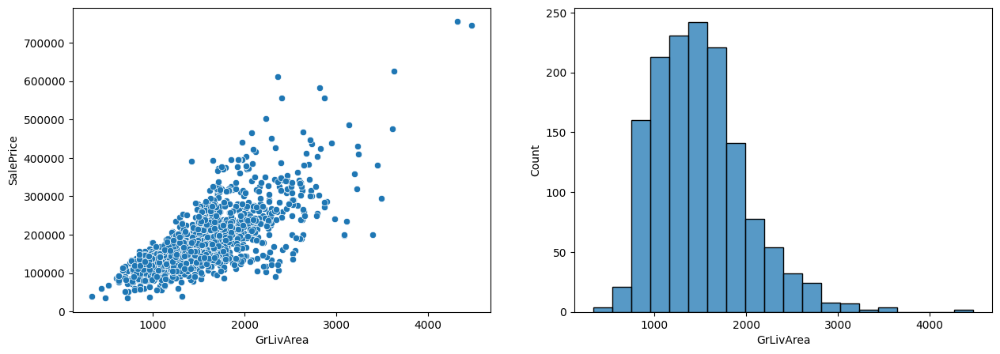

    hist_x  hist_y
0    334.0       4
1    541.1      21
2    748.2     160
3    955.3     213
4   1162.4     231
5   1369.5     242
6   1576.6     221
7   1783.7     141
8   1990.8      78
9   2197.9      54
10  2405.0      32
11  2612.1      24
12  2819.2       8
13  3026.3       7
14  3233.4       2
15  3440.5       4
16  3647.6       0
17  3854.7       0
18  4061.8       0
19  4268.9       2


TotRmsAbvGrd


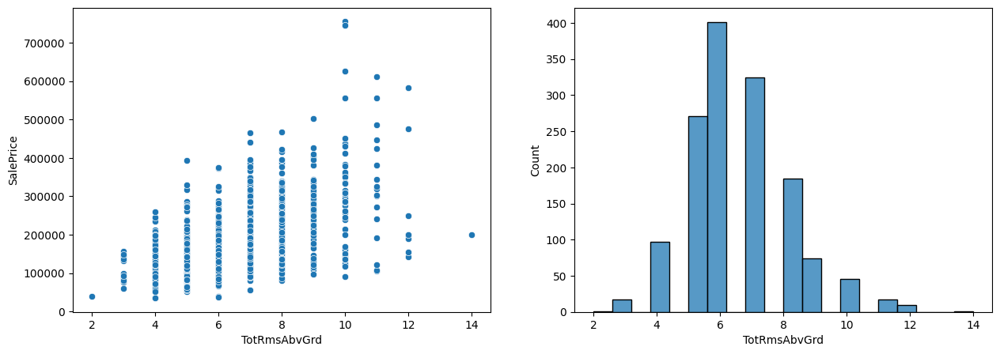

    hist_x  hist_y
0      2.0       1
1      2.6      17
2      3.2       0
3      3.8      97
4      4.4       0
5      5.0     271
6      5.6     401
7      6.2       0
8      6.8     325
9      7.4       0
10     8.0     185
11     8.6      74
12     9.2       0
13     9.8      46
14    10.4       0
15    11.0      17
16    11.6       9
17    12.2       0
18    12.8       0
19    13.4       1


GarageCars


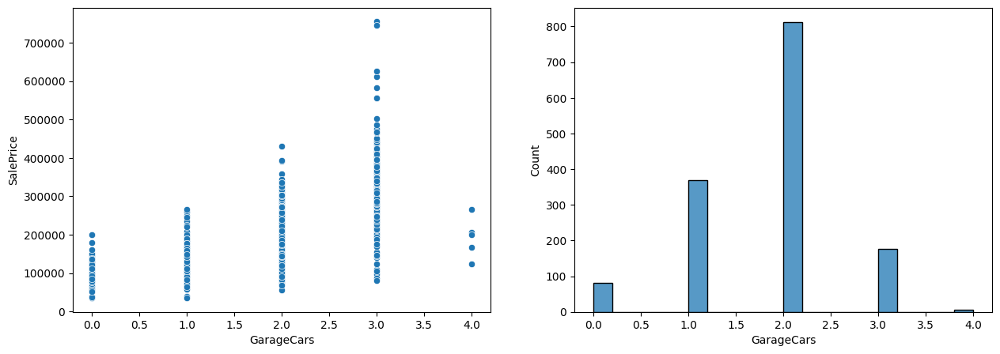

    hist_x  hist_y
0      0.0      81
1      0.2       0
2      0.4       0
3      0.6       0
4      0.8       0
5      1.0     369
6      1.2       0
7      1.4       0
8      1.6       0
9      1.8       0
10     2.0     812
11     2.2       0
12     2.4       0
13     2.6       0
14     2.8       0
15     3.0     177
16     3.2       0
17     3.4       0
18     3.6       0
19     3.8       5


GarageArea


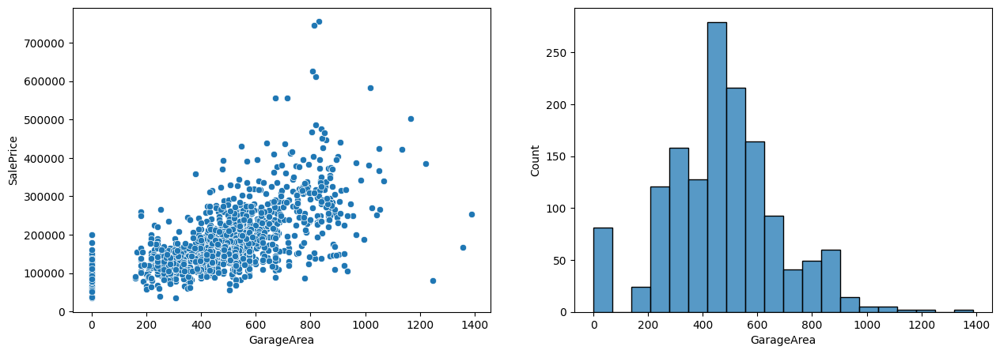

    hist_x  hist_y
0      0.0      81
1     69.5       0
2    139.0      24
3    208.5     121
4    278.0     158
5    347.5     128
6    417.0     279
7    486.5     216
8    556.0     164
9    625.5      93
10   695.0      41
11   764.5      49
12   834.0      60
13   903.5      14
14   973.0       5
15  1042.5       5
16  1112.0       2
17  1181.5       2
18  1251.0       0
19  1320.5       2


WoodDeckSF


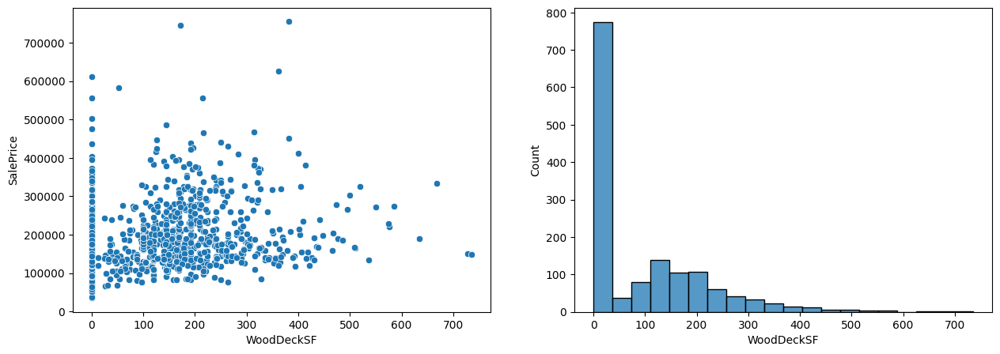

    hist_x  hist_y
0      0.0     774
1     36.8      37
2     73.6      79
3    110.4     138
4    147.2     104
5    184.0     108
6    220.8      60
7    257.6      41
8    294.4      34
9    331.2      23
10   368.0      14
11   404.8      12
12   441.6       5
13   478.4       5
14   515.2       3
15   552.0       3
16   588.8       0
17   625.6       1
18   662.4       1
19   699.2       2


OpenPorchSF


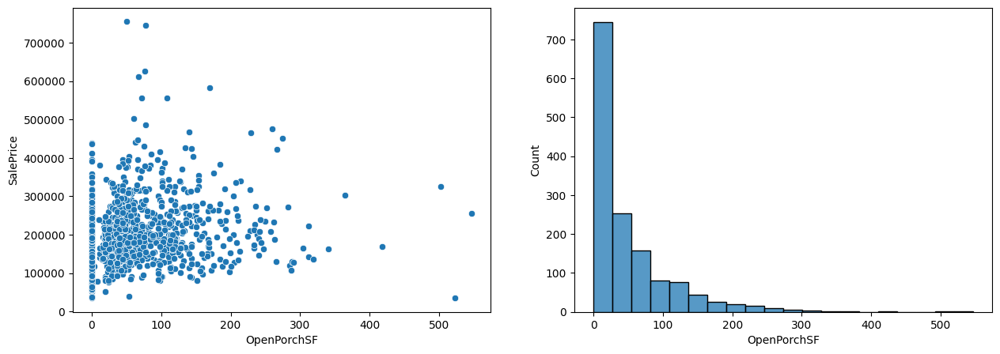

    hist_x  hist_y
0     0.00     744
1    27.35     254
2    54.70     158
3    82.05      81
4   109.40      77
5   136.75      45
6   164.10      26
7   191.45      19
8   218.80      15
9   246.15       9
10  273.50       6
11  300.85       4
12  328.20       1
13  355.55       1
14  382.90       0
15  410.25       1
16  437.60       0
17  464.95       0
18  492.30       1
19  519.65       2


EnclosedPorch


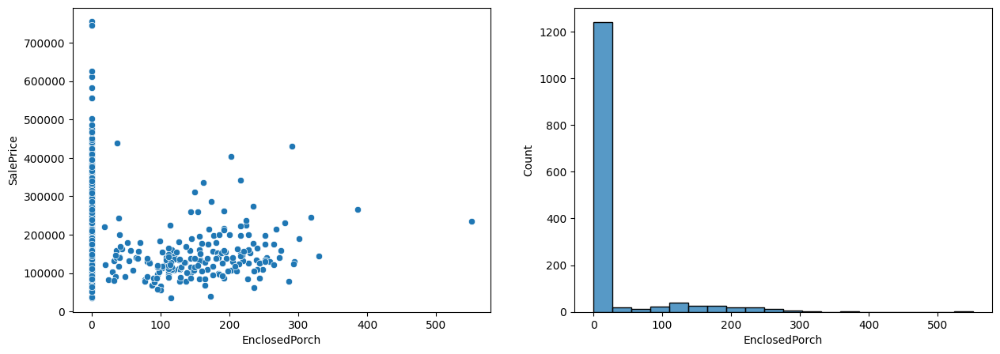

    hist_x  hist_y
0      0.0    1240
1     27.6      18
2     55.2      11
3     82.8      22
4    110.4      41
5    138.0      27
6    165.6      26
7    193.2      19
8    220.8      19
9    248.4      11
10   276.0       6
11   303.6       2
12   331.2       0
13   358.8       1
14   386.4       0
15   414.0       0
16   441.6       0
17   469.2       0
18   496.8       0
19   524.4       1


3SsnPorch


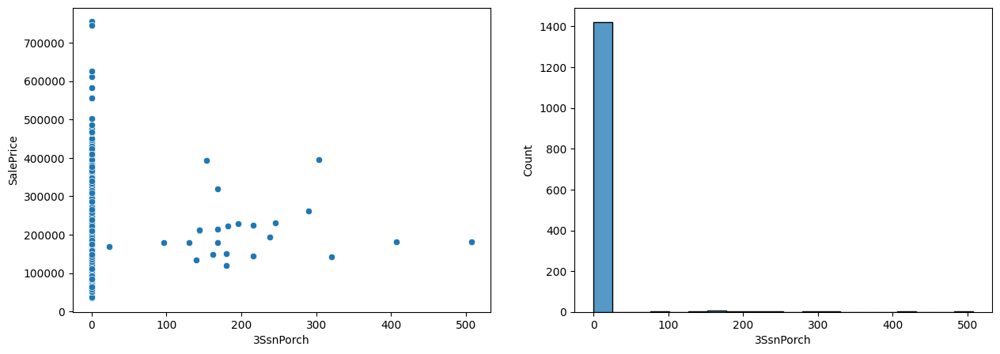

    hist_x  hist_y
0      0.0    1421
1     25.4       0
2     50.8       0
3     76.2       1
4    101.6       0
5    127.0       4
6    152.4       5
7    177.8       4
8    203.2       2
9    228.6       2
10   254.0       0
11   279.4       2
12   304.8       1
13   330.2       0
14   355.6       0
15   381.0       0
16   406.4       1
17   431.8       0
18   457.2       0
19   482.6       1


ScreenPorch


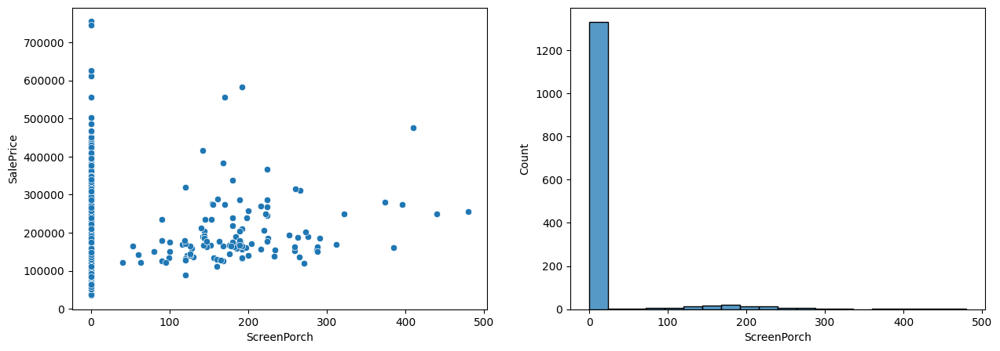

    hist_x  hist_y
0      0.0    1330
1     24.0       1
2     48.0       3
3     72.0       5
4     96.0       5
5    120.0      15
6    144.0      18
7    168.0      21
8    192.0      12
9    216.0      12
10   240.0       5
11   264.0       6
12   288.0       3
13   312.0       2
14   336.0       0
15   360.0       1
16   384.0       2
17   408.0       1
18   432.0       1
19   456.0       1


PoolArea


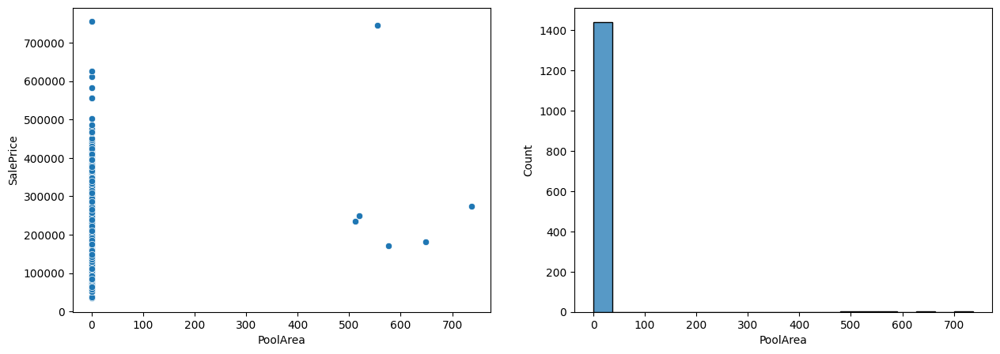

    hist_x  hist_y
0      0.0    1438
1     36.9       0
2     73.8       0
3    110.7       0
4    147.6       0
5    184.5       0
6    221.4       0
7    258.3       0
8    295.2       0
9    332.1       0
10   369.0       0
11   405.9       0
12   442.8       0
13   479.7       1
14   516.6       1
15   553.5       2
16   590.4       0
17   627.3       1
18   664.2       0
19   701.1       1


MiscVal


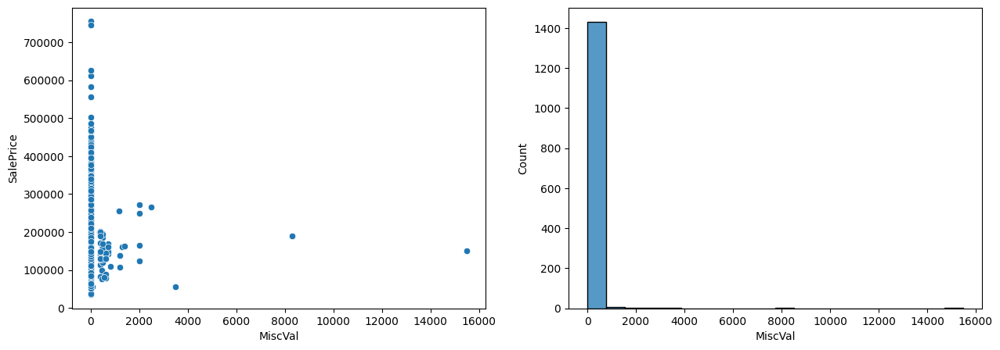

     hist_x  hist_y
0       0.0    1430
1     775.0       6
2    1550.0       4
3    2325.0       1
4    3100.0       1
5    3875.0       0
6    4650.0       0
7    5425.0       0
8    6200.0       0
9    6975.0       0
10   7750.0       1
11   8525.0       0
12   9300.0       0
13  10075.0       0
14  10850.0       0
15  11625.0       0
16  12400.0       0
17  13175.0       0
18  13950.0       0
19  14725.0       1




In [17]:
for col in num_cols:
    print(col)
    
    fig, (ax_l,ax_r) = plt.subplots(1, 2, figsize=(15,5))
    sns.scatterplot(data=dataset_df, x=col, y=target_col, ax=ax_l)
    sns.histplot(data=dataset_df, x=col, ax=ax_r, bins=20)
    
    plt.show()

    bar_list = ax_r.patches
    hist_x_y = [ (bar.get_x(), bar.get_height()) for bar in bar_list ]
    hist_df = pd.DataFrame(hist_x_y, columns=['hist_x', 'hist_y'])
    print(hist_df)
    
    print()
    print()

<Axes: >

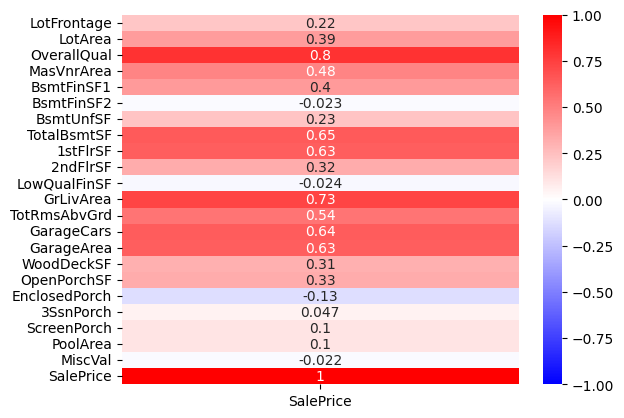

In [18]:
num_corr_wth_target_df = dataset_df[ num_cols + [target_col] ].corr()[[target_col]]
sns.heatmap(num_corr_wth_target_df, annot=True, center=0, vmin=-1, vmax=1, cmap='bwr')

### Numerical Column Feature Engineering

##### BsmtFinSF2 Column

Dropping the column, since majority of the value is 0 (histogram), there is no useful pattern (scatterplot), and the correlation is near to zero

In [19]:
dataset_df = dataset_df.drop(columns=["BsmtFinSF2"])

##### LowQualFinSF Column

Dropping the column, since majority of the value is 0 (histogram), there is no useful pattern (scatterplot), and the correlation is near to zero

In [20]:
dataset_df = dataset_df.drop(columns=["LowQualFinSF"])

##### EnclosedPorch Column

Dropping the column, since majority of the value is 0 (histogram), there is no useful pattern (scatterplot), and the correlation is near to zero

In [21]:
dataset_df = dataset_df.drop(columns=["EnclosedPorch"])

##### 3SsnPorch Column

Dropping the column, since majority of the value is 0 (histogram), there is no useful pattern (scatterplot), and the correlation is near to zero

In [22]:
dataset_df = dataset_df.drop(columns=["3SsnPorch"])

##### ScreenPorch Column

Dropping the column, since majority of the value is 0 (histogram), there is no useful pattern (scatterplot), and the correlation is near to zero

In [23]:
dataset_df = dataset_df.drop(columns=["ScreenPorch"])

##### PoolArea Column

Dropping the column, since majority of the value is 0 (histogram), there is no useful pattern (scatterplot), and the correlation is near to zero

In [24]:
dataset_df = dataset_df.drop(columns=["PoolArea"])

##### MiscVal Column

Dropping the column, since majority of the value is 0 (histogram), there is no useful pattern (scatterplot), and the correlation is near to zero

In [25]:
dataset_df = dataset_df.drop(columns=["MiscVal"])

##### Updating the Numerical Columns

In [26]:
num_cols = [ col for col in num_cols if col in dataset_df.columns ]

## EDA on Categorical Columns

In [27]:
def cat_eda(col):
    unq_val_cnt = dataset_df.groupby(col).agg({'Id': 'count'}).reset_index()
    unq_val_cnt['rank'] = unq_val_cnt['Id'].rank()
    unq_val_cnt = unq_val_cnt.sort_values('rank', ascending=False)
    print(unq_val_cnt)

    plt.figure(figsize=(15,5))
    plt.bar(unq_val_cnt[col].astype(str), unq_val_cnt.Id)
    plt.show()

    plt.figure(figsize=(15,5))
    sns.boxplot(data=dataset_df, x=col, y=target_col, order=unq_val_cnt[col])
    plt.show()

Column Name: MSSubClass
    MSSubClass   Id  rank
0           20  529  15.0
5           60  294  14.0
4           50  142  13.0
11         120   87  12.0
1           30   69  11.0
12         160   63  10.0
6           70   60   9.0
8           80   57   8.0
10          90   52   7.0
14         190   29   6.0
9           85   20   5.0
7           75   16   4.0
3           45   12   3.0
13         180   10   2.0
2           40    4   1.0


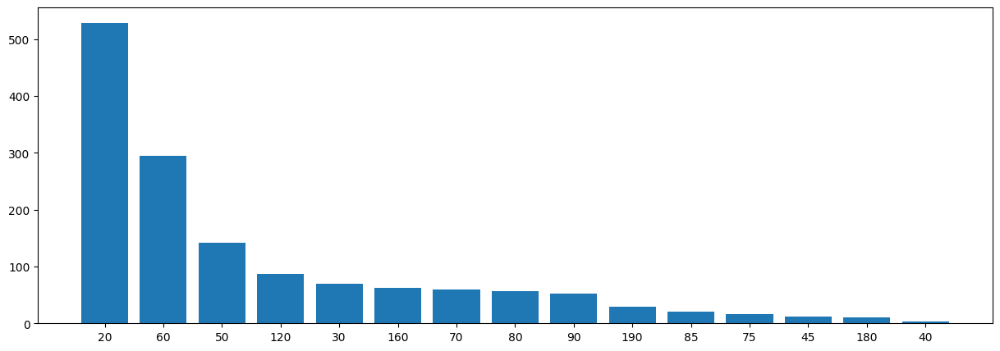

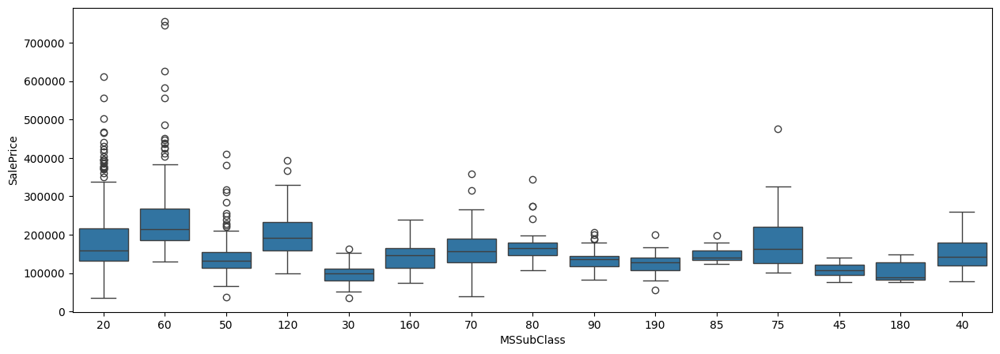


Column Name: MSZoning
  MSZoning    Id  rank
3       RL  1135   5.0
4       RM   218   4.0
1       FV    65   3.0
2       RH    16   2.0
0  C (all)    10   1.0


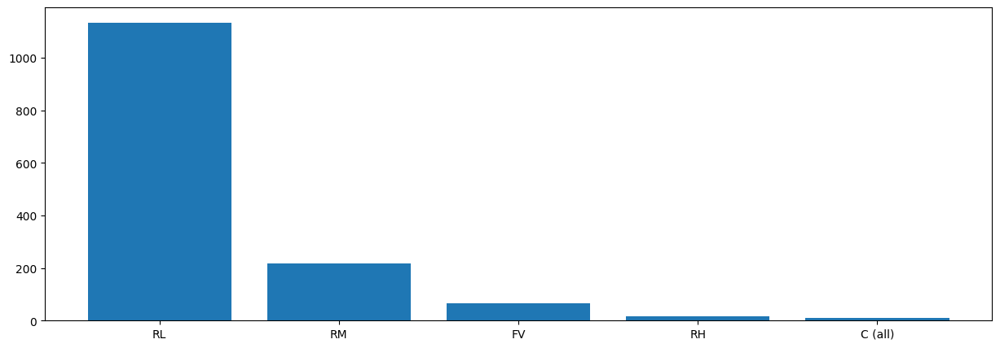

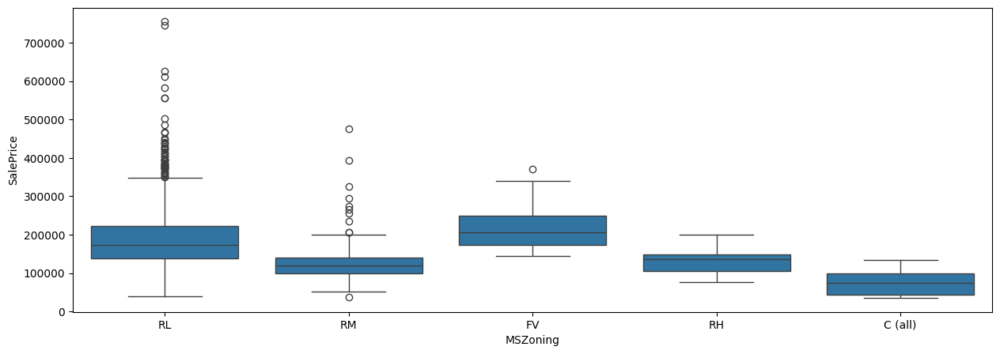


Column Name: Street
  Street    Id  rank
1   Pave  1439   2.0
0   Grvl     5   1.0


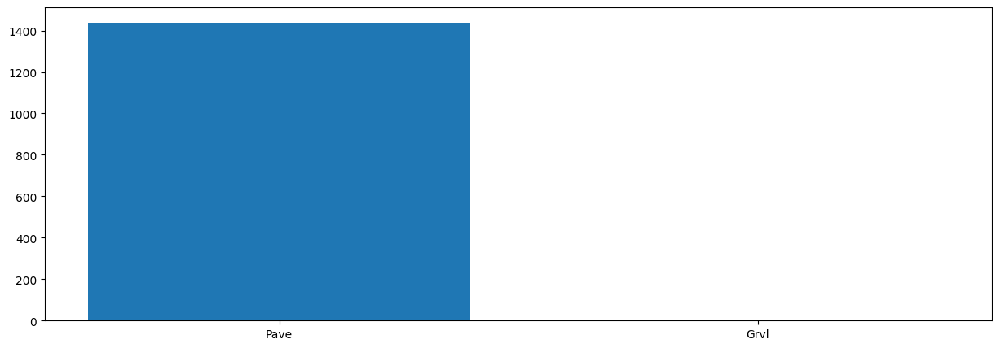

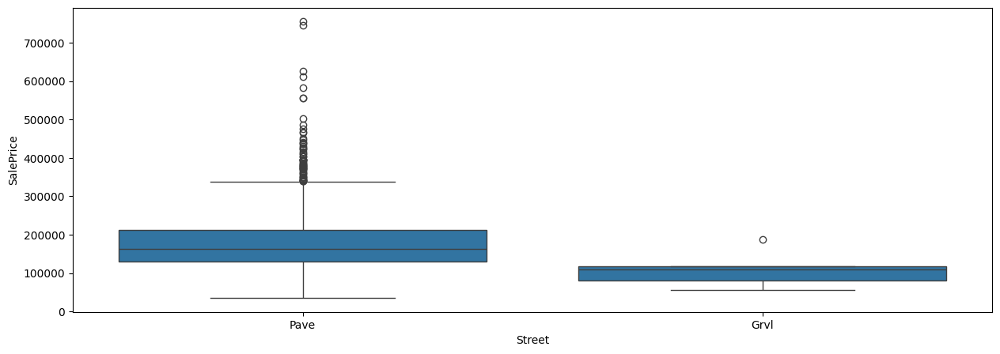


Column Name: Alley
  Alley    Id  rank
1   Non  1353   3.0
0  Grvl    50   2.0
2  Pave    41   1.0


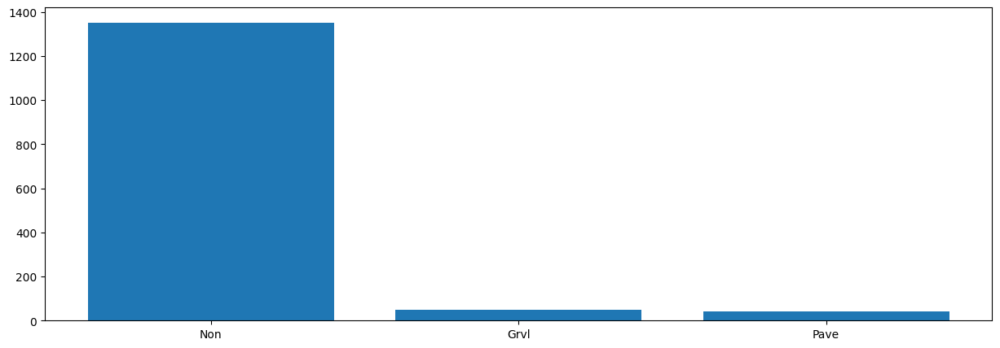

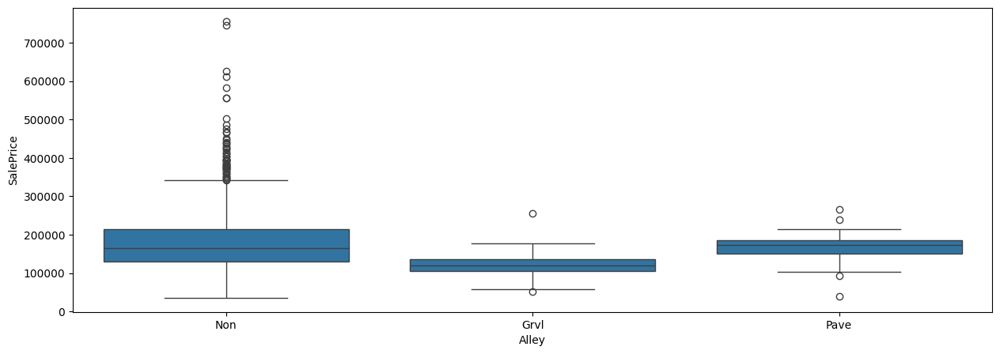


Column Name: LotShape
  LotShape   Id  rank
3      Reg  924   4.0
0      IR1  477   3.0
1      IR2   35   2.0
2      IR3    8   1.0


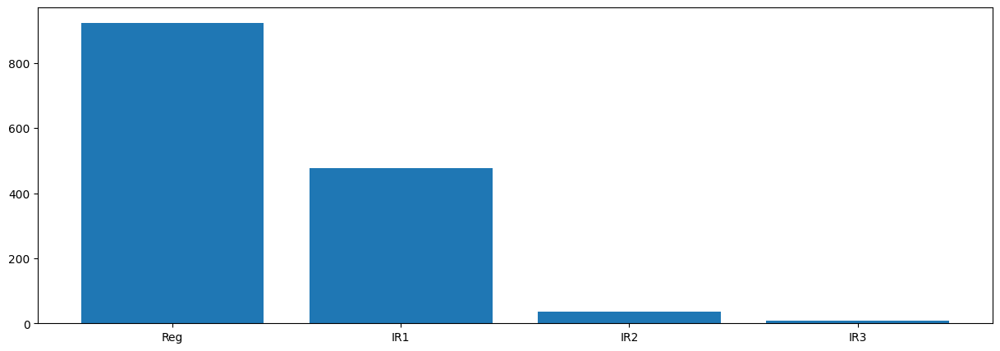

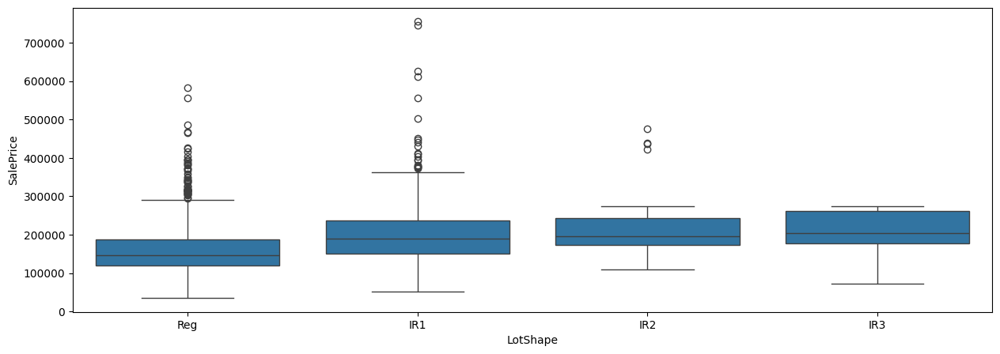


Column Name: LandContour
  LandContour    Id  rank
3         Lvl  1309   4.0
0         Bnk    59   3.0
1         HLS    48   2.0
2         Low    28   1.0


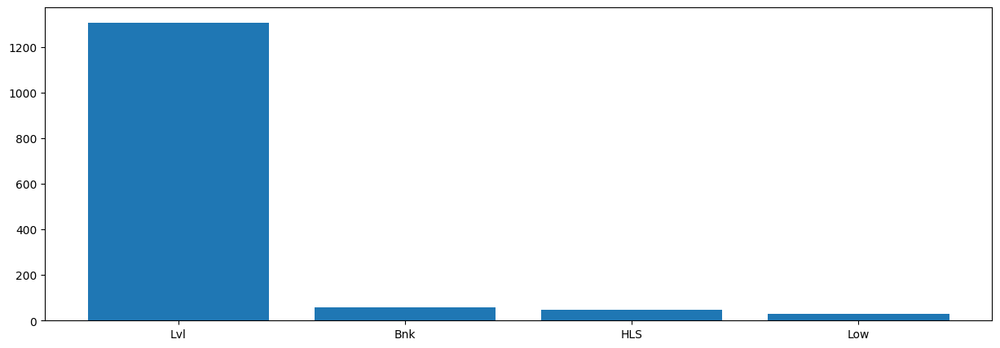

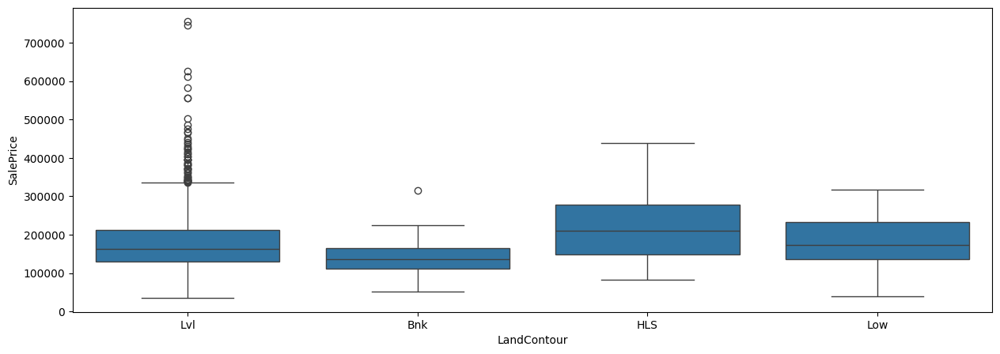


Column Name: Utilities
  Utilities    Id  rank
0    AllPub  1443   2.0
1    NoSeWa     1   1.0


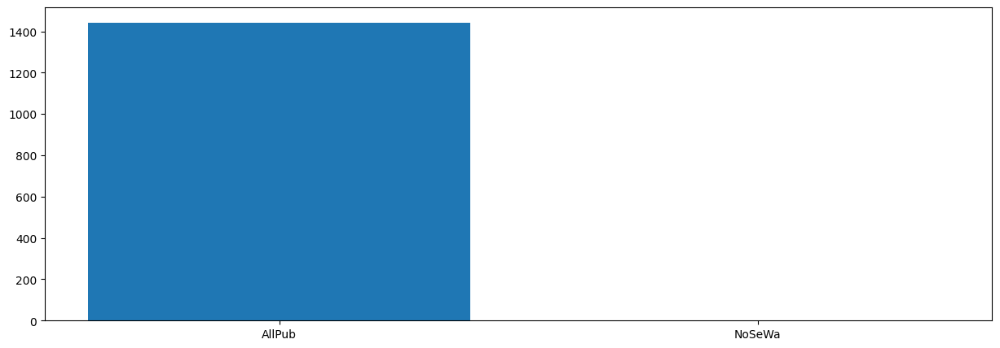

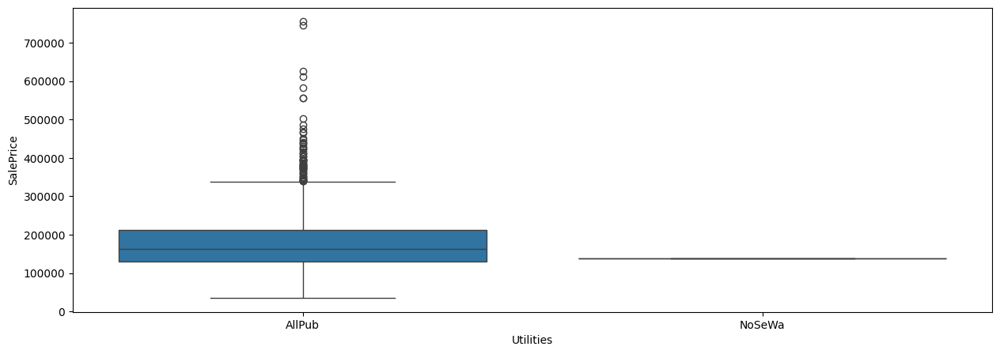


Column Name: LotConfig
  LotConfig    Id  rank
4    Inside  1045   5.0
0    Corner   260   4.0
1   CulDSac    88   3.0
2       FR2    47   2.0
3       FR3     4   1.0


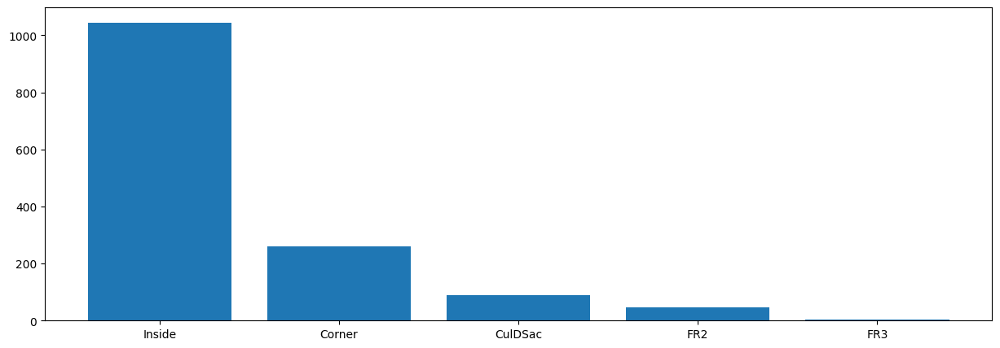

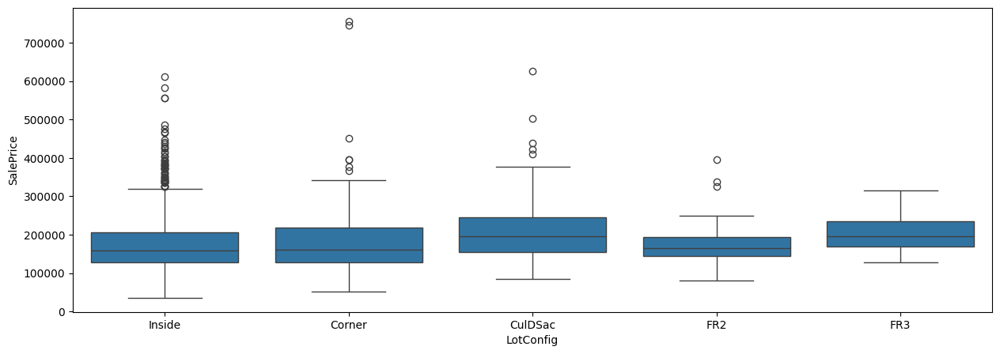


Column Name: LandSlope
  LandSlope    Id  rank
0       Gtl  1376   3.0
1       Mod    61   2.0
2       Sev     7   1.0


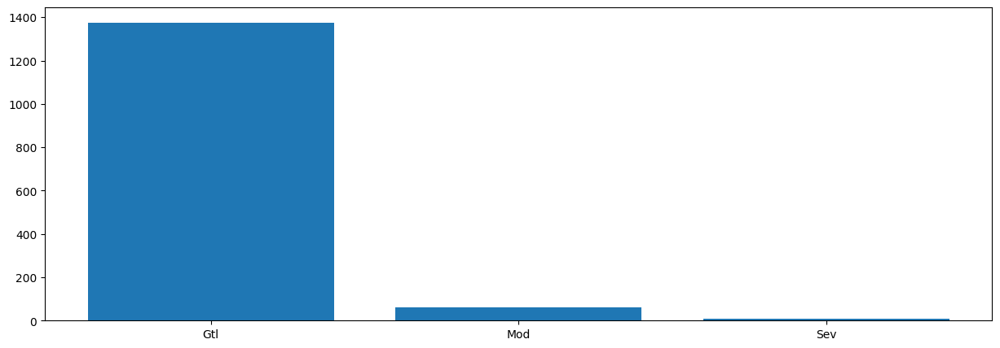

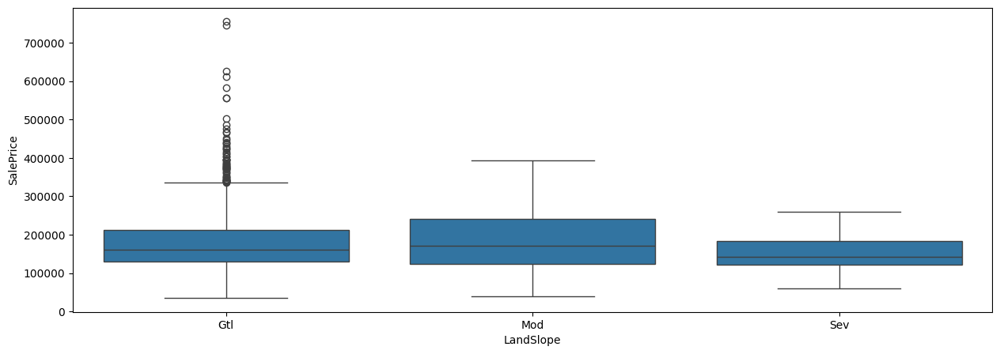


Column Name: Neighborhood
   Neighborhood   Id  rank
12        NAmes  225  25.0
5       CollgCr  150  24.0
17      OldTown  113  23.0
7       Edwards   98  22.0
21      Somerst   86  21.0
8       Gilbert   79  20.0
16      NridgHt   77  19.0
19       Sawyer   74  18.0
14       NWAmes   73  17.0
20      SawyerW   59  16.0
3       BrkSide   58  15.0
6       Crawfor   51  14.0
11      Mitchel   49  13.0
15      NoRidge   40  12.0
9        IDOTRR   37  11.0
23       Timber   34  10.0
18        SWISU   25   9.0
22      StoneBr   24   8.0
4       ClearCr   21   7.0
0       Blmngtn   17   5.5
10      MeadowV   17   5.5
2        BrDale   16   4.0
24      Veenker   10   3.0
13      NPkVill    9   2.0
1       Blueste    2   1.0


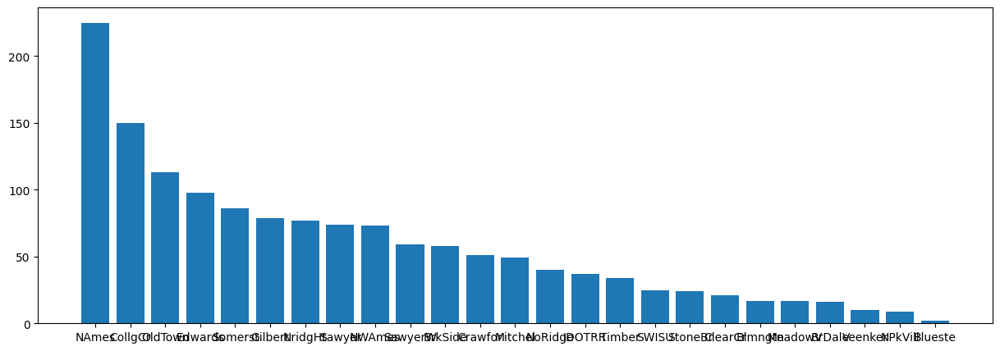

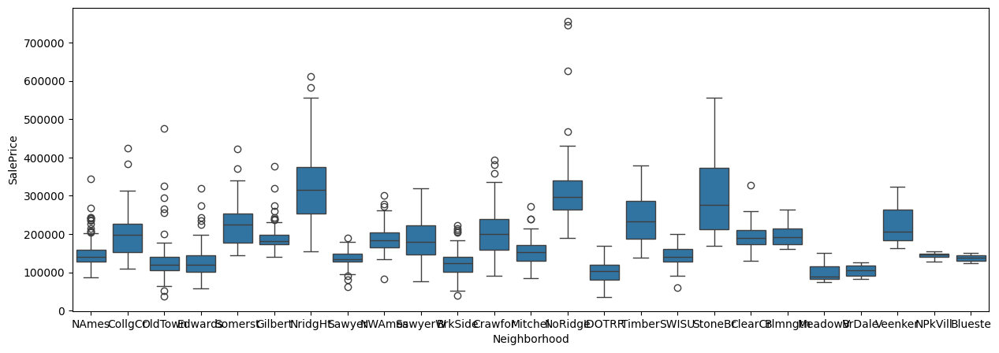


Column Name: Condition1
  Condition1    Id  rank
2       Norm  1247   9.0
1      Feedr    79   8.0
0     Artery    48   7.0
6       RRAn    26   6.0
4       PosN    18   5.0
5       RRAe    11   4.0
3       PosA     8   3.0
8       RRNn     5   2.0
7       RRNe     2   1.0


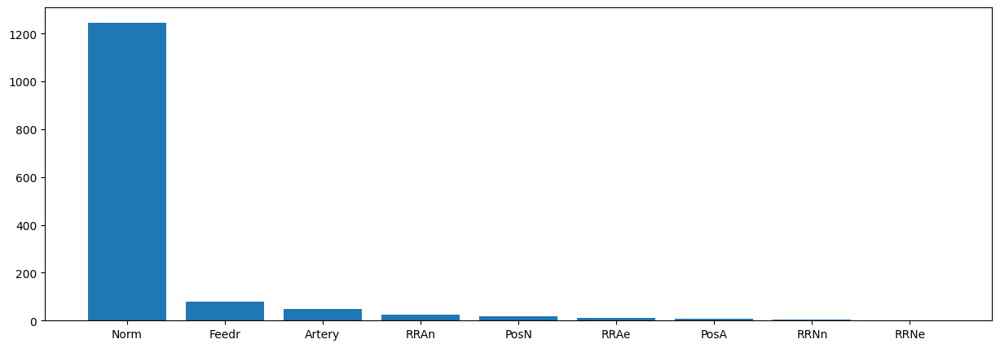

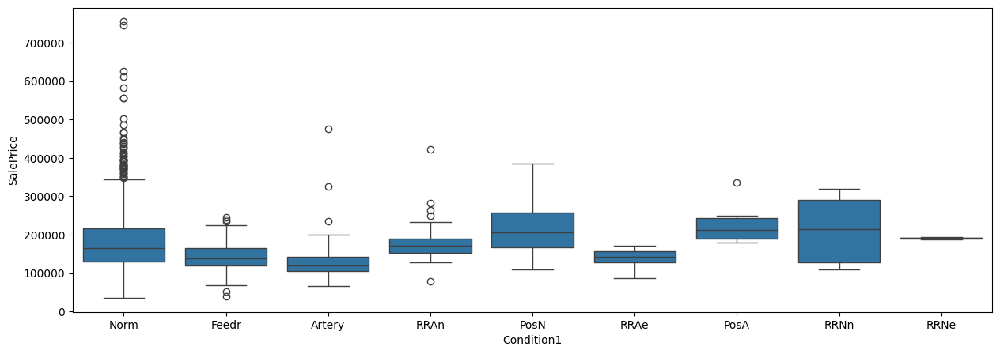


Column Name: Condition2
  Condition2    Id  rank
2       Norm  1430   8.0
1      Feedr     6   7.0
0     Artery     2   5.5
7       RRNn     2   5.5
3       PosA     1   2.5
4       PosN     1   2.5
5       RRAe     1   2.5
6       RRAn     1   2.5


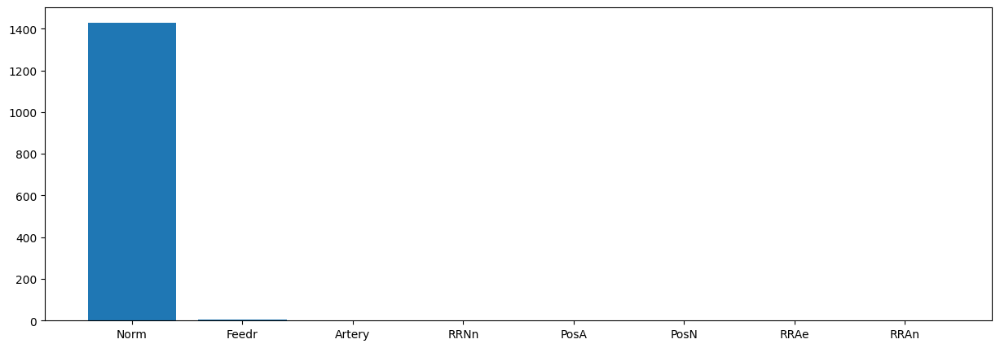

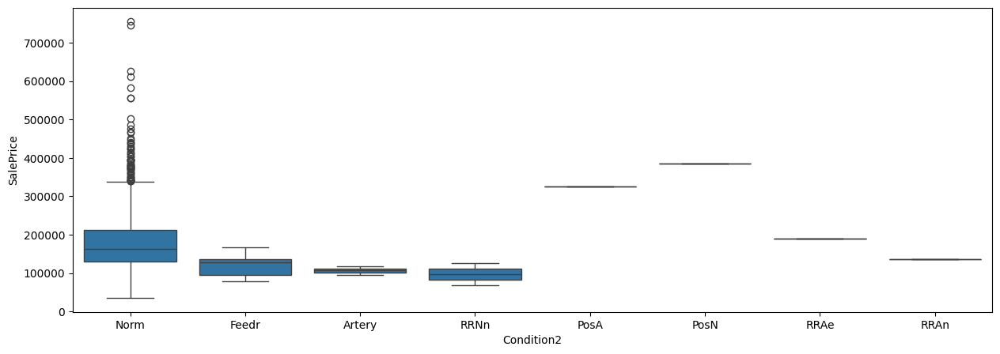


Column Name: BldgType
  BldgType    Id  rank
0     1Fam  1205   5.0
4   TwnhsE   114   4.0
2   Duplex    52   3.0
3    Twnhs    43   2.0
1   2fmCon    30   1.0


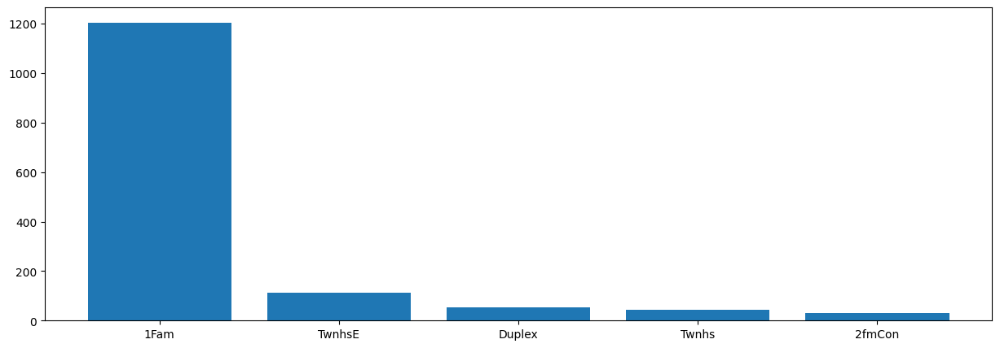

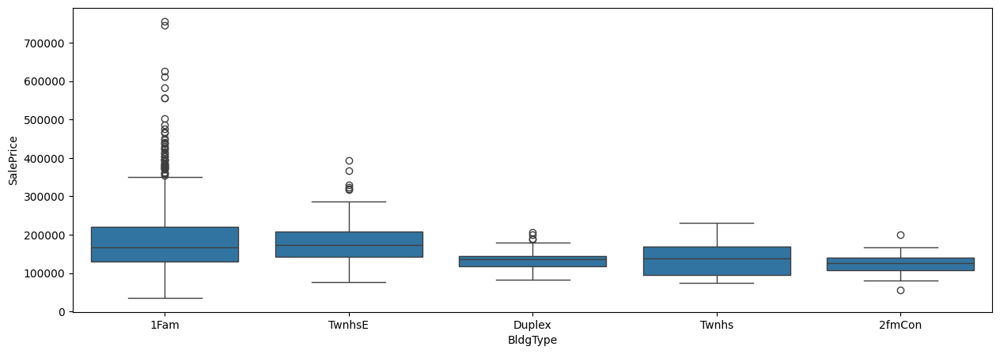


Column Name: HouseStyle
  HouseStyle   Id  rank
2     1Story  719   8.0
5     2Story  440   7.0
0     1.5Fin  151   6.0
7       SLvl   64   5.0
6     SFoyer   37   4.0
1     1.5Unf   14   3.0
4     2.5Unf   11   2.0
3     2.5Fin    8   1.0


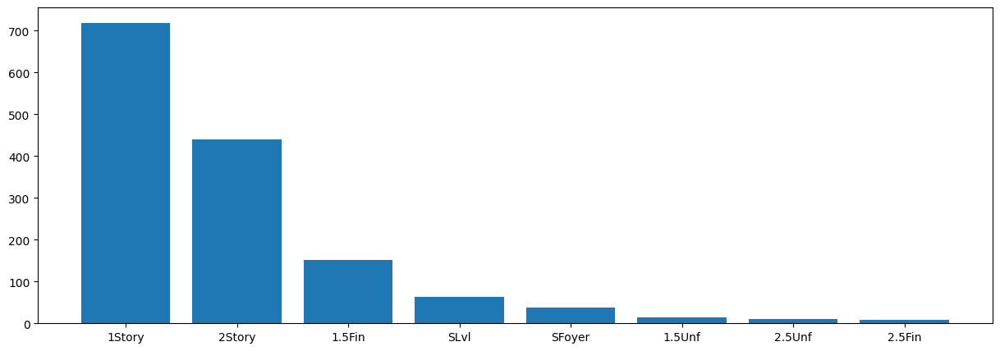

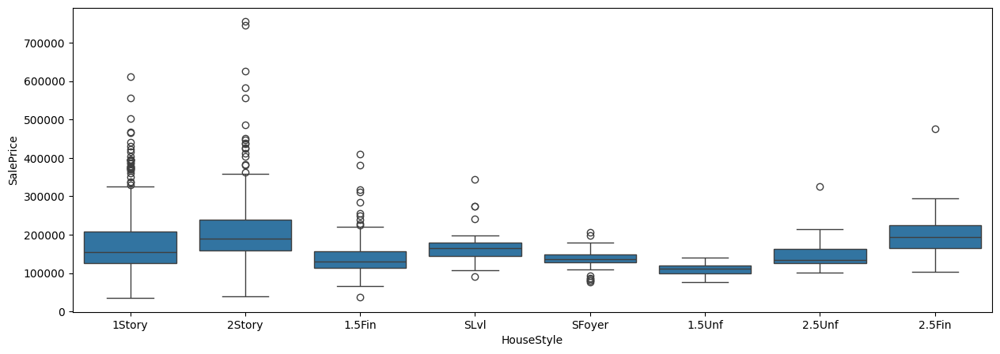


Column Name: RoofStyle
  RoofStyle    Id  rank
1     Gable  1132   6.0
3       Hip   281   5.0
0      Flat    11   3.5
2   Gambrel    11   3.5
4   Mansard     7   2.0
5      Shed     2   1.0


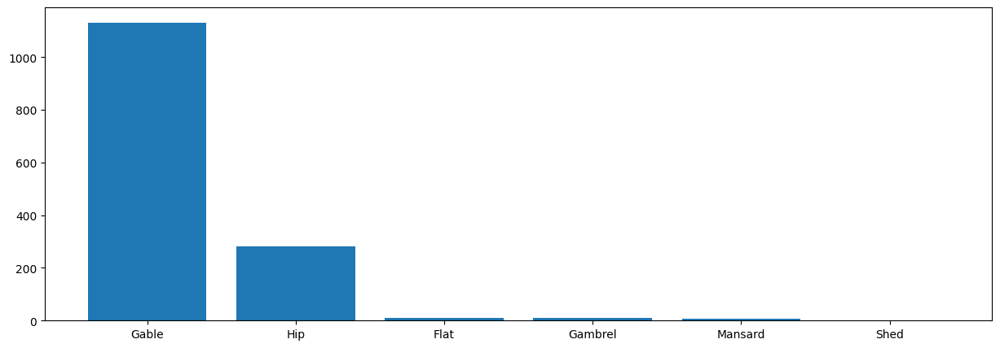

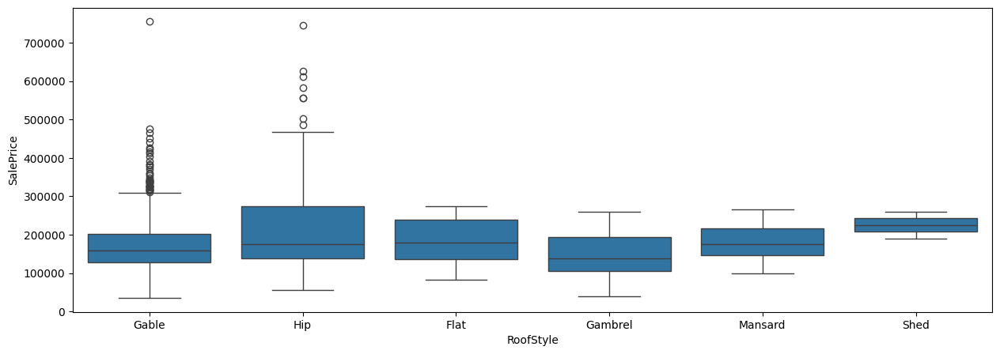


Column Name: RoofMatl
  RoofMatl    Id  rank
0  CompShg  1423   6.0
3  Tar&Grv    10   5.0
4  WdShake     5   4.0
5  WdShngl     4   3.0
1    Metal     1   1.5
2     Roll     1   1.5


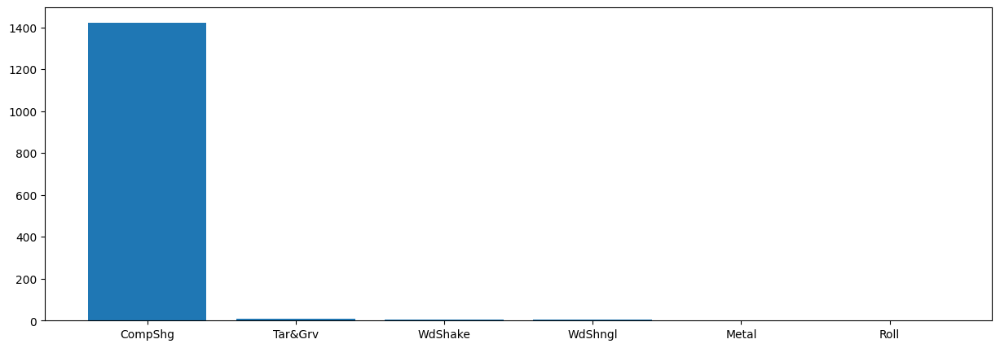

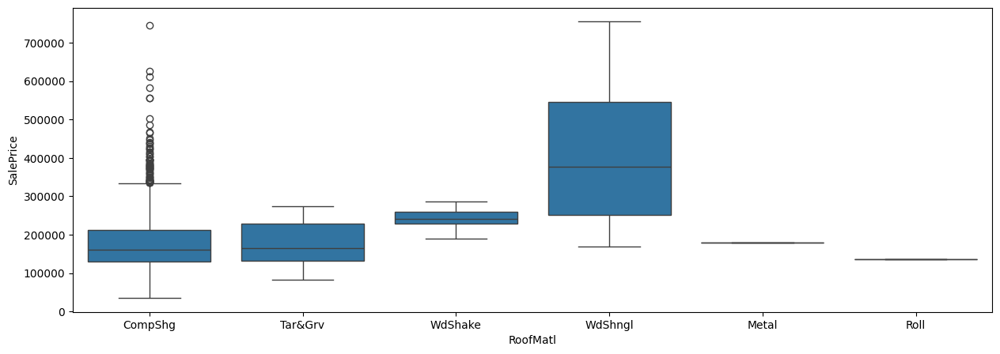


Column Name: Exterior1st
   Exterior1st   Id  rank
12     VinylSd  513  15.0
6      HdBoard  221  14.0
8      MetalSd  220  13.0
13     Wd Sdng  203  12.0
9      Plywood  103  11.0
5      CemntBd   59  10.0
3      BrkFace   49   9.0
14     WdShing   25   8.0
11      Stucco   24   7.0
0      AsbShng   20   6.0
2      BrkComm    2   4.5
10       Stone    2   4.5
1      AsphShn    1   2.0
4       CBlock    1   2.0
7      ImStucc    1   2.0


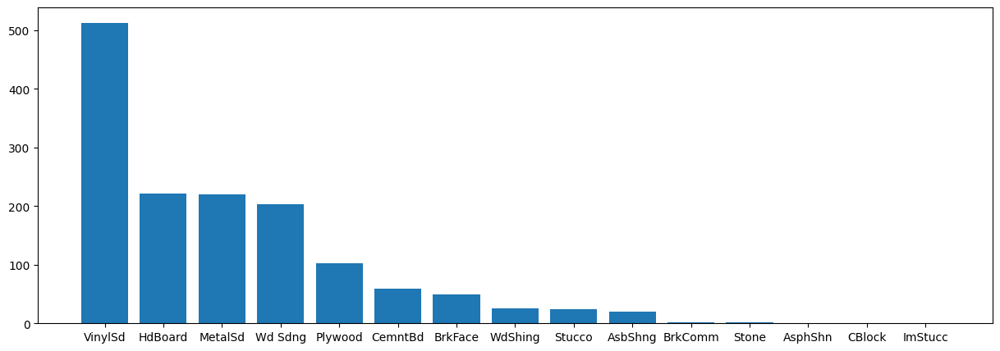

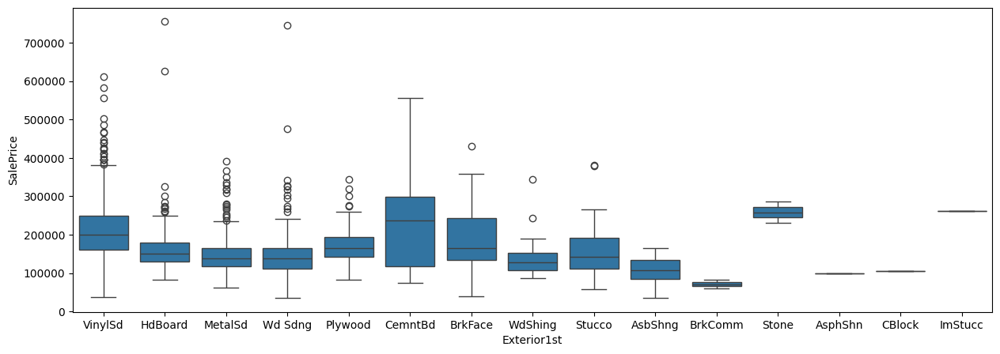


Column Name: Exterior2nd
   Exterior2nd   Id  rank
13     VinylSd  502  16.0
8      MetalSd  214  15.0
6      HdBoard  205  14.0
14     Wd Sdng  195  13.0
10     Plywood  137  12.0
5      CmentBd   59  11.0
15     Wd Shng   36  10.0
12      Stucco   25   9.0
3      BrkFace   24   8.0
0      AsbShng   20   7.0
7      ImStucc   10   6.0
2      Brk Cmn    7   5.0
11       Stone    5   4.0
1      AsphShn    3   3.0
4       CBlock    1   1.5
9        Other    1   1.5


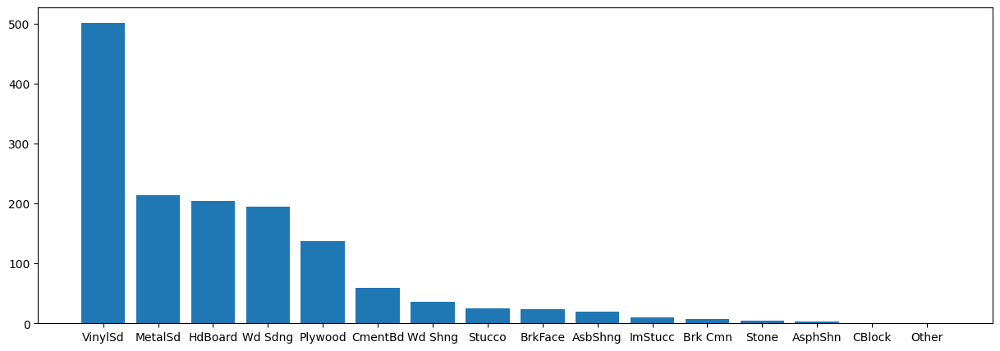

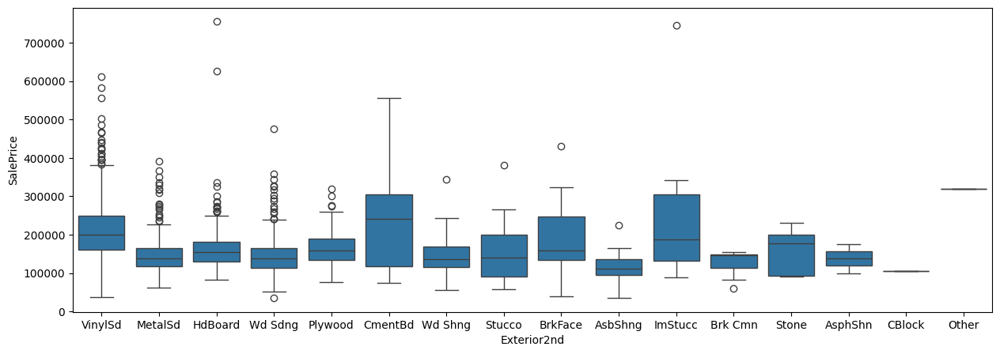


Column Name: MasVnrType
  MasVnrType   Id  rank
2        Non  862   4.0
1    BrkFace  443   3.0
3      Stone  125   2.0
0     BrkCmn   14   1.0


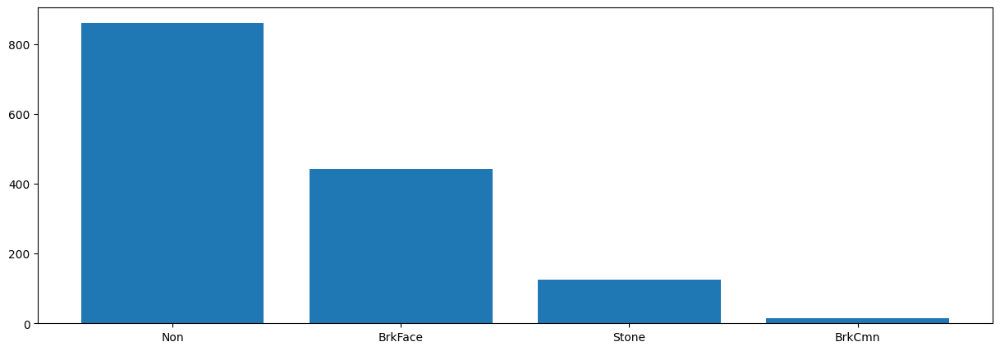

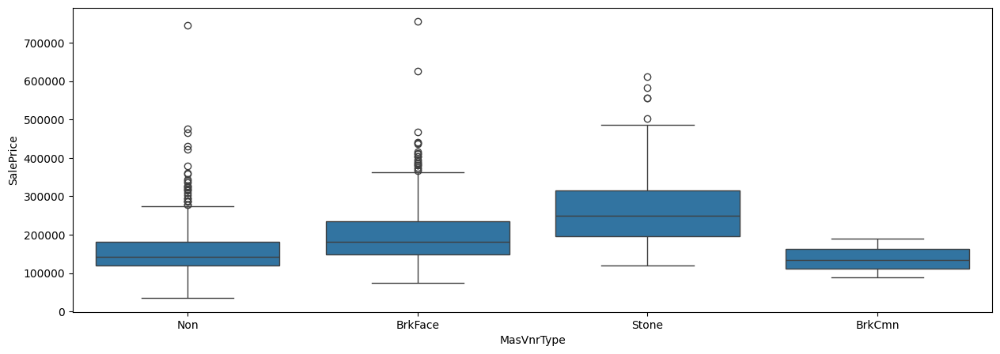


Column Name: Foundation
  Foundation   Id  rank
2      PConc  641   6.0
1     CBlock  625   5.0
0     BrkTil  145   4.0
3       Slab   24   3.0
4      Stone    6   2.0
5       Wood    3   1.0


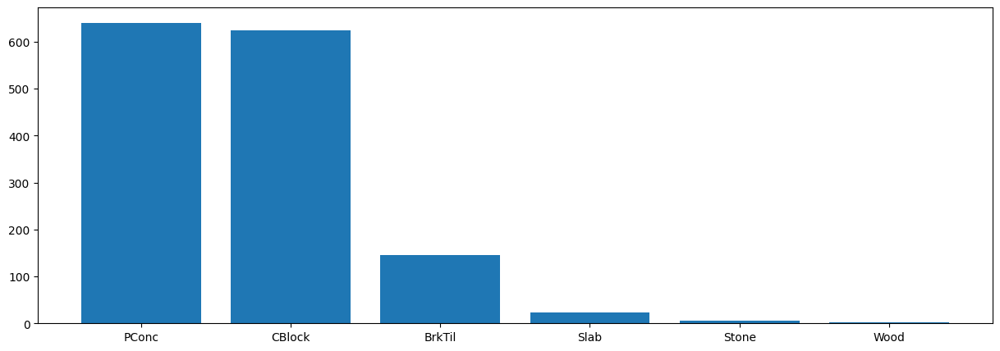

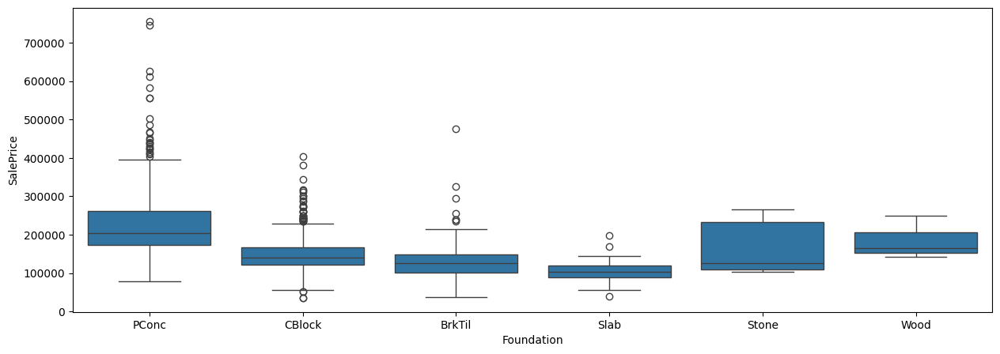


Column Name: Heating
  Heating    Id  rank
1    GasA  1413   6.0
2    GasW    17   5.0
3    Grav     7   4.0
5    Wall     4   3.0
4    OthW     2   2.0
0   Floor     1   1.0


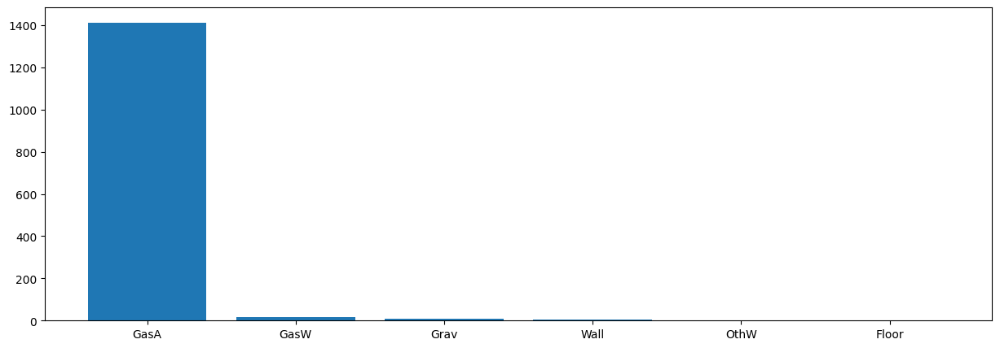

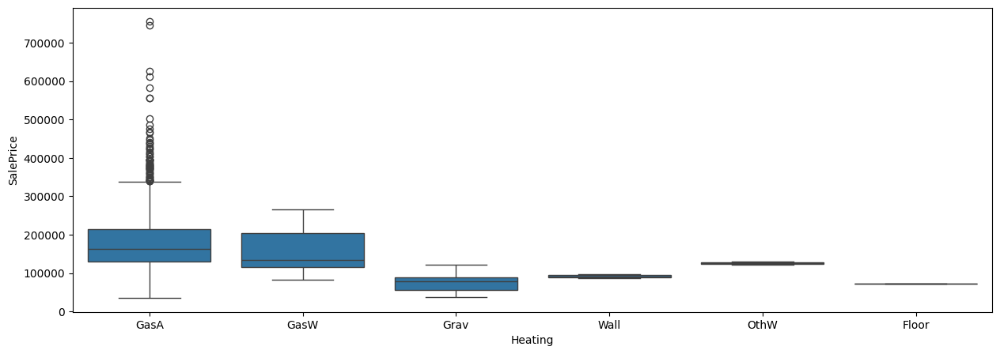


Column Name: CentralAir
  CentralAir    Id  rank
1          Y  1349   2.0
0          N    95   1.0


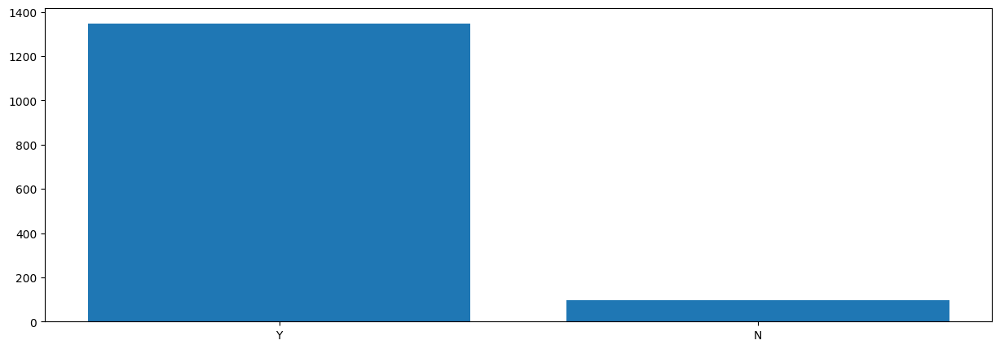

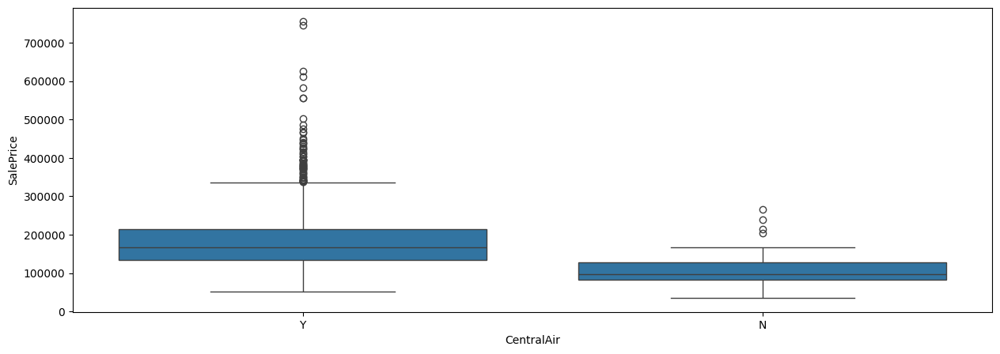


Column Name: Electrical
  Electrical    Id  rank
4      SBrkr  1319   5.0
0      FuseA    94   4.0
1      FuseF    27   3.0
2      FuseP     3   2.0
3        Mix     1   1.0


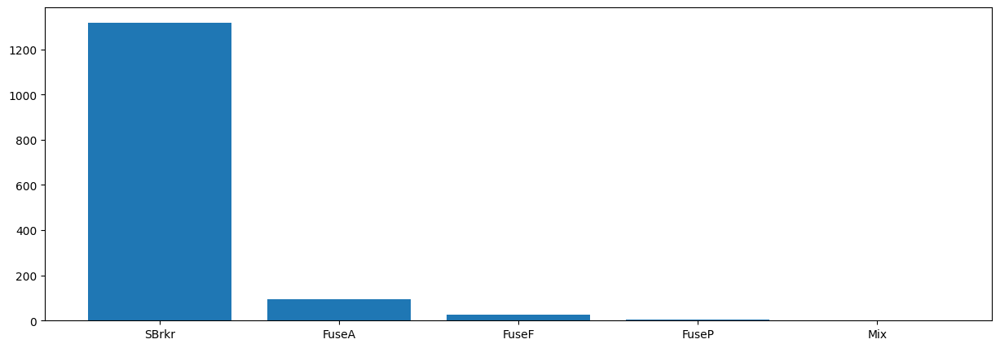

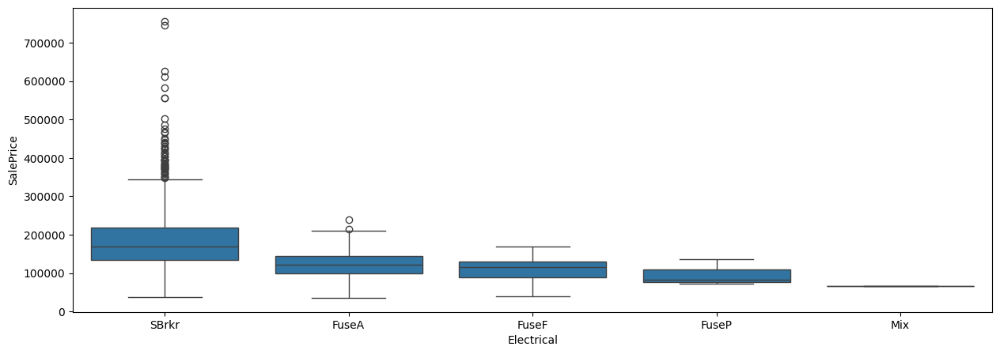


Column Name: Functional
  Functional    Id  rank
6        Typ  1348   7.0
3       Min2    34   6.0
2       Min1    29   5.0
0       Maj1    14   4.0
4        Mod    13   3.0
1       Maj2     5   2.0
5        Sev     1   1.0


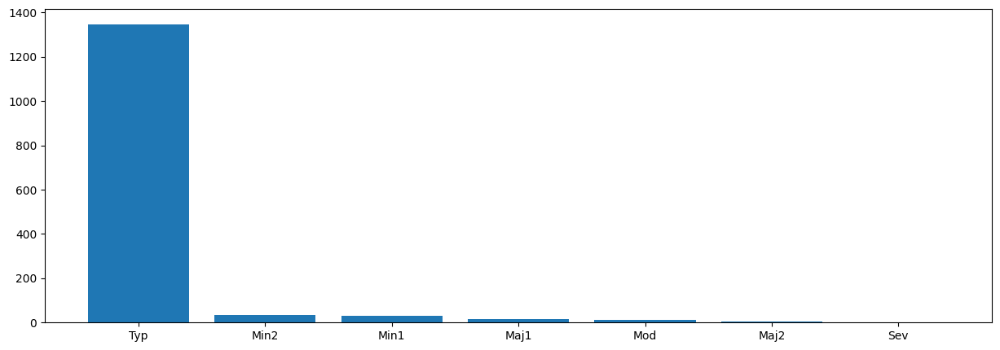

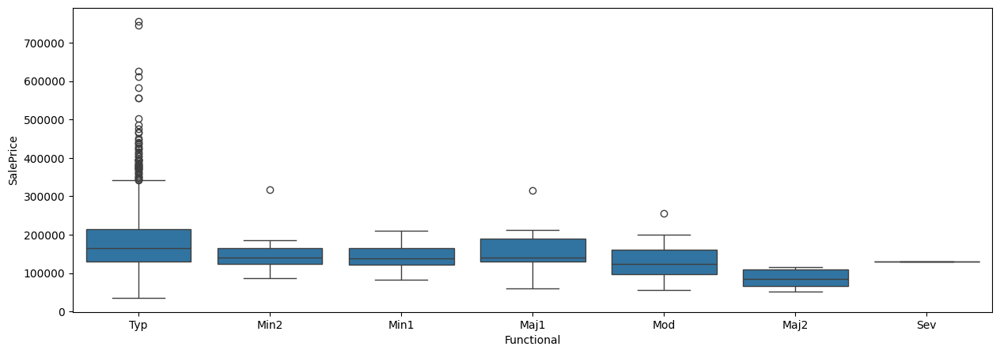


Column Name: GarageType
  GarageType   Id  rank
1     Attchd  859   7.0
5     Detchd  385   6.0
3    BuiltIn   85   5.0
6        Non   81   4.0
2    Basment   19   3.0
4    CarPort    9   2.0
0     2Types    6   1.0


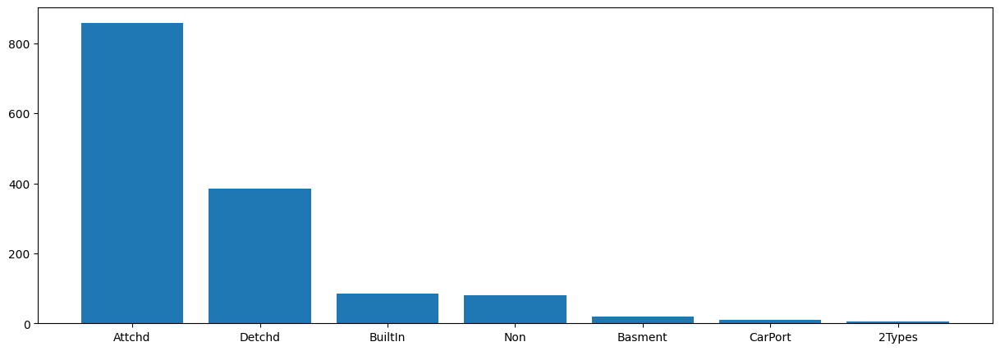

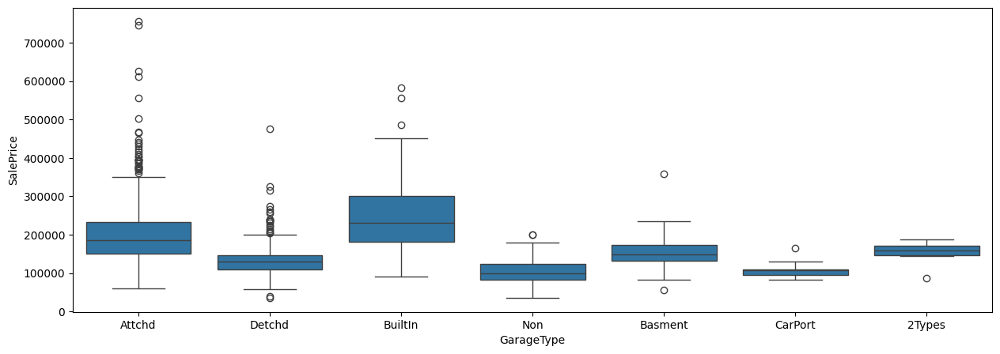


Column Name: PavedDrive
  PavedDrive    Id  rank
2          Y  1325   3.0
0          N    89   2.0
1          P    30   1.0


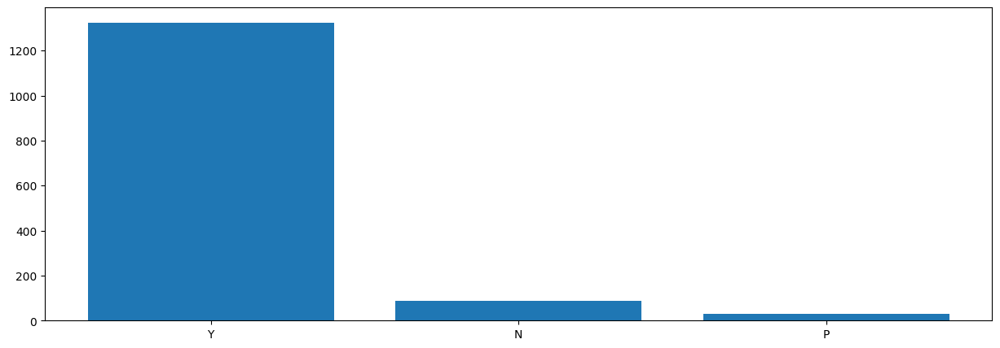

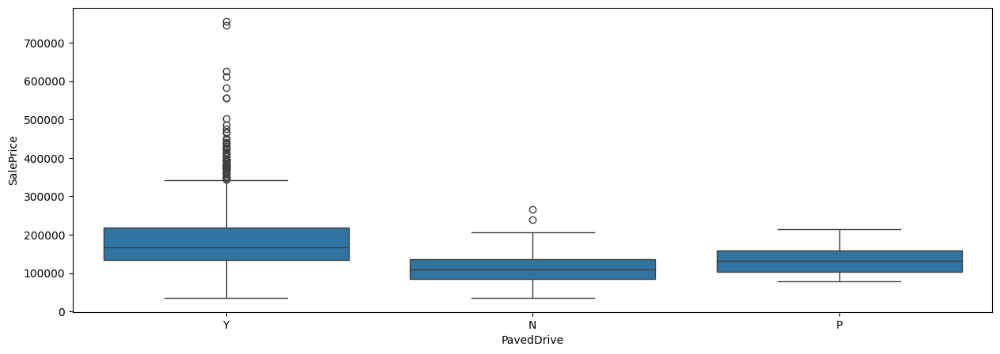


Column Name: MiscFeature
  MiscFeature    Id  rank
1         Non  1392   5.0
3        Shed    47   4.0
0        Gar2     2   2.5
2        Othr     2   2.5
4        TenC     1   1.0


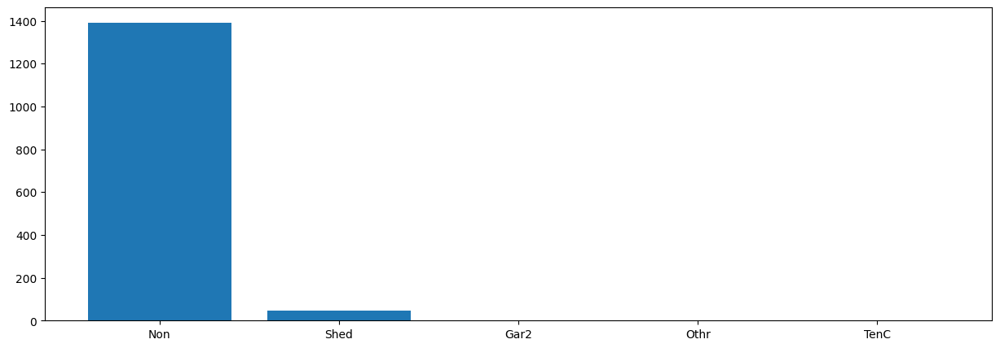

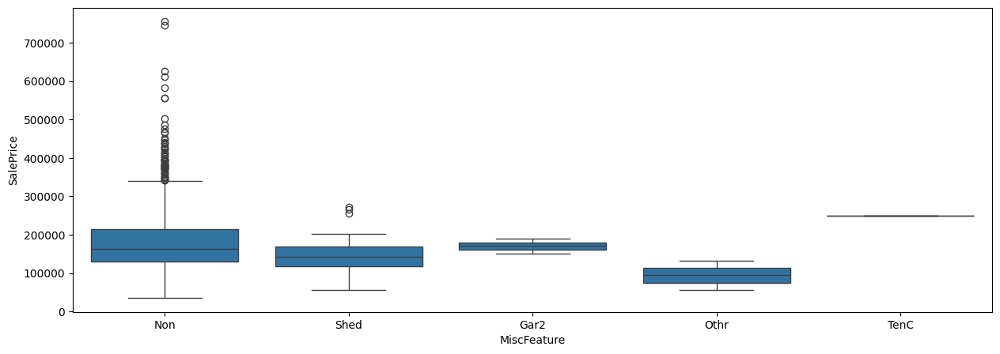


Column Name: SaleType
  SaleType    Id  rank
8       WD  1253   9.0
6      New   120   8.0
0      COD    43   7.0
3    ConLD     9   6.0
4    ConLI     5   4.5
5    ConLw     5   4.5
1      CWD     4   3.0
7      Oth     3   2.0
2      Con     2   1.0


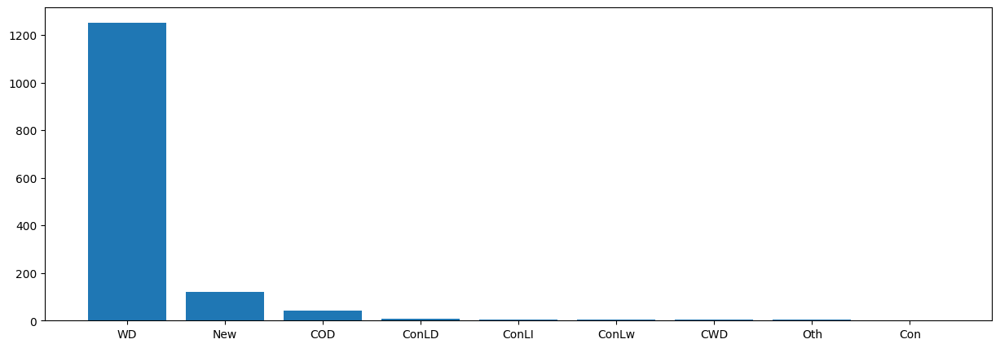

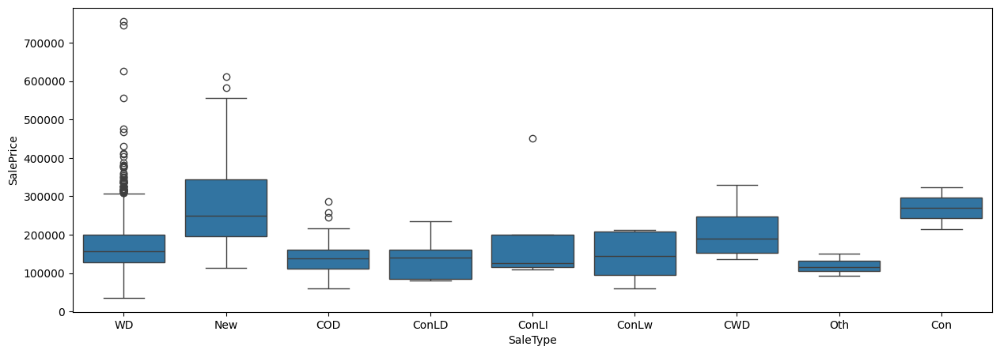


Column Name: SaleCondition
  SaleCondition    Id  rank
4        Normal  1184   6.0
5       Partial   123   5.0
0       Abnorml   101   4.0
3        Family    20   3.0
2        Alloca    12   2.0
1       AdjLand     4   1.0


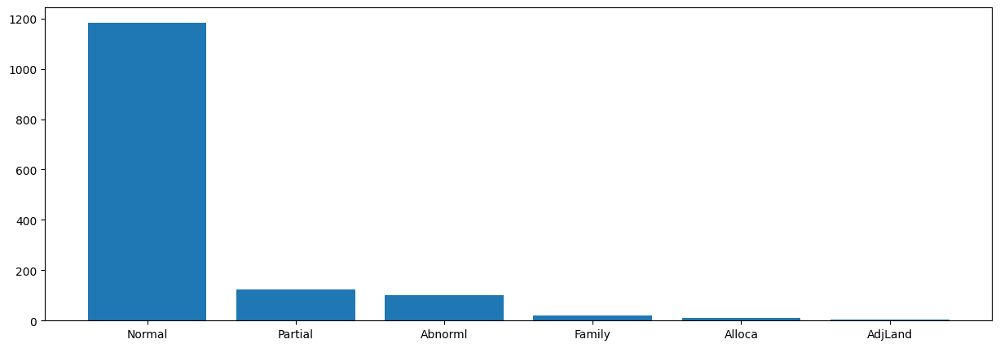

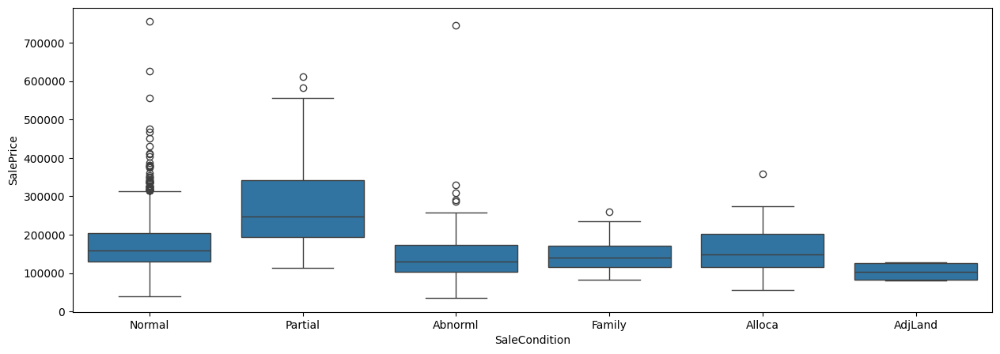


Column Name: ExterQual
  ExterQual   Id  rank
3        TA  897   4.0
2        Gd  484   3.0
0        Ex   49   2.0
1        Fa   14   1.0


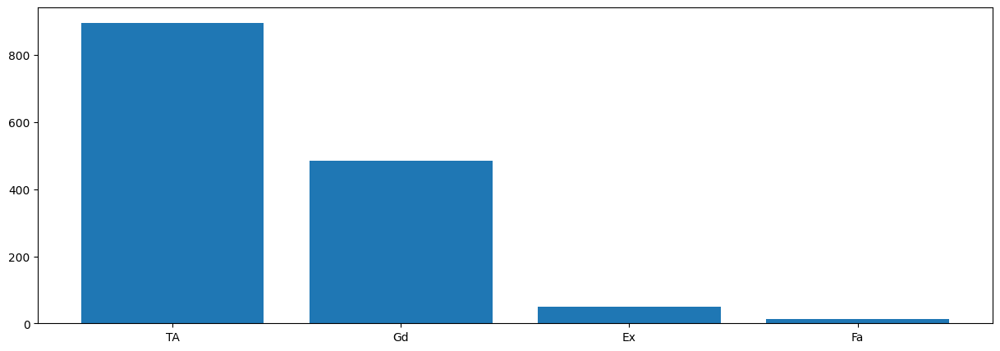

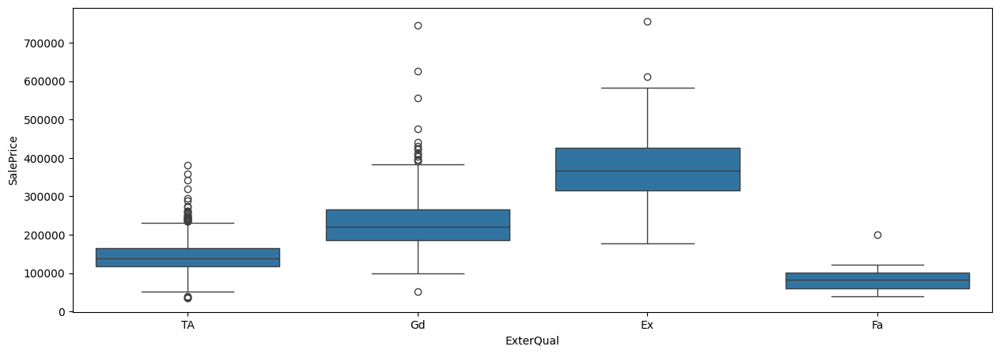


Column Name: ExterCond
  ExterCond    Id  rank
4        TA  1266   5.0
2        Gd   146   4.0
1        Fa    28   3.0
0        Ex     3   2.0
3        Po     1   1.0


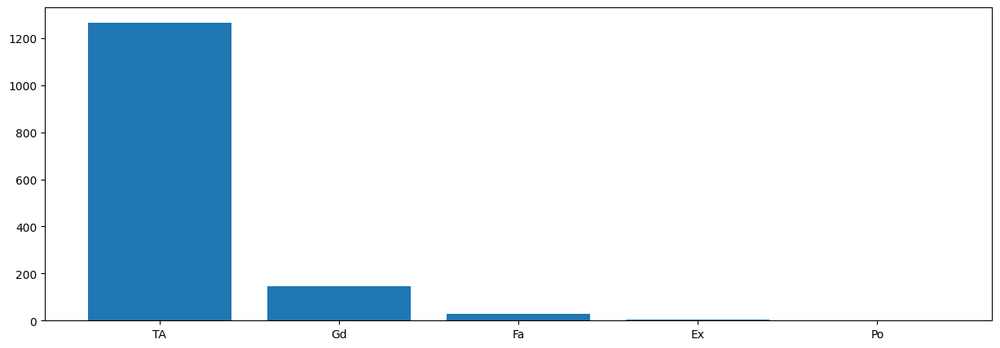

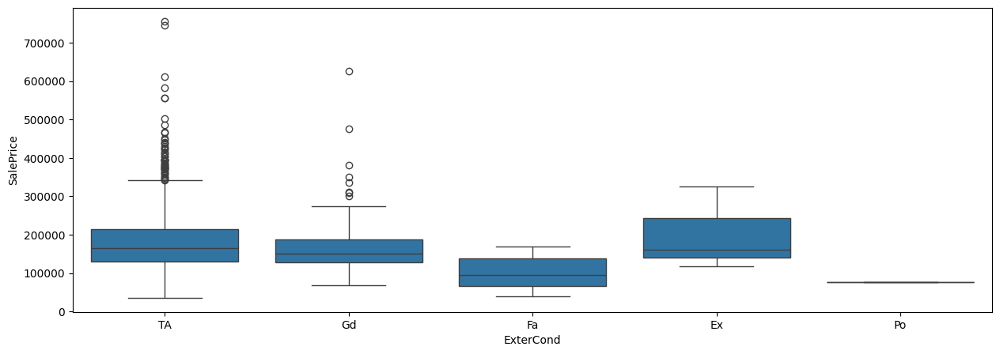


Column Name: BsmtQual
  BsmtQual   Id  rank
4       TA  646   5.0
2       Gd  608   4.0
0       Ex  118   3.0
3      Non   37   2.0
1       Fa   35   1.0


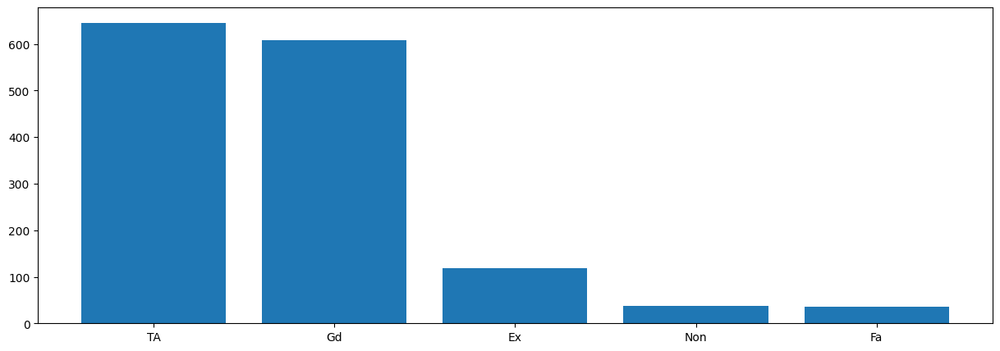

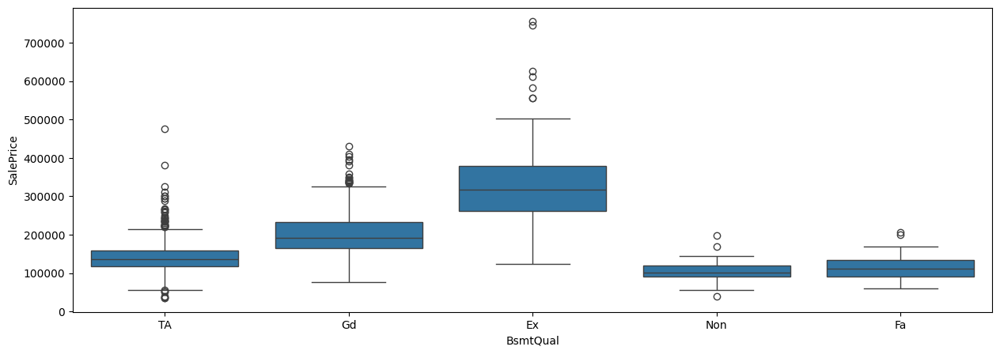


Column Name: BsmtCond
  BsmtCond    Id  rank
4       TA  1296   5.0
1       Gd    64   4.0
0       Fa    45   3.0
2      Non    37   2.0
3       Po     2   1.0


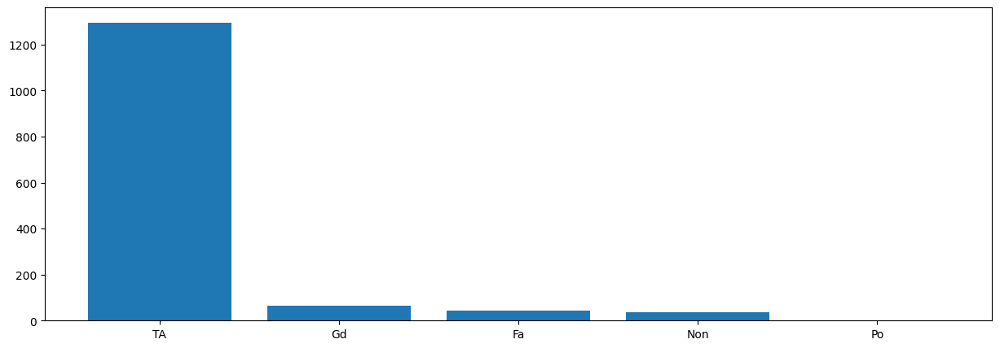

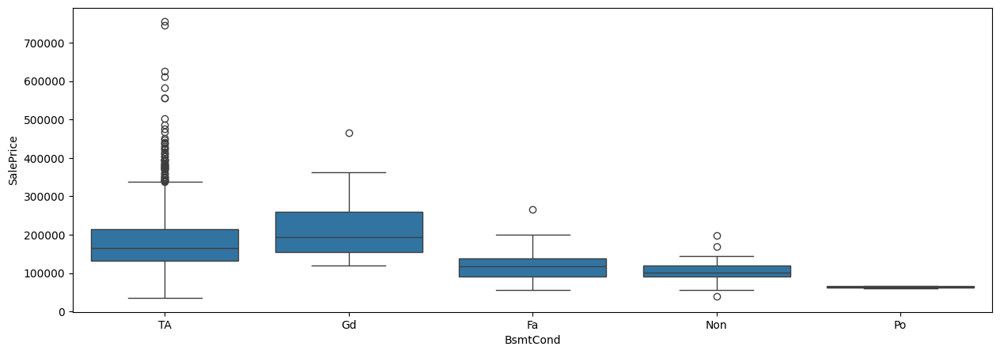


Column Name: BsmtExposure
  BsmtExposure   Id  rank
3           No  950   5.0
0           Av  219   4.0
1           Gd  123   3.0
2           Mn  114   2.0
4          Non   38   1.0


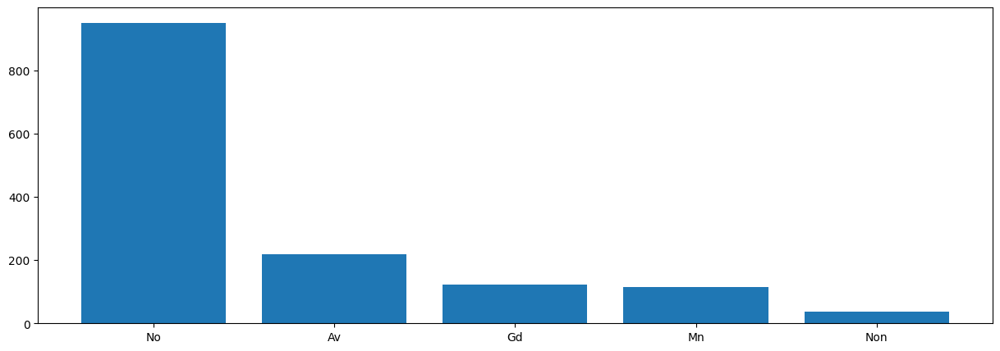

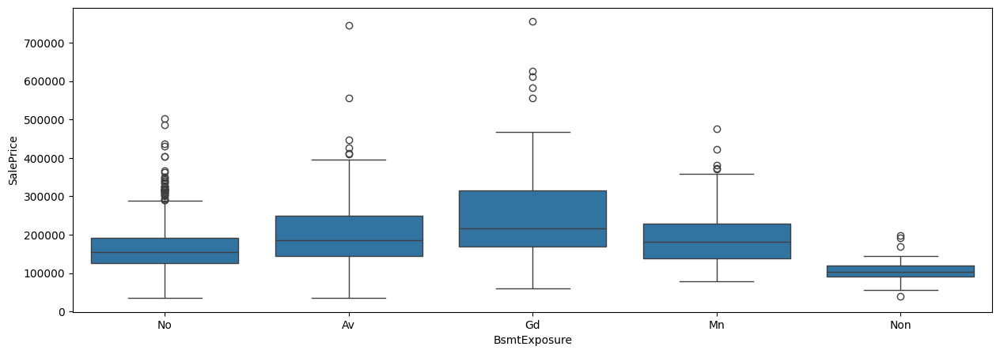


Column Name: BsmtFinType1
  BsmtFinType1   Id  rank
6          Unf  428   7.0
2          GLQ  412   6.0
0          ALQ  216   5.0
1          BLQ  146   4.0
5          Rec  132   3.0
3          LwQ   73   2.0
4          Non   37   1.0


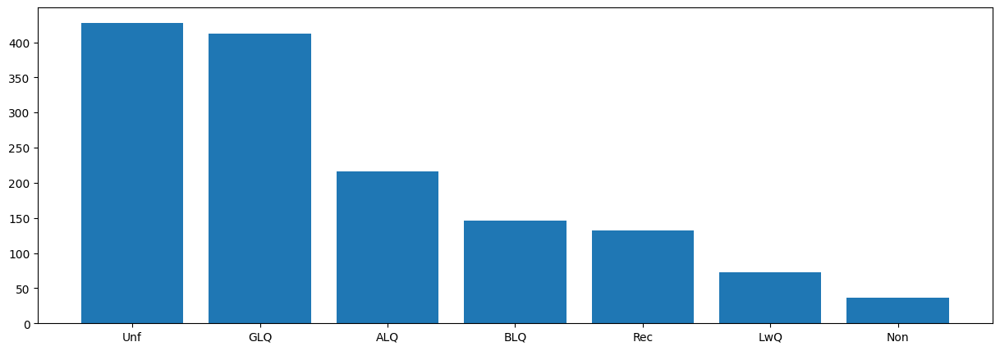

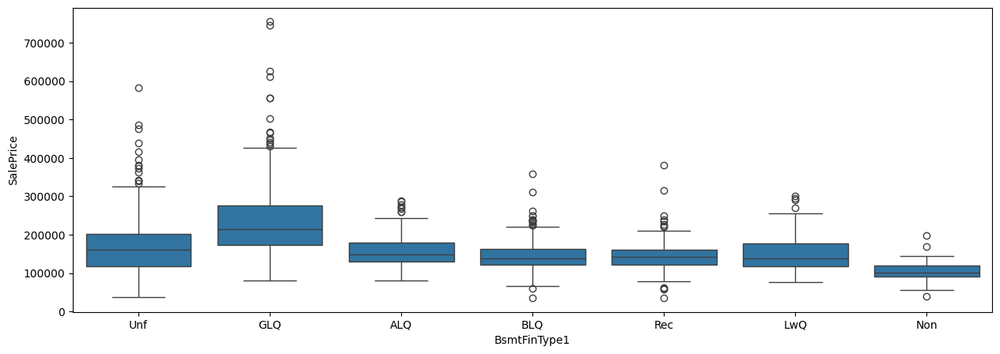


Column Name: BsmtFinType2
  BsmtFinType2    Id  rank
6          Unf  1245   7.0
5          Rec    51   6.0
3          LwQ    46   5.0
4          Non    38   4.0
1          BLQ    32   3.0
0          ALQ    19   2.0
2          GLQ    13   1.0


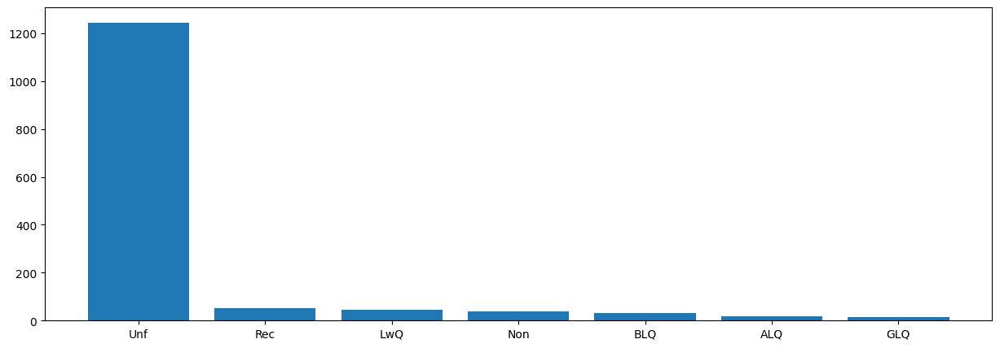

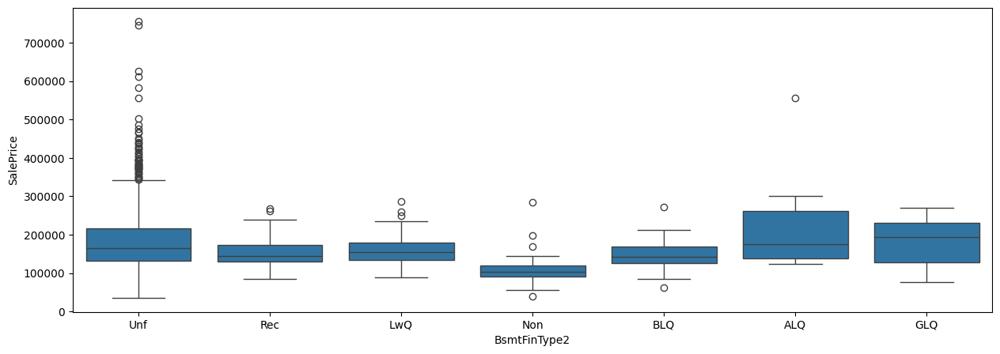


Column Name: HeatingQC
  HeatingQC   Id  rank
0        Ex  733   5.0
4        TA  423   4.0
2        Gd  238   3.0
1        Fa   49   2.0
3        Po    1   1.0


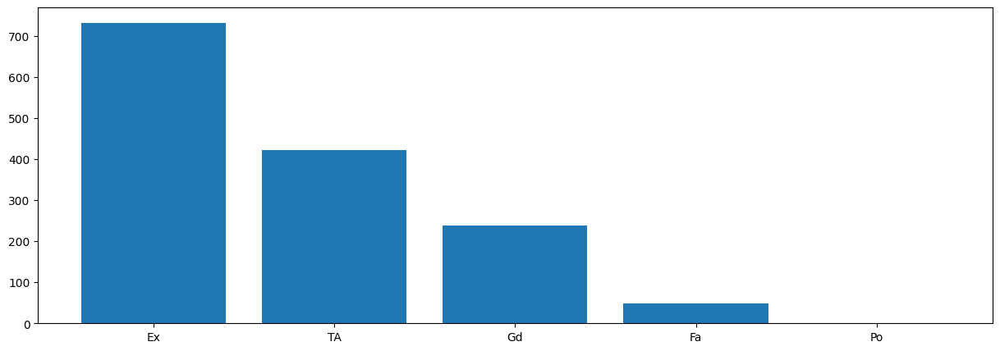

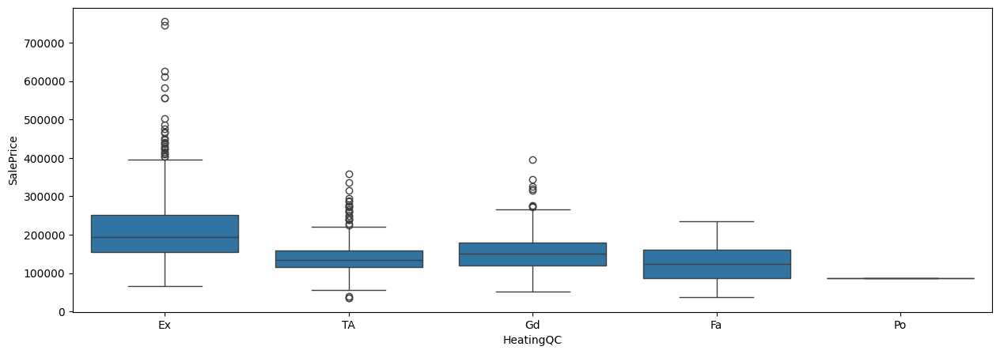


Column Name: KitchenQual
  KitchenQual   Id  rank
3          TA  730   4.0
2          Gd  578   3.0
0          Ex   97   2.0
1          Fa   39   1.0


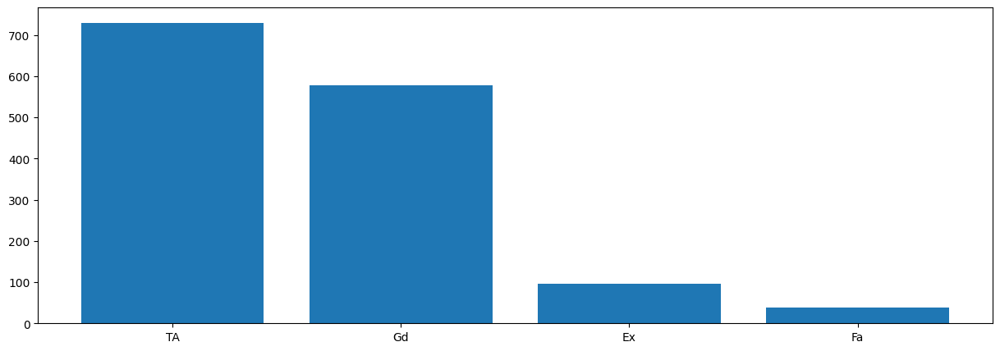

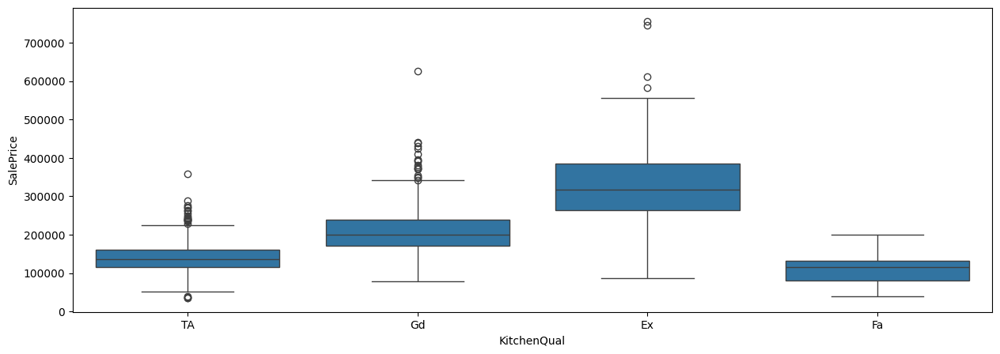


Column Name: FireplaceQu
  FireplaceQu   Id  rank
3         Non  689   6.0
2          Gd  372   5.0
5          TA  307   4.0
1          Fa   32   3.0
0          Ex   24   2.0
4          Po   20   1.0


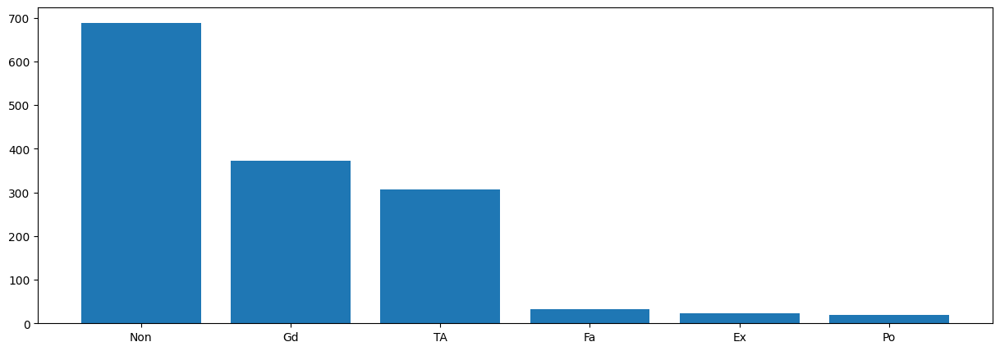

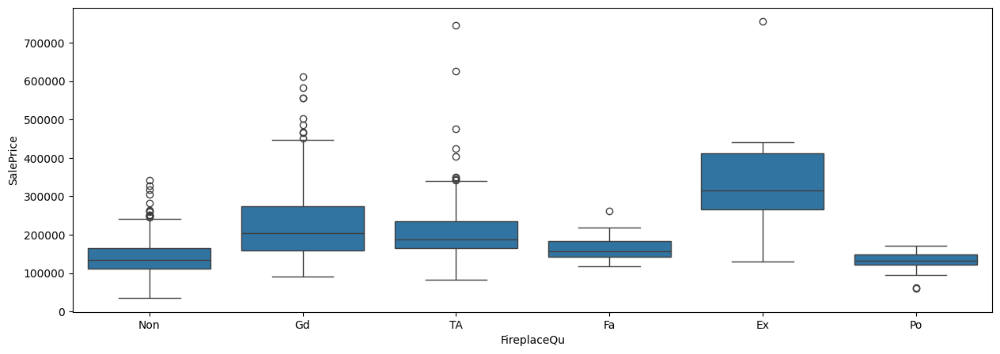


Column Name: GarageFinish
  GarageFinish   Id  rank
3          Unf  600   4.0
2          RFn  420   3.0
0          Fin  343   2.0
1          Non   81   1.0


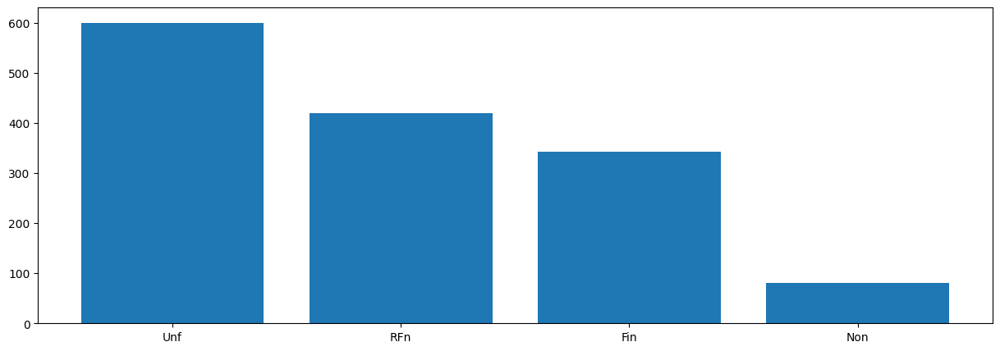

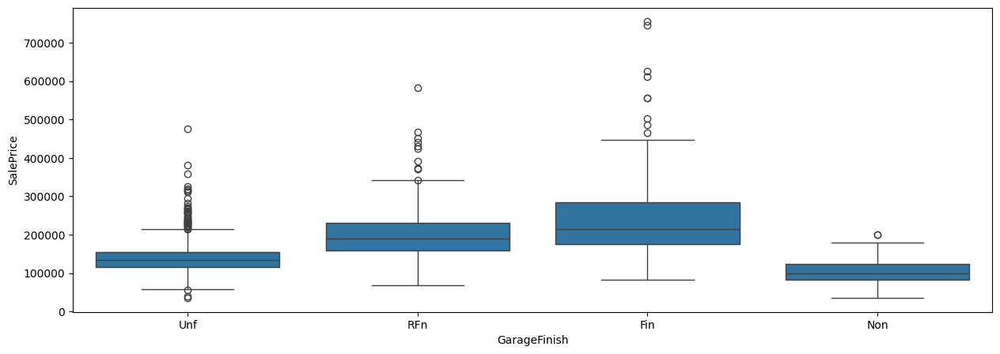


Column Name: GarageQual
  GarageQual    Id  rank
5         TA  1296   6.0
3        Non    81   5.0
1         Fa    47   4.0
2         Gd    14   3.0
0         Ex     3   1.5
4         Po     3   1.5


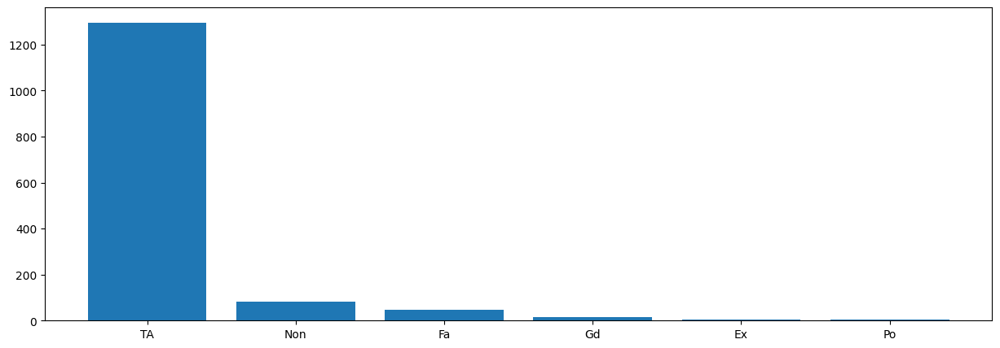

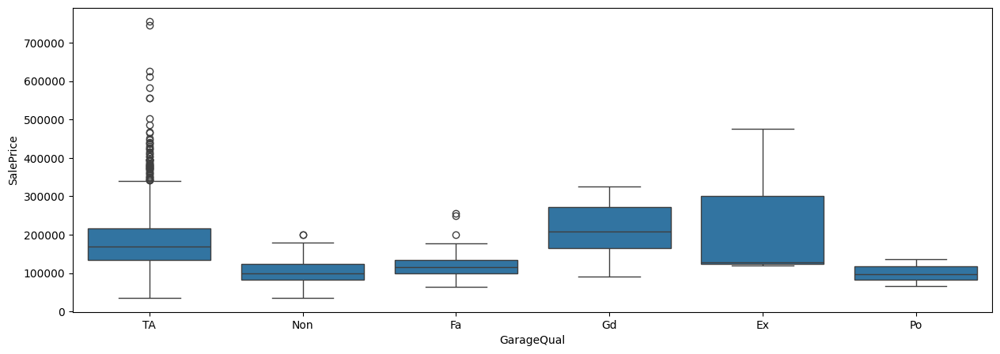


Column Name: GarageCond
  GarageCond    Id  rank
5         TA  1310   6.0
3        Non    81   5.0
1         Fa    35   4.0
2         Gd     9   3.0
4         Po     7   2.0
0         Ex     2   1.0


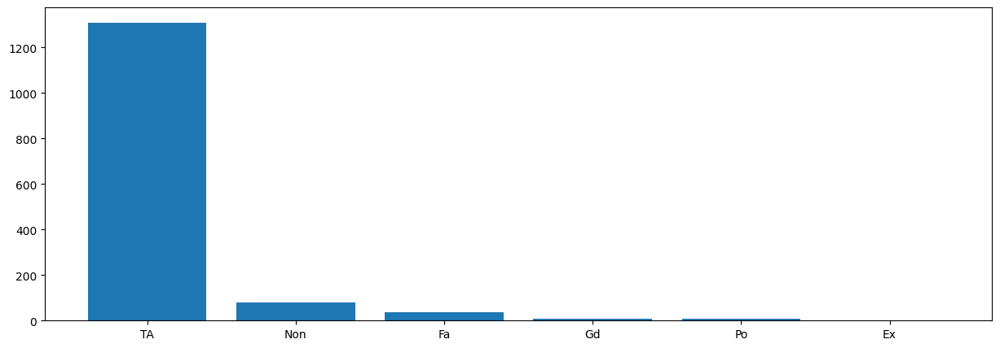

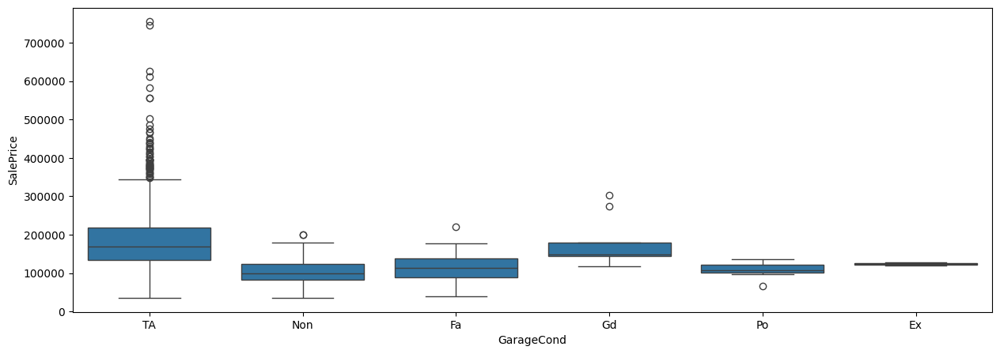


Column Name: PoolQC
  PoolQC    Id  rank
3    Non  1438   4.0
0     Ex     2   2.0
1     Fa     2   2.0
2     Gd     2   2.0


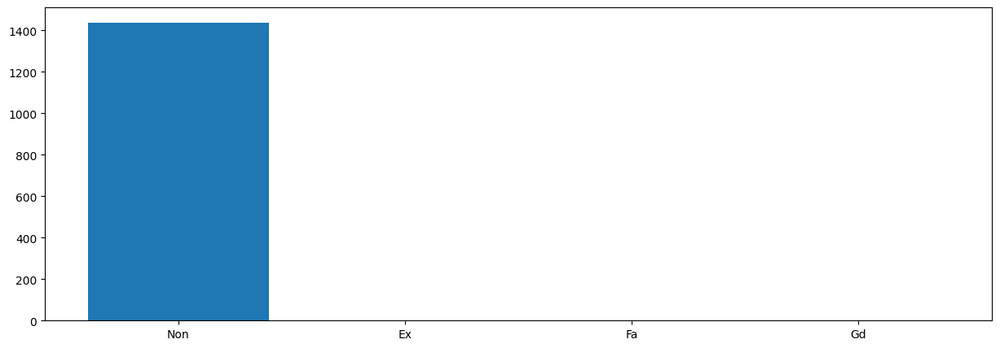

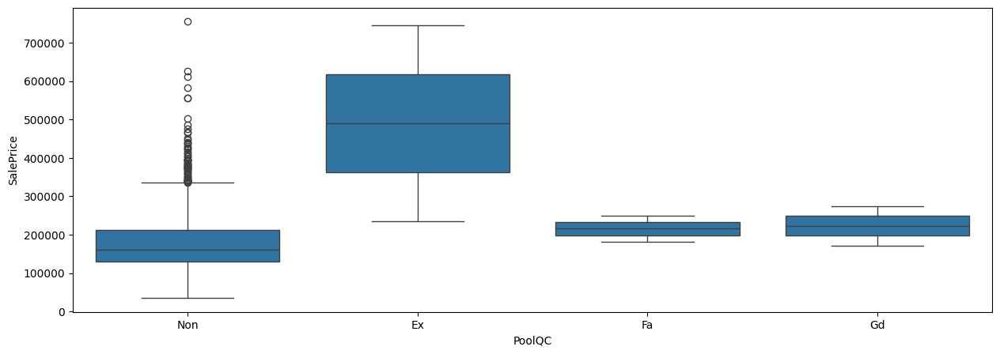


Column Name: Fence
   Fence    Id  rank
4    Non  1163   5.0
2  MnPrv   157   4.0
0  GdPrv    59   3.0
1   GdWo    54   2.0
3   MnWw    11   1.0


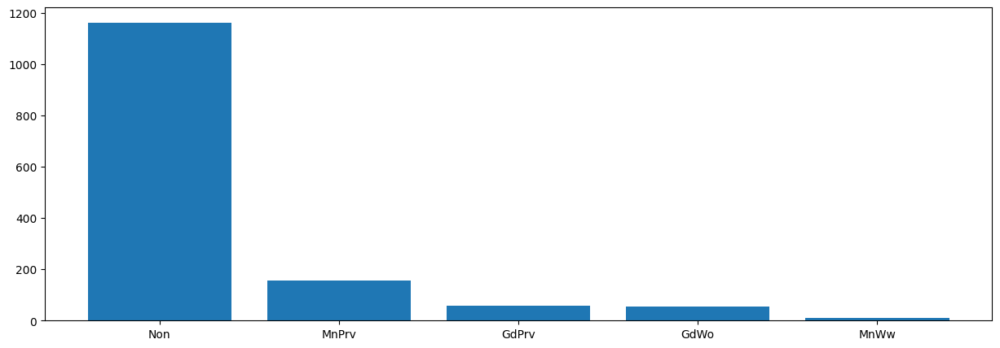

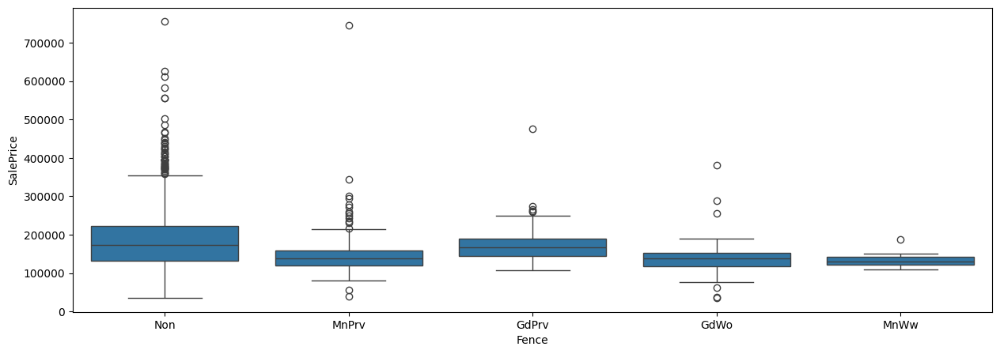


Column Name: GarageYrBlt
      GarageYrBlt   Id  rank
1       1950-1999  802   4.0
2  2000-till date  398   3.0
0       1900-1949  163   2.0
3             Non   81   1.0


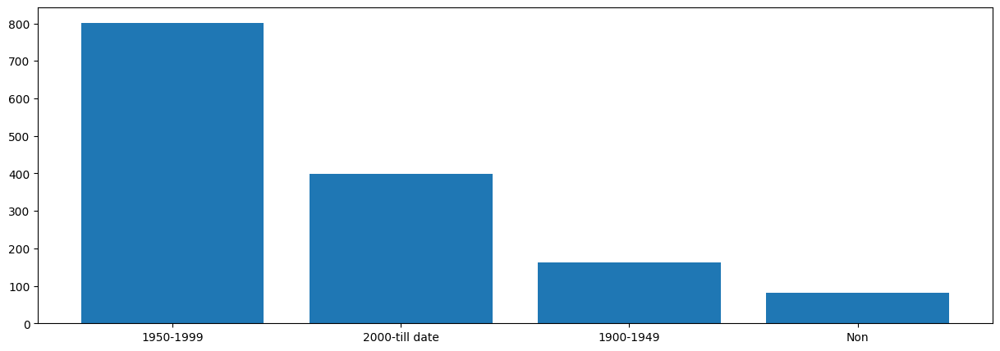

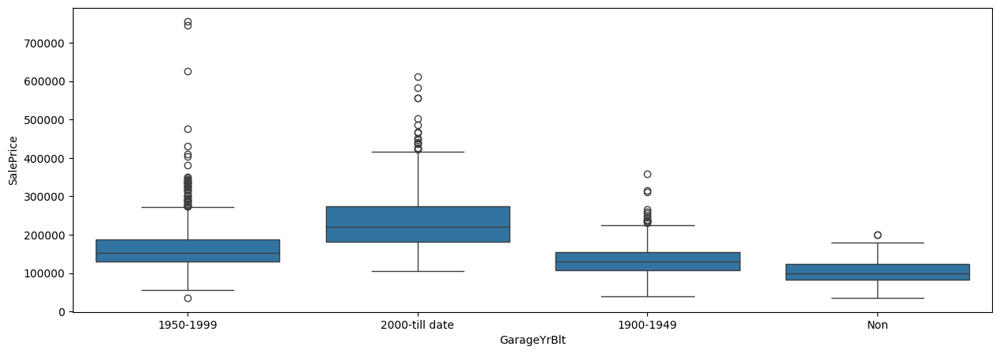


Column Name: MoSold
    MoSold   Id  rank
5        6  247  12.0
6        7  233  11.0
4        5  203  10.0
3        4  140   9.0
7        8  121   8.0
2        3  105   7.0
9       10   88   6.0
10      11   78   5.0
8        9   62   4.0
11      12   58   3.0
0        1   57   2.0
1        2   52   1.0


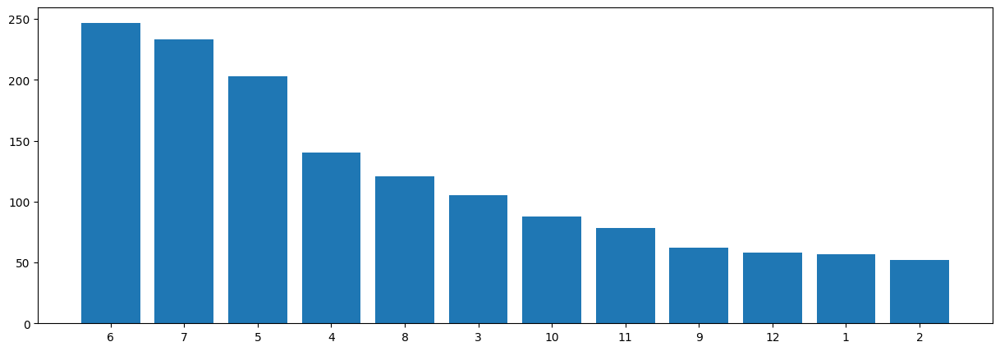

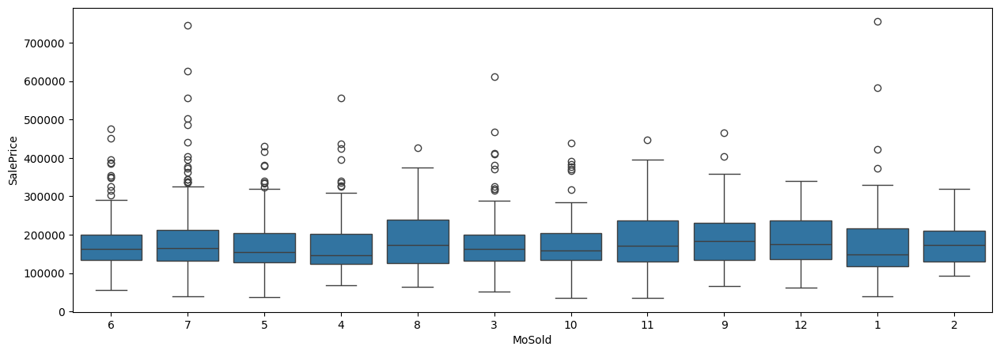


Column Name: YrSold
   YrSold   Id  rank
3    2009  336   5.0
1    2007  325   4.0
0    2006  312   3.0
2    2008  298   2.0
4    2010  173   1.0


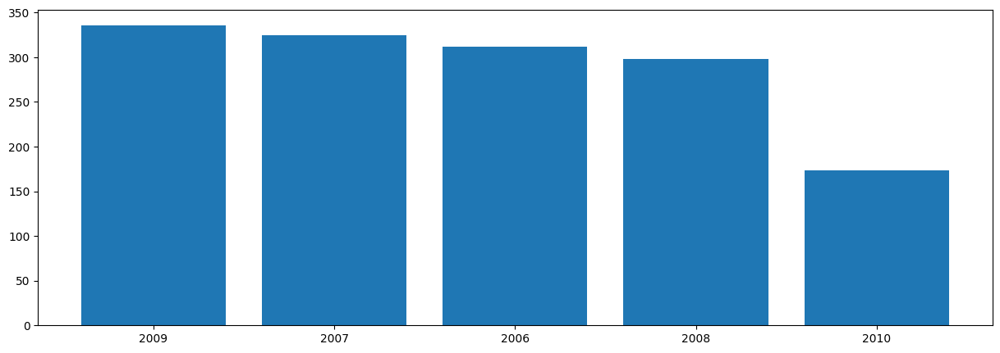

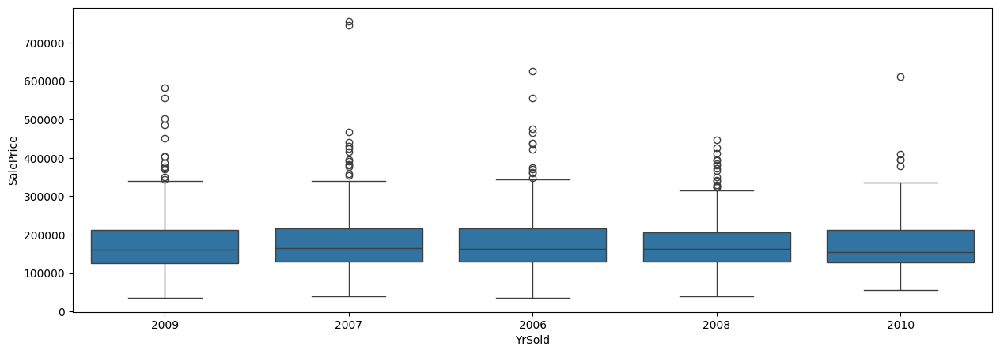


Column Name: YearBuilt
        YearBuilt   Id  rank
2       1950-1999  744   4.0
3  2000-till date  384   3.0
1       1900-1949  301   2.0
0       1850-1899   15   1.0


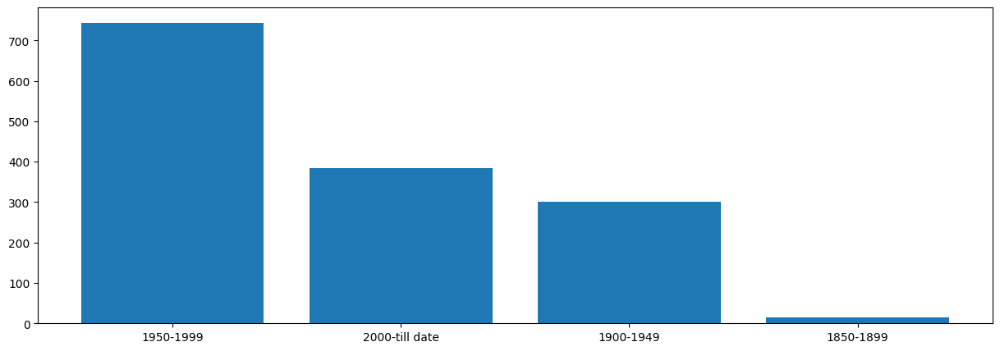

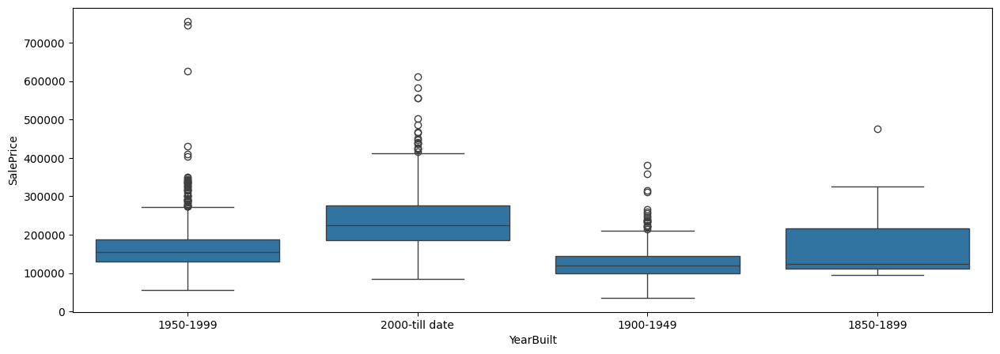


Column Name: YearRemodAdd
     YearRemodAdd   Id  rank
0       1950-1999  900   2.0
1  2000-till date  544   1.0


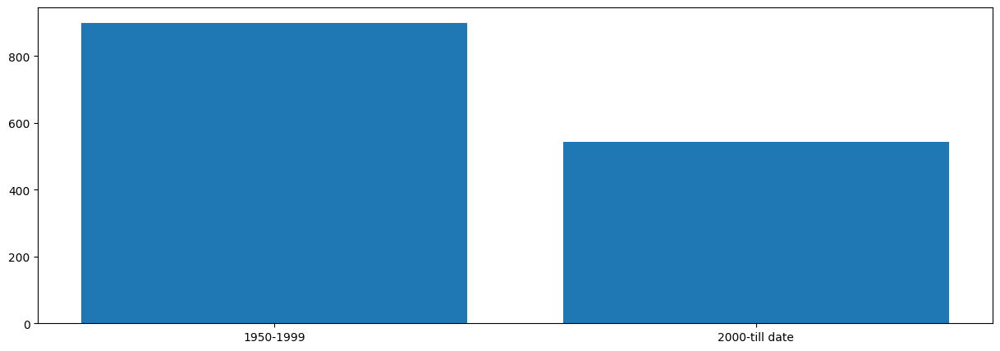

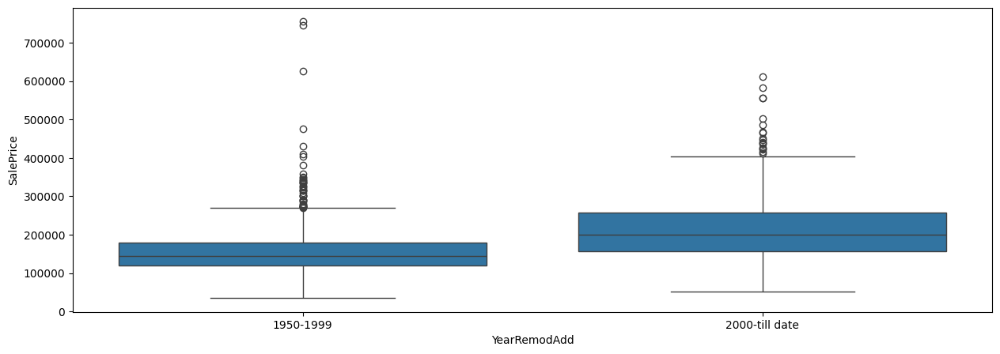


Column Name: BsmtFullBath
   BsmtFullBath   Id  rank
0             0  853   4.0
1             1  579   3.0
2             2   11   2.0
3             3    1   1.0


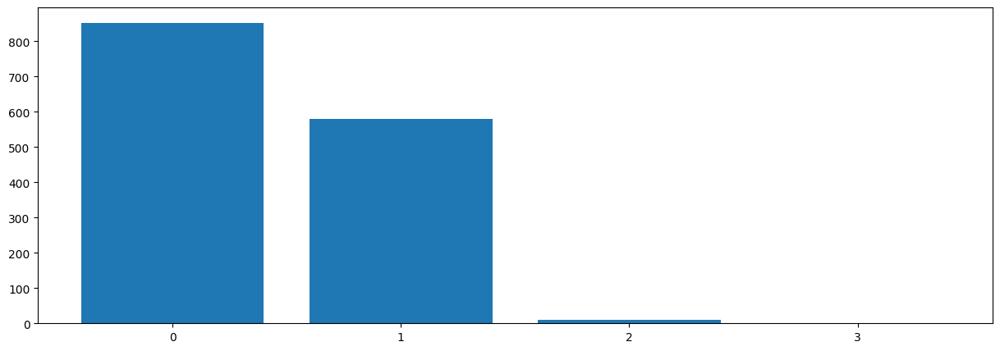

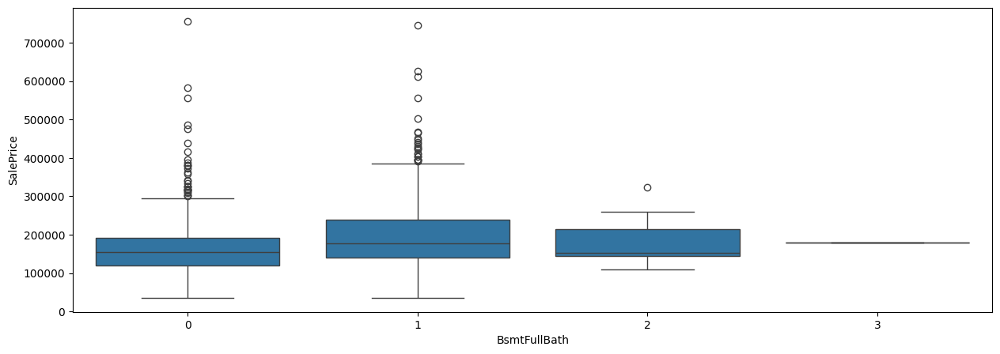


Column Name: BsmtHalfBath
   BsmtHalfBath    Id  rank
0             0  1363   3.0
1             1    79   2.0
2             2     2   1.0


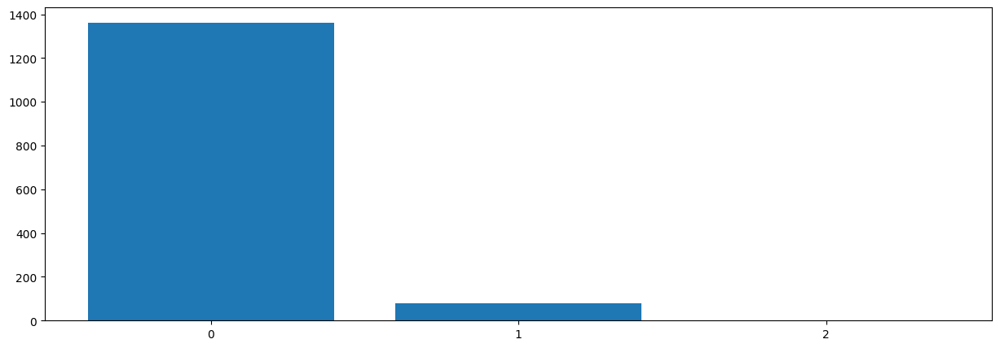

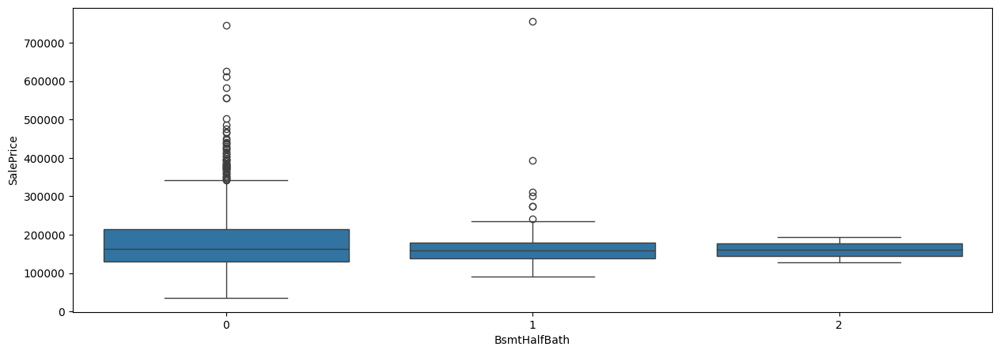


Column Name: FullBath
   FullBath   Id  rank
2         2  759   4.0
1         1  647   3.0
3         3   30   2.0
0         0    8   1.0


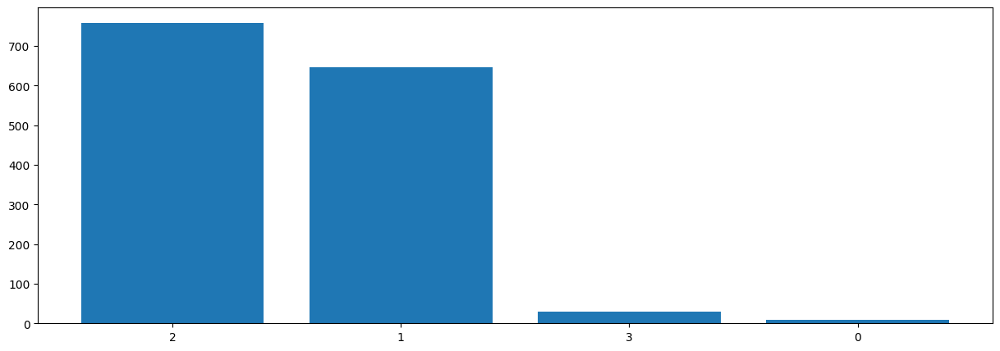

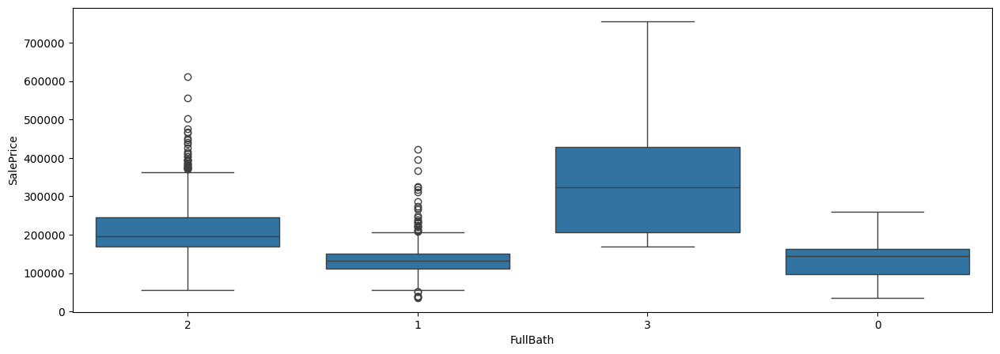


Column Name: HalfBath
   HalfBath   Id  rank
0         0  904   3.0
1         1  528   2.0
2         2   12   1.0


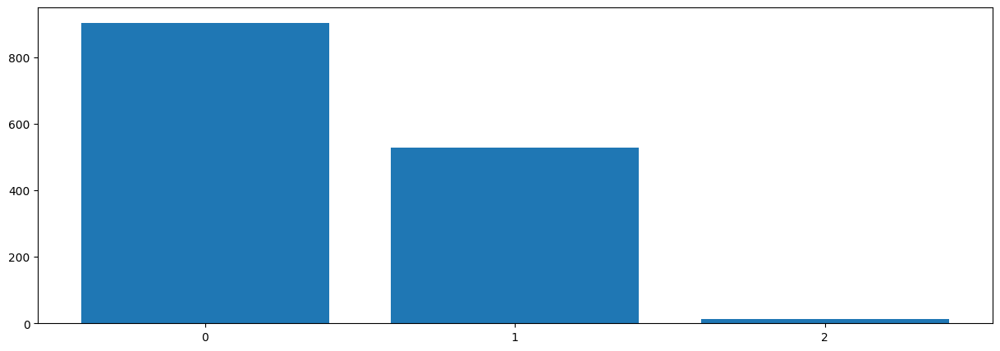

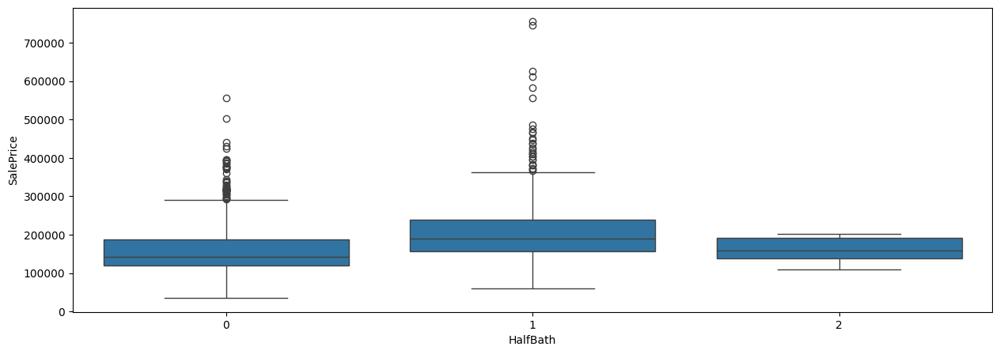


Column Name: OverallCond
   OverallCond   Id  rank
4            5  811   9.0
5            6  250   8.0
6            7  202   7.0
7            8   71   6.0
3            4   57   5.0
2            3   25   4.0
8            9   22   3.0
1            2    5   2.0
0            1    1   1.0


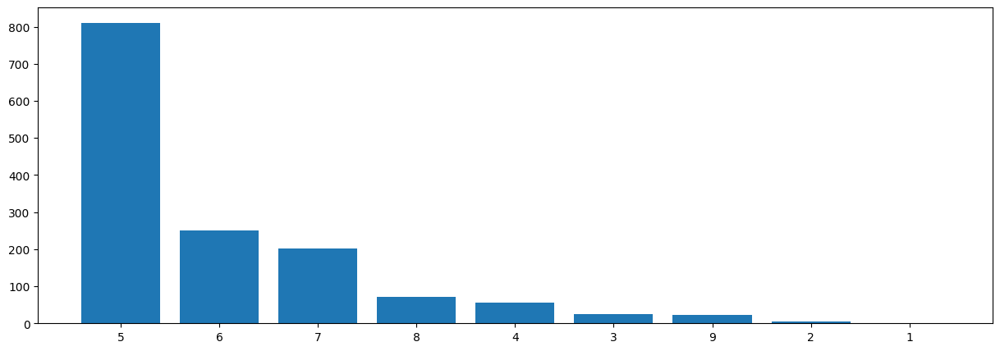

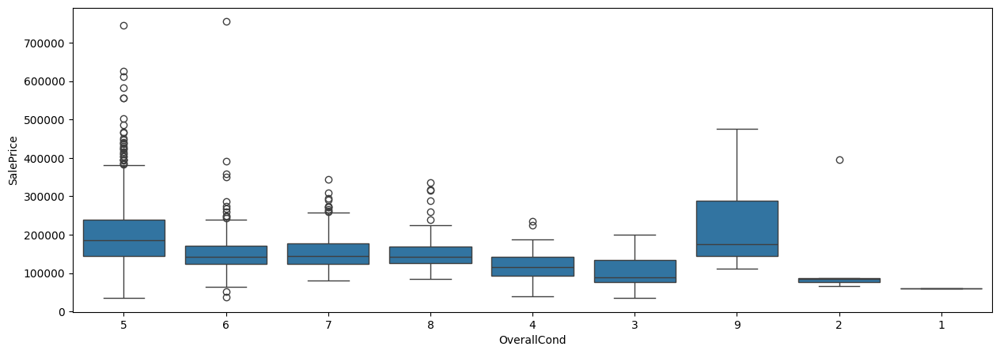


Column Name: Fireplaces
   Fireplaces   Id  rank
0           0  689   4.0
1           1  645   3.0
2           2  106   2.0
3           3    4   1.0


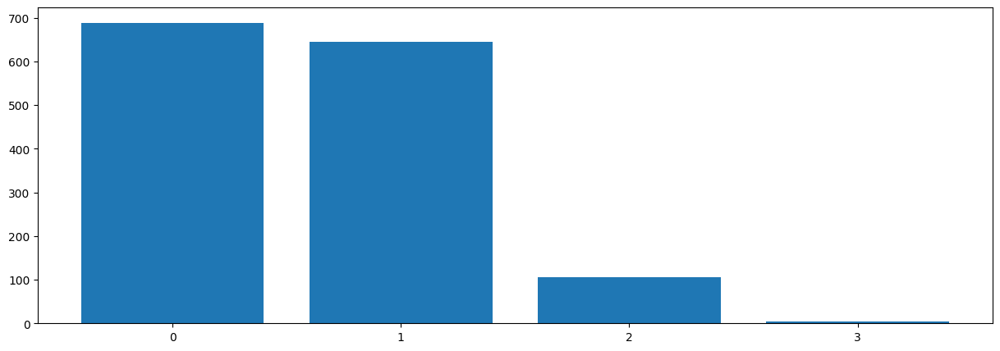

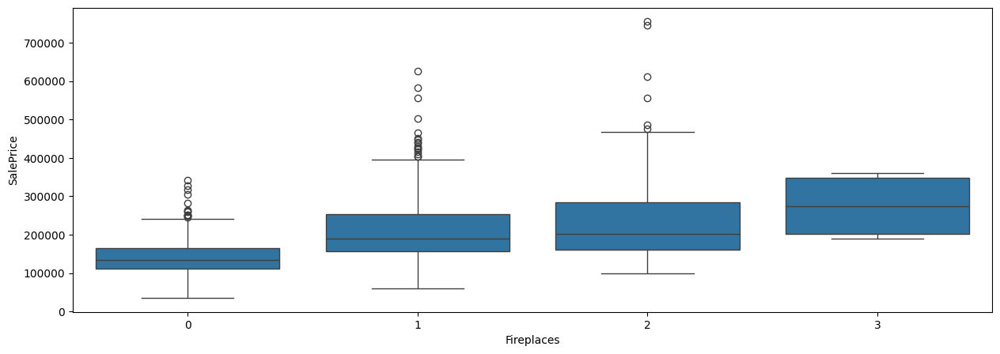


Column Name: BedroomAbvGr
   BedroomAbvGr   Id  rank
3             3  797   8.0
2             2  354   7.0
4             4  210   6.0
1             1   50   5.0
5             5   20   4.0
6             6    7   3.0
0             0    5   2.0
7             8    1   1.0


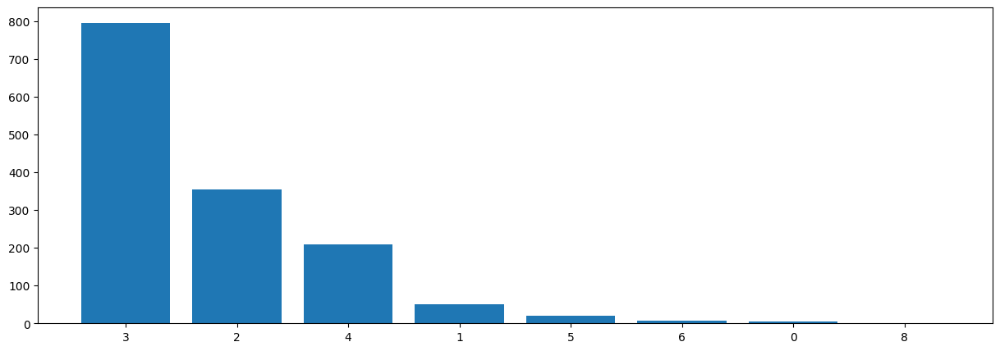

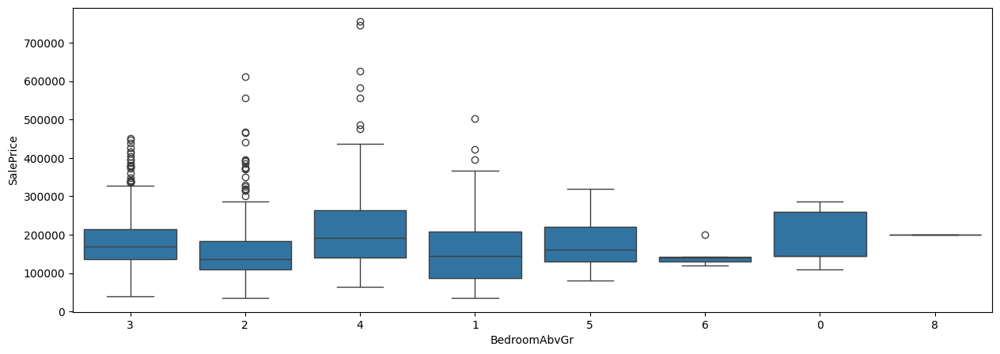


Column Name: KitchenAbvGr
   KitchenAbvGr    Id  rank
1             1  1376   4.0
2             2    65   3.0
3             3     2   2.0
0             0     1   1.0


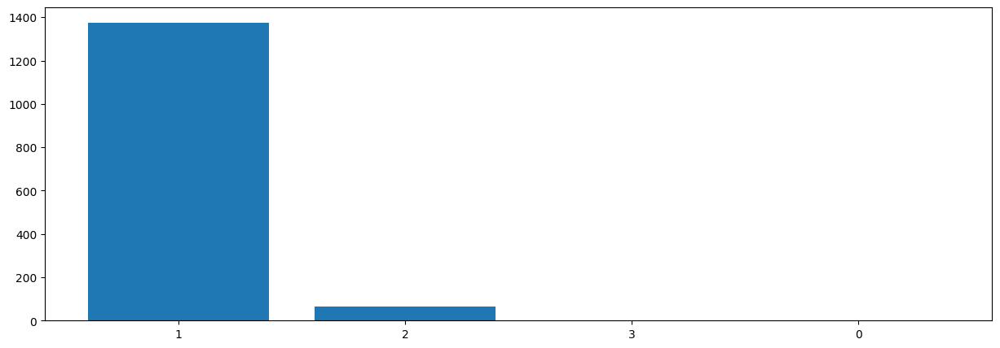

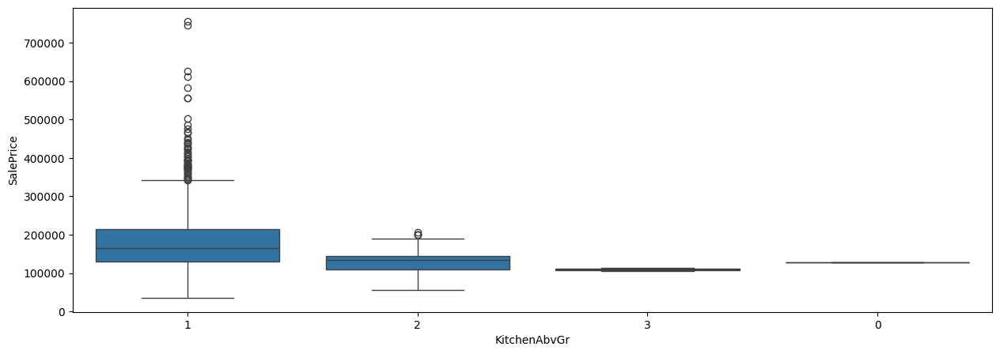

In [28]:
for col in cat_cols:
    print(f"Column Name: {col}")
    cat_eda(col)
    print()

As per the above analysis, grouping together categories that have lower count in the Feature Engineering section

### Categorical Column Feature Engineering

##### MSSubClass Column

Before
    MSSubClass   Id  rank
0           20  529  15.0
5           60  294  14.0
4           50  142  13.0
11         120   87  12.0
1           30   69  11.0
12         160   63  10.0
6           70   60   9.0
8           80   57   8.0
10          90   52   7.0
14         190   29   6.0
9           85   20   5.0
7           75   16   4.0
3           45   12   3.0
13         180   10   2.0
2           40    4   1.0


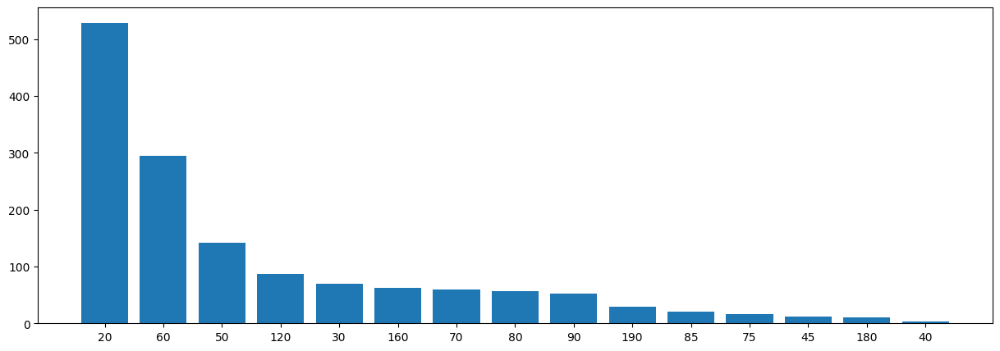

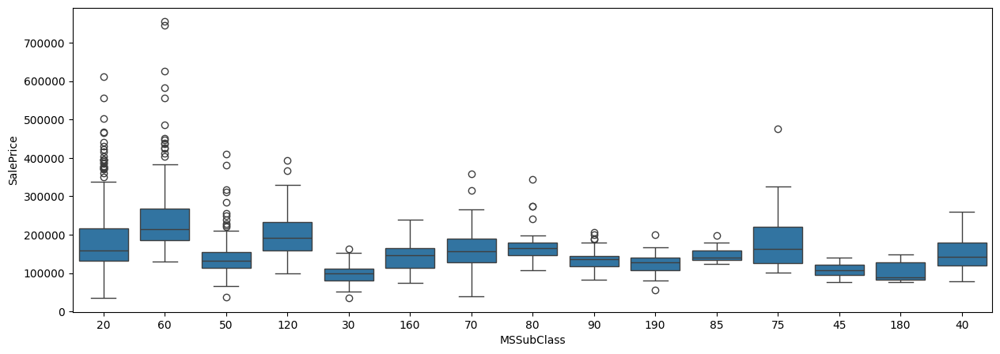


After
  MSSubClass   Id  rank
0         20  529   4.0
3      other  479   3.0
2         60  294   2.0
1         50  142   1.0


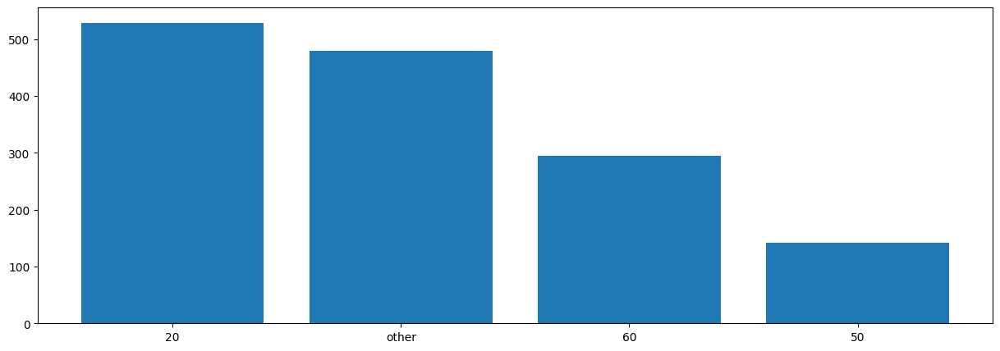

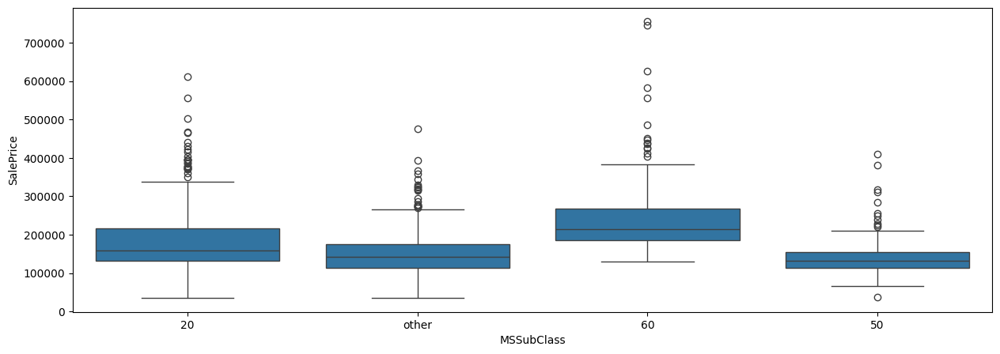

In [29]:
print('Before')
cat_eda('MSSubClass')
print()

dataset_df['MSSubClass'] = dataset_df['MSSubClass'].astype(str)
grouping_logic = ((dataset_df['MSSubClass']!='20') & (dataset_df['MSSubClass']!='60') & (dataset_df['MSSubClass']!='50'))
dataset_df.loc[grouping_logic,'MSSubClass'] = 'other'

print('After')
cat_eda('MSSubClass')

##### MSZoning Column

Before
  MSZoning    Id  rank
3       RL  1135   5.0
4       RM   218   4.0
1       FV    65   3.0
2       RH    16   2.0
0  C (all)    10   1.0


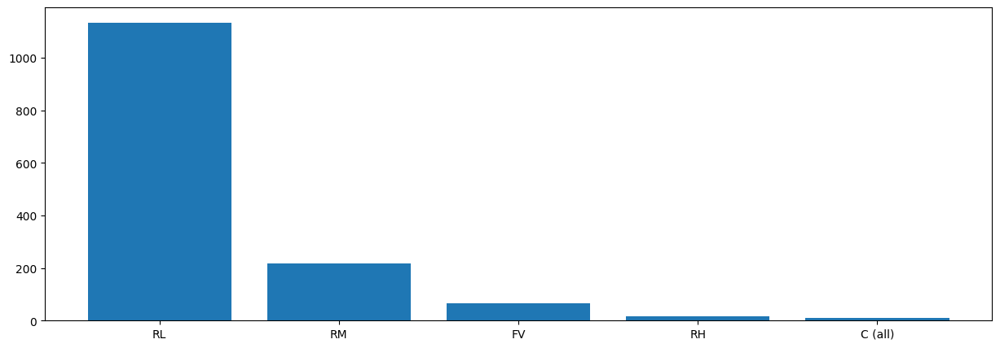

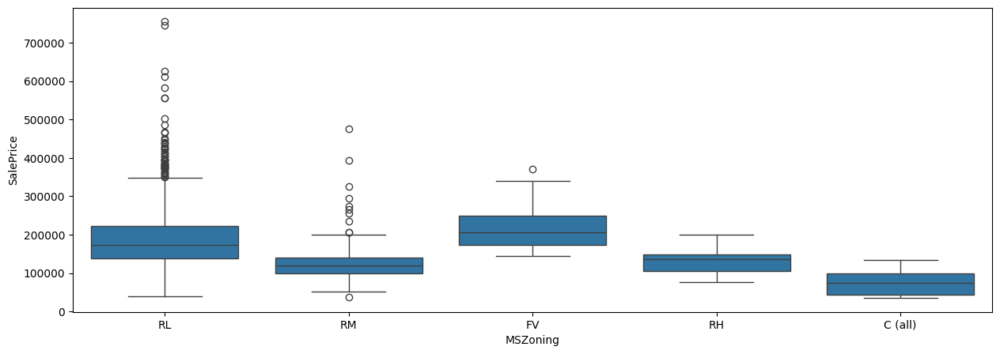


After
  MSZoning    Id  rank
0       RL  1135   3.0
1       RM   218   2.0
2    other    91   1.0


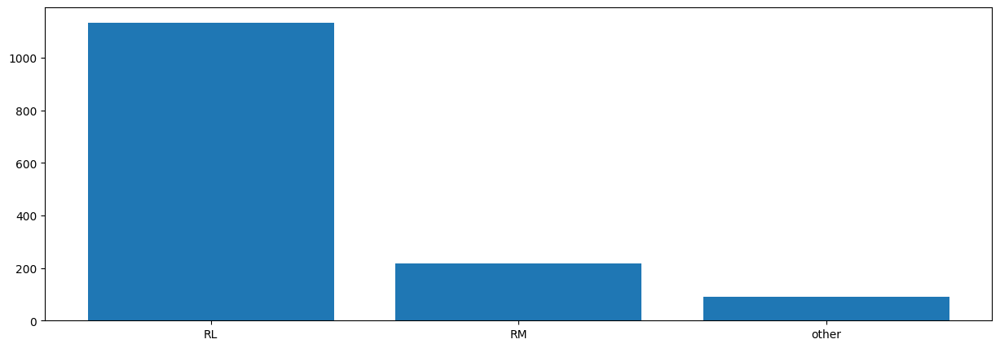

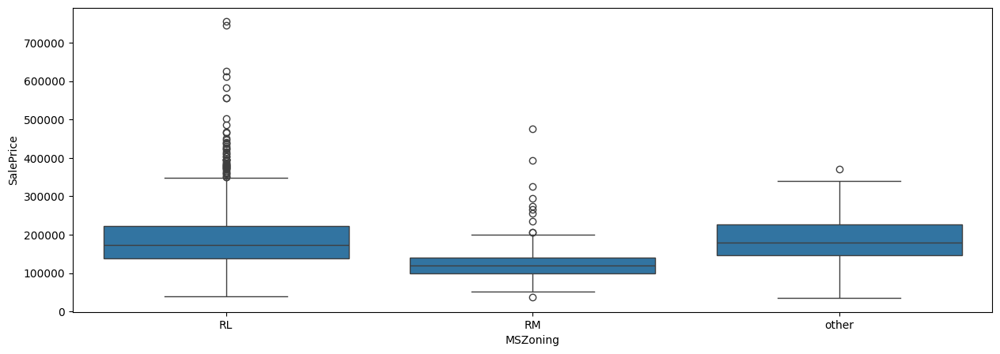

In [30]:
print('Before')
cat_eda('MSZoning')
print()

grouping_logic = ((dataset_df['MSZoning']!='RL') & (dataset_df['MSZoning']!='RM'))
dataset_df.loc[grouping_logic,'MSZoning'] = 'other'

print('After')
cat_eda('MSZoning')

##### Street Column

As per the EDA, dropping the column since 99 percent dominated by a single category

In [31]:
dataset_df = dataset_df.drop(columns=["Street"])

##### LotShape Column

Before
  LotShape   Id  rank
3      Reg  924   4.0
0      IR1  477   3.0
1      IR2   35   2.0
2      IR3    8   1.0


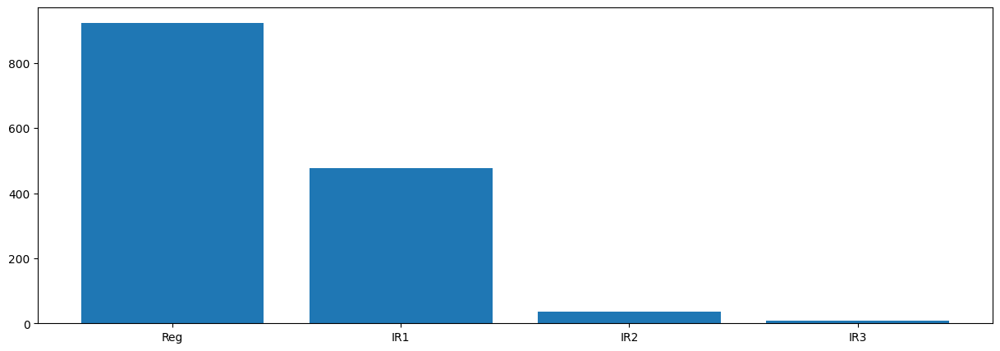

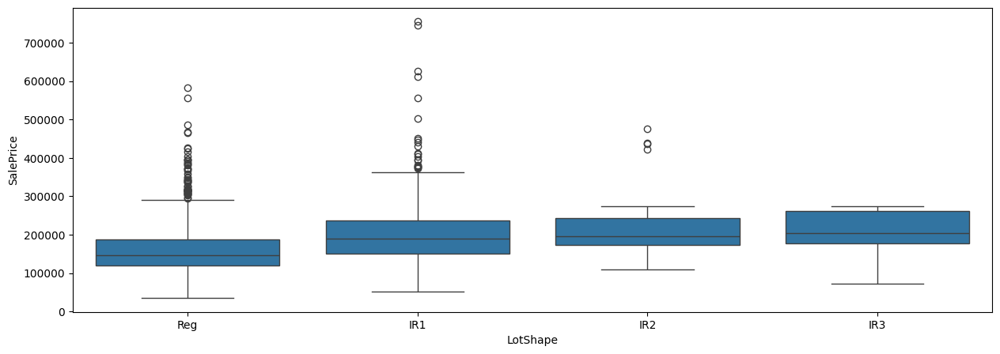


After
  LotShape   Id  rank
1      Reg  924   3.0
0      IR1  477   2.0
2    other   43   1.0


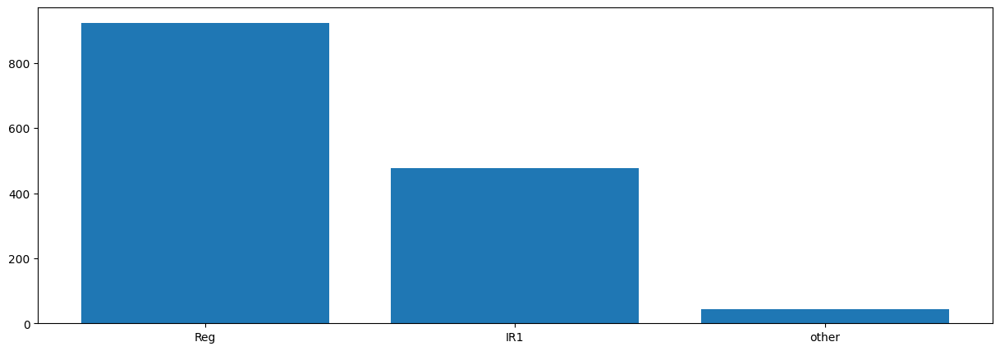

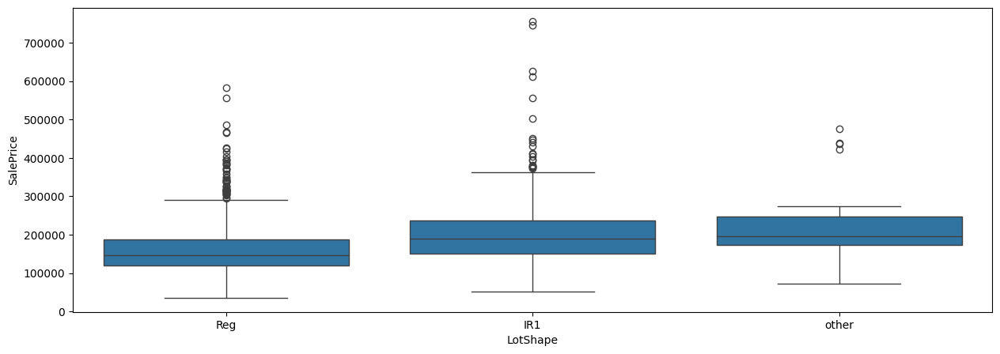

In [32]:
print('Before')
cat_eda('LotShape')
print()

grouping_logic = ((dataset_df['LotShape']!='Reg') & (dataset_df['LotShape']!='IR1'))
dataset_df.loc[grouping_logic,'LotShape'] = 'other'

print('After')
cat_eda('LotShape')

##### LandContour Column

As per the EDA, dropping the column since the categories have the same distribution

In [33]:
dataset_df = dataset_df.drop(columns=["LandContour"])

##### Utilities Column

As per the EDA, dropping the column since 99 percent dominated by a single category

In [34]:
dataset_df = dataset_df.drop(columns=["Utilities"])

##### LotConfig Column

As per the EDA, dropping the column since 99 percent dominated by a single category

In [35]:
dataset_df = dataset_df.drop(columns=["LotConfig"])

##### LandSlope Column

As per the EDA, dropping the column since the categories have the same distribution

In [36]:
dataset_df = dataset_df.drop(columns=["LandSlope"])

##### Neighborhood Column

Looking at the both the rank bar plot and box plot for the same, we see that there is significant distribution difference in the categories "NridgHt" and "NoRidge". So keeping the first 3 top categories along with these 2 categories mentioned, and grouping everything to the "others" category

Before
   Neighborhood   Id  rank
12        NAmes  225  25.0
5       CollgCr  150  24.0
17      OldTown  113  23.0
7       Edwards   98  22.0
21      Somerst   86  21.0
8       Gilbert   79  20.0
16      NridgHt   77  19.0
19       Sawyer   74  18.0
14       NWAmes   73  17.0
20      SawyerW   59  16.0
3       BrkSide   58  15.0
6       Crawfor   51  14.0
11      Mitchel   49  13.0
15      NoRidge   40  12.0
9        IDOTRR   37  11.0
23       Timber   34  10.0
18        SWISU   25   9.0
22      StoneBr   24   8.0
4       ClearCr   21   7.0
0       Blmngtn   17   5.5
10      MeadowV   17   5.5
2        BrDale   16   4.0
24      Veenker   10   3.0
13      NPkVill    9   2.0
1       Blueste    2   1.0


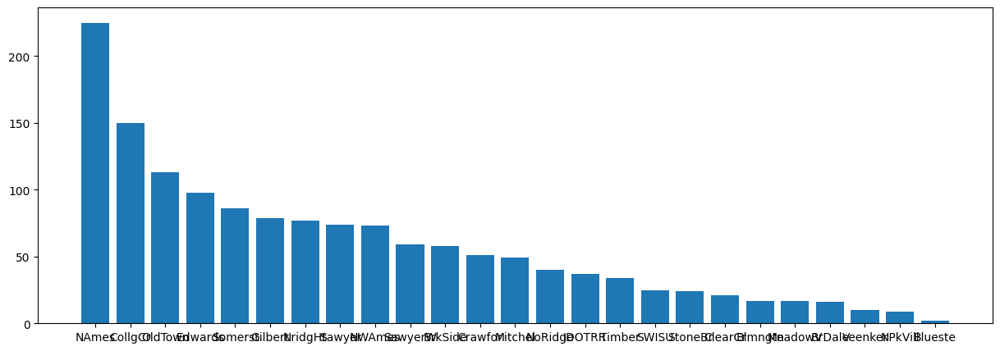

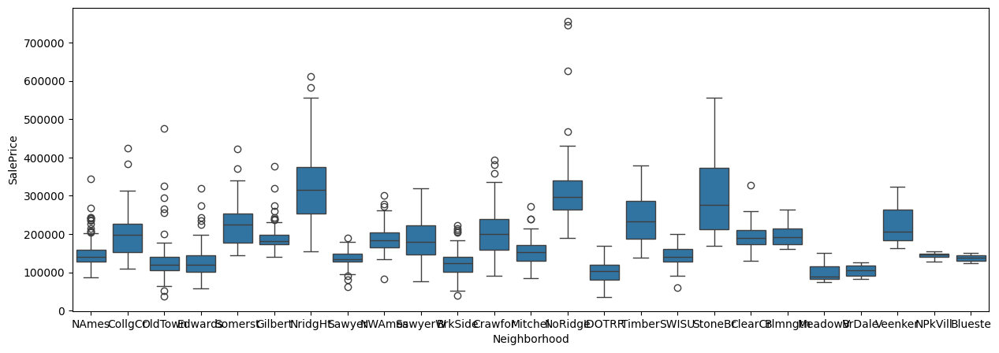


After
  Neighborhood   Id  rank
5        other  839   6.0
1        NAmes  225   5.0
0      CollgCr  150   4.0
4      OldTown  113   3.0
3      NridgHt   77   2.0
2      NoRidge   40   1.0


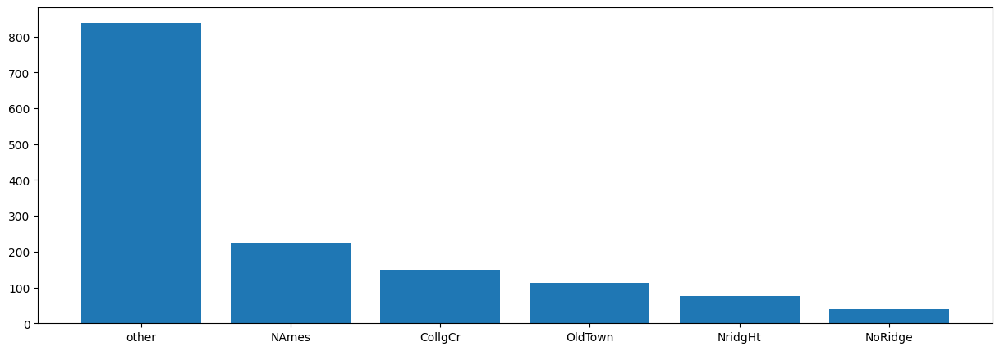

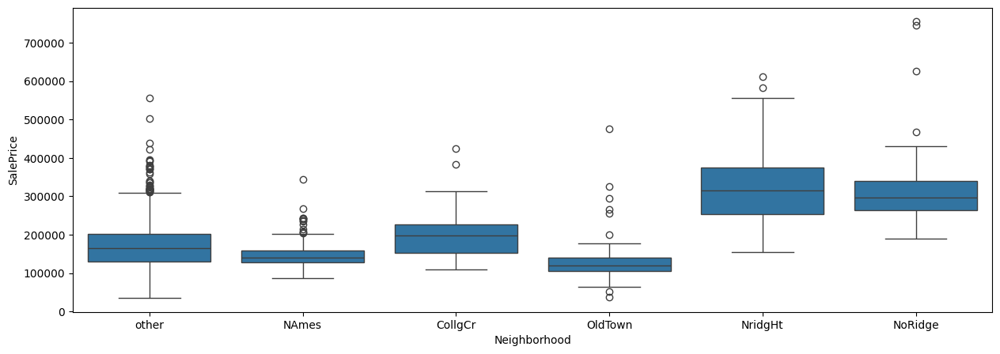

In [37]:
print('Before')
cat_eda('Neighborhood')
print()

grouping_logic = ((dataset_df['Neighborhood']!='NAmes') & (dataset_df['Neighborhood']!='CollgCr') \
                  & (dataset_df['Neighborhood']!='OldTown') & (dataset_df['Neighborhood']!='NridgHt') & (dataset_df['Neighborhood']!='NoRidge') )
dataset_df.loc[grouping_logic,'Neighborhood'] = 'other'

print('After')
cat_eda('Neighborhood')

##### Condition1 Column

Before
  Condition1    Id  rank
2       Norm  1247   9.0
1      Feedr    79   8.0
0     Artery    48   7.0
6       RRAn    26   6.0
4       PosN    18   5.0
5       RRAe    11   4.0
3       PosA     8   3.0
8       RRNn     5   2.0
7       RRNe     2   1.0


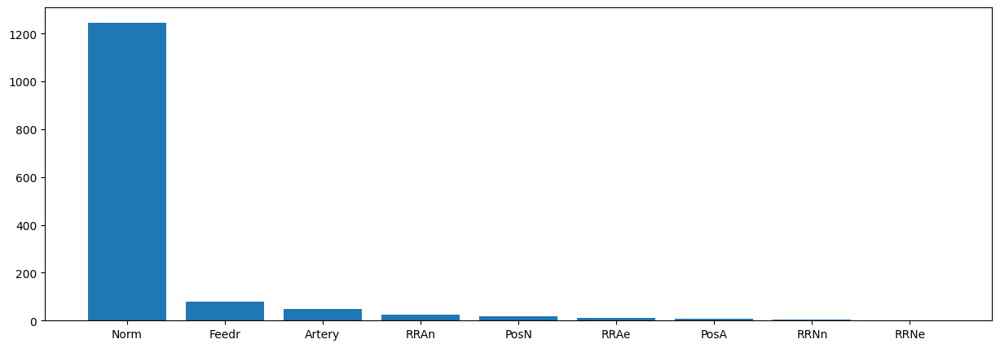

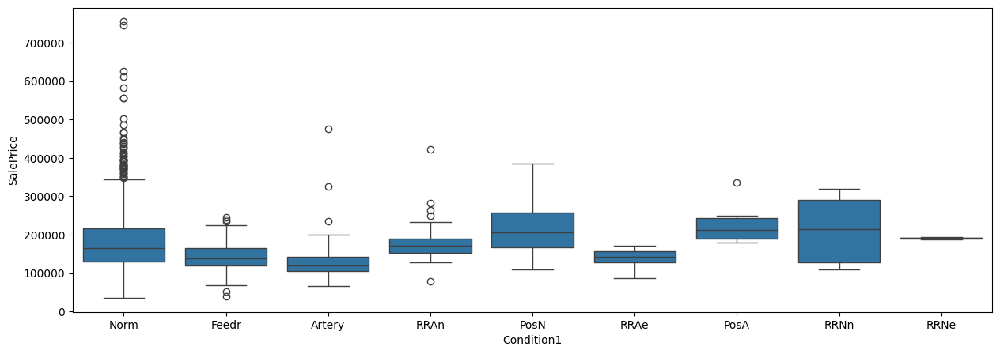


After
  Condition1    Id  rank
0       Norm  1247   2.0
1      other   197   1.0


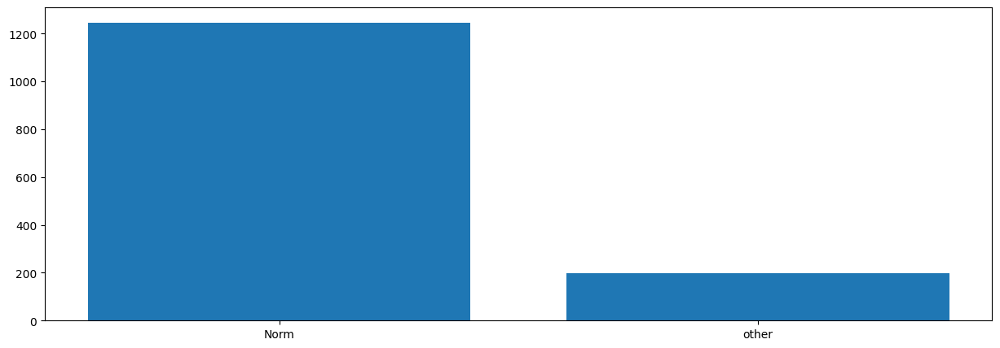

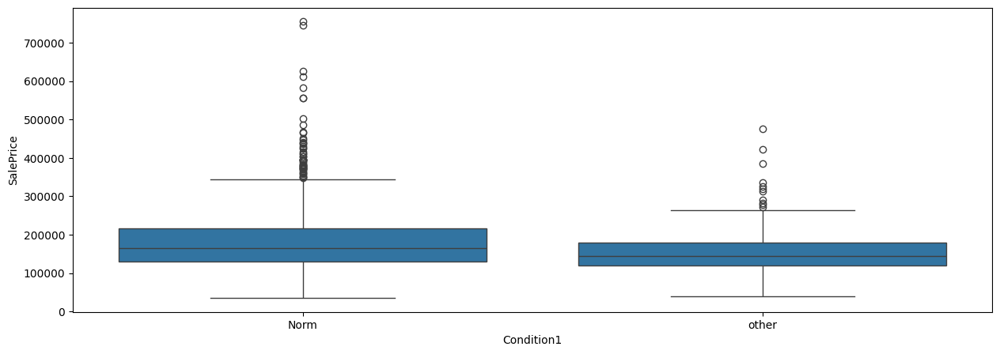

In [38]:
print('Before')
cat_eda('Condition1')
print()

grouping_logic = ((dataset_df['Condition1']!='Norm') )
dataset_df.loc[grouping_logic,'Condition1'] = 'other'

print('After')
cat_eda('Condition1')

##### Condition2 Column

Doing EDA on the same column, we found that almost 99 percent of the category is normal. That means this column is useless. So dropping it.

In [39]:
dataset_df = dataset_df.drop(columns=['Condition2'])

##### BldgType Column

Before
  BldgType    Id  rank
0     1Fam  1205   5.0
4   TwnhsE   114   4.0
2   Duplex    52   3.0
3    Twnhs    43   2.0
1   2fmCon    30   1.0


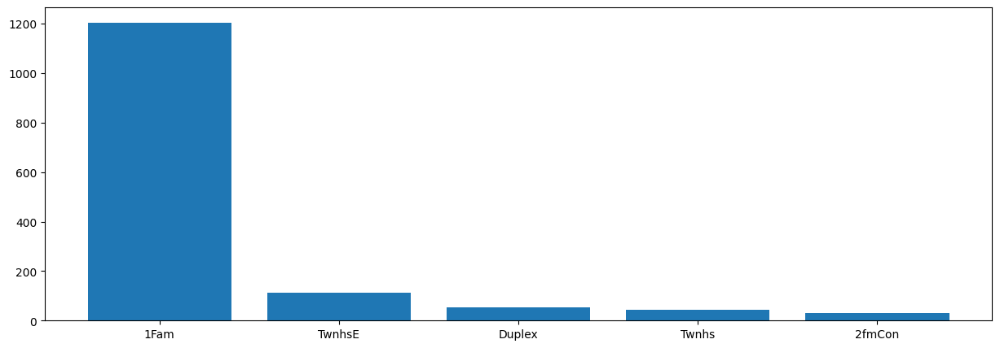

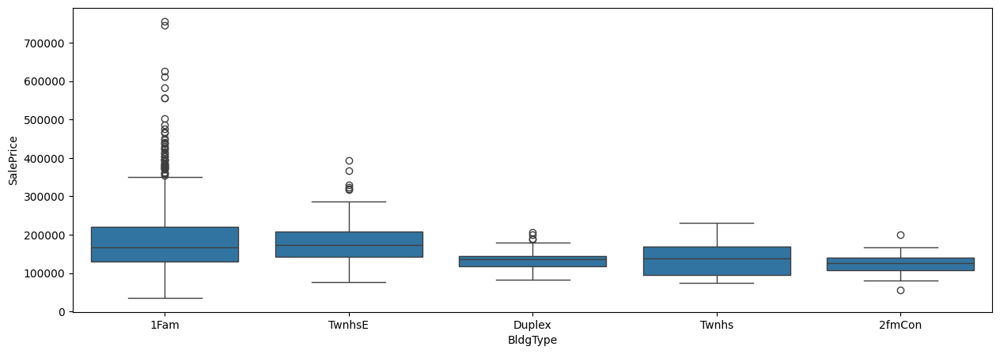


After
  BldgType    Id  rank
0     1Fam  1205   3.0
2    other   125   2.0
1   TwnhsE   114   1.0


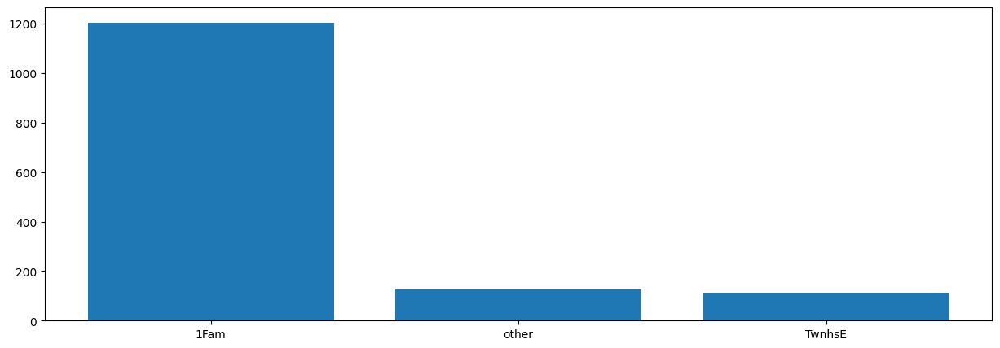

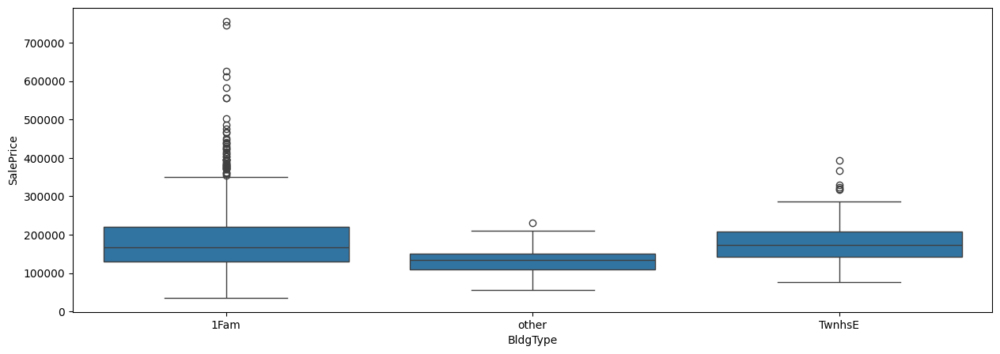

In [40]:
print('Before')
cat_eda('BldgType')
print()

grouping_logic = ((dataset_df['BldgType']!='1Fam') & (dataset_df['BldgType']!='TwnhsE') )
dataset_df.loc[grouping_logic,'BldgType'] = 'other'

print('After')
cat_eda('BldgType')

##### HouseStyle Column

Before
  HouseStyle   Id  rank
2     1Story  719   8.0
5     2Story  440   7.0
0     1.5Fin  151   6.0
7       SLvl   64   5.0
6     SFoyer   37   4.0
1     1.5Unf   14   3.0
4     2.5Unf   11   2.0
3     2.5Fin    8   1.0


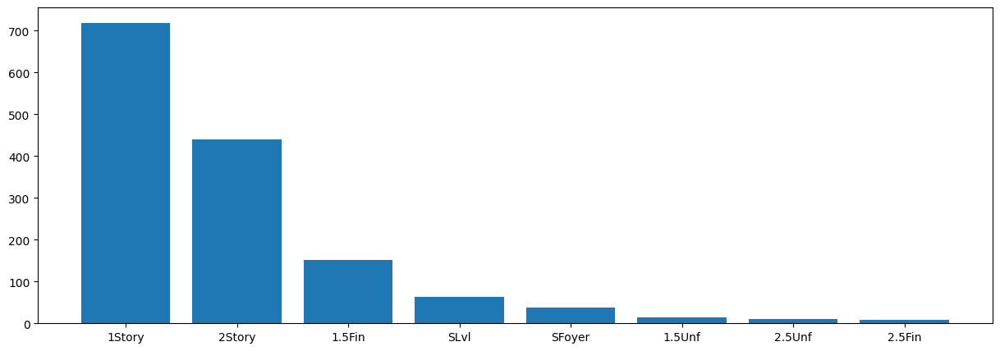

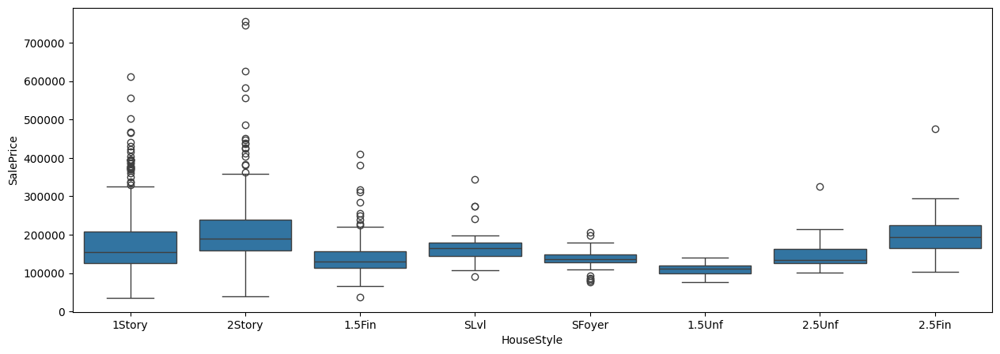


After
  HouseStyle   Id  rank
0     1Story  719   3.0
1     2Story  440   2.0
2      other  285   1.0


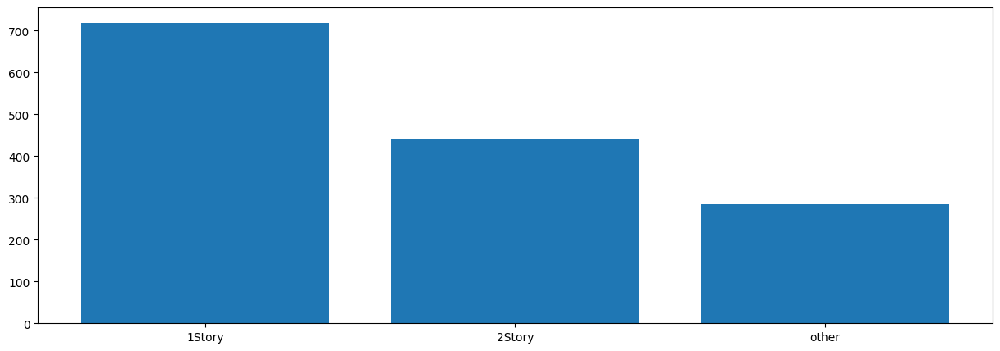

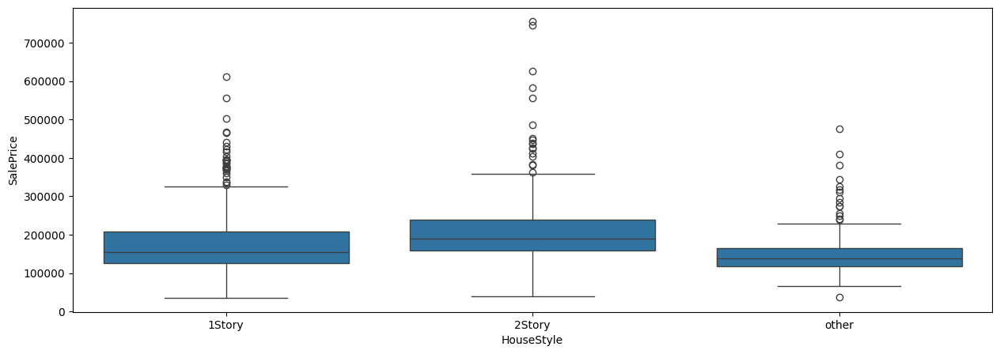

In [41]:
print('Before')
cat_eda('HouseStyle')
print()

grouping_logic = ((dataset_df['HouseStyle']!='1Story') & (dataset_df['HouseStyle']!='2Story') )
dataset_df.loc[grouping_logic,'HouseStyle'] = 'other'

print('After')
cat_eda('HouseStyle')

##### RoofStyle Column

Before
  RoofStyle    Id  rank
1     Gable  1132   6.0
3       Hip   281   5.0
0      Flat    11   3.5
2   Gambrel    11   3.5
4   Mansard     7   2.0
5      Shed     2   1.0


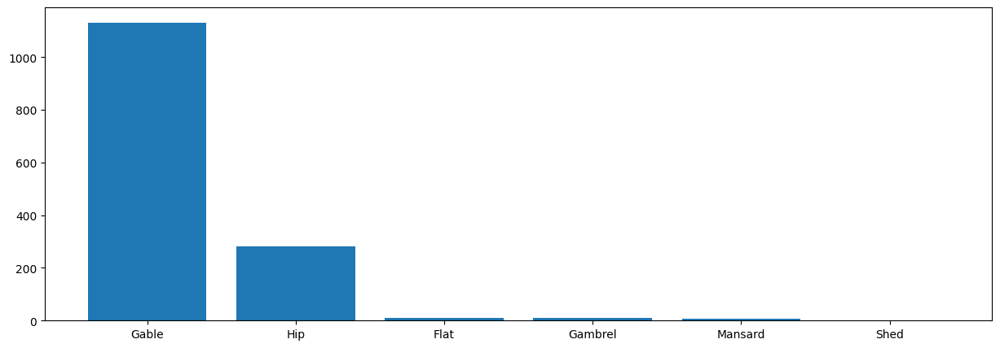

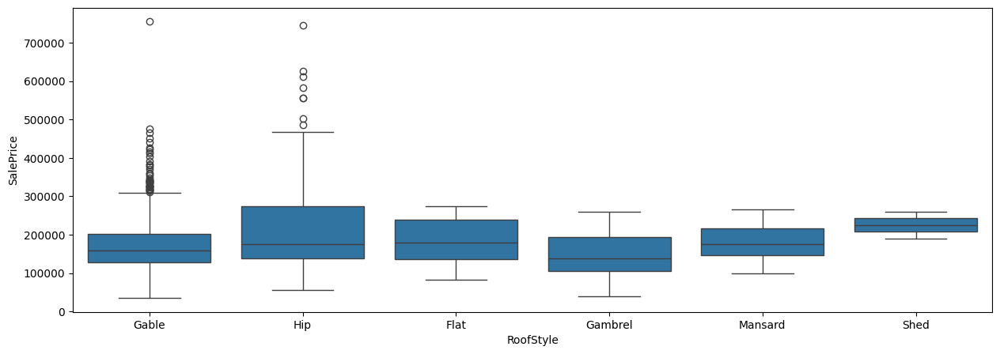


After
  RoofStyle    Id  rank
0     Gable  1132   3.0
1       Hip   281   2.0
2     other    31   1.0


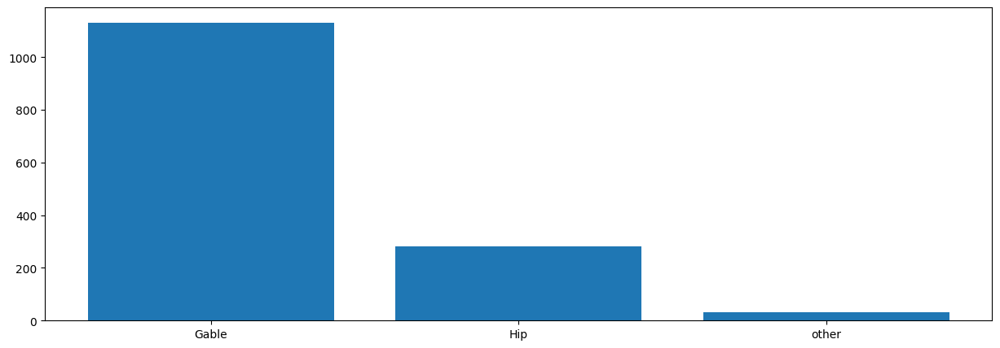

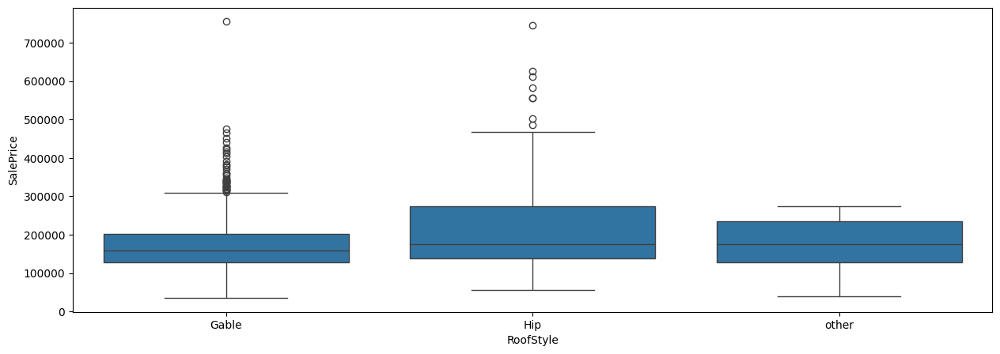

In [42]:
print('Before')
cat_eda('RoofStyle')
print()

grouping_logic = ((dataset_df['RoofStyle']!='Gable') & (dataset_df['RoofStyle']!='Hip') )
dataset_df.loc[grouping_logic,'RoofStyle'] = 'other'

print('After')
cat_eda('RoofStyle')

##### RoofMatl Column

More than 99 percent of the data is 'CompShg' category. So, this column is not that useful. So, dropping the same.

In [43]:
dataset_df = dataset_df.drop(columns=['RoofMatl'])

##### Exterior1st Column

Going by the EDA of the same, grouping "HdBoard", "MetalSd", and "Wd Sdng" into "HdBoard_MetalSd_WdSdng" category because of their similar count and distribution. And grouping the other categories with lesser count in "others".

Before
   Exterior1st   Id  rank
12     VinylSd  513  15.0
6      HdBoard  221  14.0
8      MetalSd  220  13.0
13     Wd Sdng  203  12.0
9      Plywood  103  11.0
5      CemntBd   59  10.0
3      BrkFace   49   9.0
14     WdShing   25   8.0
11      Stucco   24   7.0
0      AsbShng   20   6.0
2      BrkComm    2   4.5
10       Stone    2   4.5
1      AsphShn    1   2.0
4       CBlock    1   2.0
7      ImStucc    1   2.0


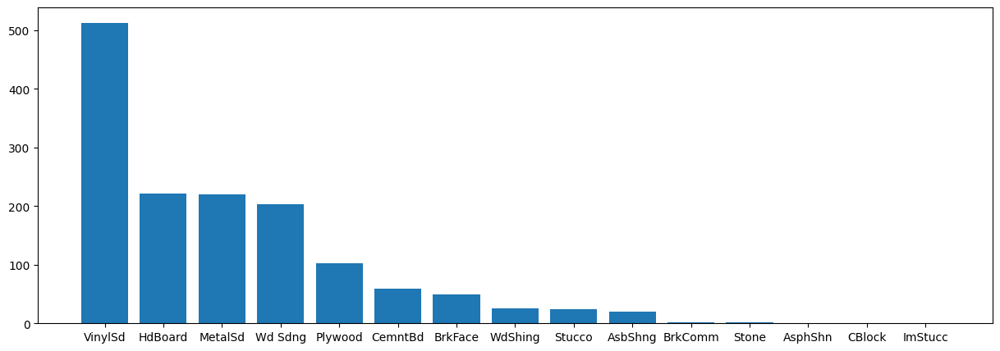

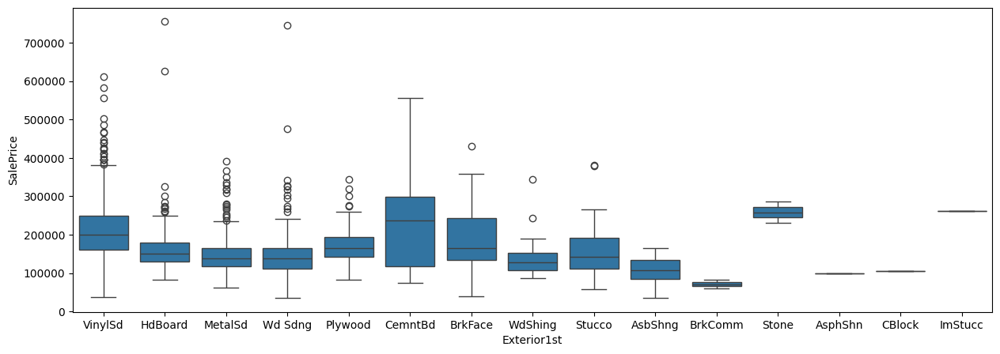


After
              Exterior1st   Id  rank
0  HdBoard_MetalSd_WdSdng  644   3.0
1                 VinylSd  513   2.0
2                   other  287   1.0


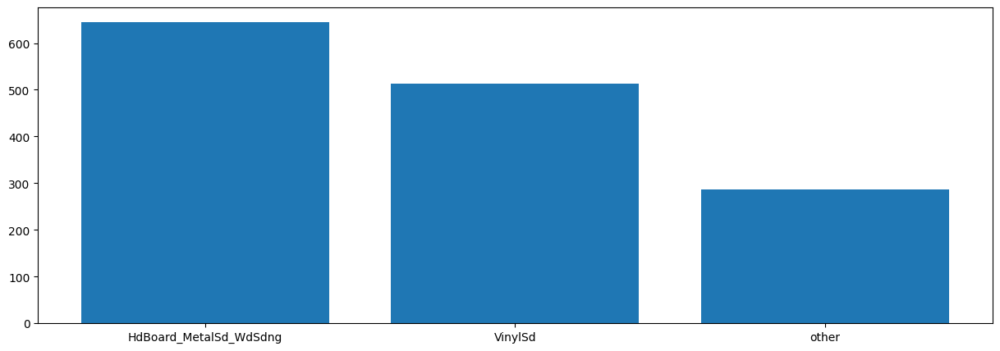

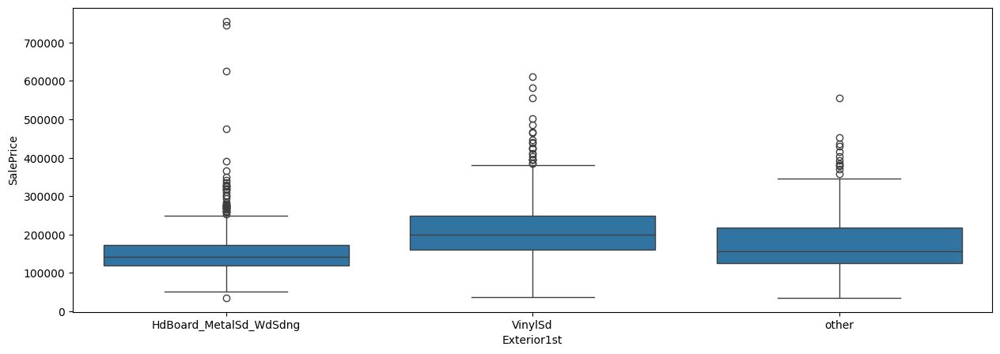

In [44]:
print('Before')
cat_eda('Exterior1st')
print()

grouping_logic = ((dataset_df['Exterior1st']!='VinylSd') & (dataset_df['Exterior1st']!='HdBoard') \
                  & (dataset_df['Exterior1st']!='MetalSd') & (dataset_df['Exterior1st']!='Wd Sdng') )
dataset_df.loc[grouping_logic,'Exterior1st'] = 'other'

grouping_logic = ((dataset_df['Exterior1st']!='VinylSd') & (dataset_df['Exterior1st']!='other') )
dataset_df.loc[grouping_logic,'Exterior1st'] = 'HdBoard_MetalSd_WdSdng'

print('After')
cat_eda('Exterior1st')

##### Exterior2nd Column

Same thing as Exterior1st

Before
   Exterior2nd   Id  rank
13     VinylSd  502  16.0
8      MetalSd  214  15.0
6      HdBoard  205  14.0
14     Wd Sdng  195  13.0
10     Plywood  137  12.0
5      CmentBd   59  11.0
15     Wd Shng   36  10.0
12      Stucco   25   9.0
3      BrkFace   24   8.0
0      AsbShng   20   7.0
7      ImStucc   10   6.0
2      Brk Cmn    7   5.0
11       Stone    5   4.0
1      AsphShn    3   3.0
4       CBlock    1   1.5
9        Other    1   1.5


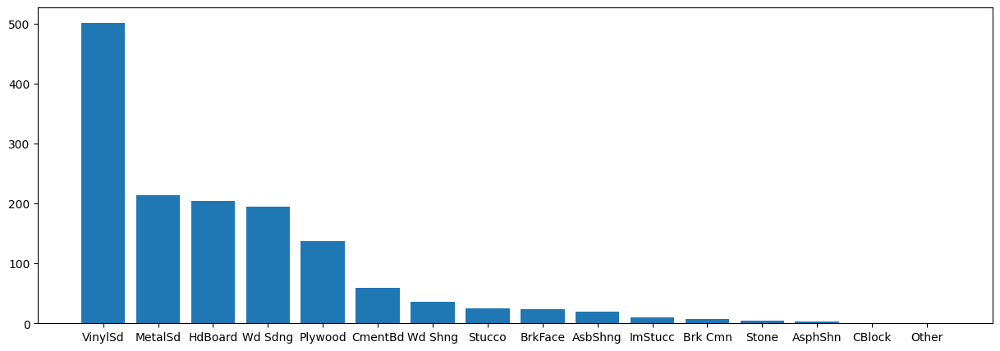

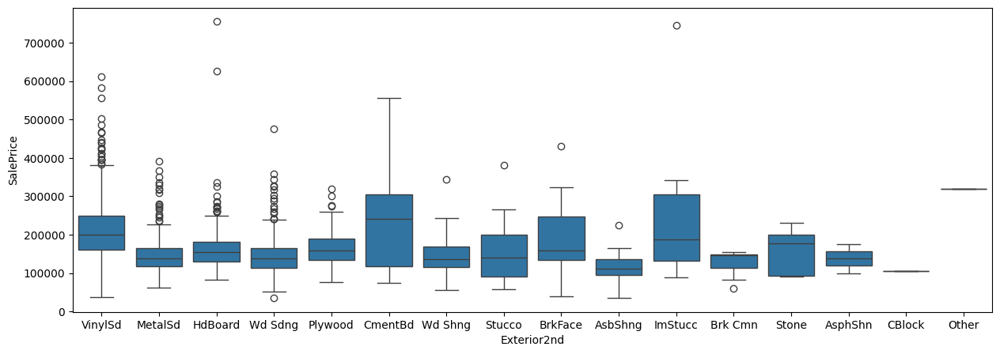


After
              Exterior2nd   Id  rank
0  HdBoard_MetalSd_WdSdng  614   3.0
1                 VinylSd  502   2.0
2                   other  328   1.0


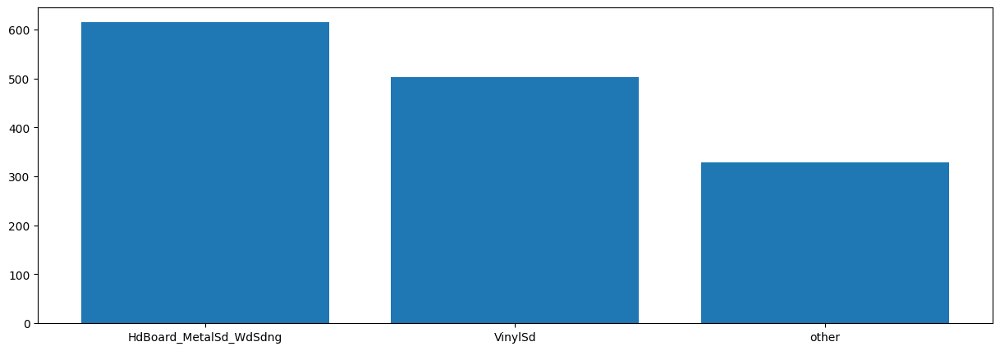

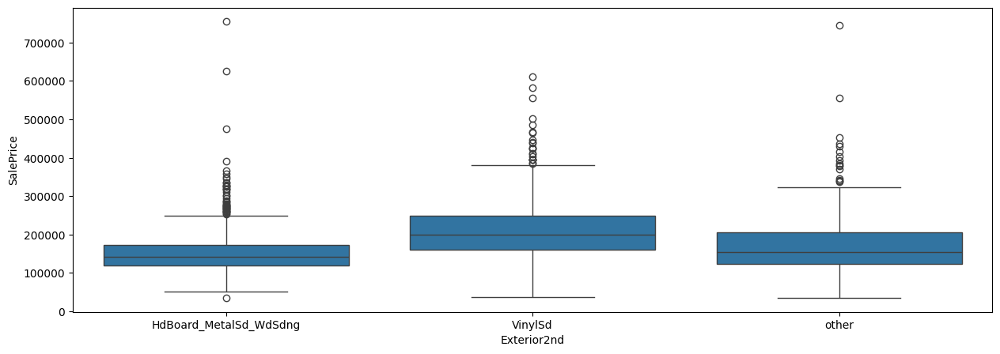

In [45]:
print('Before')
cat_eda('Exterior2nd')
print()

grouping_logic = ((dataset_df['Exterior2nd']!='VinylSd') & (dataset_df['Exterior2nd']!='HdBoard') \
                  & (dataset_df['Exterior2nd']!='MetalSd') & (dataset_df['Exterior2nd']!='Wd Sdng') )
dataset_df.loc[grouping_logic,'Exterior2nd'] = 'other'

grouping_logic = ((dataset_df['Exterior2nd']!='VinylSd') & (dataset_df['Exterior2nd']!='other') )
dataset_df.loc[grouping_logic,'Exterior2nd'] = 'HdBoard_MetalSd_WdSdng'

print('After')
cat_eda('Exterior2nd')

##### MasVnrType Column

As per the EDA, grouping together "Non" and "BrkCmn"

Before
  MasVnrType   Id  rank
2        Non  862   4.0
1    BrkFace  443   3.0
3      Stone  125   2.0
0     BrkCmn   14   1.0


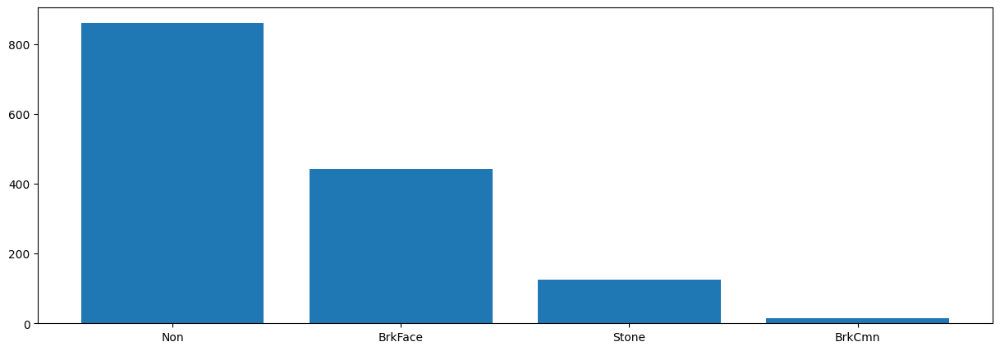

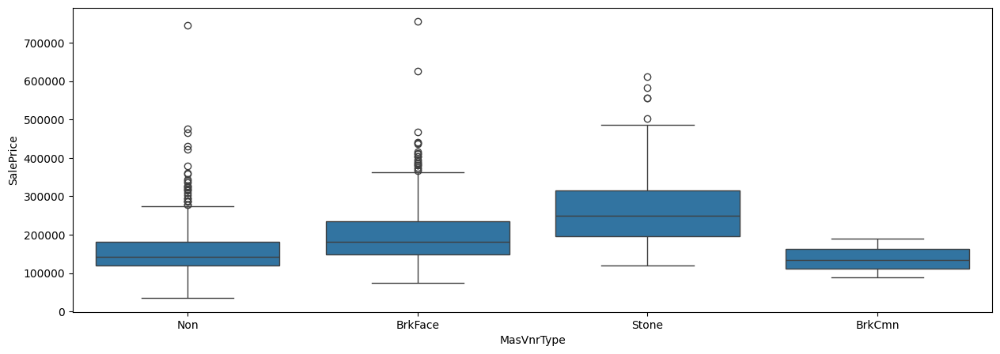


After
     MasVnrType   Id  rank
1  Non_r_BrkCmn  876   3.0
0       BrkFace  443   2.0
2         Stone  125   1.0


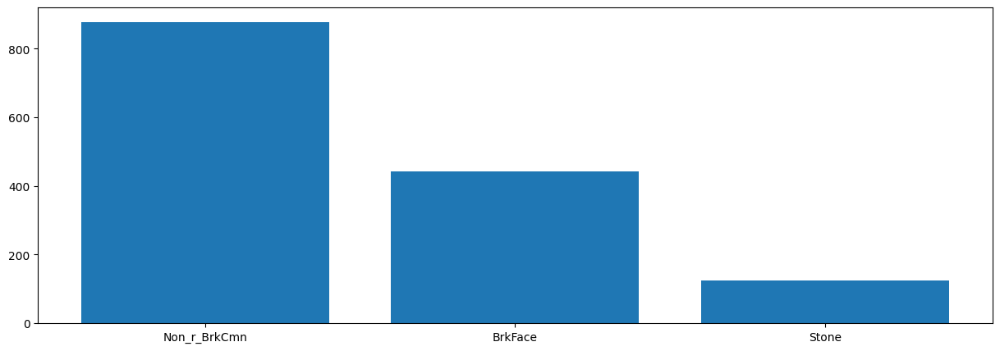

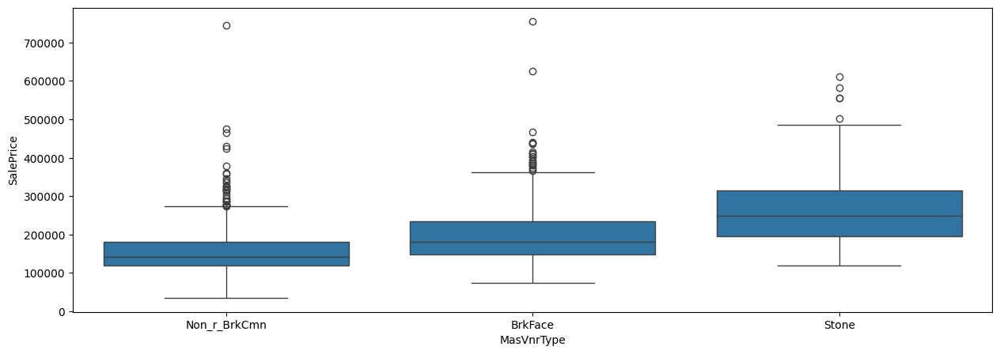

In [46]:
print('Before')
cat_eda('MasVnrType')
print()

grouping_logic = ((dataset_df['MasVnrType']!='BrkFace') & (dataset_df['MasVnrType']!='Stone') )
dataset_df.loc[grouping_logic,'MasVnrType'] = 'Non_r_BrkCmn'

print('After')
cat_eda('MasVnrType')

##### Foundation Column

Before
  Foundation   Id  rank
2      PConc  641   6.0
1     CBlock  625   5.0
0     BrkTil  145   4.0
3       Slab   24   3.0
4      Stone    6   2.0
5       Wood    3   1.0


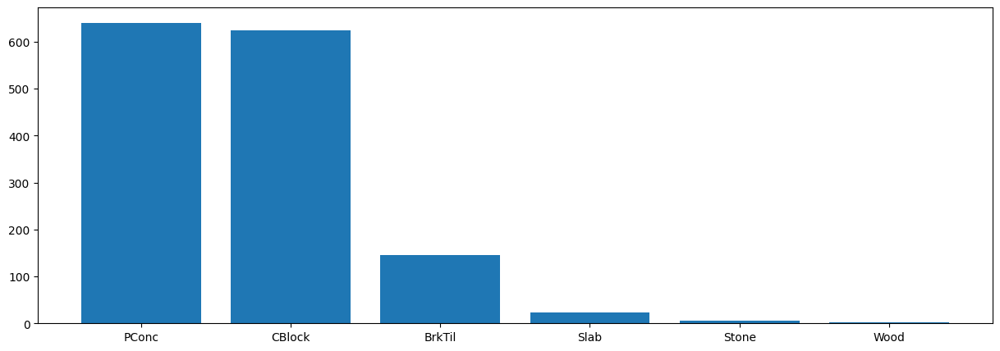

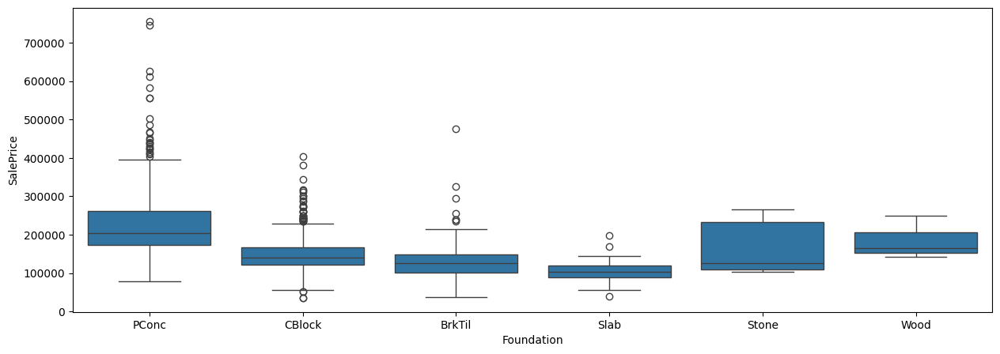


After
  Foundation   Id  rank
1      PConc  641   3.0
0     CBlock  625   2.0
2      other  178   1.0


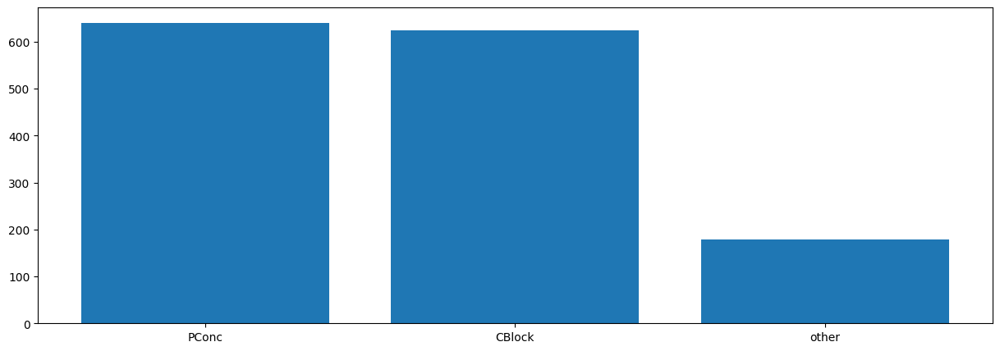

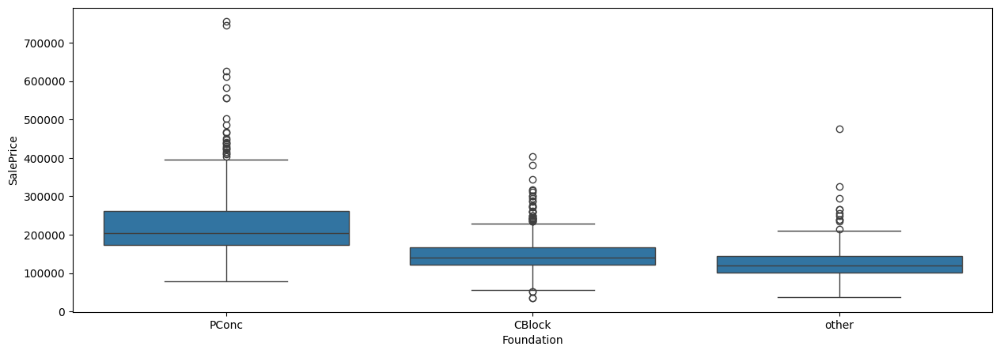

In [47]:
print('Before')
cat_eda('Foundation')
print()

grouping_logic = ((dataset_df['Foundation']!='PConc') & (dataset_df['Foundation']!='CBlock') )
dataset_df.loc[grouping_logic,'Foundation'] = 'other'

print('After')
cat_eda('Foundation')

##### Heating Column

Dropping the columns, because more than 99 percent of values is a single category

In [48]:
dataset_df = dataset_df.drop(columns=['Heating'])

##### Electrical Column

Before
  Electrical    Id  rank
4      SBrkr  1319   5.0
0      FuseA    94   4.0
1      FuseF    27   3.0
2      FuseP     3   2.0
3        Mix     1   1.0


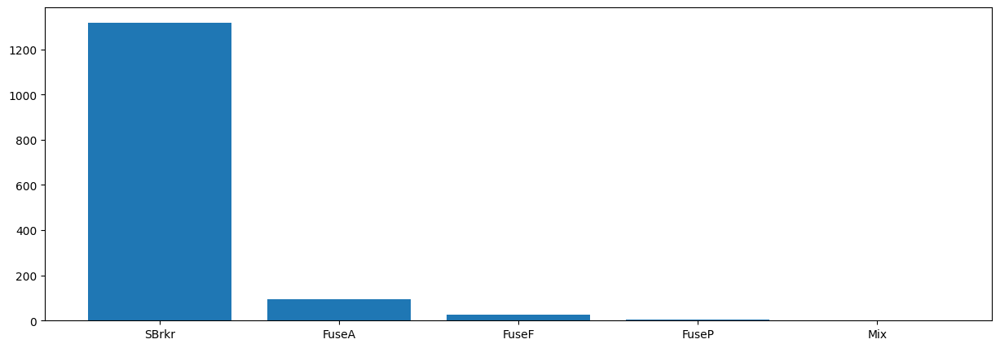

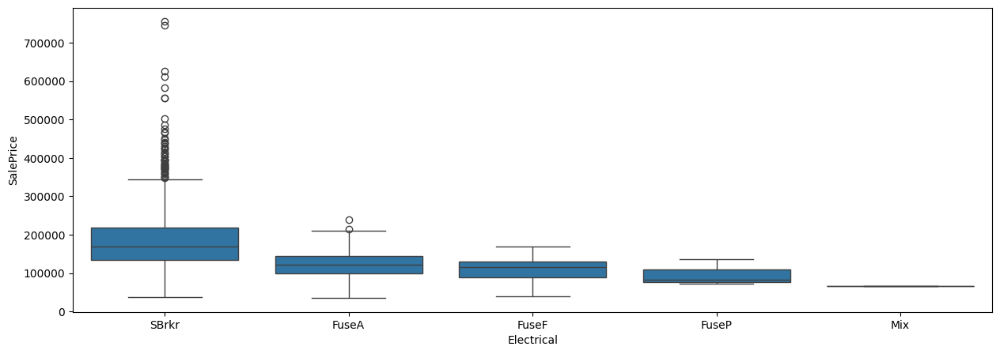


After
  Electrical    Id  rank
0      SBrkr  1319   2.0
1      other   125   1.0


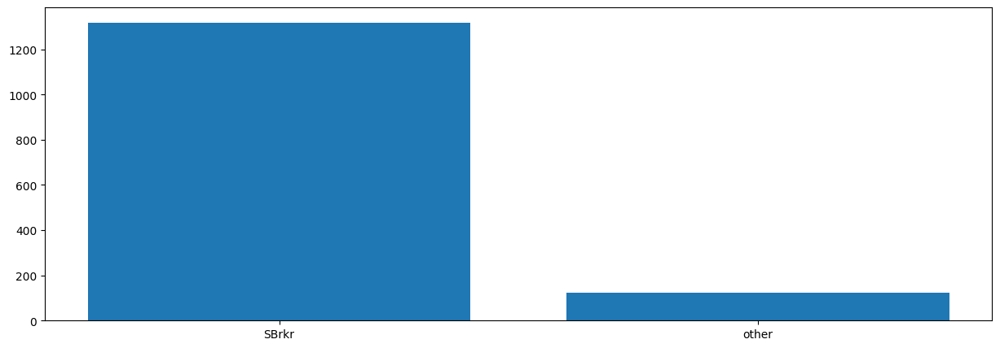

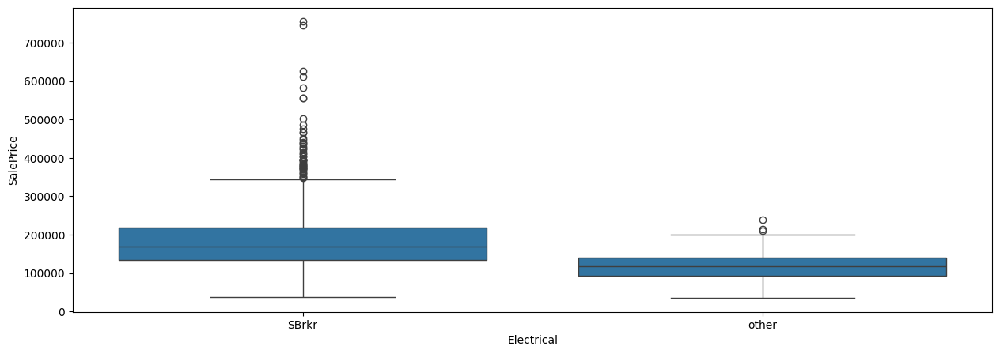

In [49]:
print('Before')
cat_eda('Electrical')
print()

grouping_logic = ((dataset_df['Electrical']!='SBrkr') )
dataset_df.loc[grouping_logic,'Electrical'] = 'other'

print('After')
cat_eda('Electrical')

##### Functional Column

Before
  Functional    Id  rank
6        Typ  1348   7.0
3       Min2    34   6.0
2       Min1    29   5.0
0       Maj1    14   4.0
4        Mod    13   3.0
1       Maj2     5   2.0
5        Sev     1   1.0


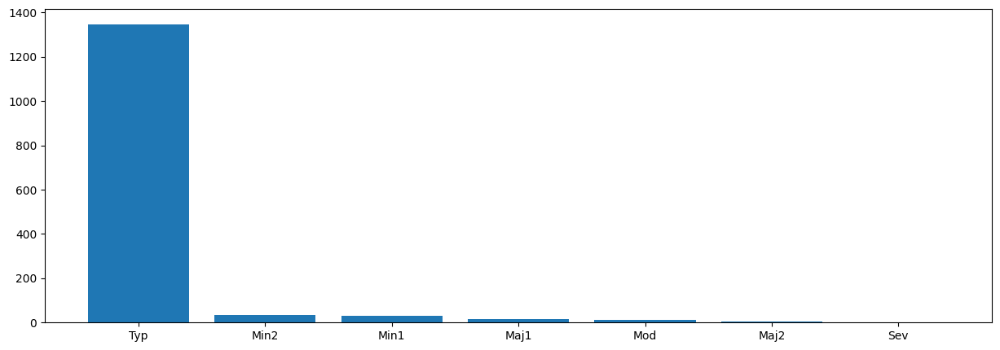

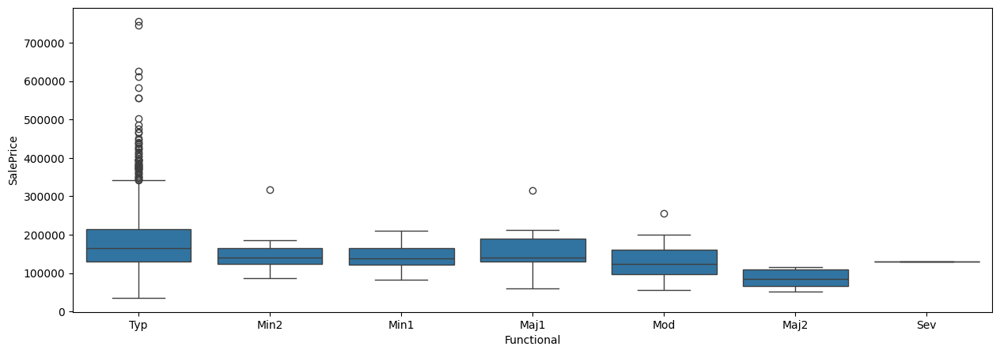


After
  Functional    Id  rank
0        Typ  1348   2.0
1      other    96   1.0


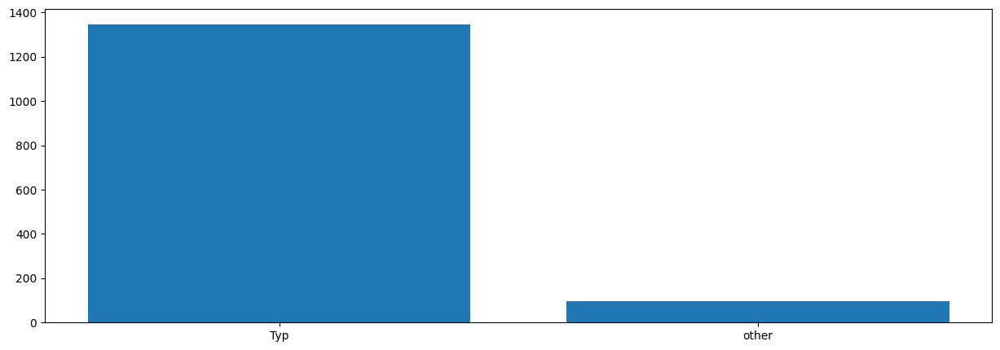

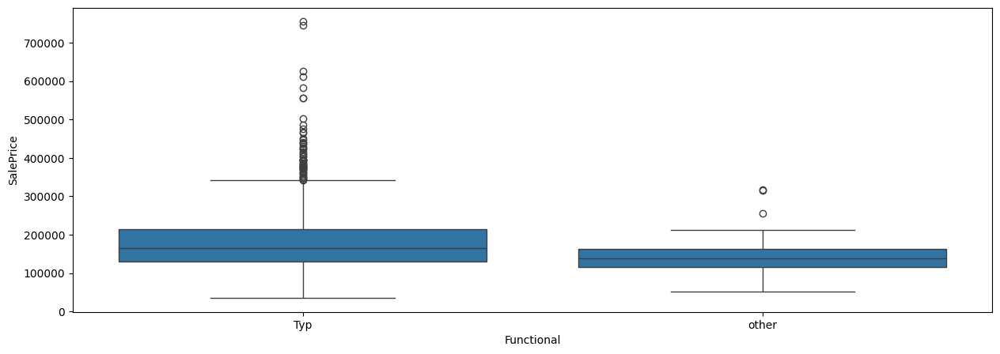

In [50]:
print('Before')
cat_eda('Functional')
print()

grouping_logic = ((dataset_df['Functional']!='Typ') )
dataset_df.loc[grouping_logic,'Functional'] = 'other'

print('After')
cat_eda('Functional')

##### GarageType Column

As per the EDA, grouping together "BuiltIn", "Basment", "CarPort", and "2Types" as "other"

Before
  GarageType   Id  rank
1     Attchd  859   7.0
5     Detchd  385   6.0
3    BuiltIn   85   5.0
6        Non   81   4.0
2    Basment   19   3.0
4    CarPort    9   2.0
0     2Types    6   1.0


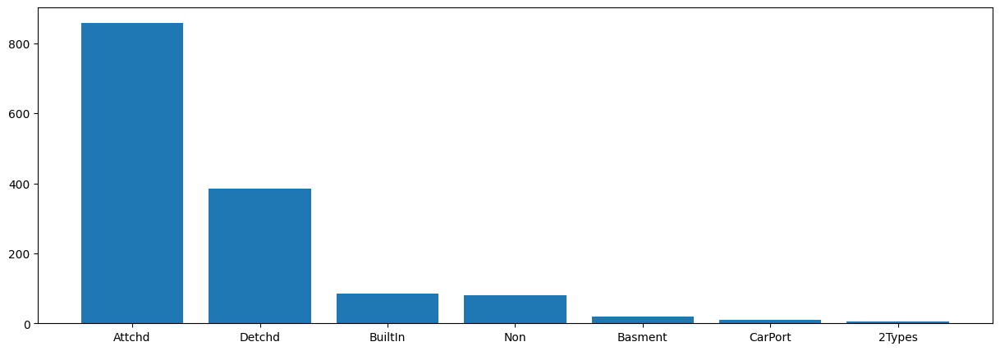

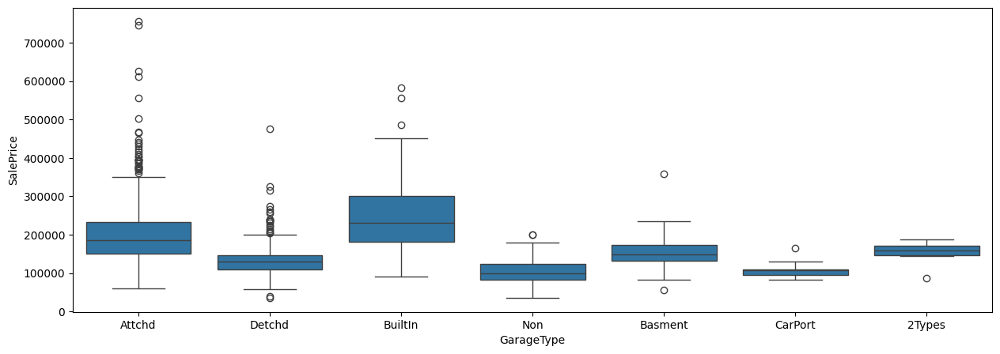


After
  GarageType   Id  rank
0     Attchd  859   4.0
1     Detchd  385   3.0
3      other  119   2.0
2        Non   81   1.0


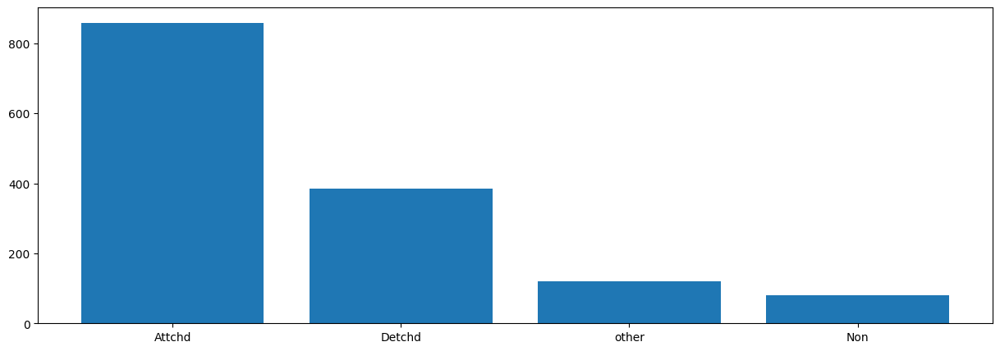

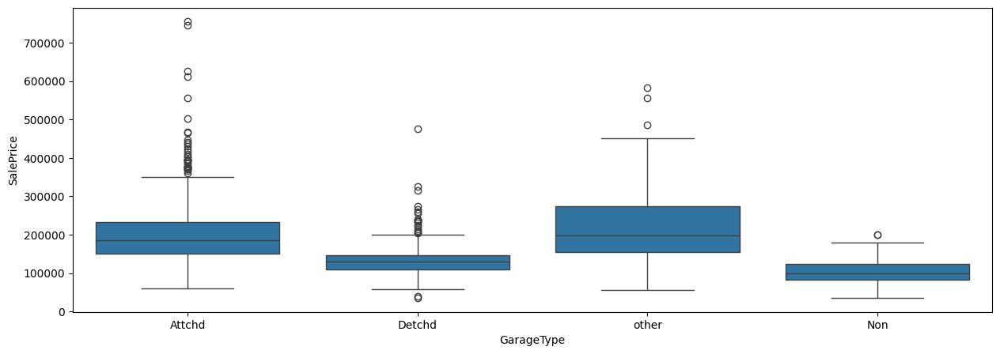

In [51]:
print('Before')
cat_eda('GarageType')
print()

grouping_logic = ((dataset_df['GarageType']!='Attchd') & (dataset_df['GarageType']!='Detchd')& (dataset_df['GarageType']!='Non') )
dataset_df.loc[grouping_logic,'GarageType'] = 'other'

print('After')
cat_eda('GarageType')

##### PavedDrive Column

As per the EDA, grouping together "N", and "P" as "N_r_P"

Before
  PavedDrive    Id  rank
2          Y  1325   3.0
0          N    89   2.0
1          P    30   1.0


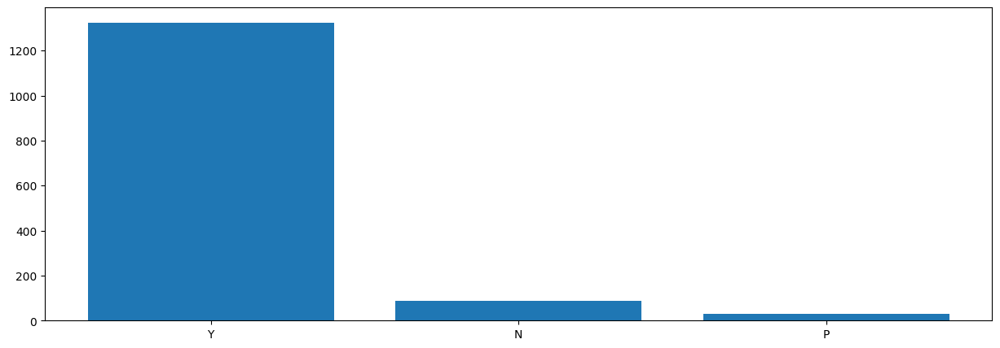

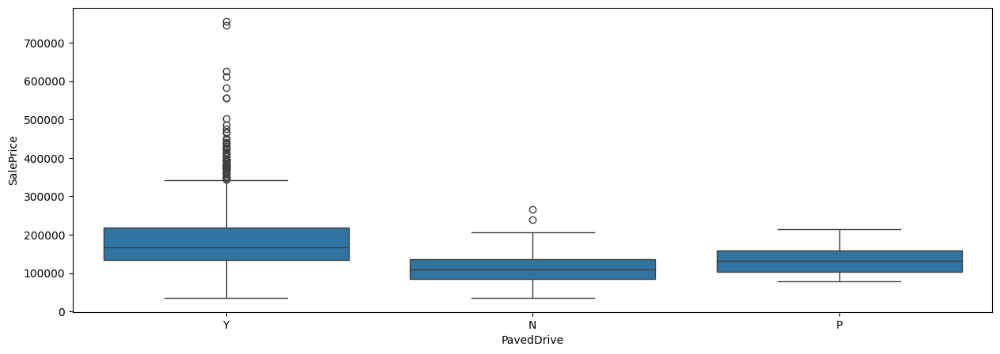


After
  PavedDrive    Id  rank
1          Y  1325   2.0
0      N_r_P   119   1.0


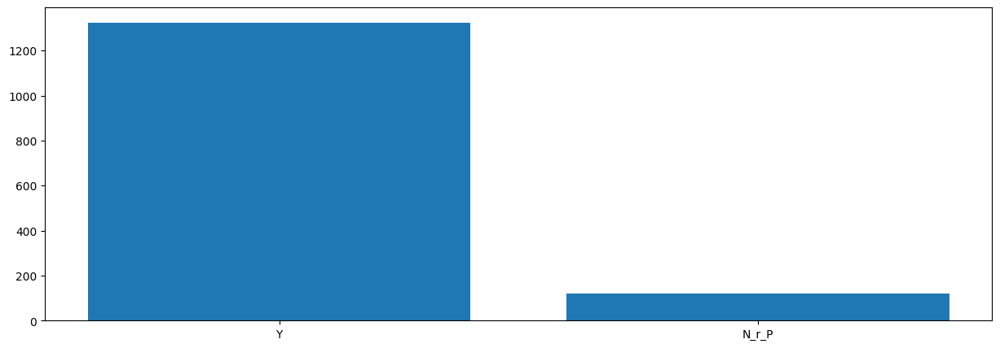

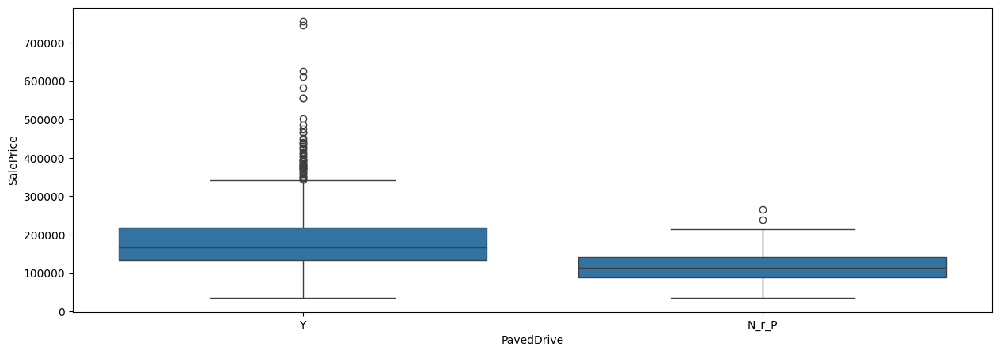

In [52]:
print('Before')
cat_eda('PavedDrive')
print()

grouping_logic = ((dataset_df['PavedDrive']!='Y'))
dataset_df.loc[grouping_logic,'PavedDrive'] = 'N_r_P'

print('After')
cat_eda('PavedDrive')

##### MiscFeature Column

As per the EDA, grouping together all valid categories into "Present"

Before
  MiscFeature    Id  rank
1         Non  1392   5.0
3        Shed    47   4.0
0        Gar2     2   2.5
2        Othr     2   2.5
4        TenC     1   1.0


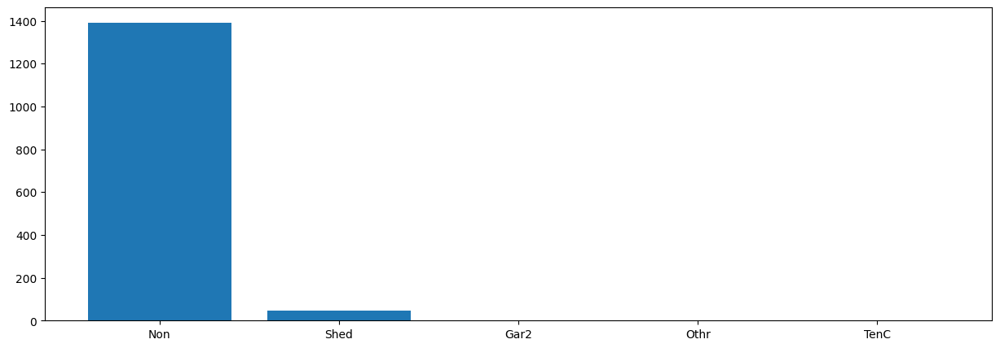

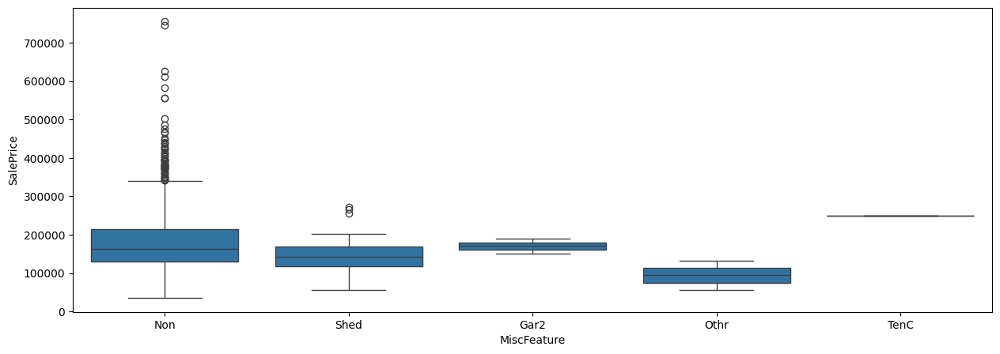


After
  MiscFeature    Id  rank
0         Non  1392   2.0
1     Present    52   1.0


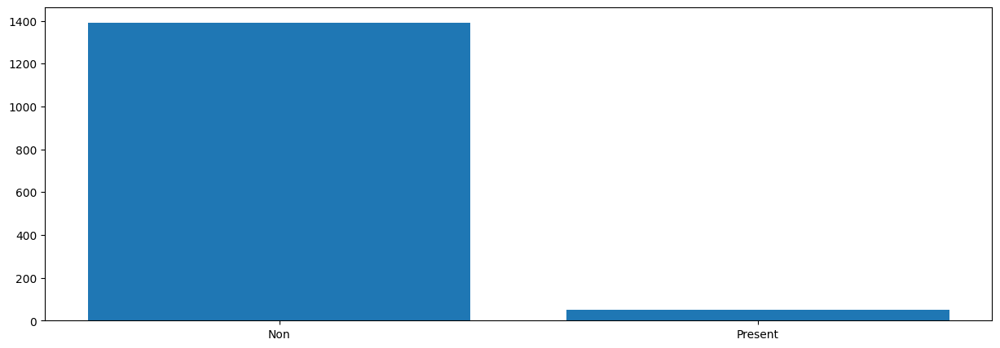

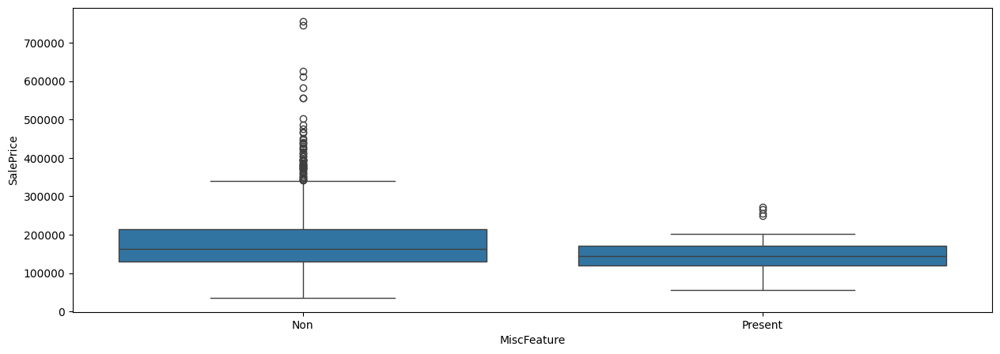

In [53]:
print('Before')
cat_eda('MiscFeature')
print()

grouping_logic = ((dataset_df['MiscFeature']!='Non'))
dataset_df.loc[grouping_logic,'MiscFeature'] = 'Present'

print('After')
cat_eda('MiscFeature')

##### SaleType Column

Before
  SaleType    Id  rank
8       WD  1253   9.0
6      New   120   8.0
0      COD    43   7.0
3    ConLD     9   6.0
4    ConLI     5   4.5
5    ConLw     5   4.5
1      CWD     4   3.0
7      Oth     3   2.0
2      Con     2   1.0


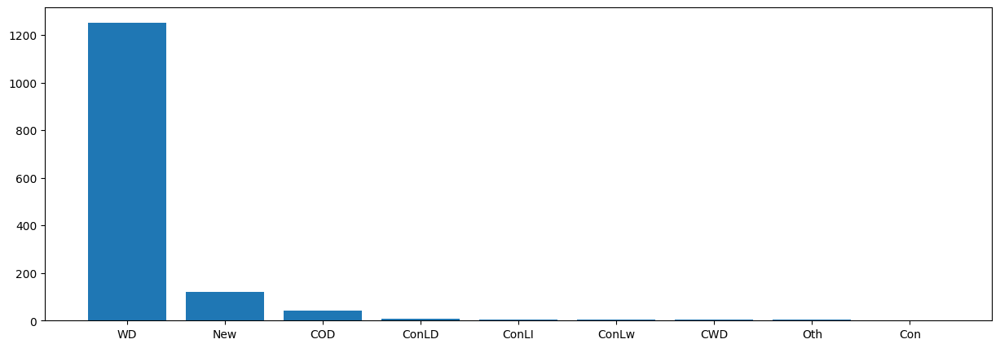

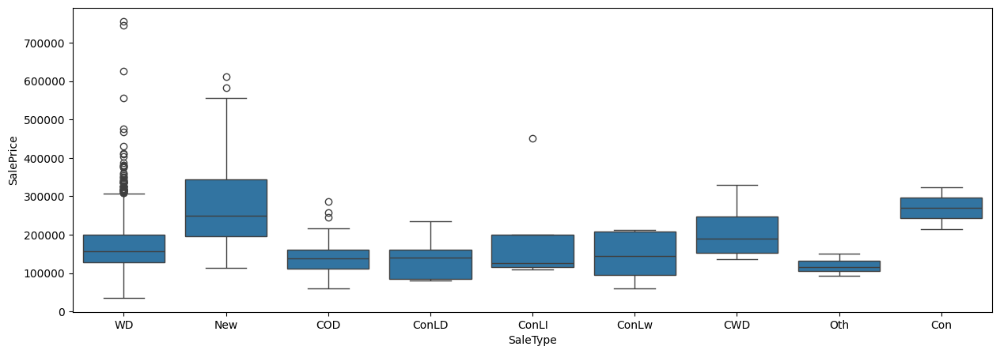


After
  SaleType    Id  rank
1       WD  1253   3.0
0      New   120   2.0
2    other    71   1.0


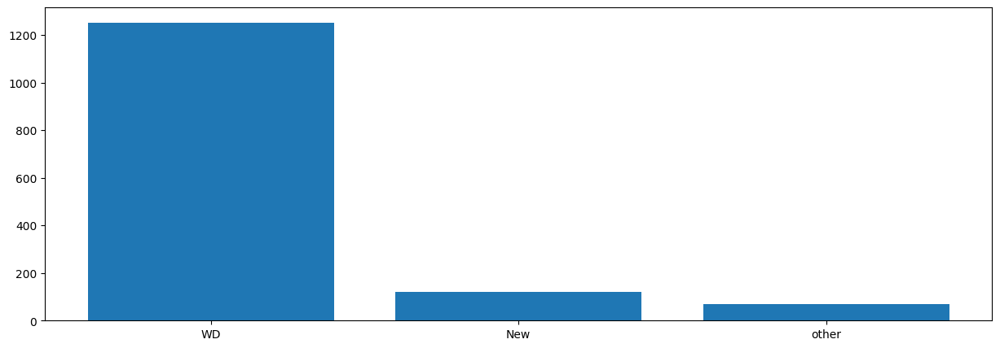

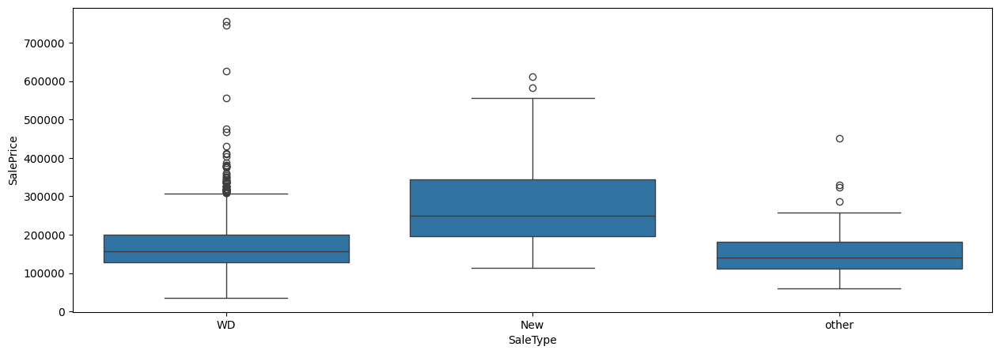

In [54]:
print('Before')
cat_eda('SaleType')
print()

grouping_logic = ((dataset_df['SaleType']!='WD') & (dataset_df['SaleType']!='New'))
dataset_df.loc[grouping_logic,'SaleType'] = 'other'

print('After')
cat_eda('SaleType')

##### SaleCondition Column

Before
  SaleCondition    Id  rank
4        Normal  1184   6.0
5       Partial   123   5.0
0       Abnorml   101   4.0
3        Family    20   3.0
2        Alloca    12   2.0
1       AdjLand     4   1.0


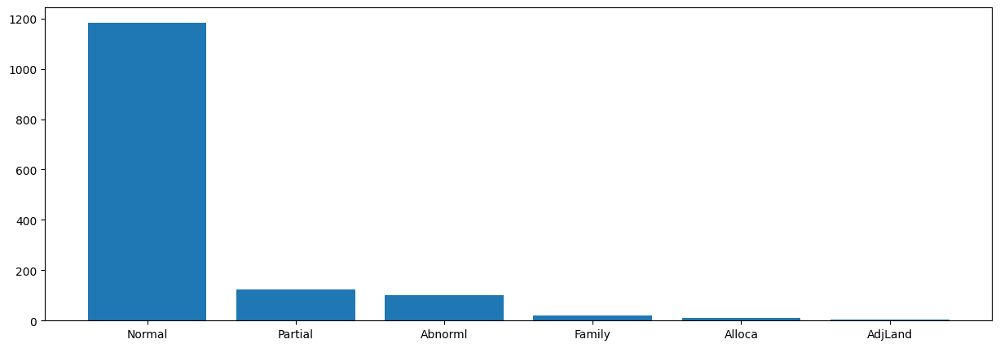

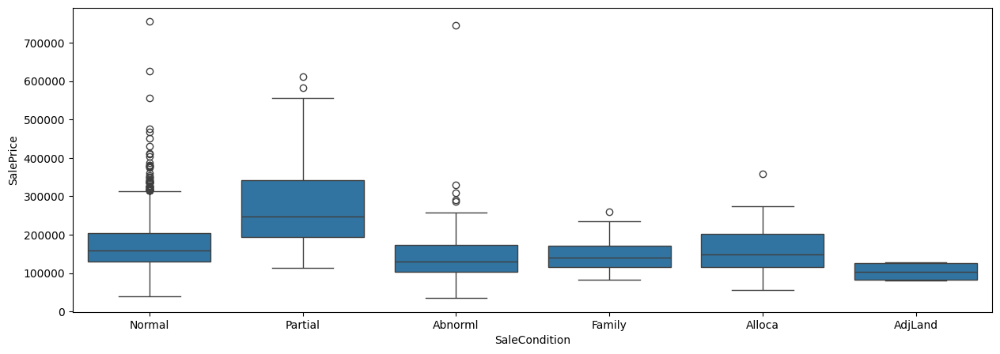


After
  SaleCondition    Id  rank
0        Normal  1184   3.0
2         other   137   2.0
1       Partial   123   1.0


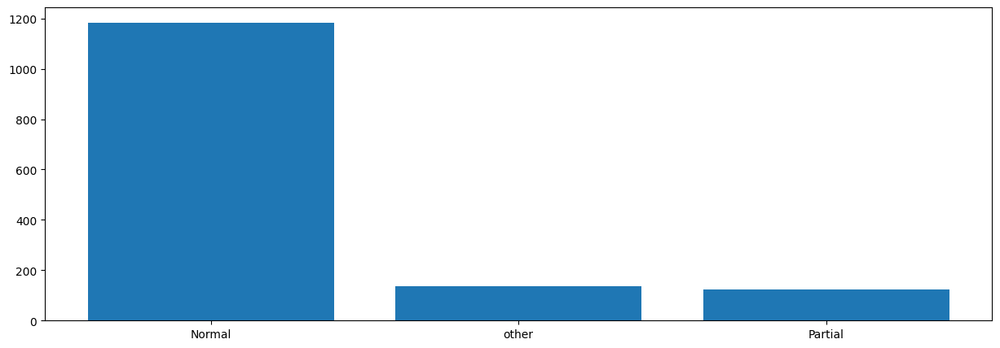

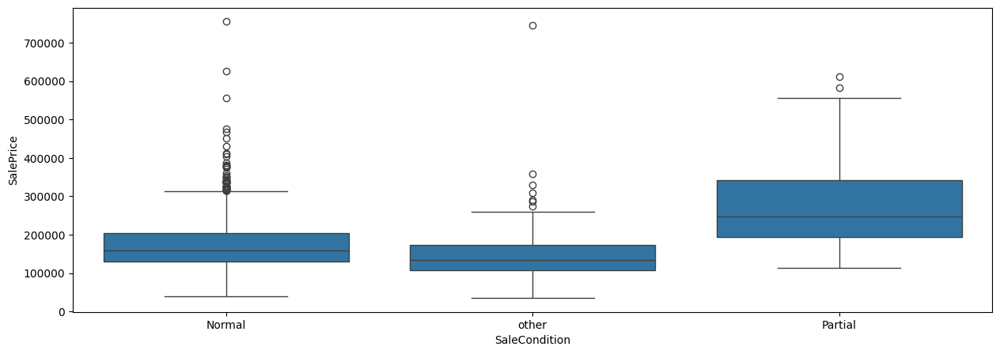

In [55]:
print('Before')
cat_eda('SaleCondition')
print()

grouping_logic = ((dataset_df['SaleCondition']!='Normal') & (dataset_df['SaleCondition']!='Partial'))
dataset_df.loc[grouping_logic,'SaleCondition'] = 'other'

print('After')
cat_eda('SaleCondition')

##### ExterQual Column

As per the EDA, grouping every rating except 'Ex' and 'Gd' to 'low_rating'

Before
  ExterQual   Id  rank
3        TA  897   4.0
2        Gd  484   3.0
0        Ex   49   2.0
1        Fa   14   1.0


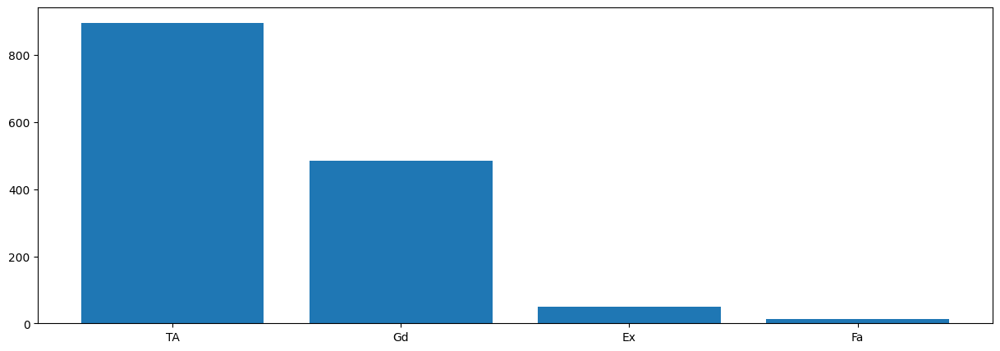

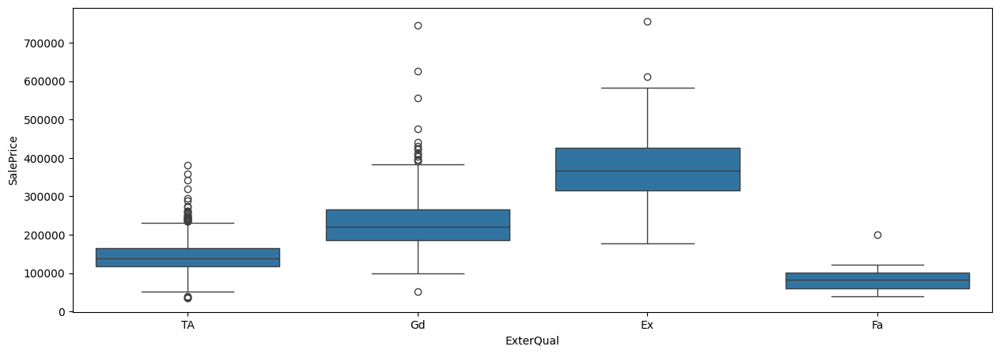


After
    ExterQual   Id  rank
2  low_rating  911   3.0
1          Gd  484   2.0
0          Ex   49   1.0


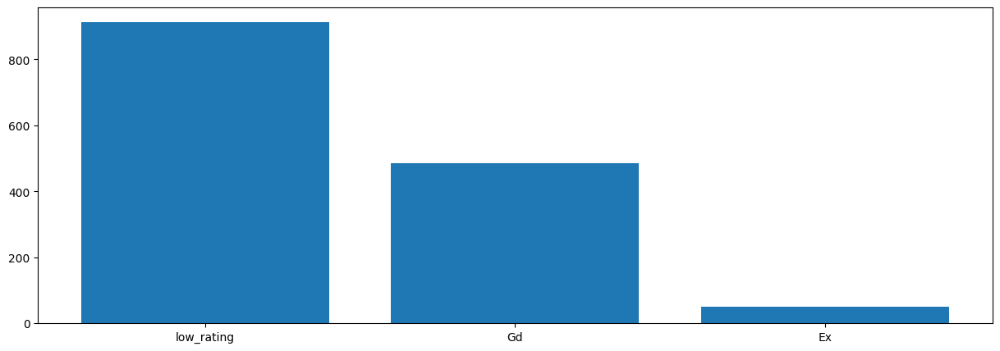

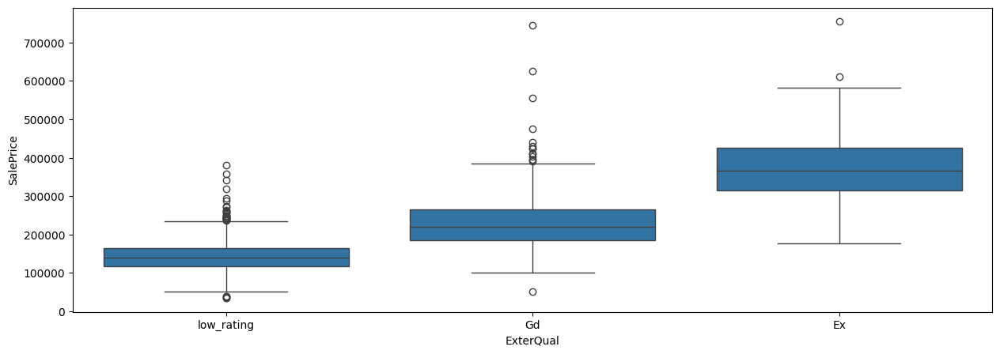

In [56]:
print('Before')
cat_eda('ExterQual')
print()

grouping_logic = ((dataset_df['ExterQual']!='Ex') & (dataset_df['ExterQual']!='Gd'))
dataset_df.loc[grouping_logic,'ExterQual'] = 'low_rating'

print('After')
cat_eda('ExterQual')

##### ExterCond Column

As per the EDA, grouping rating above and including 'TA' to 'high_rating' and lower than 'TA' TO 'low_rating'

Before
  ExterCond    Id  rank
4        TA  1266   5.0
2        Gd   146   4.0
1        Fa    28   3.0
0        Ex     3   2.0
3        Po     1   1.0


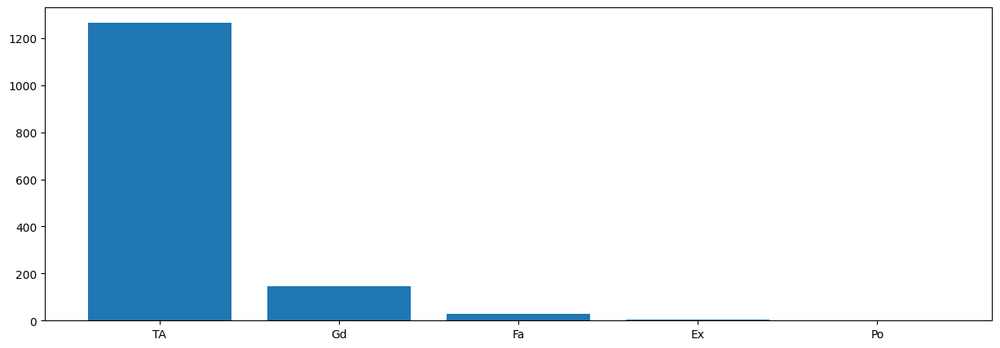

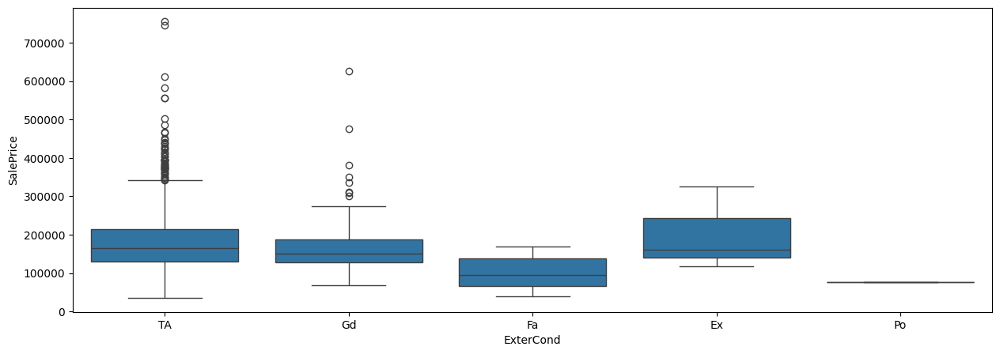


After
     ExterCond    Id  rank
0  high_rating  1415   2.0
1   low_rating    29   1.0


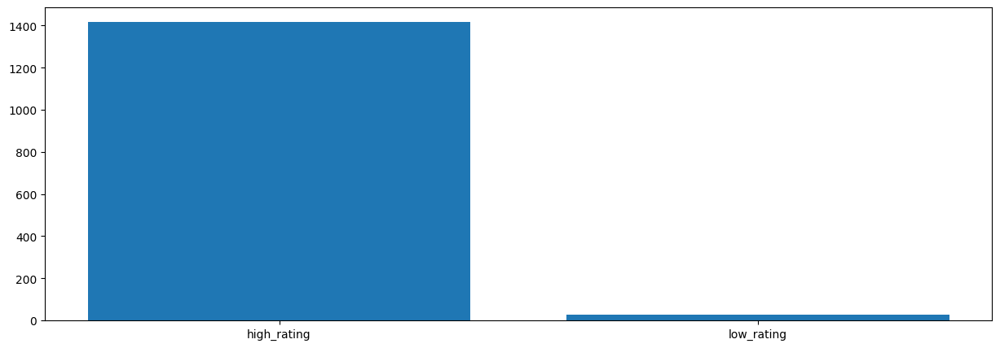

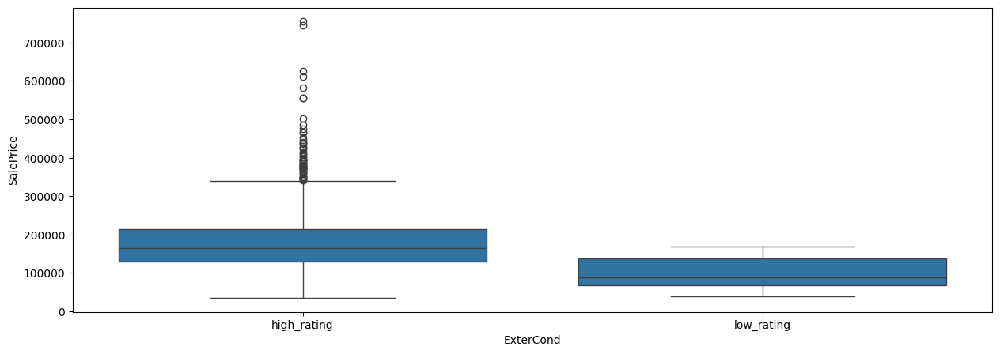

In [57]:
print('Before')
cat_eda('ExterCond')
print()

grouping_logic = ((dataset_df['ExterCond']!='Ex') & (dataset_df['ExterCond']!='Gd') & (dataset_df['ExterCond']!='TA'))
dataset_df.loc[grouping_logic,'ExterCond'] = 'low_rating'

grouping_logic = ((dataset_df['ExterCond']!='low_rating'))
dataset_df.loc[grouping_logic,'ExterCond'] = 'high_rating'

print('After')
cat_eda('ExterCond')

But now one category is overwhelmingly majority. So, this column is useless. So, dropping the same.

In [58]:
dataset_df = dataset_df.drop(columns=['ExterCond'])

##### BsmtQual Column

As per the EDA, grouping together "TA", no rating ("Non"), and "FA" into "TA_FA_r_Non" category because of their similar distribution

Before
  BsmtQual   Id  rank
4       TA  646   5.0
2       Gd  608   4.0
0       Ex  118   3.0
3      Non   37   2.0
1       Fa   35   1.0


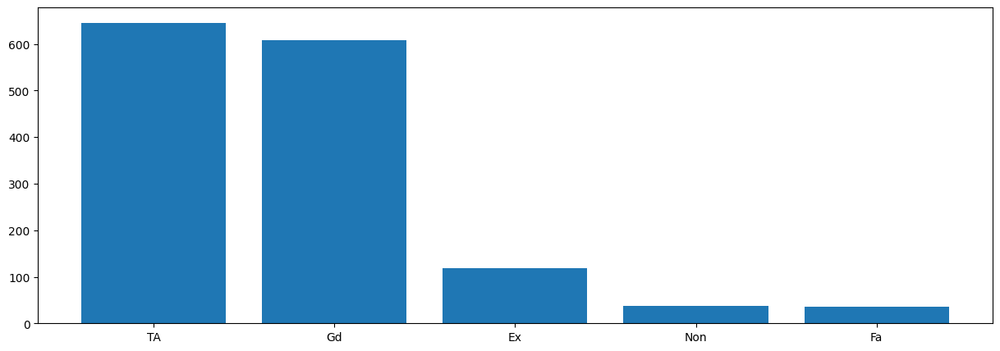

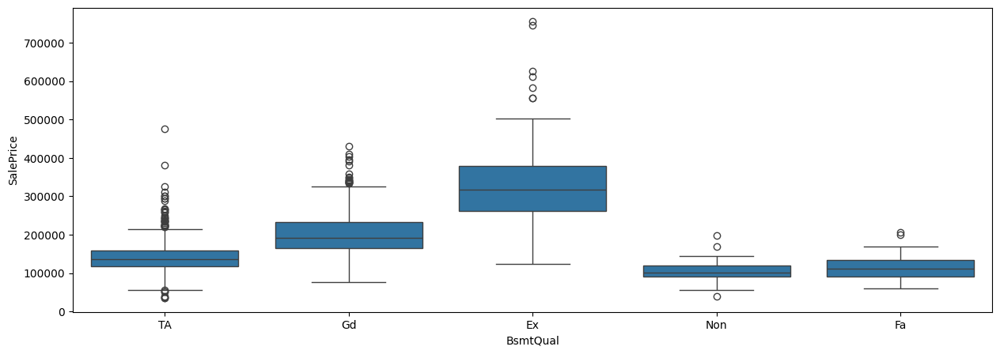


After
                 BsmtQual   Id  rank
2  low_rating_r_no_rating  718   3.0
1                      Gd  608   2.0
0                      Ex  118   1.0


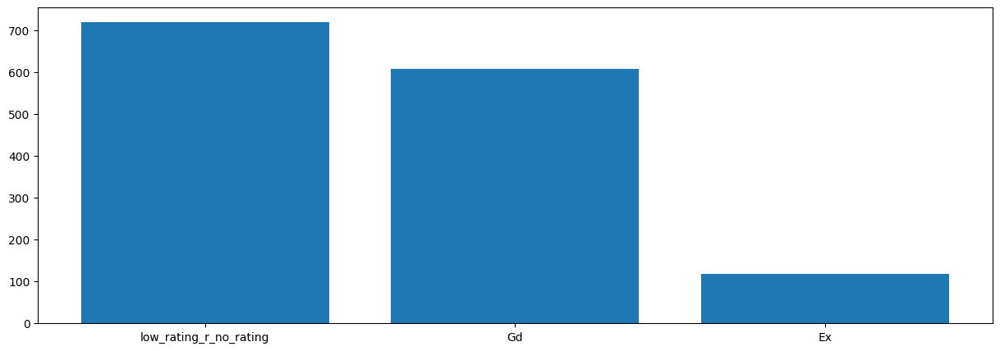

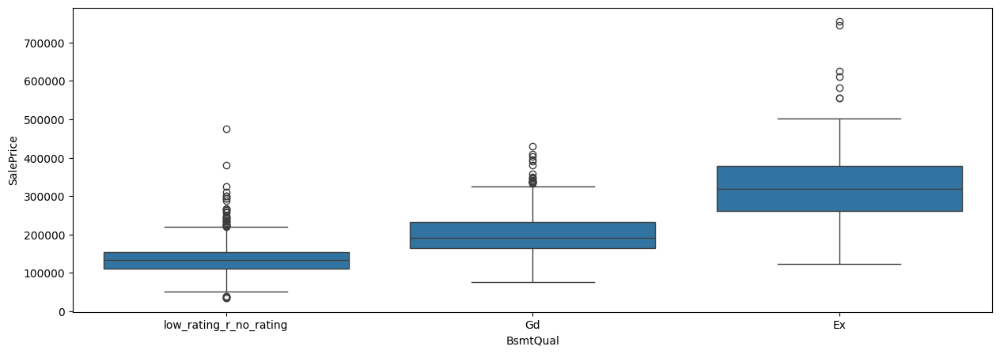

In [59]:
print('Before')
cat_eda('BsmtQual')
print()

grouping_logic = ((dataset_df['BsmtQual']!='Gd') & (dataset_df['BsmtQual']!='Ex'))
dataset_df.loc[grouping_logic,'BsmtQual'] = 'low_rating_r_no_rating'

print('After')
cat_eda('BsmtQual')

##### BsmtCond Column

As per the EDA, grouping together "Po", no rating ("Non"), and "FA" into "FA_Po_r_Non" category because of their similar distribution

Before
  BsmtCond    Id  rank
4       TA  1296   5.0
1       Gd    64   4.0
0       Fa    45   3.0
2      Non    37   2.0
3       Po     2   1.0


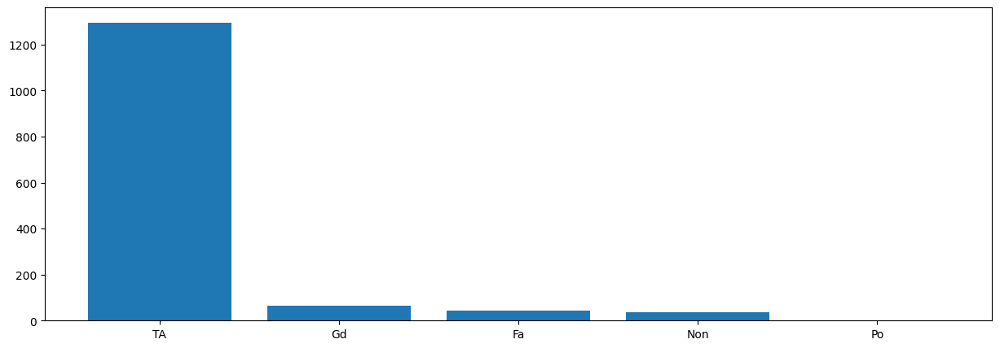

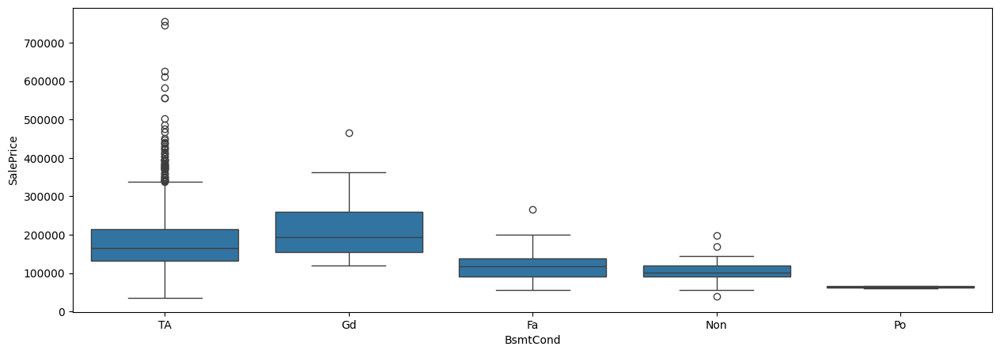


After
                 BsmtCond    Id  rank
1                      TA  1296   3.0
2  low_rating_r_no_rating    84   2.0
0                      Gd    64   1.0


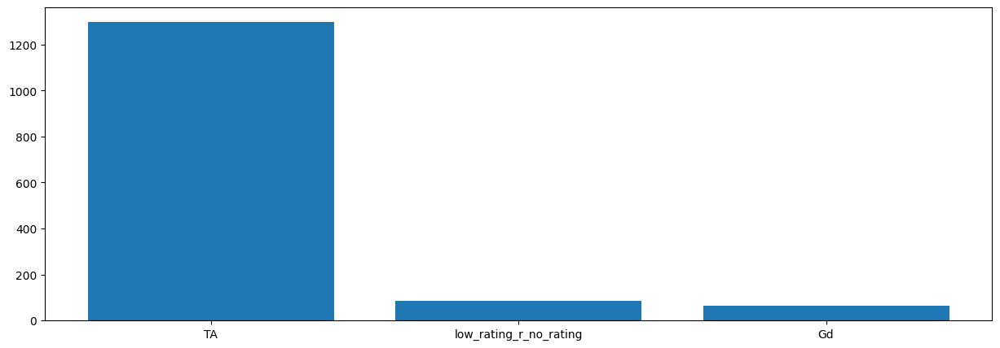

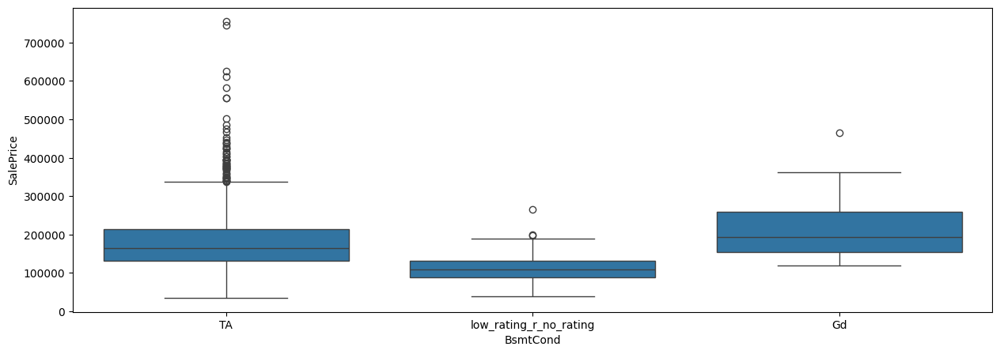

In [60]:
print('Before')
cat_eda('BsmtCond')
print()

grouping_logic = ((dataset_df['BsmtCond']!='TA') & (dataset_df['BsmtCond']!='Gd'))
dataset_df.loc[grouping_logic,'BsmtCond'] = 'low_rating_r_no_rating'

print('After')
cat_eda('BsmtCond')

##### BsmtExposure Column

As per the EDA, grouping together "Av" and "Mn" into "Av_r_Mn" category because of their similar distribution

Before
  BsmtExposure   Id  rank
3           No  950   5.0
0           Av  219   4.0
1           Gd  123   3.0
2           Mn  114   2.0
4          Non   38   1.0


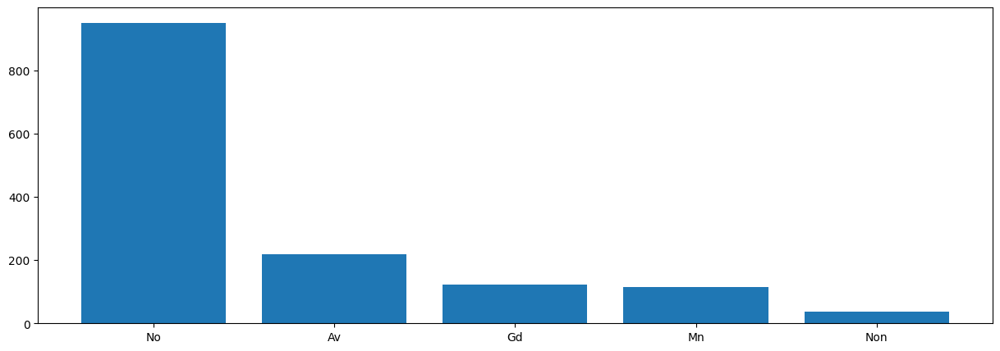

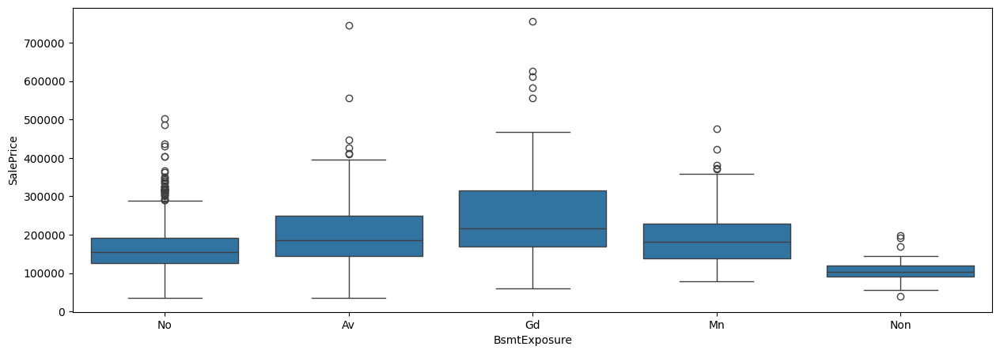


After
  BsmtExposure   Id  rank
2           No  950   4.0
0      Av_r_Mn  333   3.0
1           Gd  123   2.0
3          Non   38   1.0


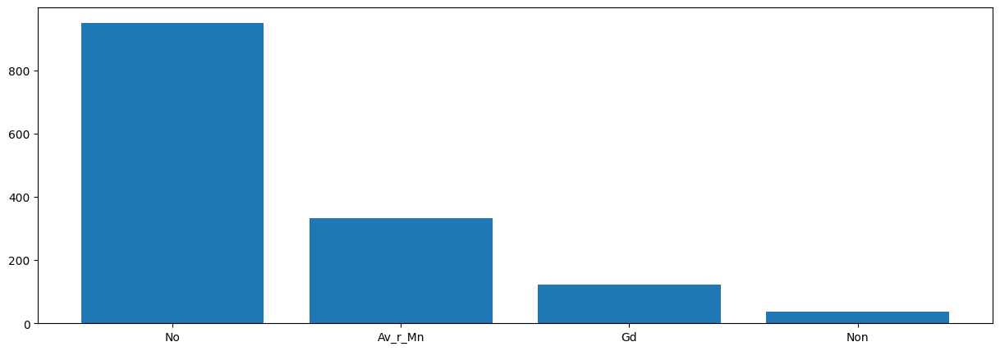

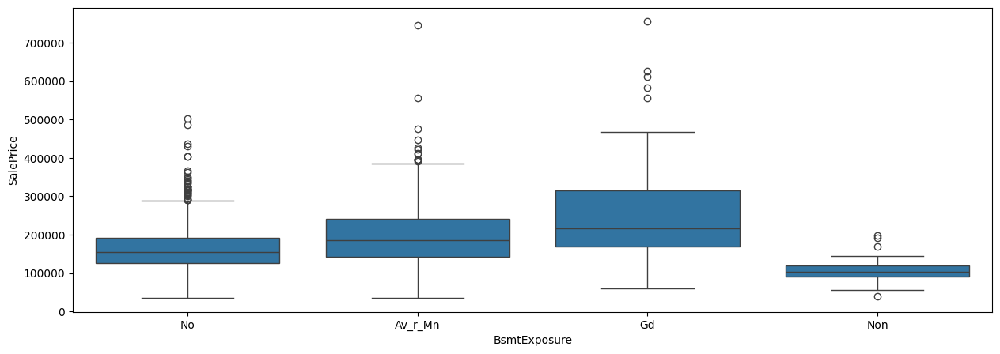

In [61]:
print('Before')
cat_eda('BsmtExposure')
print()

grouping_logic = ((dataset_df['BsmtExposure']!='No') & (dataset_df['BsmtExposure']!='Gd') & (dataset_df['BsmtExposure']!='Non'))
dataset_df.loc[grouping_logic,'BsmtExposure'] = 'Av_r_Mn'

print('After')
cat_eda('BsmtExposure')

##### BsmtFinType1 Column

As per the EDA, grouping together "Unf", "ALQ", "BLQ", "Rec", and "Lw" into "Unf_ALQ_BLQ_Rec_Lw" category because of their similar distribution

Before
  BsmtFinType1   Id  rank
6          Unf  428   7.0
2          GLQ  412   6.0
0          ALQ  216   5.0
1          BLQ  146   4.0
5          Rec  132   3.0
3          LwQ   73   2.0
4          Non   37   1.0


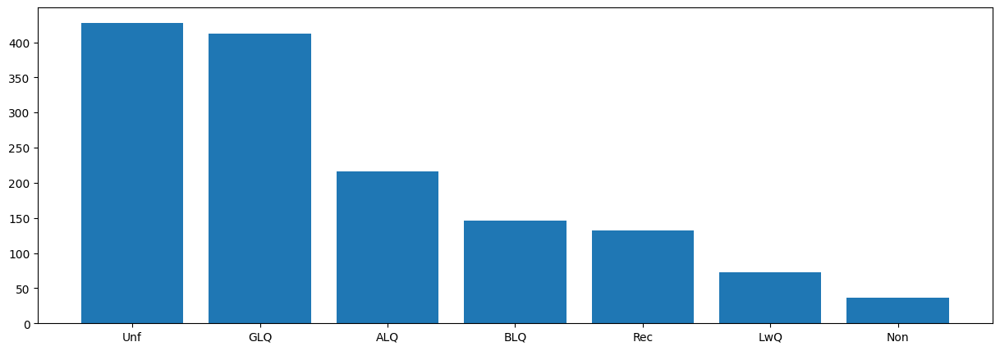

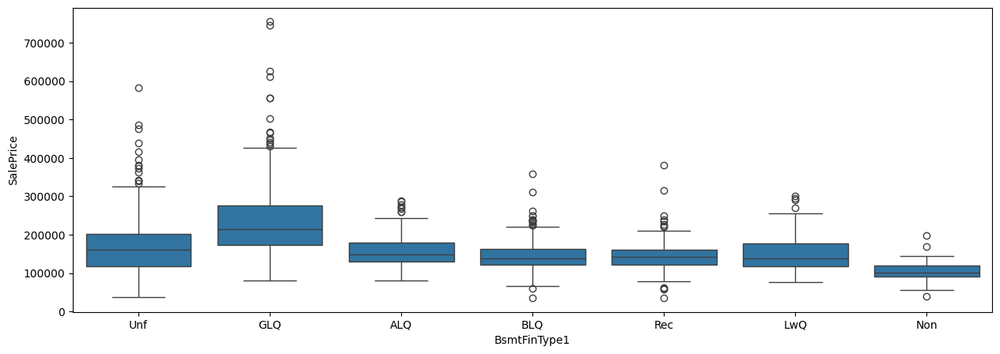


After
         BsmtFinType1   Id  rank
2  Unf_ALQ_BLQ_Rec_Lw  995   3.0
0                 GLQ  412   2.0
1                 Non   37   1.0


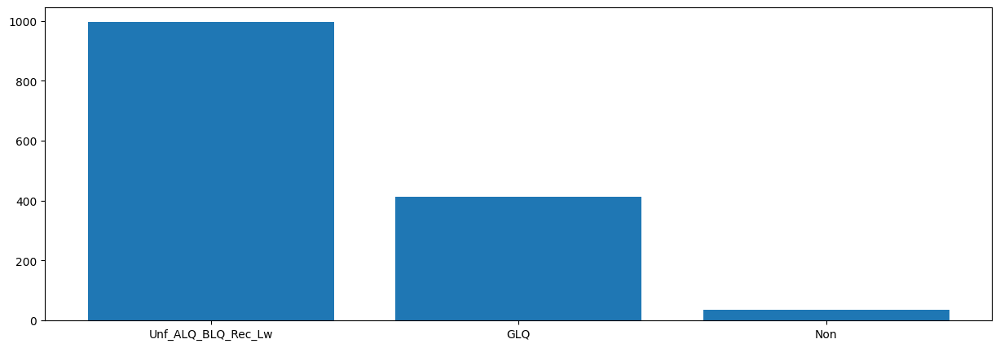

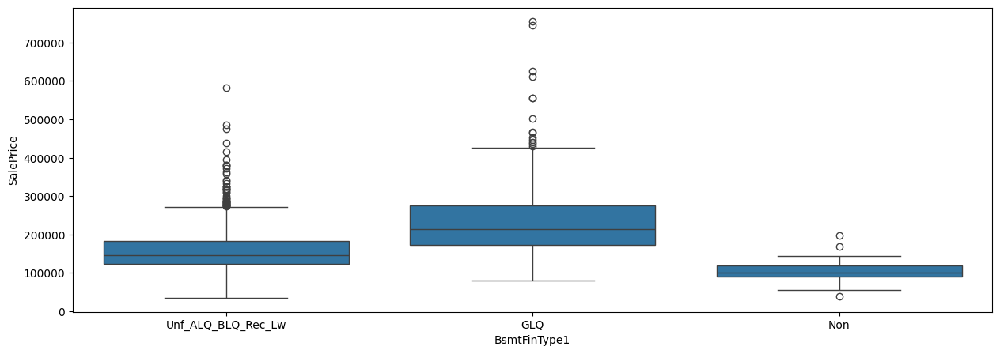

In [62]:
print('Before')
cat_eda('BsmtFinType1')
print()

grouping_logic = ((dataset_df['BsmtFinType1']!='GLQ') & (dataset_df['BsmtFinType1']!='Non'))
dataset_df.loc[grouping_logic,'BsmtFinType1'] = 'Unf_ALQ_BLQ_Rec_Lw'

print('After')
cat_eda('BsmtFinType1')

##### BsmtFinType2 Column

As per the EDA, grouping together "GLQ", "ALQ", "BLQ", "Rec", and "LwQ" into "GLQ_ALQ_BLQ_Rec_r_LwQ" category because of their similar distribution

Before
  BsmtFinType2    Id  rank
6          Unf  1245   7.0
5          Rec    51   6.0
3          LwQ    46   5.0
4          Non    38   4.0
1          BLQ    32   3.0
0          ALQ    19   2.0
2          GLQ    13   1.0


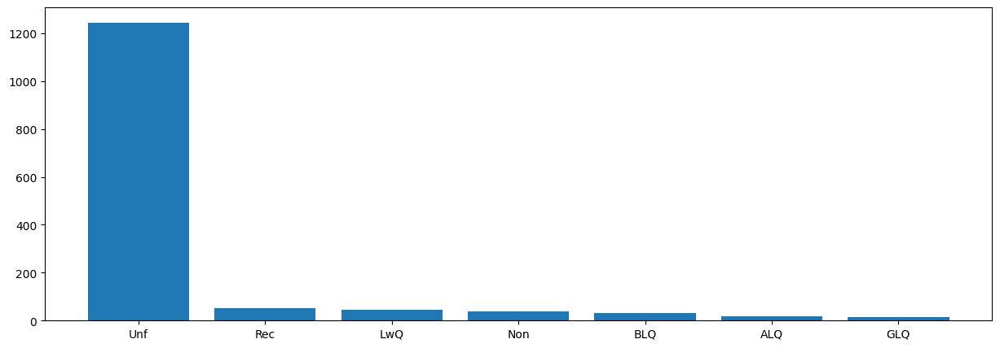

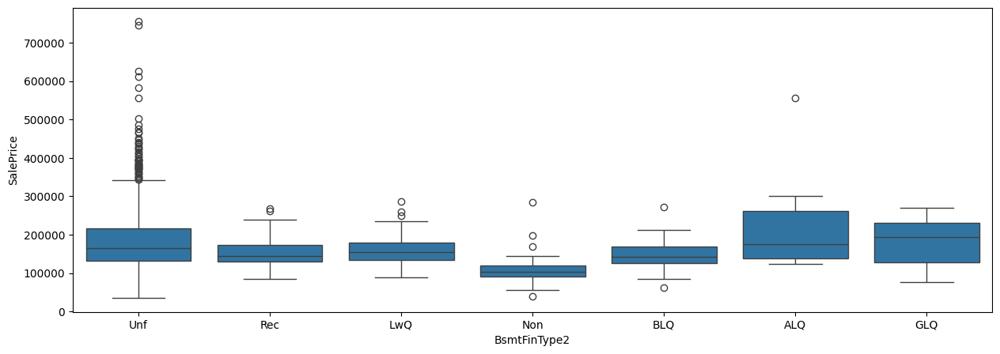


After
            BsmtFinType2    Id  rank
2                    Unf  1245   3.0
0  GLQ_ALQ_BLQ_Rec_r_LwQ   161   2.0
1                    Non    38   1.0


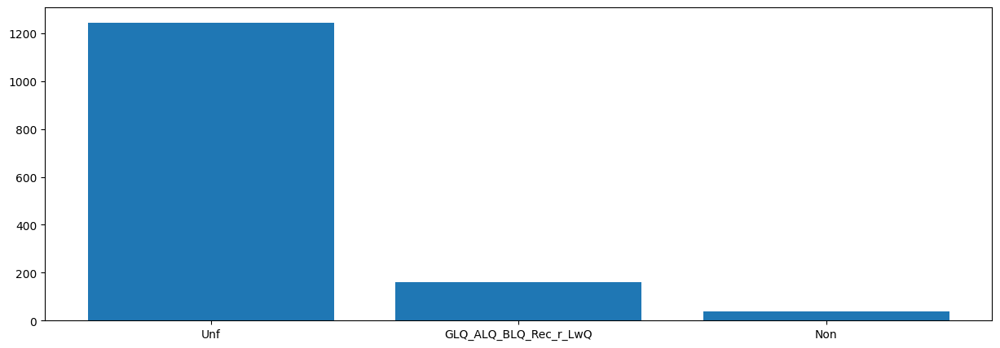

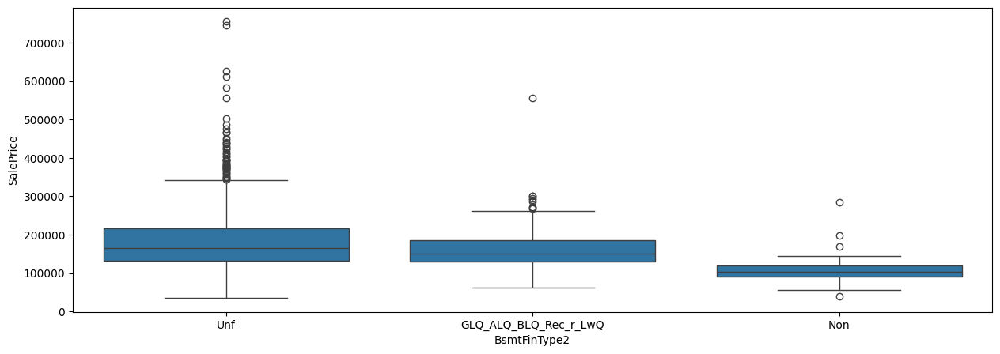

In [63]:
print('Before')
cat_eda('BsmtFinType2')
print()

grouping_logic = ((dataset_df['BsmtFinType2']!='Unf') & (dataset_df['BsmtFinType2']!='Non'))
dataset_df.loc[grouping_logic,'BsmtFinType2'] = 'GLQ_ALQ_BLQ_Rec_r_LwQ'

print('After')
cat_eda('BsmtFinType2')

##### HeatingQC Column

As per the EDA, grouping together everything except "Ex" into "low_rating" category because of their similar distribution

Before
  HeatingQC   Id  rank
0        Ex  733   5.0
4        TA  423   4.0
2        Gd  238   3.0
1        Fa   49   2.0
3        Po    1   1.0


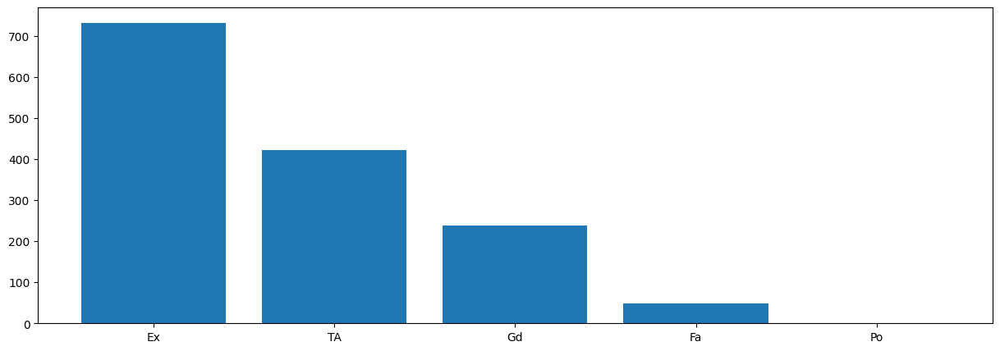

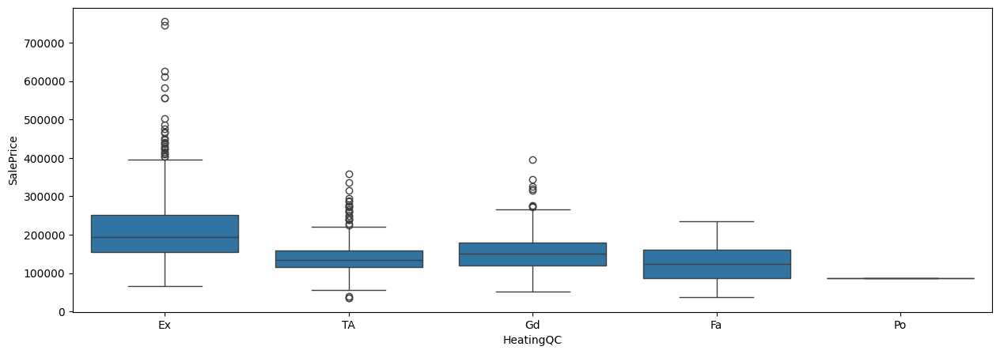


After
    HeatingQC   Id  rank
0          Ex  733   2.0
1  low_rating  711   1.0


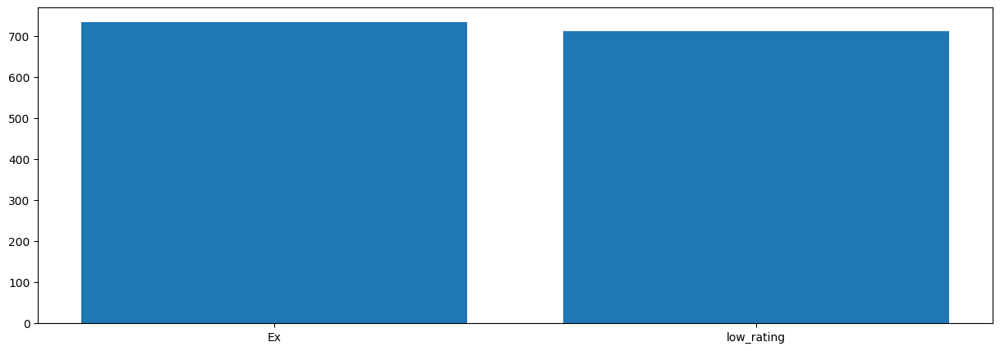

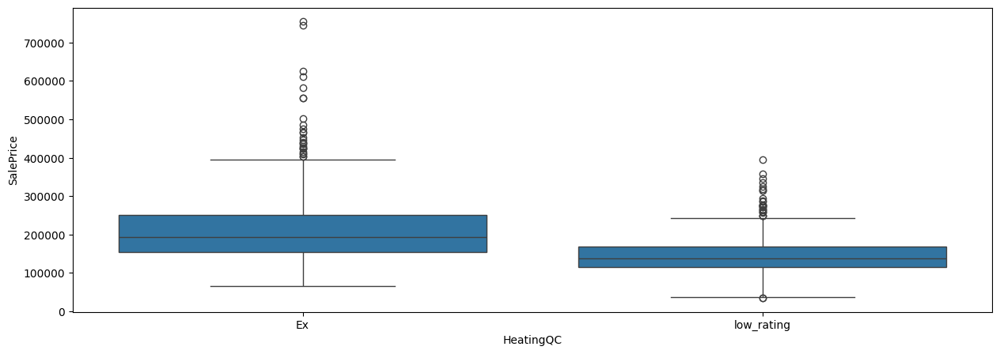

In [64]:
print('Before')
cat_eda('HeatingQC')
print()

grouping_logic = ((dataset_df['HeatingQC']!='Ex'))
dataset_df.loc[grouping_logic,'HeatingQC'] = 'low_rating'

print('After')
cat_eda('HeatingQC')

##### FireplaceQu Column

As per the EDA, grouping together everything except "Ex" and no rating ("Non") into "low_rating" category because of their similar distribution

Before
  FireplaceQu   Id  rank
3         Non  689   6.0
2          Gd  372   5.0
5          TA  307   4.0
1          Fa   32   3.0
0          Ex   24   2.0
4          Po   20   1.0


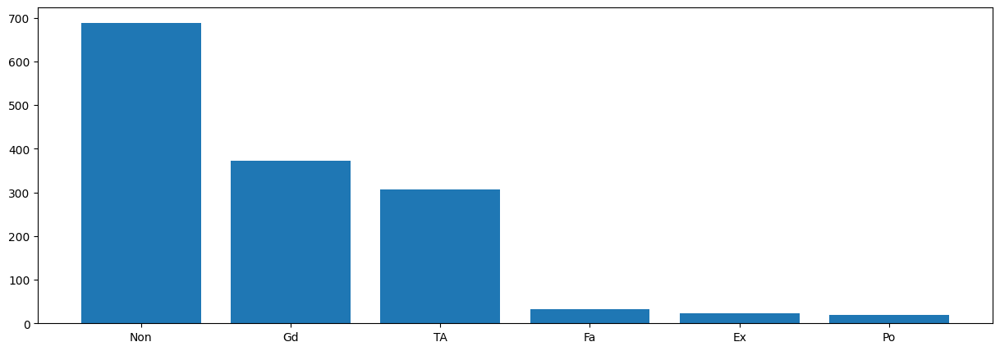

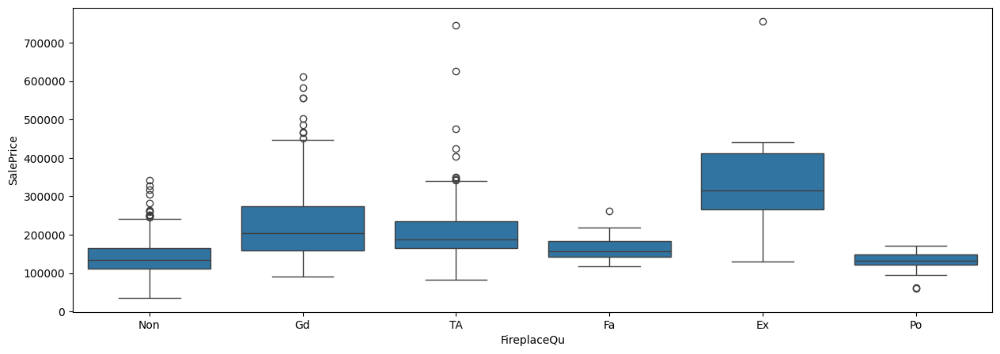


After
  FireplaceQu   Id  rank
2  low_rating  731   3.0
1         Non  689   2.0
0          Ex   24   1.0


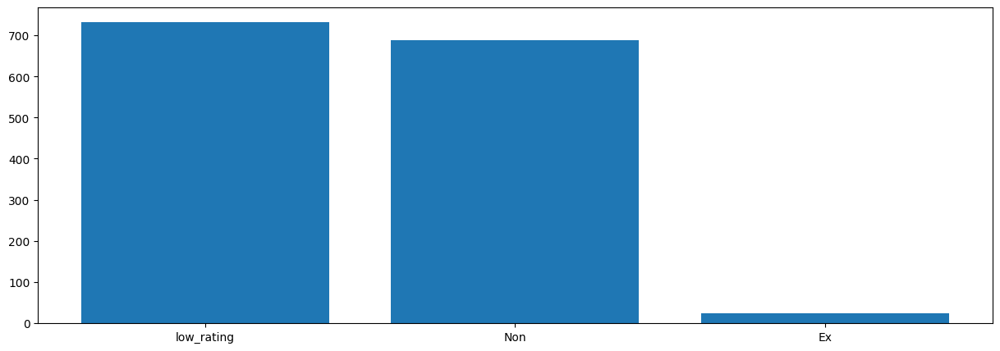

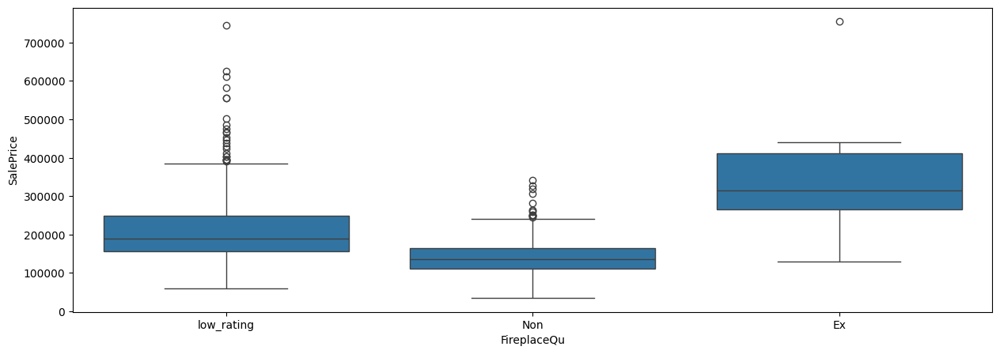

In [65]:
print('Before')
cat_eda('FireplaceQu')
print()

grouping_logic = ((dataset_df['FireplaceQu']!='Ex') & (dataset_df['FireplaceQu']!='Non'))
dataset_df.loc[grouping_logic,'FireplaceQu'] = 'low_rating'

print('After')
cat_eda('FireplaceQu')

##### GarageQual Column

As per the EDA, grouping together everything except "TA" into "other_rating_r_no_rating" category because of their similar distribution

Before
  GarageQual    Id  rank
5         TA  1296   6.0
3        Non    81   5.0
1         Fa    47   4.0
2         Gd    14   3.0
0         Ex     3   1.5
4         Po     3   1.5


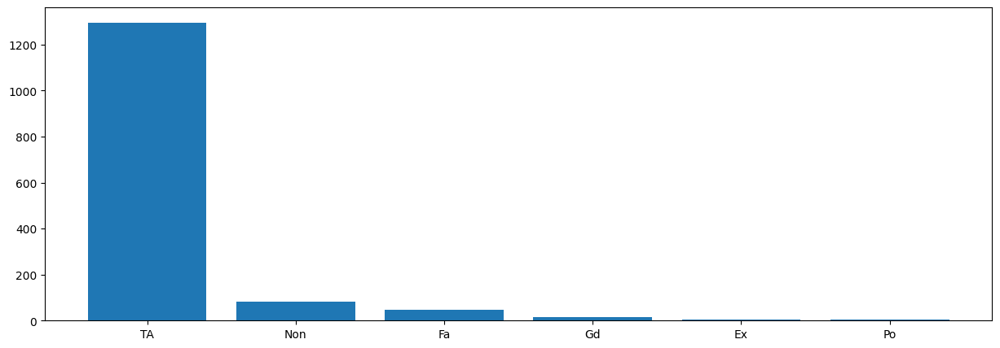

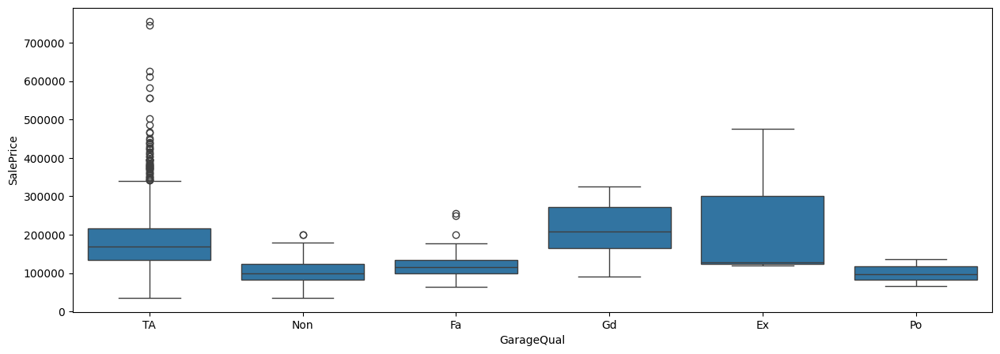


After
                 GarageQual    Id  rank
0                        TA  1296   2.0
1  other_rating_r_no_rating   148   1.0


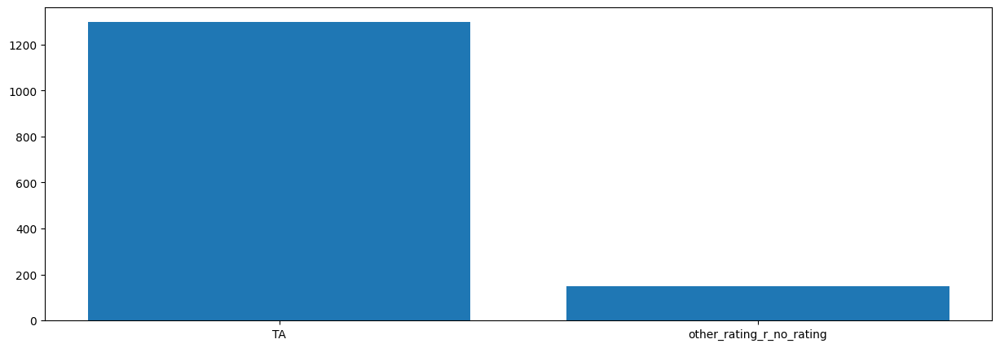

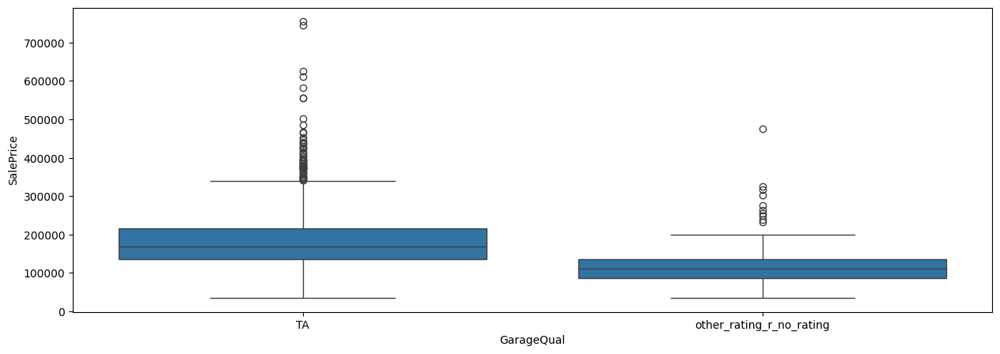

In [66]:
print('Before')
cat_eda('GarageQual')
print()

grouping_logic = ((dataset_df['GarageQual']!='TA'))
dataset_df.loc[grouping_logic,'GarageQual'] = 'other_rating_r_no_rating'

print('After')
cat_eda('GarageQual')

##### GarageCond Column

As per the EDA, grouping together everything except "TA" into "other_rating_r_no_rating" category because of their similar distribution

Before
  GarageCond    Id  rank
5         TA  1310   6.0
3        Non    81   5.0
1         Fa    35   4.0
2         Gd     9   3.0
4         Po     7   2.0
0         Ex     2   1.0


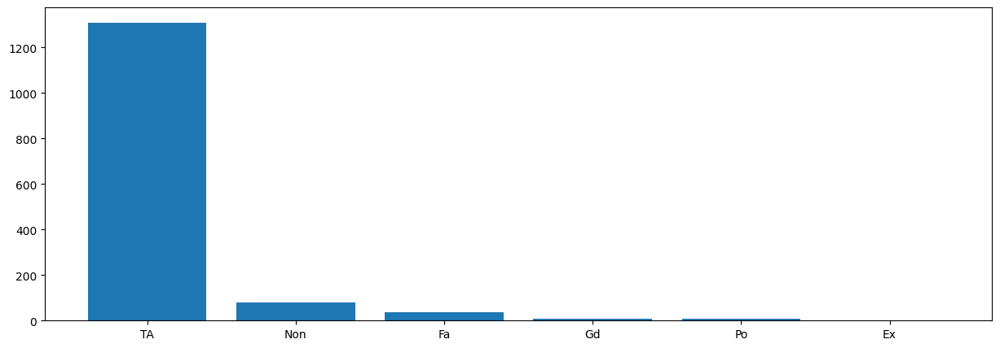

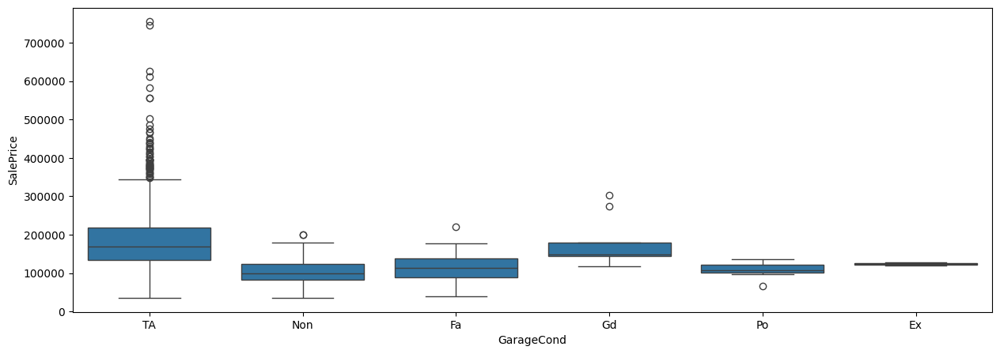


After
                 GarageCond    Id  rank
0                        TA  1310   2.0
1  other_rating_r_no_rating   134   1.0


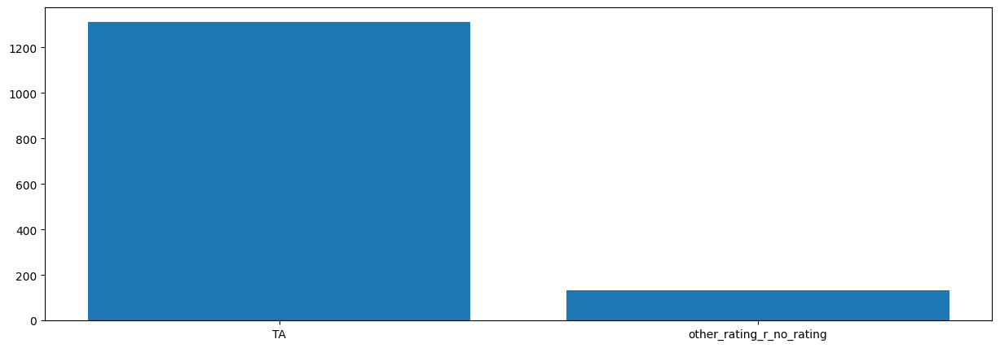

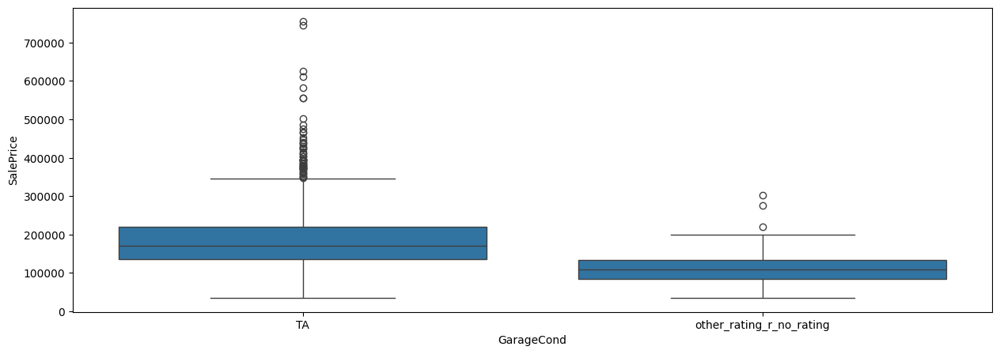

In [67]:
print('Before')
cat_eda('GarageCond')
print()

grouping_logic = ((dataset_df['GarageCond']!='TA'))
dataset_df.loc[grouping_logic,'GarageCond'] = 'other_rating_r_no_rating'

print('After')
cat_eda('GarageCond')

##### PoolQC Column

Dropping the column, because more than 99 percent is dominated by a single category

In [68]:
dataset_df = dataset_df.drop(columns=["PoolQC"])

##### Fence Column

As per the EDA, grouping together everything except no fence ("Non"), and "GdPrv" into "MnPrv_GdWo_r_MnWw" category because of their similar distribution

Before
   Fence    Id  rank
4    Non  1163   5.0
2  MnPrv   157   4.0
0  GdPrv    59   3.0
1   GdWo    54   2.0
3   MnWw    11   1.0


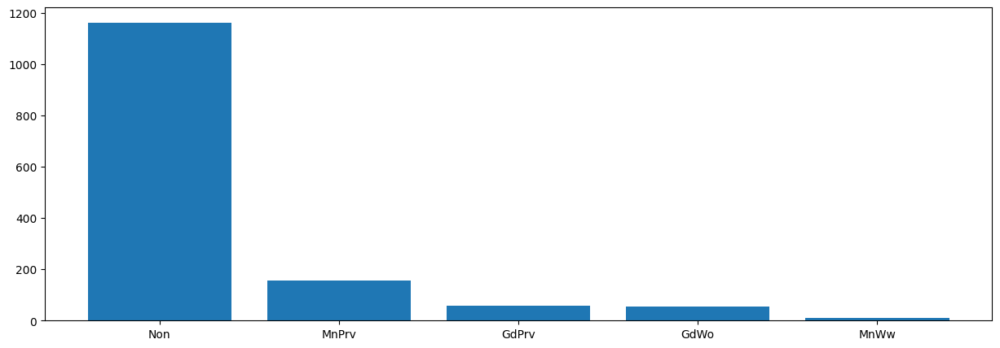

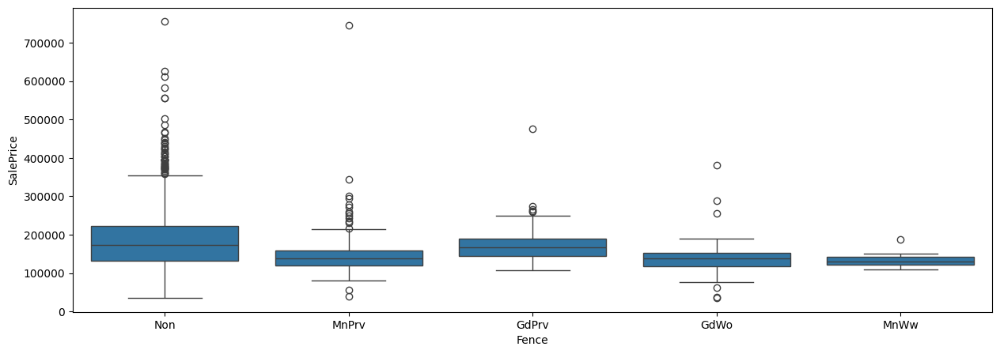


After
               Fence    Id  rank
2                Non  1163   3.0
1  MnPrv_GdWo_r_MnWw   222   2.0
0              GdPrv    59   1.0


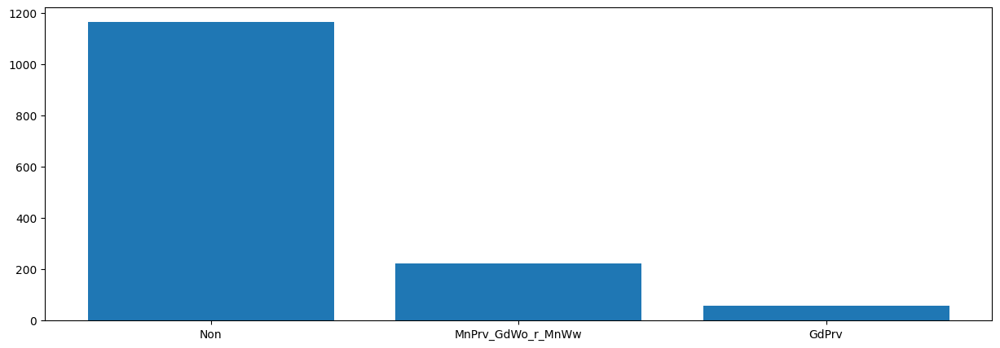

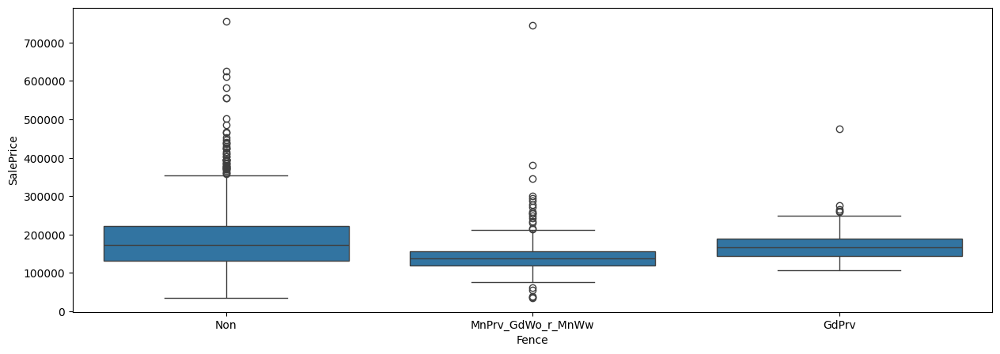

In [69]:
print('Before')
cat_eda('Fence')
print()

grouping_logic = ((dataset_df['Fence']!='Non') & (dataset_df['Fence']!='GdPrv'))
dataset_df.loc[grouping_logic,'Fence'] = 'MnPrv_GdWo_r_MnWw'

print('After')
cat_eda('Fence')

##### MoSold Column

Dropping the column, because all the categories have similar distribution

In [70]:
dataset_df = dataset_df.drop(columns=["MoSold"])

##### YrSold Column

Dropping the column, because all the categories have similar distribution

In [71]:
dataset_df = dataset_df.drop(columns=["YrSold"])

##### YearBuilt Column

As per the EDA, grouping together years from 1850-1949 into "1850-1949" category because of their similar distribution

Before
        YearBuilt   Id  rank
2       1950-1999  744   4.0
3  2000-till date  384   3.0
1       1900-1949  301   2.0
0       1850-1899   15   1.0


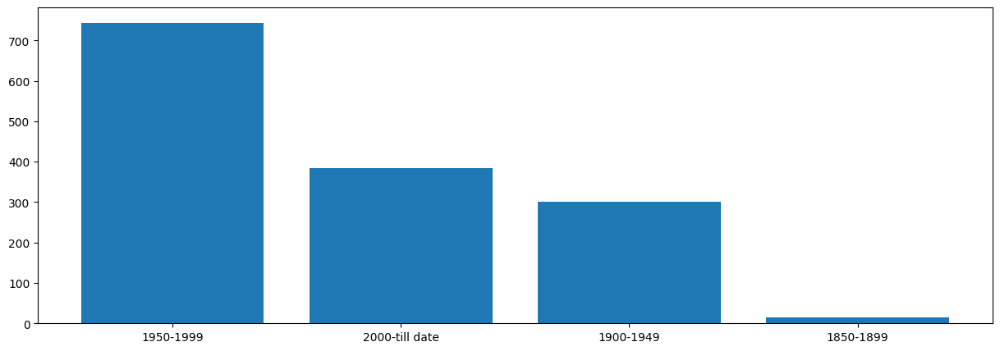

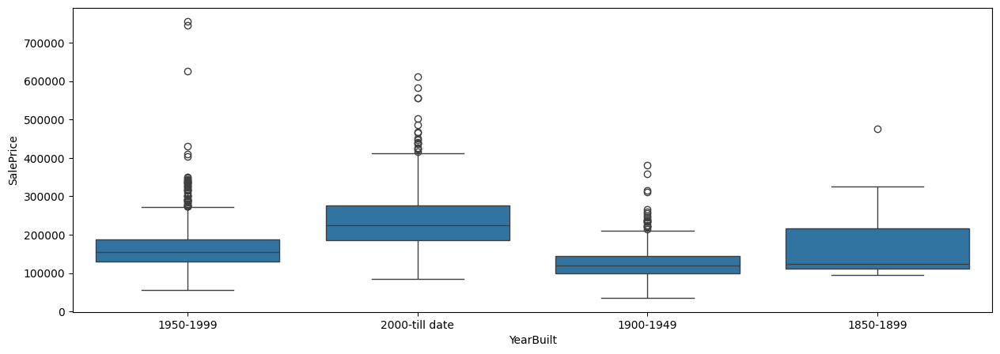


After
        YearBuilt   Id  rank
1       1950-1999  744   3.0
2  2000-till date  384   2.0
0       1850-1949  316   1.0


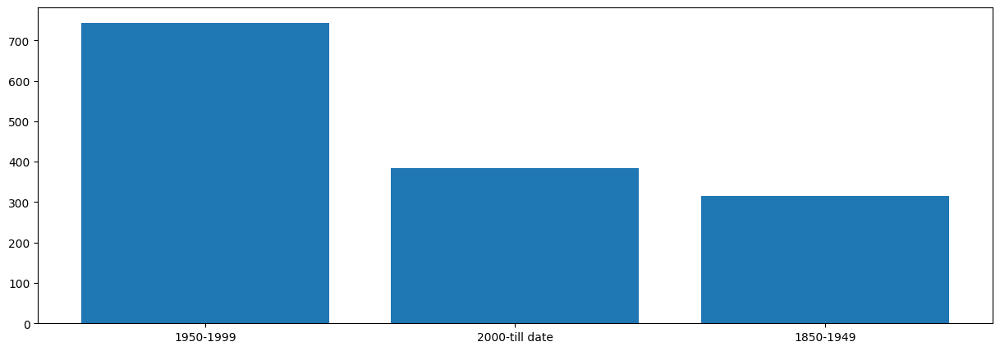

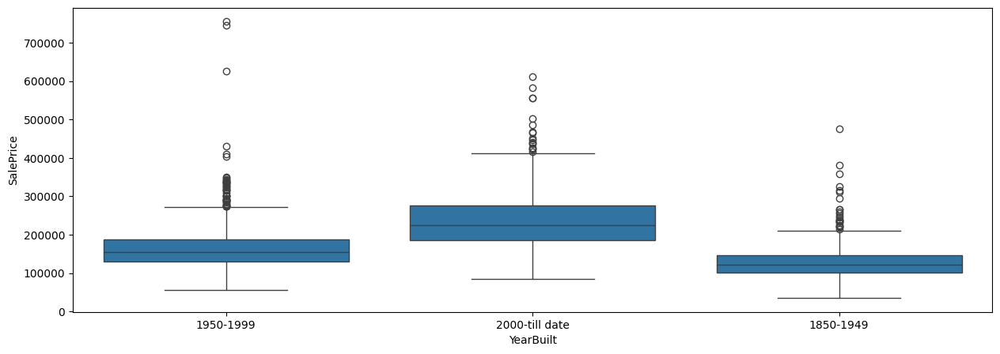

In [72]:
print('Before')
cat_eda('YearBuilt')
print()

grouping_logic = ((dataset_df['YearBuilt']!='1950-1999') & (dataset_df['YearBuilt']!='2000-till date'))
dataset_df.loc[grouping_logic,'YearBuilt'] = '1850-1949'

print('After')
cat_eda('YearBuilt')

##### BsmtFullBath Column

As per the EDA, grouping together non-zero full bathrooms into "non 0" category

Before
   BsmtFullBath   Id  rank
0             0  853   4.0
1             1  579   3.0
2             2   11   2.0
3             3    1   1.0


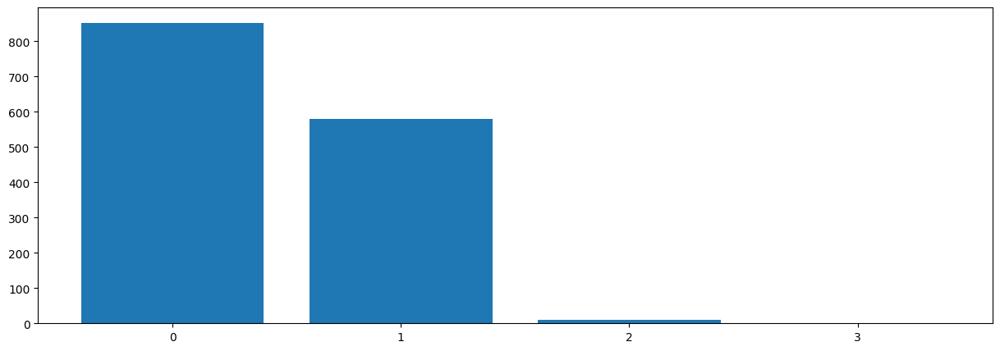

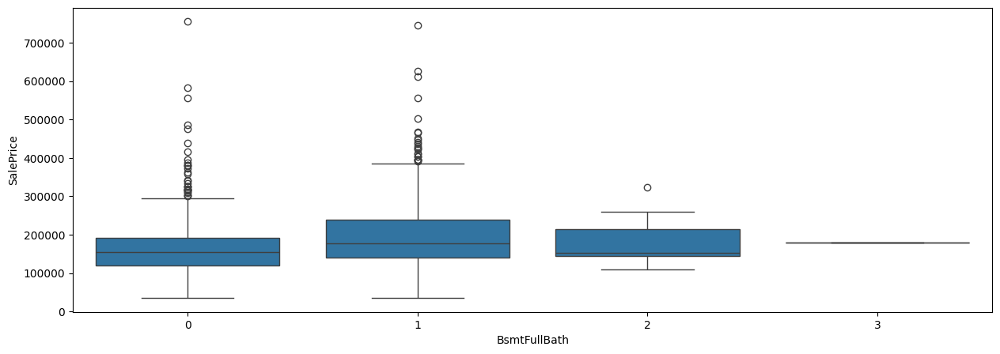


After
  BsmtFullBath   Id  rank
0            0  853   2.0
1        non 0  591   1.0


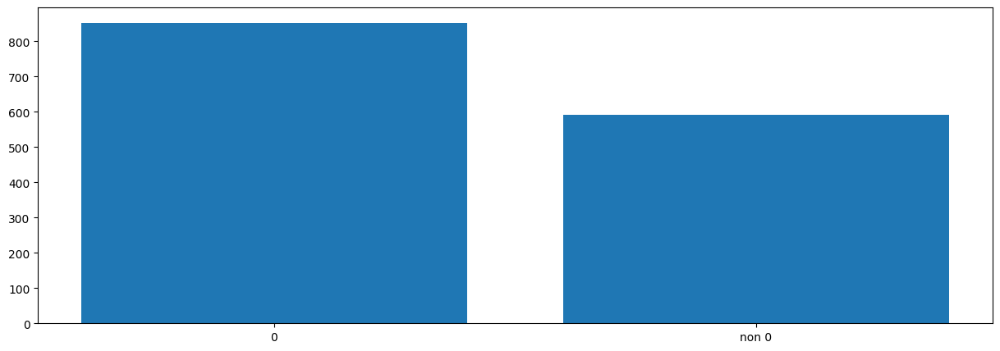

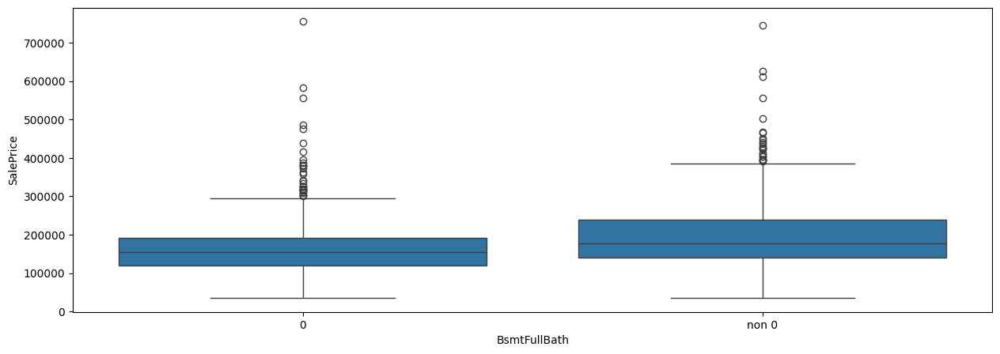

In [73]:
print('Before')
cat_eda('BsmtFullBath')
print()

dataset_df['BsmtFullBath'] = dataset_df['BsmtFullBath'].astype(str)

grouping_logic = ((dataset_df['BsmtFullBath']!='0'))
dataset_df.loc[grouping_logic,'BsmtFullBath'] = 'non 0'

print('After')
cat_eda('BsmtFullBath')

##### BsmtHalfBath Column

As per the EDA, grouping together non-zero full bathrooms into "non 0" category

Before
   BsmtHalfBath    Id  rank
0             0  1363   3.0
1             1    79   2.0
2             2     2   1.0


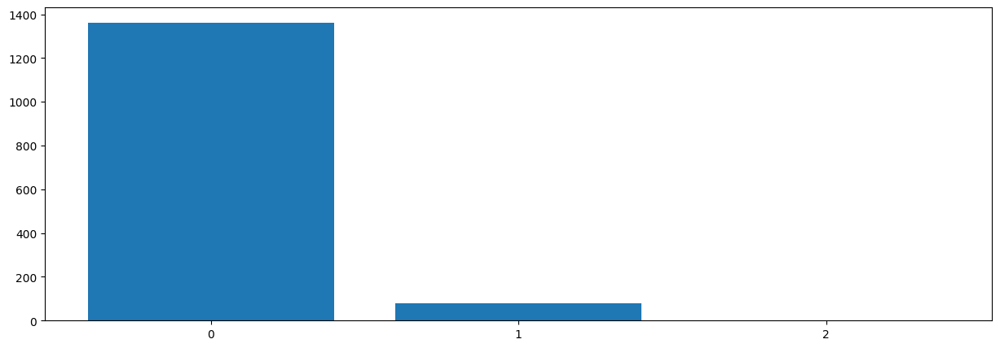

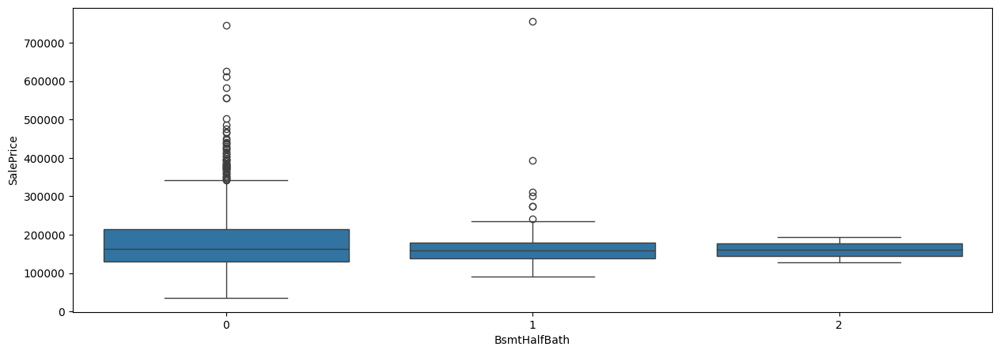


After
  BsmtHalfBath    Id  rank
0            0  1363   2.0
1        non 0    81   1.0


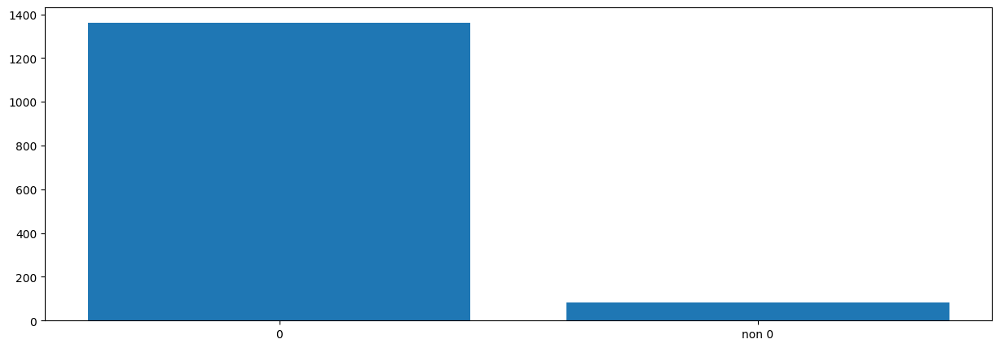

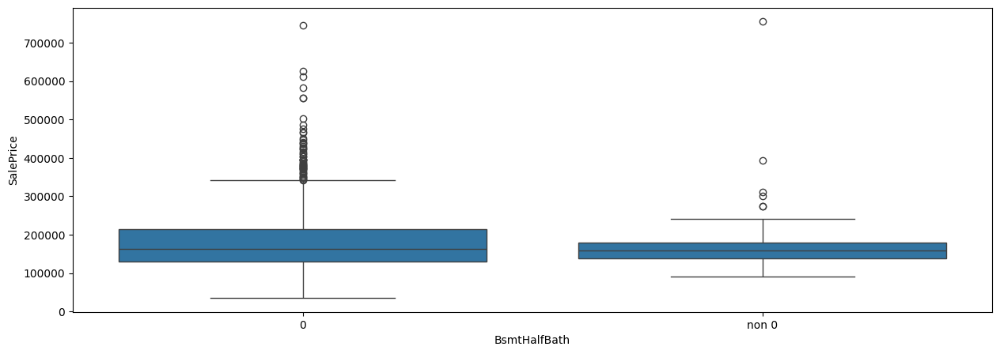

In [74]:
print('Before')
cat_eda('BsmtHalfBath')
print()

dataset_df['BsmtHalfBath'] = dataset_df['BsmtHalfBath'].astype(str)

grouping_logic = ((dataset_df['BsmtHalfBath']!='0'))
dataset_df.loc[grouping_logic,'BsmtHalfBath'] = 'non 0'

print('After')
cat_eda('BsmtHalfBath')

##### FullBath Column

As per the EDA, grouping together zero and one full bathrooms into "0_r_1" category

Before
   FullBath   Id  rank
2         2  759   4.0
1         1  647   3.0
3         3   30   2.0
0         0    8   1.0


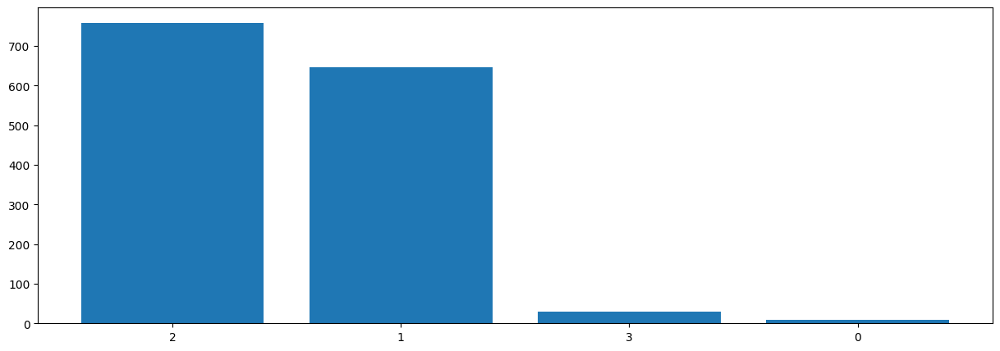

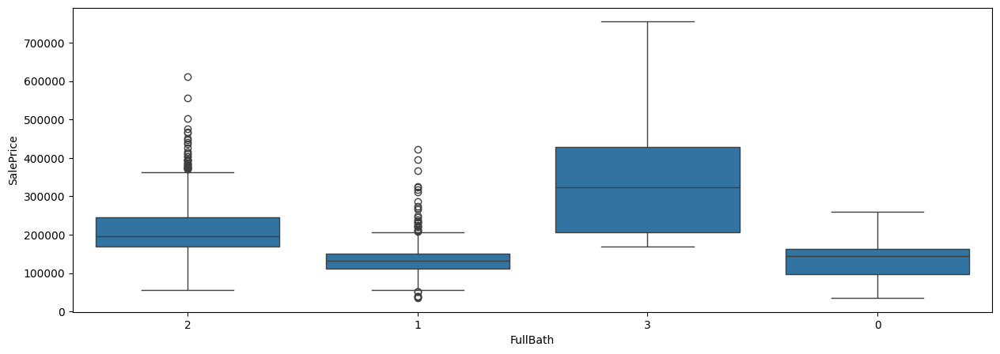


After
  FullBath   Id  rank
1        2  759   3.0
0    0_r_1  655   2.0
2        3   30   1.0


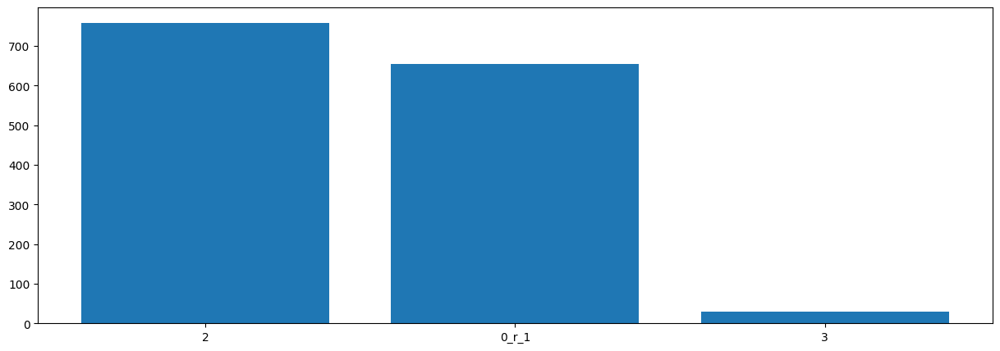

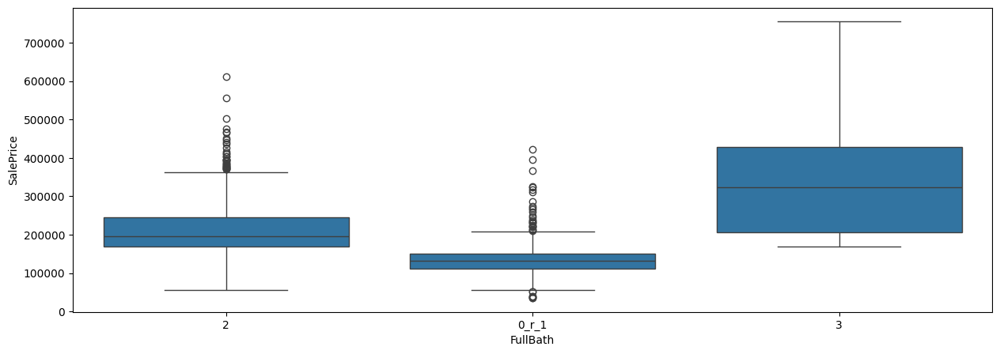

In [75]:
print('Before')
cat_eda('FullBath')
print()

dataset_df['FullBath'] = dataset_df['FullBath'].astype(str)

grouping_logic = ((dataset_df['FullBath']!='2') & (dataset_df['FullBath']!='3'))
dataset_df.loc[grouping_logic,'FullBath'] = '0_r_1'

print('After')
cat_eda('FullBath')

##### HalfBath Column

As per the EDA, grouping together non zero values into "non 0" category

Before
   HalfBath   Id  rank
0         0  904   3.0
1         1  528   2.0
2         2   12   1.0


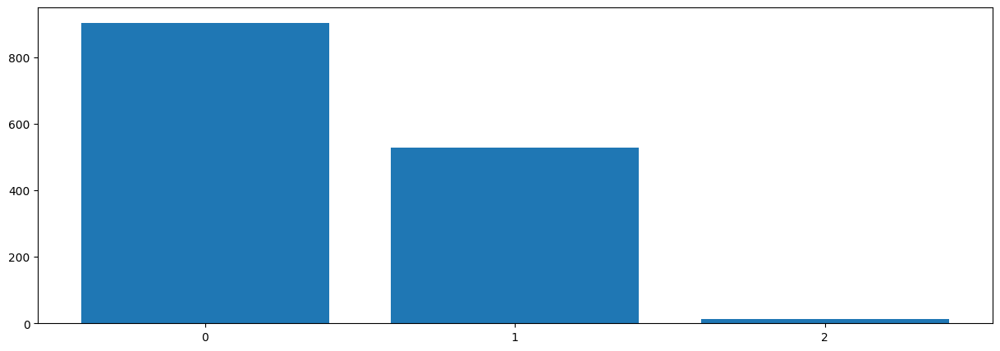

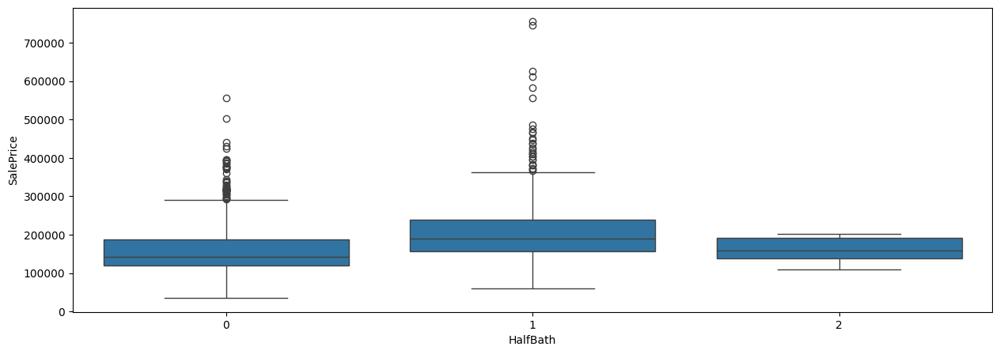


After
  HalfBath   Id  rank
0        0  904   2.0
1    non 0  540   1.0


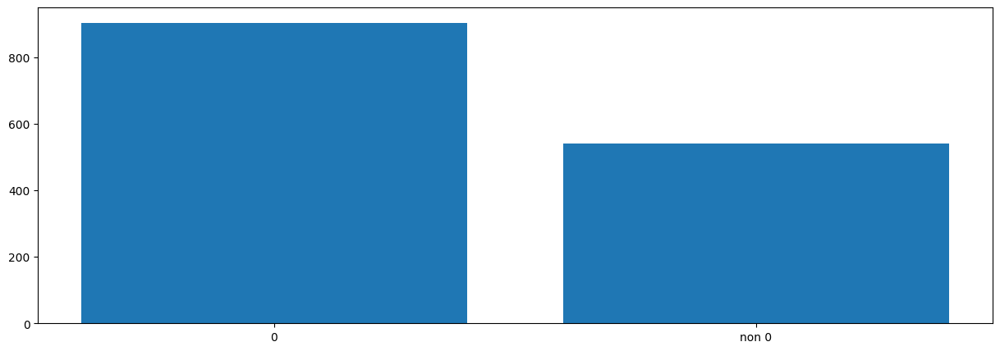

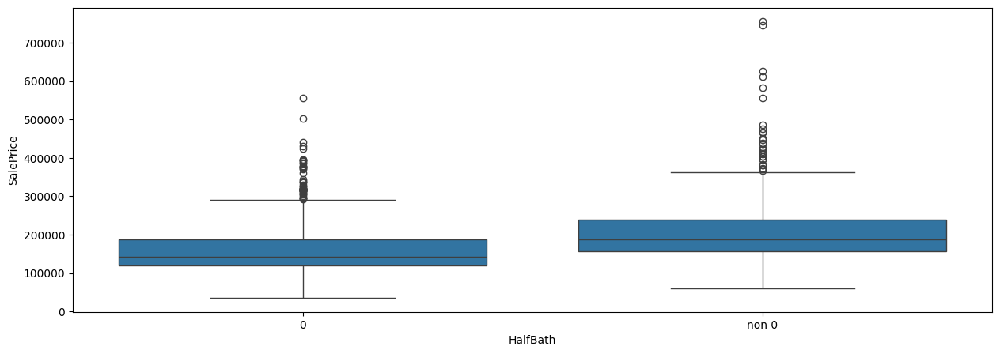

In [76]:
print('Before')
cat_eda('HalfBath')
print()

dataset_df['HalfBath'] = dataset_df['HalfBath'].astype(str)

grouping_logic = ((dataset_df['HalfBath']!='0'))
dataset_df.loc[grouping_logic,'HalfBath'] = 'non 0'

print('After')
cat_eda('HalfBath')

##### OverallCond Column

As per the EDA, grouping together into low_rat, avg_rat, gd_rat, ex_rat

Before
   OverallCond   Id  rank
4            5  811   9.0
5            6  250   8.0
6            7  202   7.0
7            8   71   6.0
3            4   57   5.0
2            3   25   4.0
8            9   22   3.0
1            2    5   2.0
0            1    1   1.0


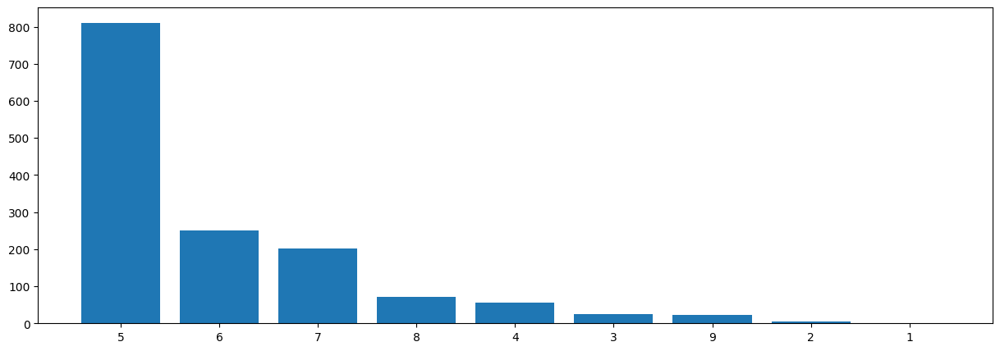

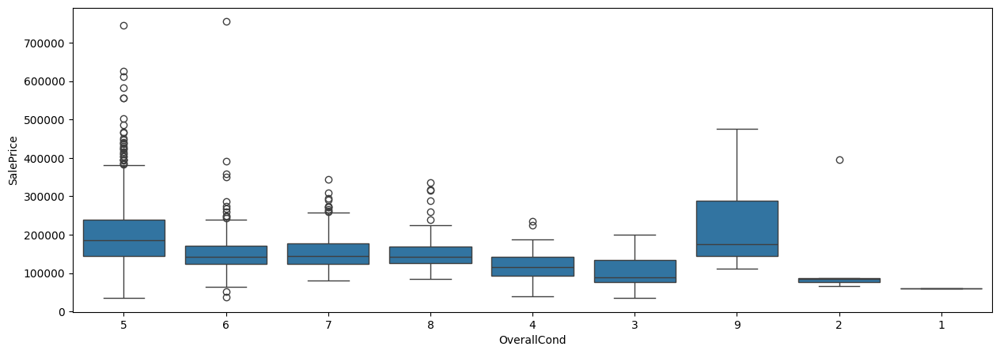


After
  OverallCond   Id  rank
0     avg_rat  811   4.0
2      gd_rat  523   3.0
3     low_rat   88   2.0
1      ex_rat   22   1.0


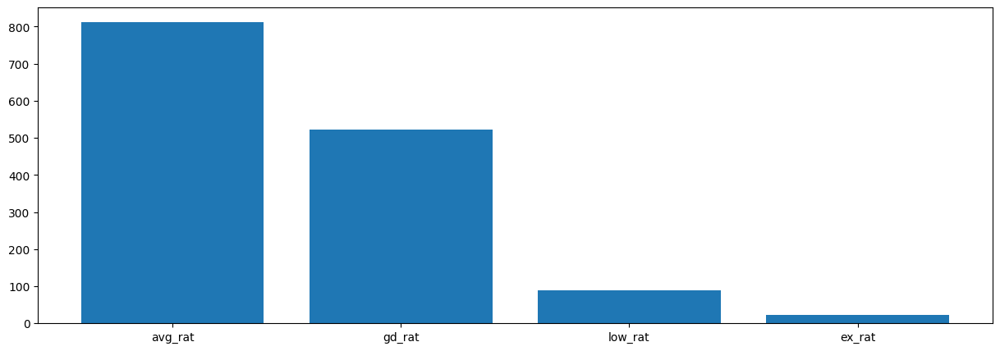

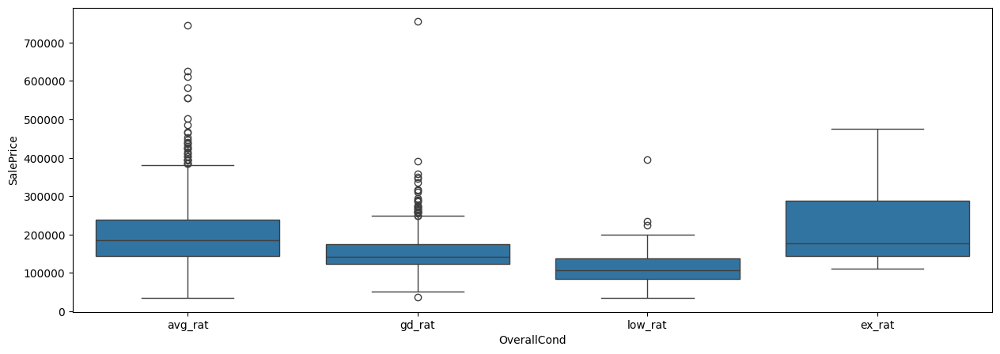

In [77]:
print('Before')
cat_eda('OverallCond')
print()

dataset_df['OverallCond'] = dataset_df['OverallCond'].astype(str)

grouping_logic = ((dataset_df['OverallCond']=='1') | (dataset_df['OverallCond']=='2') 
                  | (dataset_df['OverallCond']=='3') | (dataset_df['OverallCond']=='4'))
dataset_df.loc[grouping_logic,'OverallCond'] = 'low_rat'

grouping_logic = ((dataset_df['OverallCond']=='5'))
dataset_df.loc[grouping_logic,'OverallCond'] = 'avg_rat'

grouping_logic = ((dataset_df['OverallCond']=='6') | (dataset_df['OverallCond']=='7') | (dataset_df['OverallCond']=='8'))
dataset_df.loc[grouping_logic,'OverallCond'] = 'gd_rat'

grouping_logic = ((dataset_df['OverallCond']=='9'))
dataset_df.loc[grouping_logic,'OverallCond'] = 'ex_rat'

print('After')
cat_eda('OverallCond')

##### Fireplaces Column

As per the EDA, grouping together non zero values into "non zero" category

Before
   Fireplaces   Id  rank
0           0  689   4.0
1           1  645   3.0
2           2  106   2.0
3           3    4   1.0


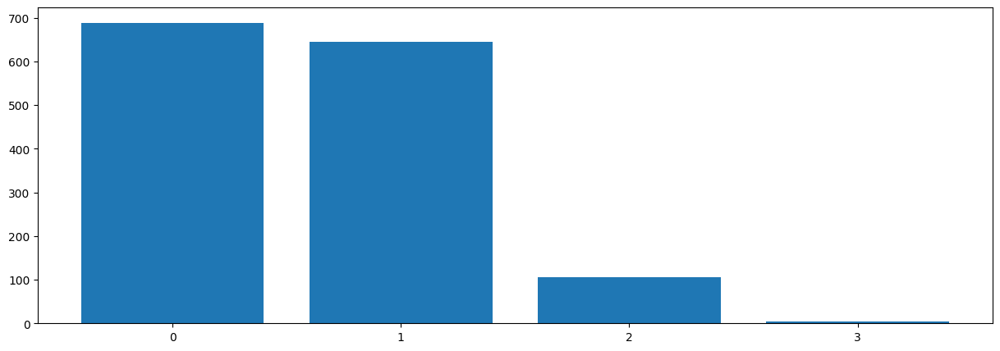

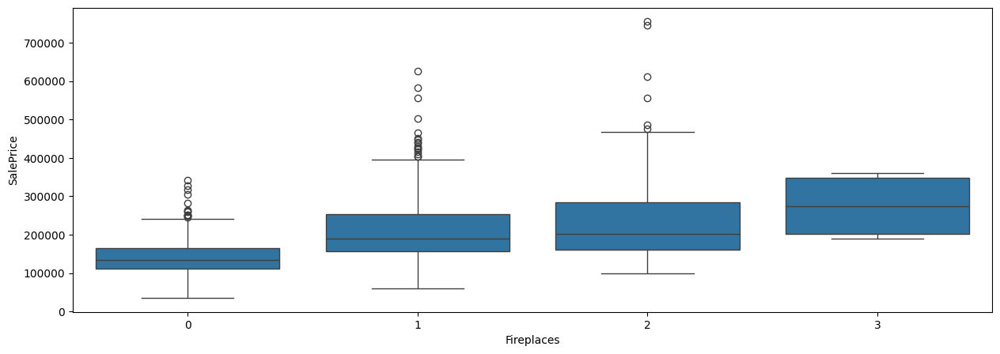


After
  Fireplaces   Id  rank
1   non zero  755   2.0
0          0  689   1.0


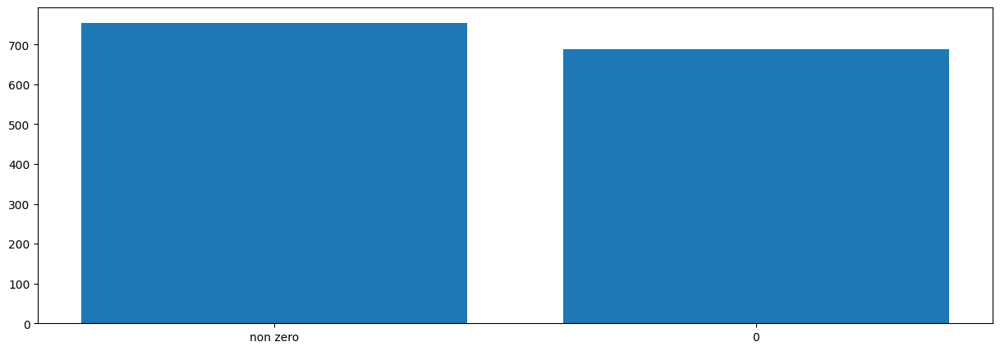

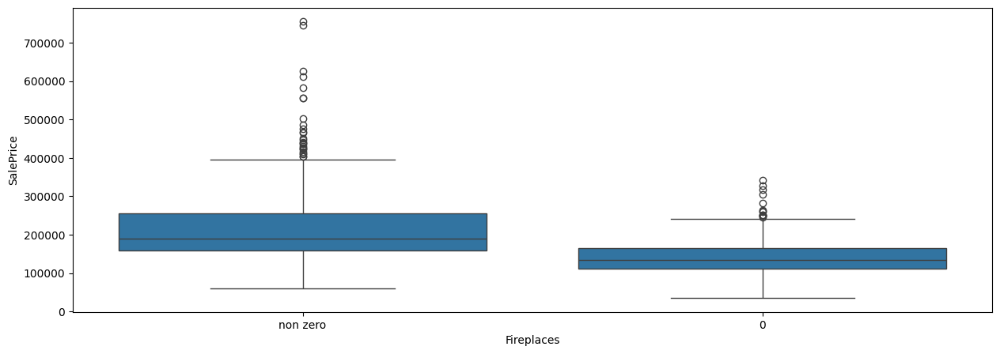

In [78]:
print('Before')
cat_eda('Fireplaces')
print()

dataset_df['Fireplaces'] = dataset_df['Fireplaces'].astype(int)

grouping_logic = ((dataset_df['Fireplaces']>0))
dataset_df.loc[grouping_logic,'Fireplaces'] = 'non zero'

dataset_df['Fireplaces'] = dataset_df['Fireplaces'].astype(str)

print('After')
cat_eda('Fireplaces')

##### BedroomAbvGr Column

As per the EDA, dropping the column because of similar distribution

In [79]:
dataset_df = dataset_df.drop(columns=['BedroomAbvGr'])

##### KitchenAbvGr Column

As per the EDA, grouping together values not eq to 1 into "lt_r_gt_1" category

Before
   KitchenAbvGr    Id  rank
1             1  1376   4.0
2             2    65   3.0
3             3     2   2.0
0             0     1   1.0


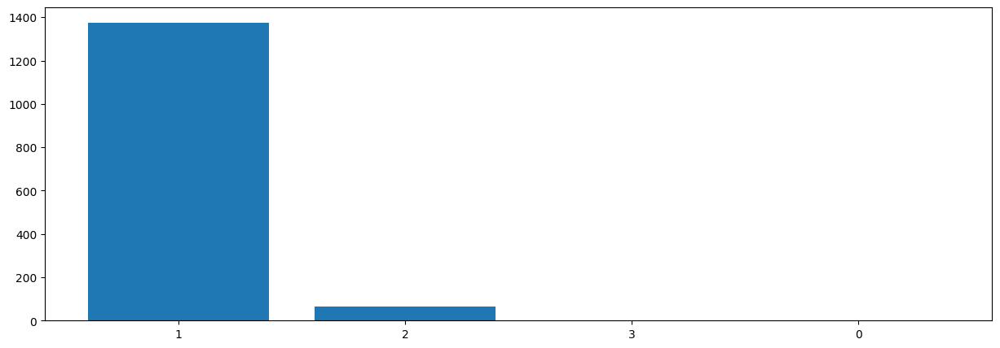

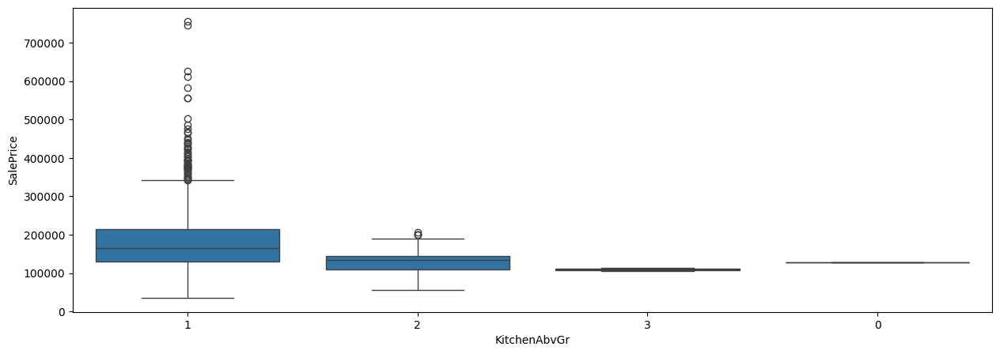


After
  KitchenAbvGr    Id  rank
0            1  1376   2.0
1    lt_r_gt_1    68   1.0


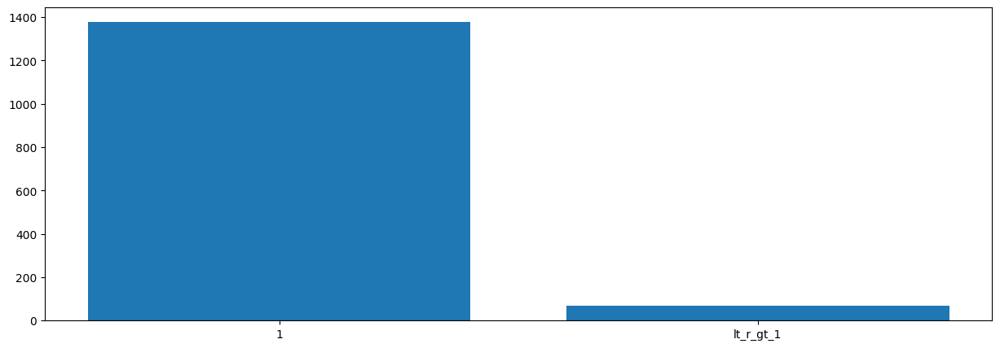

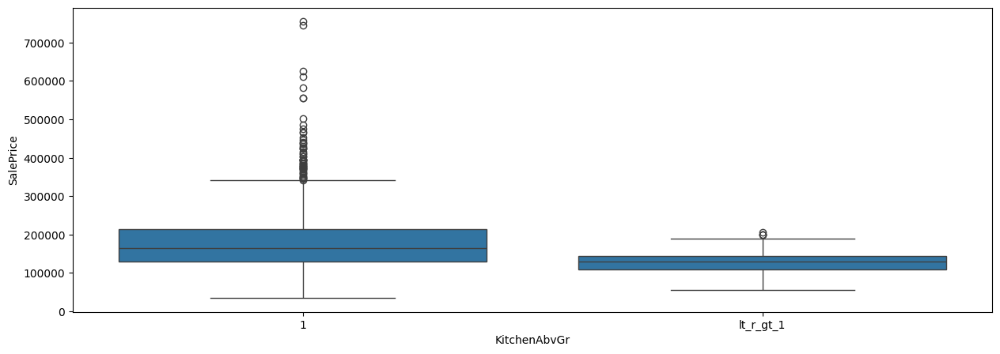

In [80]:
print('Before')
cat_eda('KitchenAbvGr')
print()

dataset_df['KitchenAbvGr'] = dataset_df['KitchenAbvGr'].astype(int)

grouping_logic = ((dataset_df['KitchenAbvGr']>1) | (dataset_df['KitchenAbvGr']<1))
dataset_df.loc[grouping_logic,'KitchenAbvGr'] = 'lt_r_gt_1'

dataset_df['KitchenAbvGr'] = dataset_df['KitchenAbvGr'].astype(str)

print('After')
cat_eda('KitchenAbvGr')

##### Updating the category columns

In [81]:
cat_cols = [ col for col in cat_cols if col in dataset_df.columns ]

# Step 2: Preparing the Data for Modelling

## Encoding

In [82]:
dataset_df[ cat_cols ].nunique()

MSSubClass       4
MSZoning         3
Alley            3
LotShape         3
Neighborhood     6
Condition1       2
BldgType         3
HouseStyle       3
RoofStyle        3
Exterior1st      3
Exterior2nd      3
MasVnrType       3
Foundation       3
CentralAir       2
Electrical       2
Functional       2
GarageType       4
PavedDrive       2
MiscFeature      2
SaleType         3
SaleCondition    3
ExterQual        3
BsmtQual         3
BsmtCond         3
BsmtExposure     4
BsmtFinType1     3
BsmtFinType2     3
HeatingQC        2
KitchenQual      4
FireplaceQu      3
GarageFinish     4
GarageQual       2
GarageCond       2
Fence            3
GarageYrBlt      4
YearBuilt        3
YearRemodAdd     2
BsmtFullBath     2
BsmtHalfBath     2
FullBath         3
HalfBath         2
OverallCond      4
Fireplaces       2
KitchenAbvGr     2
dtype: int64

In [83]:
for col in cat_cols:
    unq_vals = dataset_df[col].unique().tolist()
    if 'Non' in unq_vals:
        dataset_df[col] = dataset_df[col].replace({'Non': np.nan})
        col_dummies = pd.get_dummies( dataset_df[col], prefix=col, prefix_sep='|', dtype=int )
        dataset_df = dataset_df.drop(columns=[col])
        dataset_df = pd.merge(dataset_df, col_dummies, left_index=True, right_index=True)
    else:
        col_dummies = pd.get_dummies( dataset_df[col], prefix=col, prefix_sep='|', dtype=int, drop_first=True )
        dataset_df = dataset_df.drop(columns=[col])
        dataset_df = pd.merge(dataset_df, col_dummies, left_index=True, right_index=True)

dataset_df.shape

(1444, 100)

## Train - Test Split

In [84]:
ignore = [ dataset_df.pop(col) for col in other_cols ]

In [85]:
y = dataset_df.pop(target_col)
X = dataset_df

In [86]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=100)

## Re-scaling Numerical Columns

In [87]:
scaler = MinMaxScaler()
X_train[ num_cols ] = scaler.fit_transform( X_train[ num_cols ] )
X_train[ num_cols ].head()

,LotFrontage,LotArea,OverallQual,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,TotRmsAbvGrd,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF
111,0.000000,0.183239,0.666667,0.00000,0.114260,0.062239,0.119775,0.152039,0.317676,0.264606,0.5,0.50,0.287770,0.244565,0.000000
199,0.436782,0.235540,0.777778,0.16375,0.497258,0.290293,0.534311,0.476503,0.000000,0.332931,0.5,0.75,0.615827,0.000000,0.047532
68,0.270115,0.093977,0.333333,0.00000,0.000000,0.346958,0.233001,0.142709,0.000000,0.099710,0.2,0.25,0.158273,0.000000,0.000000
1183,0.344828,0.269886,0.444444,0.00000,0.375229,0.138876,0.349345,0.275052,0.000000,0.192178,0.3,0.50,0.517986,0.311141,0.000000
408,0.626437,0.365170,0.666667,0.21875,0.000000,0.493730,0.331566,0.254665,0.533172,0.443747,0.7,0.75,0.681295,0.260870,0.113346


In [88]:
X_test[ num_cols ] = scaler.transform( X_test[ num_cols ] )
X_test[ num_cols ].head()

,LotFrontage,LotArea,OverallQual,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,TotRmsAbvGrd,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF
1255,0.298851,0.140341,0.555556,0.000000,0.194241,0.213191,0.275733,0.215964,0.197579,0.249396,0.4,0.25,0.402878,0.000000,0.000000
30,0.287356,0.204545,0.333333,0.000000,0.000000,0.301440,0.202433,0.108846,0.323487,0.237325,0.4,0.25,0.179856,0.000000,0.098720
899,0.373563,0.161733,0.444444,0.000000,0.212523,0.207617,0.284467,0.311679,0.000000,0.217769,0.4,0.25,0.207194,0.000000,0.000000
1203,0.431034,0.240057,0.666667,0.106875,0.000000,0.757083,0.508422,0.447823,0.000000,0.312892,0.4,0.50,0.324460,0.100543,0.427788
278,0.614943,0.373580,0.888889,0.196875,0.000000,0.985137,0.661572,0.617484,0.000000,0.431434,0.6,0.75,0.526619,0.168478,0.179159


# Step 3: Building the Model

## Transformations on Numerical Features

In [89]:
def create_model_n_plot_residual_using_sm():
    X_train_sm = sm.add_constant(X_train)
    lr = sm.OLS(y_train, X_train_sm)
    lr_model = lr.fit()
    print(f"R2-score: {lr_model.rsquared}")

    y_train_pred = lr_model.predict(X_train_sm)
    res = y_train - y_train_pred

    fig, (ax_l,ax_r) = plt.subplots(1, 2, figsize=(15,5))
    sns.scatterplot(x=y_train, y=res, ax=ax_l)
    sns.distplot(res, ax=ax_r)
    plt.show()

    return res
    

R2-score: 0.9170561568988007


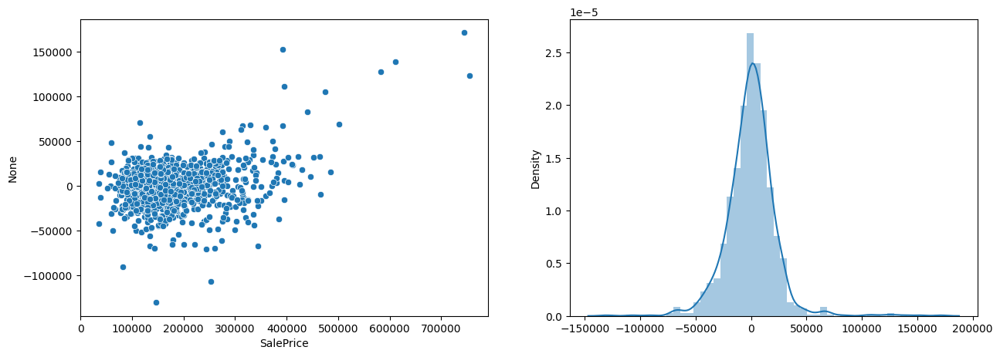

In [90]:
res = create_model_n_plot_residual_using_sm()

Spread of Residual -> Normal and centered around 0 as expected <br>
Residual vs Dependent Variable scatterplot -> lot of outliers with huge residuals above dependent variable value 500000

So, removing these outliers and splitting the X_test and X_train again

In [91]:
dataset_df[target_col] = y
dataset_df = dataset_df[ dataset_df[target_col] <= 500000 ]

y = dataset_df.pop(target_col)
X = dataset_df

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=100)

R2-score: 0.92083813151801


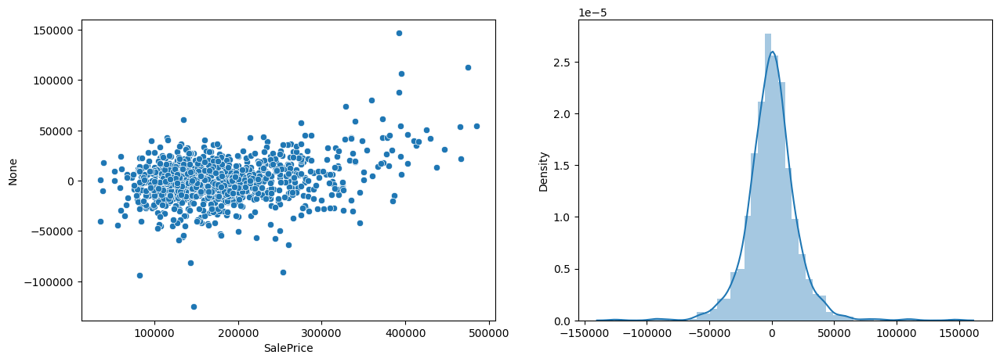

In [92]:
res = create_model_n_plot_residual_using_sm()

Again,<br>
Spread of Residual -> Normal and centered around 0 as expected<br>
Residual vs Dependent Variable scatterplot ->A pattern that looks like an exponent is seen 0

So, plotting residual vs numerical independent feature to figure out which is causing the pattern

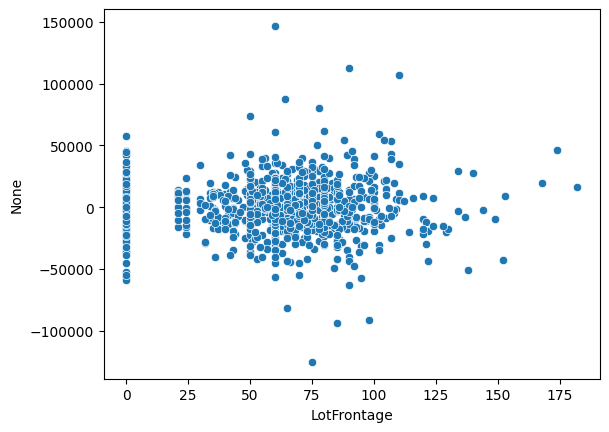

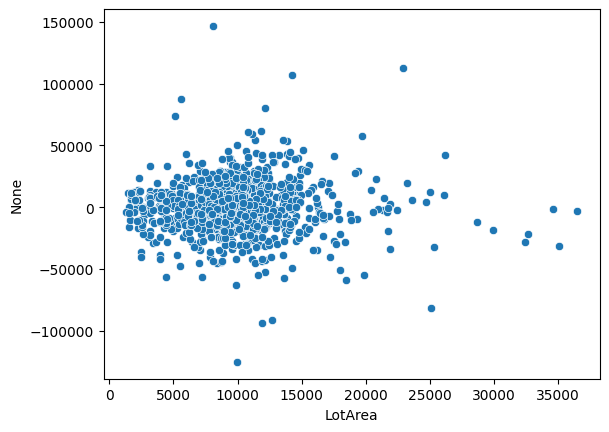

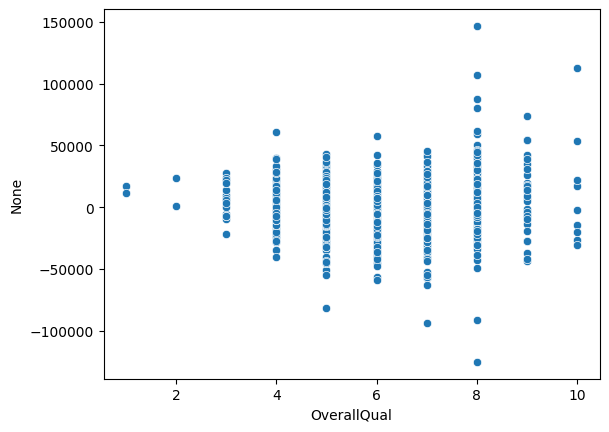

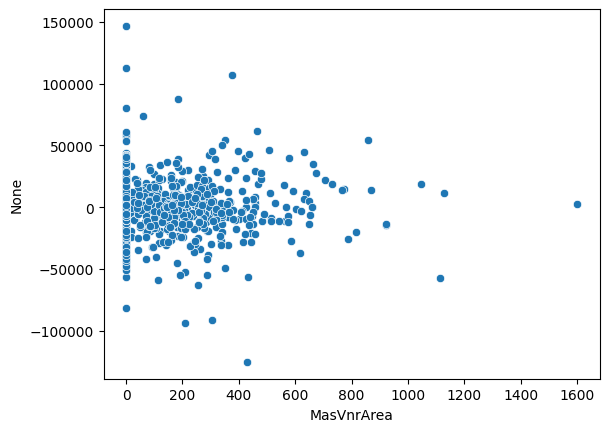

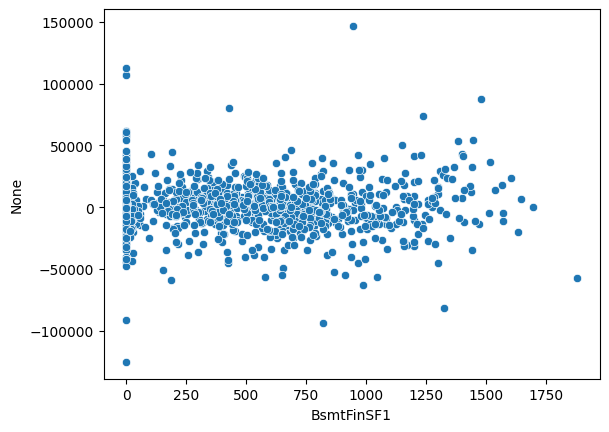

...

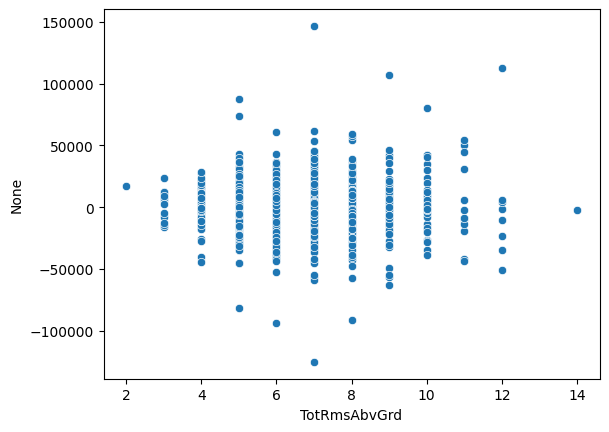

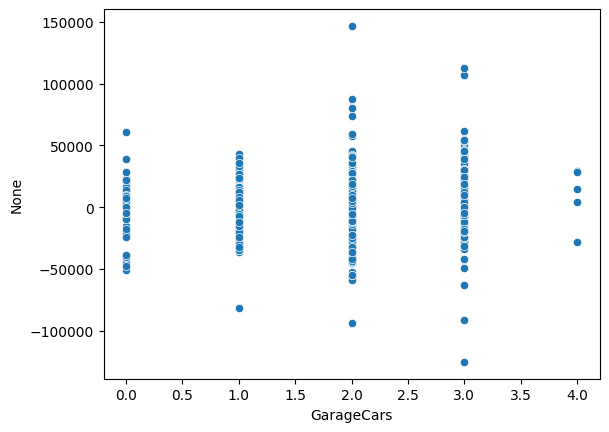

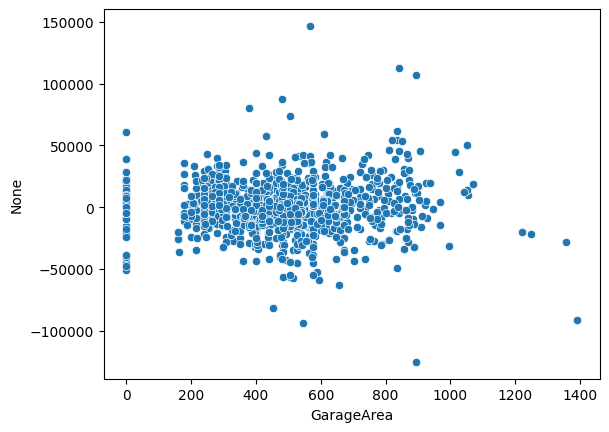

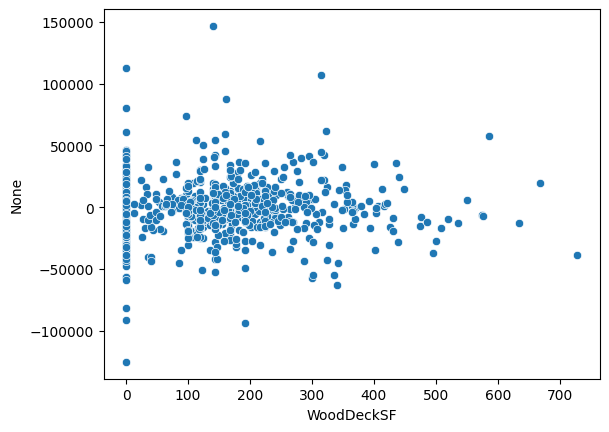

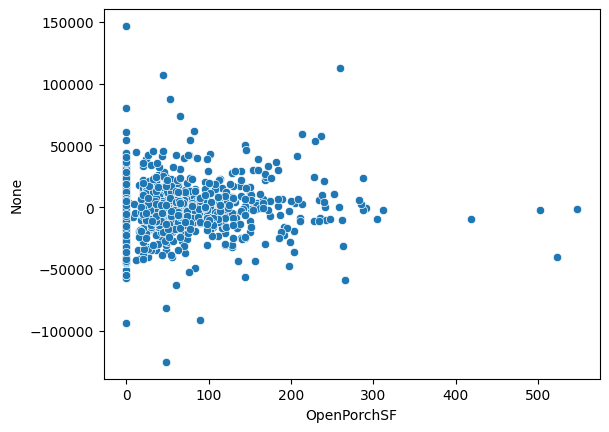

In [93]:
for col in num_cols:
    sns.scatterplot(x=X_train[col], y=res)
    plt.show()

No pattern are seen in the residual vs independent graph.

So, need to apply transformation on the target variable

Since the pattern is exponential, applying logarithmic transformation (the inverse of exponential) to target feature

In [94]:
target_col = 'log_of_' + target_col
dataset_df[target_col] = y.apply(np.log)

y = dataset_df.pop(target_col)
X = dataset_df

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=100)

R2-score: 0.9172098621250554


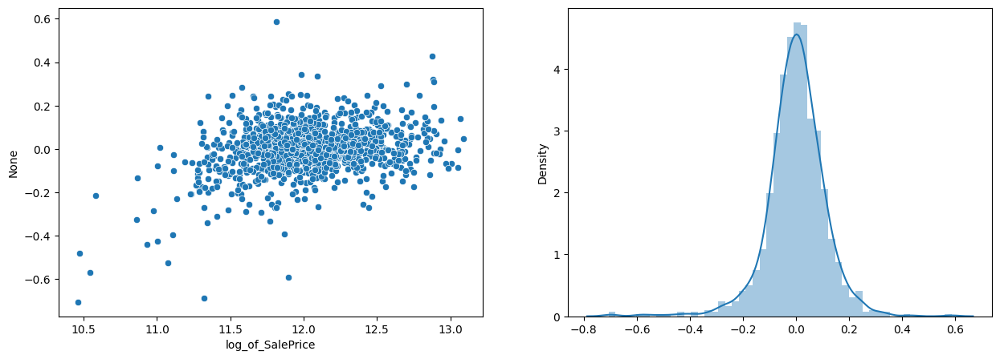

In [95]:
res = create_model_n_plot_residual_using_sm()

Found more outliers above log of target feature < 11.25.<br>
So, removing the same.

In [96]:
dataset_df[target_col] = y
dataset_df = dataset_df[ dataset_df[target_col] >+ 11.25 ]

y = dataset_df.pop(target_col)
X = dataset_df

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=100)

R2-score: 0.9322694812342078


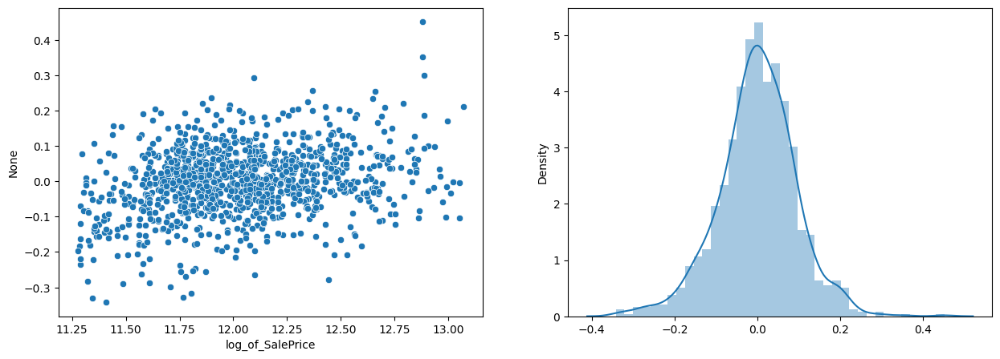

In [97]:
res = create_model_n_plot_residual_using_sm()

Now, all residual conditions are met, ie <br>
- Residual vs Dependent Variable scatterplot: residuals are spread randomly around 0
- Spread of Residual -> normal distribution and centered around 0

## Feature Selection based on Correlation and Significance

In [98]:
def corr_n_sign(X_train, y_train):

    def sign():
        X_train_sm = sm.add_constant(X_train)
        lr = sm.OLS(y_train, X_train_sm)
        lr_model = lr.fit()

        print(f"R2-score: {lr_model.rsquared}")
        print(f"Fvalue: {lr_model.fvalue}")
        print(f"F-pvalue: {lr_model.f_pvalue}")
        print()
        
        p_val_df = pd.DataFrame(lr_model.pvalues).reset_index()
        p_val_df = p_val_df.rename(columns={'index':'columns', 0:'p-value'})
        p_val_df = p_val_df.sort_values(by="p-value", ascending=False).reset_index(drop=True)
        print("p-values:")
        print(p_val_df)
        print()

        print()

    def vif():
        list_col_vs_vif = []
        for idx, col in enumerate(X_train.columns):
            vif = variance_inflation_factor(X_train.values, idx)
            list_col_vs_vif += [ [col, vif] ]
        
        df_col_vs_vif = pd.DataFrame(list_col_vs_vif, columns=[ 'column', 'VIF' ])
        df_col_vs_vif = df_col_vs_vif.sort_values(by='VIF', ascending=False).reset_index(drop=True)

        print("VIF:")
        print(df_col_vs_vif)
        print()

    sign()
    vif()
    print()


In [99]:
def drop_col(col):
    dataset_df.drop(columns=[col], inplace=True)
    X_train.drop(columns=[col], inplace=True)
    X_test.drop(columns=[col], inplace=True)

In [100]:
corr_n_sign(X_train, y_train)

R2-score: 0.9322694812342078
Fvalue: 149.2349982453684
F-pvalue: 0.0

p-values:
                                columns       p-value
0                           BsmtCond|TA  9.770818e-01
1                       RoofStyle|other  9.678436e-01
2                   MiscFeature|Present  9.493219e-01
3               MasVnrType|Non_r_BrkCmn  8.758044e-01
4               Fence|MnPrv_GdWo_r_MnWw  8.747235e-01
5                      GarageFinish|Unf  8.719399e-01
6                    Neighborhood|other  8.410198e-01
7                      HouseStyle|other  8.279465e-01
8                          TotRmsAbvGrd  8.271486e-01
9                          ExterQual|Gd  7.665878e-01
10  GarageCond|other_rating_r_no_rating  7.475377e-01
11                        RoofStyle|Hip  7.255378e-01
12             YearBuilt|2000-till date  7.044874e-01
13                     Foundation|other  6.994959e-01
14                 ExterQual|low_rating  6.710831e-01
15                   BsmtHalfBath|non 0  6.573342e-01
16

Dropping "BsmtCond|TA", high p-value

In [101]:
drop_col("BsmtCond|TA")
corr_n_sign(X_train, y_train)

R2-score: 0.9322694269392762
Fvalue: 150.96890450906812
F-pvalue: 0.0

p-values:
                                columns       p-value
0                       RoofStyle|other  9.658689e-01
1                   MiscFeature|Present  9.494795e-01
2               MasVnrType|Non_r_BrkCmn  8.758147e-01
3               Fence|MnPrv_GdWo_r_MnWw  8.746866e-01
4                      GarageFinish|Unf  8.721240e-01
5                    Neighborhood|other  8.406014e-01
6                      HouseStyle|other  8.271981e-01
7                          TotRmsAbvGrd  8.260477e-01
8                          ExterQual|Gd  7.661345e-01
9   GarageCond|other_rating_r_no_rating  7.477080e-01
10                        RoofStyle|Hip  7.255327e-01
11             YearBuilt|2000-till date  7.029876e-01
12                     Foundation|other  6.984884e-01
13                 ExterQual|low_rating  6.713595e-01
14                   BsmtHalfBath|non 0  6.577367e-01
15                        MSSubClass|60  6.318600e-01
1

Dropping "RoofStyle|other", high p-value

In [102]:
drop_col("RoofStyle|other")
corr_n_sign(X_train, y_train)

R2-score: 0.9322693065956831
Fvalue: 152.7399390570664
F-pvalue: 0.0

p-values:
                                columns       p-value
0                   MiscFeature|Present  9.482472e-01
1               MasVnrType|Non_r_BrkCmn  8.759269e-01
2               Fence|MnPrv_GdWo_r_MnWw  8.748173e-01
3                      GarageFinish|Unf  8.712194e-01
4                    Neighborhood|other  8.399119e-01
5                      HouseStyle|other  8.260829e-01
6                          TotRmsAbvGrd  8.236742e-01
7                          ExterQual|Gd  7.665954e-01
8   GarageCond|other_rating_r_no_rating  7.495272e-01
9                         RoofStyle|Hip  7.264746e-01
10             YearBuilt|2000-till date  7.036333e-01
11                     Foundation|other  6.988652e-01
12                 ExterQual|low_rating  6.703705e-01
13                   BsmtHalfBath|non 0  6.568322e-01
14                        MSSubClass|60  6.327871e-01
15                           Alley|Grvl  6.282149e-01
16

Dropping "MiscFeature|Present", high p-value

In [103]:
drop_col("MiscFeature|Present")
corr_n_sign(X_train, y_train)

R2-score: 0.9322690299565274
Fvalue: 154.5490912392034
F-pvalue: 0.0

p-values:
                                columns       p-value
0               Fence|MnPrv_GdWo_r_MnWw  8.796927e-01
1               MasVnrType|Non_r_BrkCmn  8.757157e-01
2                      GarageFinish|Unf  8.740518e-01
3                    Neighborhood|other  8.381485e-01
4                          TotRmsAbvGrd  8.239674e-01
5                      HouseStyle|other  8.223980e-01
6                          ExterQual|Gd  7.614217e-01
7   GarageCond|other_rating_r_no_rating  7.492193e-01
8                         RoofStyle|Hip  7.278325e-01
9              YearBuilt|2000-till date  6.994405e-01
10                     Foundation|other  6.973127e-01
11                 ExterQual|low_rating  6.733045e-01
12                   BsmtHalfBath|non 0  6.573353e-01
13                        MSSubClass|60  6.323243e-01
14                           Alley|Grvl  6.301517e-01
15                    HouseStyle|2Story  6.024401e-01
16

Dropping "Fence|MnPrv_GdWo_r_MnWw", high p-value

In [104]:
drop_col("Fence|MnPrv_GdWo_r_MnWw")
corr_n_sign(X_train, y_train)

R2-score: 0.9322675270998986
Fvalue: 156.39496657714642
F-pvalue: 0.0

p-values:
                                columns       p-value
0                      GarageFinish|Unf  8.698864e-01
1               MasVnrType|Non_r_BrkCmn  8.678351e-01
2                    Neighborhood|other  8.355643e-01
3                      HouseStyle|other  8.209919e-01
4                          TotRmsAbvGrd  8.204287e-01
5                          ExterQual|Gd  7.615991e-01
6   GarageCond|other_rating_r_no_rating  7.481235e-01
7                         RoofStyle|Hip  7.286801e-01
8              YearBuilt|2000-till date  7.000866e-01
9                      Foundation|other  6.887918e-01
10                 ExterQual|low_rating  6.761371e-01
11                   BsmtHalfBath|non 0  6.582700e-01
12                        MSSubClass|60  6.346358e-01
13                           Alley|Grvl  6.294254e-01
14                    HouseStyle|2Story  5.983832e-01
15                     MSSubClass|other  5.802733e-01
1

Same ...

In [105]:
drop_col("GarageFinish|Unf")
corr_n_sign(X_train, y_train)

R2-score: 0.9322675270998985
Fvalue: 156.39496657714636
F-pvalue: 0.0

p-values:
                                columns       p-value
0               MasVnrType|Non_r_BrkCmn  8.678351e-01
1                    Neighborhood|other  8.355643e-01
2                      HouseStyle|other  8.209919e-01
3                          TotRmsAbvGrd  8.204287e-01
4                          ExterQual|Gd  7.615991e-01
5   GarageCond|other_rating_r_no_rating  7.481235e-01
6                         RoofStyle|Hip  7.286801e-01
7              YearBuilt|2000-till date  7.000866e-01
8                      Foundation|other  6.887918e-01
9                      GarageType|other  6.761844e-01
10                 ExterQual|low_rating  6.761371e-01
11                   BsmtHalfBath|non 0  6.582700e-01
12                        MSSubClass|60  6.346358e-01
13                           Alley|Grvl  6.294254e-01
14                    HouseStyle|2Story  5.983832e-01
15                     MSSubClass|other  5.802733e-01
1

In [106]:
drop_col("MasVnrType|Non_r_BrkCmn")
corr_n_sign(X_train, y_train)

R2-score: 0.932265712228163
Fvalue: 158.28107216152858
F-pvalue: 0.0

p-values:
                                columns       p-value
0                    Neighborhood|other  8.284239e-01
1                      HouseStyle|other  8.183639e-01
2                          TotRmsAbvGrd  8.114059e-01
3                          ExterQual|Gd  7.510404e-01
4   GarageCond|other_rating_r_no_rating  7.465142e-01
5                         RoofStyle|Hip  7.343310e-01
6              YearBuilt|2000-till date  6.909987e-01
7                      Foundation|other  6.853465e-01
8                  ExterQual|low_rating  6.812577e-01
9                      GarageType|other  6.800839e-01
10                   BsmtHalfBath|non 0  6.553832e-01
11                        MSSubClass|60  6.350049e-01
12                           Alley|Grvl  6.278562e-01
13                    HouseStyle|2Story  5.958499e-01
14                     MSSubClass|other  5.822484e-01
15                       FireplaceQu|Ex  5.249481e-01
16

In [107]:
drop_col("Neighborhood|other")
corr_n_sign(X_train, y_train)

R2-score: 0.9322626368420616
Fvalue: 160.2063555674936
F-pvalue: 0.0

p-values:
                                columns       p-value
0                      HouseStyle|other  8.194040e-01
1                          TotRmsAbvGrd  8.103970e-01
2   GarageCond|other_rating_r_no_rating  7.494670e-01
3                          ExterQual|Gd  7.494423e-01
4                         RoofStyle|Hip  7.267185e-01
5              YearBuilt|2000-till date  6.939115e-01
6                      Foundation|other  6.859647e-01
7                      GarageType|other  6.761319e-01
8                  ExterQual|low_rating  6.760305e-01
9                    BsmtHalfBath|non 0  6.598037e-01
10                        MSSubClass|60  6.319223e-01
11                           Alley|Grvl  6.272027e-01
12                    HouseStyle|2Story  5.940925e-01
13                     MSSubClass|other  5.685573e-01
14                       FireplaceQu|Ex  5.179622e-01
15                        MSSubClass|50  5.012022e-01
16

In [108]:
drop_col("HouseStyle|other")
corr_n_sign(X_train, y_train)

R2-score: 0.9322592269140619
Fvalue: 162.17452178848245
F-pvalue: 0.0

p-values:
                                columns       p-value
0                          TotRmsAbvGrd  8.065317e-01
1                          ExterQual|Gd  7.569739e-01
2   GarageCond|other_rating_r_no_rating  7.452531e-01
3                         RoofStyle|Hip  7.231671e-01
4                  ExterQual|low_rating  6.782673e-01
5                      GarageType|other  6.779093e-01
6                      Foundation|other  6.676366e-01
7              YearBuilt|2000-till date  6.646315e-01
8                         MSSubClass|60  6.611552e-01
9                    BsmtHalfBath|non 0  6.465945e-01
10                           Alley|Grvl  6.183761e-01
11                     MSSubClass|other  5.877555e-01
12                       FireplaceQu|Ex  5.202372e-01
13                        MSSubClass|50  4.898355e-01
14                 Neighborhood|NoRidge  4.569310e-01
15                    HouseStyle|2Story  4.439423e-01
1

In [109]:
drop_col("TotRmsAbvGrd")
corr_n_sign(X_train, y_train)

R2-score: 0.9322553069608739
Fvalue: 164.18659108339207
F-pvalue: 0.0

p-values:
                                columns       p-value
0                          ExterQual|Gd  7.678140e-01
1   GarageCond|other_rating_r_no_rating  7.366966e-01
2                         RoofStyle|Hip  7.312105e-01
3                      GarageType|other  6.759255e-01
4                      Foundation|other  6.716758e-01
5                  ExterQual|low_rating  6.715316e-01
6                         MSSubClass|60  6.597691e-01
7              YearBuilt|2000-till date  6.571032e-01
8                    BsmtHalfBath|non 0  6.471822e-01
9                            Alley|Grvl  6.060307e-01
10                     MSSubClass|other  5.862291e-01
11                       FireplaceQu|Ex  5.080832e-01
12                        MSSubClass|50  4.884039e-01
13                 Neighborhood|NoRidge  4.644626e-01
14                    HouseStyle|2Story  4.443664e-01
15                     GarageFinish|RFn  4.277643e-01
1

In [110]:
drop_col("ExterQual|Gd")
corr_n_sign(X_train, y_train)

R2-score: 0.9322496152529649
Fvalue: 166.24077055393158
F-pvalue: 0.0

p-values:
                                columns       p-value
0   GarageCond|other_rating_r_no_rating  7.370402e-01
1                         RoofStyle|Hip  7.105453e-01
2                      GarageType|other  6.798779e-01
3                      Foundation|other  6.701879e-01
4              YearBuilt|2000-till date  6.573562e-01
5                         MSSubClass|60  6.549870e-01
6                    BsmtHalfBath|non 0  6.430675e-01
7                            Alley|Grvl  6.044984e-01
8                      MSSubClass|other  5.813225e-01
9                        FireplaceQu|Ex  5.160611e-01
10                        MSSubClass|50  4.814314e-01
11                 Neighborhood|NoRidge  4.631021e-01
12                    HouseStyle|2Story  4.393657e-01
13                           GarageArea  4.280468e-01
14           GarageYrBlt|2000-till date  4.203455e-01
15                     GarageFinish|RFn  4.198803e-01
1

In [111]:
drop_col("GarageCond|other_rating_r_no_rating")
corr_n_sign(X_train, y_train)

R2-score: 0.9322422595070933
Fvalue: 168.3388222658223
F-pvalue: 0.0

p-values:
                                columns       p-value
0                         RoofStyle|Hip  7.230418e-01
1                      Foundation|other  6.659197e-01
2              YearBuilt|2000-till date  6.528655e-01
3                         MSSubClass|60  6.465128e-01
4                    BsmtHalfBath|non 0  6.422589e-01
5                            Alley|Grvl  5.987208e-01
6                      MSSubClass|other  5.852025e-01
7                      GarageType|other  5.656185e-01
8                        FireplaceQu|Ex  5.253341e-01
9                         MSSubClass|50  4.736476e-01
10           GarageYrBlt|2000-till date  4.546257e-01
11                 Neighborhood|NoRidge  4.528846e-01
12                    HouseStyle|2Story  4.476592e-01
13                           GarageArea  4.304832e-01
14                     GarageFinish|RFn  4.079102e-01
15                          LotFrontage  3.890705e-01
16

In [112]:
drop_col("RoofStyle|Hip")
corr_n_sign(X_train, y_train)

R2-score: 0.9322340722339626
Fvalue: 170.48454971038663
F-pvalue: 0.0

p-values:
                                columns       p-value
0                      Foundation|other  6.813826e-01
1              YearBuilt|2000-till date  6.618634e-01
2                         MSSubClass|60  6.506045e-01
3                    BsmtHalfBath|non 0  6.405359e-01
4                      MSSubClass|other  5.941566e-01
5                            Alley|Grvl  5.933971e-01
6                      GarageType|other  5.624882e-01
7                        FireplaceQu|Ex  5.319940e-01
8                         MSSubClass|50  4.869921e-01
9            GarageYrBlt|2000-till date  4.576895e-01
10                    HouseStyle|2Story  4.490766e-01
11                 Neighborhood|NoRidge  4.489650e-01
12                           GarageArea  4.225396e-01
13                     GarageFinish|RFn  4.087727e-01
14                          LotFrontage  3.992951e-01
15                           MasVnrArea  3.943847e-01
1

In [113]:
drop_col("Foundation|other")
corr_n_sign(X_train, y_train)

R2-score: 0.9322230924462244
Fvalue: 172.67431185389583
F-pvalue: 0.0

p-values:
                                columns       p-value
0                    BsmtHalfBath|non 0  6.344533e-01
1                         MSSubClass|60  6.335574e-01
2              YearBuilt|2000-till date  6.192269e-01
3                            Alley|Grvl  6.005702e-01
4                      MSSubClass|other  5.660226e-01
5                      GarageType|other  5.448025e-01
6                        FireplaceQu|Ex  5.331538e-01
7            GarageYrBlt|2000-till date  4.749334e-01
8                         MSSubClass|50  4.728730e-01
9                     HouseStyle|2Story  4.575523e-01
10                 Neighborhood|NoRidge  4.519680e-01
11                           GarageArea  4.223508e-01
12                     GarageFinish|RFn  4.178304e-01
13                          LotFrontage  4.010016e-01
14                           MasVnrArea  3.832290e-01
15                          Fence|GdPrv  3.595253e-01
1

In [114]:
drop_col("BsmtHalfBath|non 0")
corr_n_sign(X_train, y_train)

R2-score: 0.9322083790609264
Fvalue: 174.90710034086314
F-pvalue: 0.0

p-values:
                                columns       p-value
0                         MSSubClass|60  6.396811e-01
1              YearBuilt|2000-till date  6.260066e-01
2                            Alley|Grvl  5.875190e-01
3                      MSSubClass|other  5.676765e-01
4                      GarageType|other  5.593079e-01
5                        FireplaceQu|Ex  5.398125e-01
6                         MSSubClass|50  4.798954e-01
7            GarageYrBlt|2000-till date  4.633275e-01
8                     HouseStyle|2Story  4.572142e-01
9                  Neighborhood|NoRidge  4.547348e-01
10                           GarageArea  4.274866e-01
11                     GarageFinish|RFn  4.267439e-01
12                          LotFrontage  3.989482e-01
13                           MasVnrArea  3.724040e-01
14                          Fence|GdPrv  3.584800e-01
15                      BsmtExposure|No  3.547763e-01
1

In [115]:
drop_col("MSSubClass|60")
corr_n_sign(X_train, y_train)

R2-score: 0.932194126072196
Fvalue: 177.19624890628592
F-pvalue: 0.0

p-values:
                                columns       p-value
0                      MSSubClass|other  6.435898e-01
1              YearBuilt|2000-till date  6.224879e-01
2                            Alley|Grvl  5.679503e-01
3                      GarageType|other  5.622797e-01
4                        FireplaceQu|Ex  5.363684e-01
5                         MSSubClass|50  5.131714e-01
6                  Neighborhood|NoRidge  4.737238e-01
7            GarageYrBlt|2000-till date  4.636727e-01
8                      GarageFinish|RFn  4.437563e-01
9                            GarageArea  4.352941e-01
10                          LotFrontage  3.905712e-01
11                           MasVnrArea  3.710458e-01
12                          Fence|GdPrv  3.573024e-01
13                      BsmtExposure|No  3.476587e-01
14                    HouseStyle|2Story  3.354681e-01
15                    GarageType|Detchd  3.236726e-01
16

In [116]:
drop_col("MSSubClass|other")
corr_n_sign(X_train, y_train)

R2-score: 0.9321802140224895
Fvalue: 179.54353394312722
F-pvalue: 0.0

p-values:
                                columns       p-value
0                         MSSubClass|50  6.291562e-01
1                            Alley|Grvl  5.701190e-01
2                      GarageType|other  5.564620e-01
3              YearBuilt|2000-till date  5.502193e-01
4                        FireplaceQu|Ex  5.245241e-01
5                  Neighborhood|NoRidge  4.635416e-01
6            GarageYrBlt|2000-till date  4.543284e-01
7                      GarageFinish|RFn  4.431307e-01
8                            GarageArea  4.430310e-01
9                           LotFrontage  3.798861e-01
10                           MasVnrArea  3.776484e-01
11                    HouseStyle|2Story  3.670822e-01
12                      BsmtExposure|No  3.459426e-01
13                          Fence|GdPrv  3.398673e-01
14                    GarageType|Detchd  3.237318e-01
15                 BsmtExposure|Av_r_Mn  3.218642e-01
1

In [117]:
drop_col("MSSubClass|50")
corr_n_sign(X_train, y_train)

R2-score: 0.9321650701299834
Fvalue: 181.9466392091067
F-pvalue: 0.0

p-values:
                                columns       p-value
0                            Alley|Grvl  6.175736e-01
1                      GarageType|other  5.656387e-01
2                        FireplaceQu|Ex  5.328437e-01
3              YearBuilt|2000-till date  5.067311e-01
4                  Neighborhood|NoRidge  4.637105e-01
5            GarageYrBlt|2000-till date  4.538058e-01
6                     HouseStyle|2Story  4.459427e-01
7                            GarageArea  4.414890e-01
8                      GarageFinish|RFn  4.313121e-01
9                           LotFrontage  3.829636e-01
10                           MasVnrArea  3.807532e-01
11                          Fence|GdPrv  3.503451e-01
12                      BsmtExposure|No  3.446622e-01
13                    GarageType|Detchd  3.332875e-01
14                 BsmtExposure|Av_r_Mn  3.205132e-01
15                  Fireplaces|non zero  3.044622e-01
16

In [118]:
drop_col("Alley|Grvl")
corr_n_sign(X_train, y_train)

R2-score: 0.9321488934131781
Fvalue: 184.40828645934383
F-pvalue: 0.0

p-values:
                                columns       p-value
0                      GarageType|other  5.457926e-01
1                        FireplaceQu|Ex  5.305699e-01
2              YearBuilt|2000-till date  5.093326e-01
3            GarageYrBlt|2000-till date  4.657417e-01
4                  Neighborhood|NoRidge  4.656542e-01
5                     HouseStyle|2Story  4.466184e-01
6                            GarageArea  4.341902e-01
7                      GarageFinish|RFn  4.341485e-01
8                           LotFrontage  3.874454e-01
9                            MasVnrArea  3.789196e-01
10                          Fence|GdPrv  3.635335e-01
11                      BsmtExposure|No  3.438590e-01
12                    GarageType|Detchd  3.432277e-01
13                 BsmtExposure|Av_r_Mn  3.203221e-01
14                  Fireplaces|non zero  3.078855e-01
15                           BsmtFinSF1  2.904607e-01
1

In [119]:
drop_col("GarageType|other")
corr_n_sign(X_train, y_train)

R2-score: 0.9321488934131781
Fvalue: 184.4082864593437
F-pvalue: 0.0

p-values:
                                columns       p-value
0            GarageYrBlt|2000-till date  8.143821e-01
1                        FireplaceQu|Ex  5.305699e-01
2              YearBuilt|2000-till date  5.093326e-01
3                  Neighborhood|NoRidge  4.656542e-01
4                     HouseStyle|2Story  4.466184e-01
5                            GarageArea  4.341902e-01
6                      GarageFinish|RFn  4.341485e-01
7                           LotFrontage  3.874454e-01
8                            MasVnrArea  3.789196e-01
9                 GarageYrBlt|1900-1949  3.682469e-01
10                          Fence|GdPrv  3.635335e-01
11                      BsmtExposure|No  3.438590e-01
12                 BsmtExposure|Av_r_Mn  3.203221e-01
13                  Fireplaces|non zero  3.078855e-01
14                           BsmtFinSF1  2.904607e-01
15                           Alley|Pave  2.805692e-01
16

In [120]:
drop_col("GarageYrBlt|2000-till date")
corr_n_sign(X_train, y_train)

R2-score: 0.9321453195426954
Fvalue: 186.9710517679028
F-pvalue: 0.0

p-values:
                                columns       p-value
0                        FireplaceQu|Ex  5.370918e-01
1                  Neighborhood|NoRidge  4.670563e-01
2                     HouseStyle|2Story  4.348164e-01
3                      GarageFinish|RFn  4.204760e-01
4                            GarageArea  4.143679e-01
5                           LotFrontage  3.938063e-01
6                            MasVnrArea  3.863460e-01
7                           Fence|GdPrv  3.634706e-01
8                       BsmtExposure|No  3.439457e-01
9              YearBuilt|2000-till date  3.356866e-01
10                GarageYrBlt|1900-1949  3.284427e-01
11                 BsmtExposure|Av_r_Mn  3.198456e-01
12                  Fireplaces|non zero  3.005916e-01
13                           BsmtFinSF1  2.929904e-01
14                           Alley|Pave  2.811387e-01
15                            BsmtUnfSF  2.631159e-01
16

In [121]:
drop_col("FireplaceQu|Ex")
corr_n_sign(X_train, y_train)

R2-score: 0.9321453195426954
Fvalue: 186.97105176790296
F-pvalue: 0.0

p-values:
                                columns       p-value
0                   Fireplaces|non zero  9.887324e-01
1                  Neighborhood|NoRidge  4.670563e-01
2                     HouseStyle|2Story  4.348164e-01
3                      GarageFinish|RFn  4.204760e-01
4                            GarageArea  4.143679e-01
5                           LotFrontage  3.938063e-01
6                            MasVnrArea  3.863460e-01
7                           Fence|GdPrv  3.634706e-01
8                       BsmtExposure|No  3.439457e-01
9              YearBuilt|2000-till date  3.356866e-01
10                GarageYrBlt|1900-1949  3.284427e-01
11                 BsmtExposure|Av_r_Mn  3.198456e-01
12                           BsmtFinSF1  2.929904e-01
13                           Alley|Pave  2.811387e-01
14                            BsmtUnfSF  2.631159e-01
15   BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.581182e-01
1

In [122]:
drop_col("Fireplaces|non zero")
corr_n_sign(X_train, y_train)

R2-score: 0.9321453066234024
Fvalue: 189.61191341563327
F-pvalue: 0.0

p-values:
                                columns       p-value
0                  Neighborhood|NoRidge  4.665319e-01
1                     HouseStyle|2Story  4.346511e-01
2                      GarageFinish|RFn  4.200937e-01
3                            GarageArea  4.142027e-01
4                           LotFrontage  3.936036e-01
5                            MasVnrArea  3.861232e-01
6                           Fence|GdPrv  3.632968e-01
7                       BsmtExposure|No  3.436749e-01
8              YearBuilt|2000-till date  3.353732e-01
9                 GarageYrBlt|1900-1949  3.281224e-01
10                 BsmtExposure|Av_r_Mn  3.195386e-01
11                           BsmtFinSF1  2.927547e-01
12                           Alley|Pave  2.808538e-01
13                            BsmtUnfSF  2.627624e-01
14   BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.578735e-01
15                     BsmtFinType2|Unf  2.470674e-01
1

In [123]:
drop_col("Neighborhood|NoRidge")
corr_n_sign(X_train, y_train)

R2-score: 0.9321109869494357
Fvalue: 192.21893544943265
F-pvalue: 0.0

p-values:
                                columns       p-value
0                     HouseStyle|2Story  4.372016e-01
1                      GarageFinish|RFn  4.289759e-01
2                            GarageArea  4.090568e-01
3              YearBuilt|2000-till date  3.890658e-01
4                           LotFrontage  3.585611e-01
5                       BsmtExposure|No  3.391938e-01
6                 GarageYrBlt|1900-1949  3.352139e-01
7                           Fence|GdPrv  3.298382e-01
8                  BsmtExposure|Av_r_Mn  3.165770e-01
9                            MasVnrArea  3.010187e-01
10                           Alley|Pave  2.846928e-01
11                            BsmtUnfSF  2.789022e-01
12                           BsmtFinSF1  2.772850e-01
13                     MasVnrType|Stone  2.514384e-01
14   BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.464775e-01
15                     BsmtFinType2|Unf  2.372872e-01
1

In [124]:
drop_col("HouseStyle|2Story")
corr_n_sign(X_train, y_train)

R2-score: 0.9320719296047592
Fvalue: 194.88173941473116
F-pvalue: 0.0

p-values:
                                columns       p-value
0                      GarageFinish|RFn  4.499642e-01
1              YearBuilt|2000-till date  4.041140e-01
2                            GarageArea  4.033239e-01
3                           LotFrontage  3.646930e-01
4                           Fence|GdPrv  3.431562e-01
5                 GarageYrBlt|1900-1949  3.345281e-01
6                       BsmtExposure|No  3.333547e-01
7                            MasVnrArea  3.190982e-01
8                  BsmtExposure|Av_r_Mn  3.103675e-01
9                             BsmtUnfSF  2.876411e-01
10                           BsmtFinSF1  2.663230e-01
11                     MasVnrType|Stone  2.645685e-01
12                           Alley|Pave  2.538824e-01
13   BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.492485e-01
14                     BsmtFinType2|Unf  2.413910e-01
15                  Exterior2nd|VinylSd  2.219505e-01
1

In [125]:
drop_col("GarageFinish|RFn")
corr_n_sign(X_train, y_train)

R2-score: 0.9320350139099541
Fvalue: 197.6240863913712
F-pvalue: 0.0

p-values:
                                columns       p-value
0                            GarageArea  3.686369e-01
1                           LotFrontage  3.566825e-01
2              YearBuilt|2000-till date  3.558156e-01
3                           Fence|GdPrv  3.469675e-01
4                       BsmtExposure|No  3.380959e-01
5                  BsmtExposure|Av_r_Mn  3.144764e-01
6                 GarageYrBlt|1900-1949  3.130733e-01
7                             BsmtUnfSF  3.119797e-01
8                            MasVnrArea  3.090578e-01
9                      GarageFinish|Fin  2.955723e-01
10                     MasVnrType|Stone  2.644325e-01
11   BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.513547e-01
12                     BsmtFinType2|Unf  2.472951e-01
13                           BsmtFinSF1  2.423590e-01
14                           Alley|Pave  2.399181e-01
15                  Exterior2nd|VinylSd  2.095275e-01
16

In [126]:
drop_col("GarageArea")
corr_n_sign(X_train, y_train)

R2-score: 0.9319827513402879
Fvalue: 200.393988391729
F-pvalue: 0.0

p-values:
                                columns       p-value
0                           LotFrontage  3.707302e-01
1                           Fence|GdPrv  3.466186e-01
2                 GarageYrBlt|1900-1949  3.453792e-01
3                      GarageFinish|Fin  3.408853e-01
4              YearBuilt|2000-till date  3.403470e-01
5                       BsmtExposure|No  3.309302e-01
6                             BsmtUnfSF  3.202084e-01
7                  BsmtExposure|Av_r_Mn  3.065565e-01
8                            MasVnrArea  2.848476e-01
9                      MasVnrType|Stone  2.680867e-01
10                           Alley|Pave  2.560241e-01
11   BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.556696e-01
12                     BsmtFinType2|Unf  2.539976e-01
13                           BsmtFinSF1  2.302528e-01
14                  Exterior2nd|VinylSd  2.190832e-01
15                       LotShape|other  1.682176e-01
16 

In [127]:
drop_col("LotFrontage")
corr_n_sign(X_train, y_train)

R2-score: 0.931930953504432
Fvalue: 203.24334401561606
F-pvalue: 0.0

p-values:
                                columns       p-value
0              YearBuilt|2000-till date  3.583103e-01
1                 GarageYrBlt|1900-1949  3.571456e-01
2                           Fence|GdPrv  3.559517e-01
3                       BsmtExposure|No  3.370800e-01
4                      GarageFinish|Fin  3.319753e-01
5                             BsmtUnfSF  3.278445e-01
6                  BsmtExposure|Av_r_Mn  3.114520e-01
7                            MasVnrArea  3.026843e-01
8    BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.651888e-01
9                      BsmtFinType2|Unf  2.639650e-01
10                           Alley|Pave  2.635145e-01
11                     MasVnrType|Stone  2.600859e-01
12                  Exterior2nd|VinylSd  2.332763e-01
13                           BsmtFinSF1  2.331321e-01
14                       LotShape|other  1.664584e-01
15               KitchenAbvGr|lt_r_gt_1  1.506076e-01
16

In [128]:
drop_col("YearBuilt|2000-till date")
corr_n_sign(X_train, y_train)

R2-score: 0.931876411395689
Fvalue: 206.16513397916515
F-pvalue: 0.0

p-values:
                                columns       p-value
0                 GarageYrBlt|1900-1949  6.479899e-01
1                           Fence|GdPrv  3.513755e-01
2                       BsmtExposure|No  3.452036e-01
3                             BsmtUnfSF  3.405357e-01
4                      GarageFinish|Fin  3.294389e-01
5                  BsmtExposure|Av_r_Mn  3.180034e-01
6                            MasVnrArea  3.039965e-01
7                            Alley|Pave  2.905809e-01
8    BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.639130e-01
9                      BsmtFinType2|Unf  2.636631e-01
10                     MasVnrType|Stone  2.323768e-01
11                  Exterior2nd|VinylSd  2.296774e-01
12                           BsmtFinSF1  2.280785e-01
13                       LotShape|other  1.625396e-01
14               KitchenAbvGr|lt_r_gt_1  1.462311e-01
15                      BsmtExposure|Gd  1.350727e-01
16

In [129]:
drop_col("GarageYrBlt|1900-1949")
corr_n_sign(X_train, y_train)

R2-score: 0.9318629440264922
Fvalue: 209.30688034375626
F-pvalue: 0.0

p-values:
                                columns       p-value
0                           Fence|GdPrv  3.553639e-01
1                             BsmtUnfSF  3.428487e-01
2                       BsmtExposure|No  3.379671e-01
3                      GarageFinish|Fin  3.314054e-01
4                  BsmtExposure|Av_r_Mn  3.118933e-01
5                            MasVnrArea  3.086034e-01
6                            Alley|Pave  2.816802e-01
7                      BsmtFinType2|Unf  2.654624e-01
8    BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.653694e-01
9                      MasVnrType|Stone  2.381619e-01
10                           BsmtFinSF1  2.272722e-01
11                  Exterior2nd|VinylSd  2.161798e-01
12                       LotShape|other  1.567551e-01
13               KitchenAbvGr|lt_r_gt_1  1.514129e-01
14                 Neighborhood|OldTown  1.343869e-01
15                      BsmtExposure|Gd  1.313194e-01
1

In [130]:
drop_col("Fence|GdPrv")
corr_n_sign(X_train, y_train)

R2-score: 0.9318077787491725
Fvalue: 212.4014949453773
F-pvalue: 0.0

p-values:
                                columns       p-value
0                             BsmtUnfSF  3.433563e-01
1                       BsmtExposure|No  3.401852e-01
2                  BsmtExposure|Av_r_Mn  3.140117e-01
3                      GarageFinish|Fin  3.137719e-01
4                            MasVnrArea  3.029597e-01
5                            Alley|Pave  2.856398e-01
6                      BsmtFinType2|Unf  2.599002e-01
7    BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.591311e-01
8                      MasVnrType|Stone  2.371689e-01
9                   Exterior2nd|VinylSd  2.353353e-01
10                           BsmtFinSF1  2.230714e-01
11                       LotShape|other  1.640301e-01
12               KitchenAbvGr|lt_r_gt_1  1.500228e-01
13                 Neighborhood|OldTown  1.476553e-01
14                  Exterior1st|VinylSd  1.396654e-01
15                      BsmtExposure|Gd  1.323858e-01
16

In [131]:
drop_col("BsmtUnfSF")
corr_n_sign(X_train, y_train)

R2-score: 0.931749801424157
Fvalue: 215.57890147497625
F-pvalue: 0.0

p-values:
                                columns       p-value
0                       BsmtExposure|No  3.393890e-01
1                            MasVnrArea  3.323782e-01
2                  BsmtExposure|Av_r_Mn  3.116645e-01
3                      BsmtFinType2|Unf  3.092857e-01
4                            Alley|Pave  2.885255e-01
5                      GarageFinish|Fin  2.868593e-01
6    BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.616591e-01
7                      MasVnrType|Stone  2.463104e-01
8                   Exterior2nd|VinylSd  2.323426e-01
9                  Neighborhood|OldTown  1.608067e-01
10                       LotShape|other  1.494887e-01
11                  Exterior1st|VinylSd  1.396013e-01
12               KitchenAbvGr|lt_r_gt_1  1.391722e-01
13                      BsmtExposure|Gd  1.280914e-01
14                     Electrical|other  1.243328e-01
15                          OpenPorchSF  1.068490e-01
16

In [132]:
drop_col("BsmtExposure|No")
corr_n_sign(X_train, y_train)

R2-score: 0.9316908686332221
Fvalue: 218.84926925509203
F-pvalue: 0.0

p-values:
                                columns       p-value
0                  BsmtExposure|Av_r_Mn  4.497940e-01
1                            MasVnrArea  3.406535e-01
2                      BsmtFinType2|Unf  3.097242e-01
3                            Alley|Pave  2.869186e-01
4                      GarageFinish|Fin  2.713100e-01
5    BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.621650e-01
6                      MasVnrType|Stone  2.413020e-01
7                   Exterior2nd|VinylSd  2.325245e-01
8                      BsmtFinType1|GLQ  1.876341e-01
9                  Neighborhood|OldTown  1.622810e-01
10      BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  1.441742e-01
11                       LotShape|other  1.436499e-01
12                  Exterior1st|VinylSd  1.403956e-01
13               KitchenAbvGr|lt_r_gt_1  1.370851e-01
14                     Electrical|other  1.240670e-01
15                          OpenPorchSF  1.097276e-01
1

In [133]:
drop_col("BsmtExposure|Av_r_Mn")
corr_n_sign(X_train, y_train)

R2-score: 0.9316539988134263
Fvalue: 222.2972300662574
F-pvalue: 0.0

p-values:
                                columns       p-value
0                            MasVnrArea  3.423190e-01
1                      BsmtFinType2|Unf  2.993784e-01
2                            Alley|Pave  2.917039e-01
3                      GarageFinish|Fin  2.730872e-01
4    BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.500078e-01
5                   Exterior2nd|VinylSd  2.411036e-01
6                      MasVnrType|Stone  2.380745e-01
7                      BsmtFinType1|GLQ  1.869819e-01
8                  Neighborhood|OldTown  1.507332e-01
9                        LotShape|other  1.471680e-01
10                  Exterior1st|VinylSd  1.456975e-01
11      BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  1.423147e-01
12               KitchenAbvGr|lt_r_gt_1  1.360414e-01
13                     Electrical|other  1.290529e-01
14                          OpenPorchSF  1.097390e-01
15                             2ndFlrSF  7.842704e-02
16

In [134]:
drop_col("MasVnrArea")
corr_n_sign(X_train, y_train)

R2-score: 0.931595805624416
Fvalue: 225.77726199535286
F-pvalue: 0.0

p-values:
                                columns       p-value
0                      BsmtFinType2|Unf  2.906046e-01
1                            Alley|Pave  2.829176e-01
2                      GarageFinish|Fin  2.704868e-01
3                   Exterior2nd|VinylSd  2.509408e-01
4    BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.440039e-01
5                      MasVnrType|Stone  2.179745e-01
6                      BsmtFinType1|GLQ  1.772396e-01
7                        LotShape|other  1.547834e-01
8                   Exterior1st|VinylSd  1.492989e-01
9                  Neighborhood|OldTown  1.341314e-01
10      BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  1.330175e-01
11                     Electrical|other  1.310248e-01
12               KitchenAbvGr|lt_r_gt_1  1.254280e-01
13                          OpenPorchSF  1.210646e-01
14                      BldgType|TwnhsE  7.826728e-02
15                    GarageType|Detchd  7.198578e-02
16

In [135]:
drop_col("BsmtFinType2|Unf")
corr_n_sign(X_train, y_train)

R2-score: 0.9315237308683124
Fvalue: 229.31781776643692
F-pvalue: 0.0

p-values:
                                columns       p-value
0                            Alley|Pave  2.839115e-01
1                      GarageFinish|Fin  2.668879e-01
2    BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.606121e-01
3                      BsmtFinType1|GLQ  2.541171e-01
4                   Exterior2nd|VinylSd  2.375245e-01
5                      MasVnrType|Stone  1.931173e-01
6                        LotShape|other  1.531973e-01
7                   Exterior1st|VinylSd  1.403465e-01
8                  Neighborhood|OldTown  1.336954e-01
9                KitchenAbvGr|lt_r_gt_1  1.272071e-01
10                     Electrical|other  1.255500e-01
11                          OpenPorchSF  1.038031e-01
12      BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  8.955826e-02
13                      BldgType|TwnhsE  8.087229e-02
14                             2ndFlrSF  6.963872e-02
15                    GarageType|Detchd  6.478720e-02
1

In [136]:
drop_col("Alley|Pave")
corr_n_sign(X_train, y_train)

R2-score: 0.9314496170624712
Fvalue: 232.96520360650476
F-pvalue: 0.0

p-values:
                                columns       p-value
0    BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ  2.824401e-01
1                      GarageFinish|Fin  2.784868e-01
2                      BsmtFinType1|GLQ  2.574899e-01
3                   Exterior2nd|VinylSd  2.257616e-01
4                      MasVnrType|Stone  1.980078e-01
5                  Neighborhood|OldTown  1.577948e-01
6                        LotShape|other  1.429740e-01
7                   Exterior1st|VinylSd  1.329823e-01
8                      Electrical|other  1.214334e-01
9                       BldgType|TwnhsE  1.081719e-01
10               KitchenAbvGr|lt_r_gt_1  1.065730e-01
11      BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  9.551452e-02
12                          OpenPorchSF  9.406693e-02
13                             2ndFlrSF  7.519913e-02
14                 ExterQual|low_rating  5.387523e-02
15                    GarageType|Detchd  5.198629e-02
1

In [137]:
drop_col("BsmtFinType2|GLQ_ALQ_BLQ_Rec_r_LwQ")
corr_n_sign(X_train, y_train)

R2-score: 0.9313750381655048
Fvalue: 236.73053044031144
F-pvalue: 0.0

p-values:
                                columns       p-value
0                      GarageFinish|Fin  2.852796e-01
1                      BsmtFinType1|GLQ  2.605031e-01
2                   Exterior2nd|VinylSd  1.988152e-01
3                      MasVnrType|Stone  1.976498e-01
4                  Neighborhood|OldTown  1.531255e-01
5                      Electrical|other  1.270687e-01
6                        LotShape|other  1.249970e-01
7                       BldgType|TwnhsE  1.195075e-01
8                   Exterior1st|VinylSd  1.175877e-01
9                KitchenAbvGr|lt_r_gt_1  1.081210e-01
10      BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  1.001436e-01
11                          OpenPorchSF  8.795260e-02
12                             2ndFlrSF  7.900970e-02
13                 ExterQual|low_rating  5.728522e-02
14                    GarageType|Detchd  5.138765e-02
15                    Exterior2nd|other  4.444949e-02
1

In [138]:
drop_col("GarageFinish|Fin")
corr_n_sign(X_train, y_train)

R2-score: 0.9313013233954752
Fvalue: 240.62470061003918
F-pvalue: 0.0

p-values:
                                columns       p-value
0                      BsmtFinType1|GLQ  2.722190e-01
1                      MasVnrType|Stone  1.882724e-01
2                   Exterior2nd|VinylSd  1.815360e-01
3                  Neighborhood|OldTown  1.462184e-01
4                       BldgType|TwnhsE  1.355329e-01
5                      Electrical|other  1.299891e-01
6                        LotShape|other  1.115153e-01
7                KitchenAbvGr|lt_r_gt_1  1.111739e-01
8       BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  1.062396e-01
9                   Exterior1st|VinylSd  1.058692e-01
10                          OpenPorchSF  9.906890e-02
11                             2ndFlrSF  7.725709e-02
12                    GarageType|Detchd  6.858005e-02
13                 ExterQual|low_rating  5.349591e-02
14                 Neighborhood|NridgHt  5.145249e-02
15                           FullBath|3  4.703858e-02
1

In [139]:
drop_col("BsmtFinType1|GLQ")
corr_n_sign(X_train, y_train)

R2-score: 0.9312234790601389
Fvalue: 244.63517765001697
F-pvalue: 0.0

p-values:
                                columns       p-value
0                      MasVnrType|Stone  1.885257e-01
1                   Exterior2nd|VinylSd  1.783468e-01
2                KitchenAbvGr|lt_r_gt_1  1.444667e-01
3                  Neighborhood|OldTown  1.327874e-01
4                       BldgType|TwnhsE  1.150632e-01
5                      Electrical|other  1.124624e-01
6                   Exterior1st|VinylSd  1.053310e-01
7                        LotShape|other  1.039215e-01
8                           OpenPorchSF  8.327883e-02
9                              2ndFlrSF  7.732169e-02
10                    GarageType|Detchd  5.559816e-02
11                 Neighborhood|NridgHt  4.347703e-02
12                         LotShape|Reg  4.142457e-02
13                 ExterQual|low_rating  4.040604e-02
14      BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  4.007808e-02
15                           FullBath|3  3.839055e-02
1

In [140]:
drop_col("MasVnrType|Stone")
corr_n_sign(X_train, y_train)

R2-score: 0.9311117773907309
Fvalue: 248.65274969974027
F-pvalue: 0.0

p-values:
                                columns       p-value
0                   Exterior2nd|VinylSd  1.441181e-01
1                KitchenAbvGr|lt_r_gt_1  1.281506e-01
2                  Neighborhood|OldTown  1.264348e-01
3                        LotShape|other  1.215810e-01
4                      Electrical|other  1.096934e-01
5                       BldgType|TwnhsE  1.026070e-01
6                   Exterior1st|VinylSd  7.976511e-02
7                              2ndFlrSF  7.668874e-02
8                           OpenPorchSF  7.621221e-02
9                     GarageType|Detchd  6.383981e-02
10      BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  4.358060e-02
11                    Exterior2nd|other  4.151599e-02
12                           FullBath|3  3.784301e-02
13                 ExterQual|low_rating  3.502319e-02
14                         LotShape|Reg  3.482287e-02
15                            GrLivArea  3.432294e-02
1

In [141]:
drop_col("Exterior2nd|VinylSd")
corr_n_sign(X_train, y_train)

R2-score: 0.9309738353713913
Fvalue: 252.7086627417129
F-pvalue: 0.0

p-values:
                                columns       p-value
0                   Exterior1st|VinylSd  2.402277e-01
1                  Neighborhood|OldTown  1.357976e-01
2                KitchenAbvGr|lt_r_gt_1  1.058200e-01
3                       BldgType|TwnhsE  1.051772e-01
4                        LotShape|other  1.050517e-01
5                     Exterior2nd|other  1.011511e-01
6                      Electrical|other  9.206165e-02
7                           OpenPorchSF  8.571507e-02
8                              2ndFlrSF  7.580587e-02
9                     GarageType|Detchd  6.483147e-02
10                    Exterior1st|other  4.988490e-02
11      BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  4.697848e-02
12      BsmtCond|low_rating_r_no_rating  3.974236e-02
13                           FullBath|3  3.906539e-02
14                 ExterQual|low_rating  3.478141e-02
15                            GrLivArea  3.391602e-02
16

In [142]:
drop_col("Exterior1st|VinylSd")
corr_n_sign(X_train, y_train)

R2-score: 0.9308845928992544
Fvalue: 257.1050755004337
F-pvalue: 0.0

p-values:
                                columns       p-value
0                  Neighborhood|OldTown  1.228177e-01
1                KitchenAbvGr|lt_r_gt_1  1.223681e-01
2                        LotShape|other  9.878259e-02
3                      Electrical|other  9.121502e-02
4                     GarageType|Detchd  8.673969e-02
5                     Exterior2nd|other  8.475634e-02
6                           OpenPorchSF  7.728593e-02
7                       BldgType|TwnhsE  7.481603e-02
8                              2ndFlrSF  7.150376e-02
9                     Exterior1st|other  6.792238e-02
10      BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  4.907260e-02
11      BsmtCond|low_rating_r_no_rating  4.617636e-02
12                           FullBath|3  4.196080e-02
13                            GrLivArea  3.577998e-02
14                         LotShape|Reg  3.258050e-02
15                 ExterQual|low_rating  3.125186e-02
16

In [143]:
drop_col("Neighborhood|OldTown")
corr_n_sign(X_train, y_train)

R2-score: 0.9307304063416915
Fvalue: 261.3980541797239
F-pvalue: 0.0

p-values:
                                columns       p-value
0                     GarageType|Detchd  1.156960e-01
1                       BldgType|TwnhsE  1.120962e-01
2                        LotShape|other  9.834715e-02
3                           OpenPorchSF  9.317405e-02
4                     Exterior2nd|other  9.114982e-02
5                      Electrical|other  9.051200e-02
6                              2ndFlrSF  7.810303e-02
7                     Exterior1st|other  6.689225e-02
8                KitchenAbvGr|lt_r_gt_1  6.582371e-02
9       BsmtCond|low_rating_r_no_rating  5.494379e-02
10      BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  4.662711e-02
11                           FullBath|3  3.843348e-02
12                            GrLivArea  3.441571e-02
13                         LotShape|Reg  3.292974e-02
14                 ExterQual|low_rating  2.897384e-02
15                       MSZoning|other  2.679745e-02
16

In [144]:
drop_col("GarageType|Detchd")
corr_n_sign(X_train, y_train)

R2-score: 0.9305699428758787
Fvalue: 265.82584879692087
F-pvalue: 0.0

p-values:
                                columns       p-value
0                       BldgType|TwnhsE  1.147239e-01
1                        LotShape|other  1.111527e-01
2                           OpenPorchSF  9.219064e-02
3                      Electrical|other  9.066804e-02
4                     Exterior2nd|other  7.768809e-02
5                              2ndFlrSF  7.620247e-02
6                     Exterior1st|other  6.272034e-02
7                KitchenAbvGr|lt_r_gt_1  6.211012e-02
8       BsmtCond|low_rating_r_no_rating  5.645798e-02
9                            FullBath|3  5.295094e-02
10      BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  4.486407e-02
11                            GrLivArea  3.858473e-02
12                         LotShape|Reg  3.702845e-02
13                 ExterQual|low_rating  3.368763e-02
14                    GarageType|Attchd  3.021736e-02
15                         PavedDrive|Y  2.481605e-02
1

In [145]:
drop_col("BldgType|TwnhsE")
corr_n_sign(X_train, y_train)

R2-score: 0.9304083952892773
Fvalue: 270.41805528993274
F-pvalue: 0.0

p-values:
                                columns       p-value
0                        LotShape|other  1.327702e-01
1                           OpenPorchSF  9.703988e-02
2                      Electrical|other  7.886732e-02
3                     Exterior1st|other  7.611208e-02
4                     Exterior2nd|other  7.106904e-02
5       BsmtCond|low_rating_r_no_rating  6.589280e-02
6                              2ndFlrSF  6.131010e-02
7                            FullBath|3  5.651296e-02
8       BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  5.024424e-02
9                  ExterQual|low_rating  4.411440e-02
10                            GrLivArea  4.350999e-02
11                    GarageType|Attchd  3.964927e-02
12                 Neighborhood|NridgHt  3.856285e-02
13               KitchenAbvGr|lt_r_gt_1  3.621030e-02
14                         LotShape|Reg  3.586850e-02
15                       MSZoning|other  3.415039e-02
1

In [146]:
drop_col("LotShape|other")
corr_n_sign(X_train, y_train)

R2-score: 0.9302614705288647
Fvalue: 275.2508232832019
F-pvalue: 0.0

p-values:
                                columns       p-value
0                           OpenPorchSF  1.073374e-01
1                      Electrical|other  8.659529e-02
2                     Exterior1st|other  7.087693e-02
3                     Exterior2nd|other  6.667779e-02
4                              2ndFlrSF  6.627521e-02
5       BsmtCond|low_rating_r_no_rating  6.501731e-02
6                            FullBath|3  5.252620e-02
7       BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  5.208966e-02
8                     GarageType|Attchd  4.816586e-02
9                  Neighborhood|NridgHt  4.183384e-02
10                            GrLivArea  4.117373e-02
11                 ExterQual|low_rating  3.719043e-02
12               KitchenAbvGr|lt_r_gt_1  3.087498e-02
13                       MSZoning|other  2.531996e-02
14                             1stFlrSF  2.095582e-02
15                       KitchenQual|Fa  2.042310e-02
16

In [147]:
drop_col("OpenPorchSF")
corr_n_sign(X_train, y_train)

R2-score: 0.9300926591359585
Fvalue: 280.1802633694561
F-pvalue: 0.0

p-values:
                                columns       p-value
0                      Electrical|other  9.411063e-02
1                     Exterior1st|other  7.702268e-02
2       BsmtCond|low_rating_r_no_rating  7.504104e-02
3                     Exterior2nd|other  6.610319e-02
4                              2ndFlrSF  6.098212e-02
5                     GarageType|Attchd  5.167628e-02
6       BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  5.021812e-02
7                             GrLivArea  4.400415e-02
8                            FullBath|3  4.228462e-02
9                  Neighborhood|NridgHt  4.055423e-02
10                 ExterQual|low_rating  3.648574e-02
11               KitchenAbvGr|lt_r_gt_1  2.884960e-02
12                           WoodDeckSF  2.239936e-02
13                   Neighborhood|NAmes  2.058174e-02
14                         LotShape|Reg  2.014102e-02
15                             1stFlrSF  1.925650e-02
16

In [148]:
drop_col("Electrical|other")
corr_n_sign(X_train, y_train)

R2-score: 0.9299099116894944
Fvalue: 285.24807976775577
F-pvalue: 0.0

p-values:
                                columns       p-value
0       BsmtCond|low_rating_r_no_rating  9.632094e-02
1                              2ndFlrSF  6.171970e-02
2                     GarageType|Attchd  5.882550e-02
3                     Exterior1st|other  5.576892e-02
4                     Exterior2nd|other  4.949010e-02
5                            FullBath|3  4.494984e-02
6                             GrLivArea  4.462087e-02
7       BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  4.156623e-02
8                  ExterQual|low_rating  4.078132e-02
9                KitchenAbvGr|lt_r_gt_1  3.951499e-02
10                 Neighborhood|NridgHt  3.876395e-02
11                   Neighborhood|NAmes  2.944255e-02
12                           WoodDeckSF  2.536808e-02
13                       KitchenQual|Fa  2.252083e-02
14                         PavedDrive|Y  2.113505e-02
15                             1stFlrSF  1.977805e-02
1

In [149]:
drop_col("BsmtCond|low_rating_r_no_rating")
corr_n_sign(X_train, y_train)

R2-score: 0.9297292893782446
Fvalue: 290.53493342275027
F-pvalue: 0.0

p-values:
                                columns       p-value
0       BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw  7.209265e-02
1                     GarageType|Attchd  5.961796e-02
2                             GrLivArea  5.440221e-02
3                              2ndFlrSF  5.184095e-02
4                     Exterior1st|other  5.158441e-02
5                     Exterior2nd|other  4.989861e-02
6                            FullBath|3  4.644028e-02
7                  ExterQual|low_rating  4.314676e-02
8                  Neighborhood|NridgHt  4.272193e-02
9                KitchenAbvGr|lt_r_gt_1  3.310739e-02
10                   Neighborhood|NAmes  2.884490e-02
11                           WoodDeckSF  2.782978e-02
12                             1stFlrSF  2.255184e-02
13                         LotShape|Reg  1.987856e-02
14                       KitchenQual|Fa  1.805453e-02
15                SaleCondition|Partial  1.683768e-02
1

In [150]:
drop_col("BsmtFinType1|Unf_ALQ_BLQ_Rec_Lw")
corr_n_sign(X_train, y_train)

R2-score: 0.929517622099549
Fvalue: 295.9044837464993
F-pvalue: 0.0

p-values:
                                columns       p-value
0                              2ndFlrSF  5.885320e-02
1                KitchenAbvGr|lt_r_gt_1  5.137136e-02
2                     Exterior1st|other  4.920369e-02
3                     GarageType|Attchd  4.865661e-02
4                             GrLivArea  4.833335e-02
5                     Exterior2nd|other  4.656320e-02
6                            FullBath|3  4.562235e-02
7                  Neighborhood|NridgHt  3.948165e-02
8                            WoodDeckSF  3.215263e-02
9                  ExterQual|low_rating  2.838154e-02
10                   Neighborhood|NAmes  2.662089e-02
11                         LotShape|Reg  2.401714e-02
12                             1stFlrSF  2.040720e-02
13                SaleCondition|Partial  1.763776e-02
14                         PavedDrive|Y  1.655517e-02
15                       KitchenQual|Fa  1.433784e-02
16 

In [151]:
drop_col("2ndFlrSF")
corr_n_sign(X_train, y_train)

R2-score: 0.929283531962733
Fvalue: 301.4037020879654
F-pvalue: 0.0

p-values:
                                columns       p-value
0                              1stFlrSF  7.129716e-02
1                KitchenAbvGr|lt_r_gt_1  6.980005e-02
2                     Exterior2nd|other  5.125714e-02
3                     Exterior1st|other  4.866290e-02
4                     GarageType|Attchd  4.413137e-02
5                  Neighborhood|NridgHt  3.933946e-02
6                            WoodDeckSF  3.337596e-02
7                  ExterQual|low_rating  3.106277e-02
8                            FullBath|3  3.007412e-02
9                          LotShape|Reg  2.854444e-02
10                   Neighborhood|NAmes  2.365618e-02
11                       MSZoning|other  2.054003e-02
12                         PavedDrive|Y  1.850907e-02
13                SaleCondition|Partial  1.779526e-02
14                       KitchenQual|Fa  1.169721e-02
15                         CentralAir|Y  9.429183e-03
16 

In [152]:
drop_col("1stFlrSF")
corr_n_sign(X_train, y_train)

R2-score: 0.9290697210965976
Fvalue: 307.24176539259054
F-pvalue: 0.0

p-values:
                                columns       p-value
0                KitchenAbvGr|lt_r_gt_1  1.148574e-01
1                            FullBath|3  4.696531e-02
2                     Exterior2nd|other  3.838873e-02
3                  Neighborhood|NridgHt  3.739901e-02
4                          LotShape|Reg  3.668282e-02
5                  ExterQual|low_rating  3.595629e-02
6                            WoodDeckSF  3.491406e-02
7                        MSZoning|other  2.678443e-02
8                     GarageType|Attchd  2.476697e-02
9                    Neighborhood|NAmes  2.472454e-02
10                    Exterior1st|other  2.312249e-02
11                         PavedDrive|Y  1.669624e-02
12                SaleCondition|Partial  1.614768e-02
13                           FullBath|2  1.310607e-02
14                         CentralAir|Y  1.162777e-02
15                 HeatingQC|low_rating  1.014841e-02
1

In [153]:
drop_col("KitchenAbvGr|lt_r_gt_1")
corr_n_sign(X_train, y_train)

R2-score: 0.9289060291049525
Fvalue: 313.581368684976
F-pvalue: 0.0

p-values:
                                columns       p-value
0                            FullBath|3  4.257654e-02
1                          LotShape|Reg  4.048427e-02
2                     Exterior2nd|other  3.455598e-02
3                  ExterQual|low_rating  3.415945e-02
4                            WoodDeckSF  3.395175e-02
5                     GarageType|Attchd  2.863488e-02
6                  Neighborhood|NridgHt  2.773717e-02
7                            FullBath|2  2.471038e-02
8                        MSZoning|other  2.341837e-02
9                     Exterior1st|other  2.332073e-02
10                   Neighborhood|NAmes  2.086301e-02
11                SaleCondition|Partial  1.588032e-02
12                         PavedDrive|Y  1.433006e-02
13                       KitchenQual|Fa  1.255660e-02
14                 HeatingQC|low_rating  8.326205e-03
15                         CentralAir|Y  6.955141e-03
16 

In [154]:
drop_col("FullBath|3")
corr_n_sign(X_train, y_train)

R2-score: 0.9286346946068246
Fvalue: 319.69128267688995
F-pvalue: 0.0

p-values:
                                columns        p-value
0                            FullBath|2   1.261176e-01
1                  ExterQual|low_rating   4.977810e-02
2                          LotShape|Reg   3.957479e-02
3                     Exterior2nd|other   3.488067e-02
4                     GarageType|Attchd   2.991673e-02
5                            WoodDeckSF   2.751536e-02
6                  Neighborhood|NridgHt   2.260118e-02
7                        MSZoning|other   1.903848e-02
8                     Exterior1st|other   1.806885e-02
9                 SaleCondition|Partial   1.583623e-02
10                       KitchenQual|Fa   1.503502e-02
11                   Neighborhood|NAmes   1.247718e-02
12                         PavedDrive|Y   1.047657e-02
13                       KitchenQual|Gd   1.006569e-02
14                       HalfBath|non 0   8.179760e-03
15                 HeatingQC|low_rating

In [155]:
drop_col("FullBath|2")
corr_n_sign(X_train, y_train)

R2-score: 0.9284799968153465
Fvalue: 326.665922630372
F-pvalue: 0.0

p-values:
                                columns        p-value
0                  ExterQual|low_rating   3.820497e-02
1                     Exterior2nd|other   3.451302e-02
2                          LotShape|Reg   3.173621e-02
3                            WoodDeckSF   3.053752e-02
4                  Neighborhood|NridgHt   2.649129e-02
5                        HalfBath|non 0   1.740660e-02
6                     Exterior1st|other   1.670800e-02
7                        MSZoning|other   1.637534e-02
8                     GarageType|Attchd   1.539662e-02
9                 SaleCondition|Partial   1.495462e-02
10                       KitchenQual|Fa   1.351175e-02
11                         PavedDrive|Y   1.152964e-02
12                       KitchenQual|Gd   1.138641e-02
13                         CentralAir|Y   9.009340e-03
14                   Neighborhood|NAmes   6.903599e-03
15                 HeatingQC|low_rating  

Dropping "SaleType|WD", high VIF

In [156]:
drop_col("SaleType|WD")
corr_n_sign(X_train, y_train)

R2-score: 0.9277921258963832
Fvalue: 331.3181972449353
F-pvalue: 0.0

p-values:
                                columns        p-value
0                        SaleType|other   9.351542e-01
1                     Exterior2nd|other   3.786995e-02
2                  ExterQual|low_rating   3.105984e-02
3                          LotShape|Reg   2.896213e-02
4                        KitchenQual|Gd   2.576819e-02
5                        KitchenQual|Fa   2.291158e-02
6                            WoodDeckSF   2.265364e-02
7                  Neighborhood|NridgHt   1.759440e-02
8                     GarageType|Attchd   1.728470e-02
9                     Exterior1st|other   1.555940e-02
10                       HalfBath|non 0   1.417996e-02
11                       MSZoning|other   1.384824e-02
12                         PavedDrive|Y   1.350925e-02
13                   Neighborhood|NAmes   1.030317e-02
14                 HeatingQC|low_rating   9.237352e-03
15                         CentralAir|Y 

Dropping "SaleType|other", high p-value

In [157]:
drop_col("SaleType|other")
corr_n_sign(X_train, y_train)

R2-score: 0.9277916843264769
Fvalue: 339.7102777176073
F-pvalue: 0.0

p-values:
                                columns        p-value
0                     Exterior2nd|other   3.789122e-02
1                  ExterQual|low_rating   3.109817e-02
2                          LotShape|Reg   2.899949e-02
3                        KitchenQual|Gd   2.539003e-02
4                        KitchenQual|Fa   2.284940e-02
5                            WoodDeckSF   2.233816e-02
6                  Neighborhood|NridgHt   1.759937e-02
7                     GarageType|Attchd   1.726976e-02
8                     Exterior1st|other   1.556995e-02
9                        HalfBath|non 0   1.404677e-02
10                       MSZoning|other   1.385075e-02
11                         PavedDrive|Y   1.350446e-02
12                   Neighborhood|NAmes   1.028104e-02
13                 HeatingQC|low_rating   9.112298e-03
14                         CentralAir|Y   8.534330e-03
15                       KitchenQual|TA 

Dropping "CentralAir|Y", high VIF

In [158]:
drop_col("CentralAir|Y")
corr_n_sign(X_train, y_train)

R2-score: 0.927329184620584
Fvalue: 346.13350629829546
F-pvalue: 0.0

p-values:
                                columns        p-value
0                  ExterQual|low_rating   4.141824e-02
1                     Exterior2nd|other   3.608771e-02
2                          LotShape|Reg   3.232622e-02
3                        KitchenQual|Gd   2.880527e-02
4                            WoodDeckSF   1.703275e-02
5                     Exterior1st|other   1.659692e-02
6                  Neighborhood|NridgHt   1.640687e-02
7                        MSZoning|other   1.631616e-02
8                     GarageType|Attchd   1.568371e-02
9                    Neighborhood|NAmes   1.017174e-02
10                       KitchenQual|Fa   9.728509e-03
11                       HalfBath|non 0   8.190562e-03
12                         PavedDrive|Y   6.848941e-03
13                 HeatingQC|low_rating   4.184897e-03
14                       KitchenQual|TA   2.318956e-03
15                     Foundation|PConc 

Dropping "PavedDrive|Y", high VIF

In [159]:
drop_col("PavedDrive|Y")
corr_n_sign(X_train, y_train)

R2-score: 0.9268375514849637
Fvalue: 352.7610348324881
F-pvalue: 0.0

p-values:
                                columns        p-value
0                     Exterior2nd|other   4.174930e-02
1                  ExterQual|low_rating   3.451938e-02
2                          LotShape|Reg   2.837597e-02
3                        KitchenQual|Gd   2.721761e-02
4                        MSZoning|other   2.354325e-02
5                    Neighborhood|NAmes   2.072056e-02
6                     Exterior1st|other   1.892612e-02
7                            WoodDeckSF   1.850363e-02
8                  Neighborhood|NridgHt   1.817733e-02
9                     GarageType|Attchd   1.230702e-02
10                       HalfBath|non 0   7.638698e-03
11                       KitchenQual|Fa   5.349906e-03
12                 HeatingQC|low_rating   2.524742e-03
13                       KitchenQual|TA   2.411706e-03
14                     Foundation|PConc   1.211464e-03
15                   BsmtFullBath|non 0 

Dropping "BsmtQual|low_rating_r_no_rating", high VIF

In [160]:
drop_col("BsmtQual|low_rating_r_no_rating")
corr_n_sign(X_train, y_train)

R2-score: 0.9256785460819438
Fvalue: 356.280414528574
F-pvalue: 0.0

p-values:
                                columns        p-value
0                           BsmtQual|Gd   5.813492e-01
1                     Exterior2nd|other   3.226068e-02
2                  ExterQual|low_rating   3.196171e-02
3                        MSZoning|other   2.123746e-02
4                          LotShape|Reg   1.599327e-02
5                     Exterior1st|other   1.477550e-02
6                     GarageType|Attchd   8.216320e-03
7                            WoodDeckSF   7.047035e-03
8                        HalfBath|non 0   6.739896e-03
9                    Neighborhood|NAmes   4.060333e-03
10                 Neighborhood|NridgHt   3.215480e-03
11                       KitchenQual|Gd   2.147739e-03
12                       KitchenQual|Fa   1.790352e-03
13                 HeatingQC|low_rating   1.389822e-03
14                   BsmtFullBath|non 0   3.404850e-04
15                       KitchenQual|TA  

Dropping "BsmtQual|Gd", high p-value

In [161]:
drop_col("BsmtQual|Gd")
corr_n_sign(X_train, y_train)

R2-score: 0.9256577442100291
Fvalue: 366.1355301357558
F-pvalue: 0.0

p-values:
                                columns        p-value
0                  ExterQual|low_rating   3.601242e-02
1                     Exterior2nd|other   3.348824e-02
2                        MSZoning|other   2.170312e-02
3                          LotShape|Reg   1.725785e-02
4                     Exterior1st|other   1.603506e-02
5                     GarageType|Attchd   8.783933e-03
6                        HalfBath|non 0   7.525132e-03
7                            WoodDeckSF   7.300931e-03
8                    Neighborhood|NAmes   4.774511e-03
9                  Neighborhood|NridgHt   2.441895e-03
10                       KitchenQual|Fa   1.436401e-03
11                 HeatingQC|low_rating   1.377242e-03
12                       KitchenQual|Gd   9.953512e-04
13                   BsmtFullBath|non 0   3.534619e-04
14                       KitchenQual|TA   1.740050e-04
15                     Foundation|PConc 

Dropping "KitchenQual|TA", high VIF

In [162]:
drop_col("KitchenQual|TA")
corr_n_sign(X_train, y_train)

R2-score: 0.9246880792076392
Fvalue: 371.4128401153243
F-pvalue: 0.0

p-values:
                                columns        p-value
0                        KitchenQual|Gd   7.464726e-01
1                        KitchenQual|Fa   2.583646e-01
2                     Exterior2nd|other   4.179828e-02
3                        MSZoning|other   3.070253e-02
4                          LotShape|Reg   1.875769e-02
5                     GarageType|Attchd   1.846819e-02
6                     Exterior1st|other   9.407915e-03
7                  ExterQual|low_rating   7.214064e-03
8                    Neighborhood|NAmes   5.987143e-03
9                        HalfBath|non 0   5.565221e-03
10                           WoodDeckSF   5.150706e-03
11                 HeatingQC|low_rating   6.391790e-04
12                   BsmtFullBath|non 0   2.136811e-04
13               FireplaceQu|low_rating   1.825245e-04
14                 Neighborhood|NridgHt   1.455482e-04
15                     Foundation|PConc 

Dropping "KitchenQual|Gd", high p-value

In [163]:
drop_col("KitchenQual|Gd")
corr_n_sign(X_train, y_train)

R2-score: 0.924680847324576
Fvalue: 382.3357341135048
F-pvalue: 0.0

p-values:
                                columns        p-value
0                        KitchenQual|Fa   2.656763e-01
1                     Exterior2nd|other   4.124739e-02
2                        MSZoning|other   3.115315e-02
3                          LotShape|Reg   1.913509e-02
4                     GarageType|Attchd   1.910331e-02
5                     Exterior1st|other   8.894269e-03
6                  ExterQual|low_rating   6.643927e-03
7                    Neighborhood|NAmes   6.191838e-03
8                            WoodDeckSF   5.199105e-03
9                        HalfBath|non 0   5.165679e-03
10                 HeatingQC|low_rating   6.650672e-04
11                   BsmtFullBath|non 0   2.206576e-04
12               FireplaceQu|low_rating   1.888998e-04
13                 Neighborhood|NridgHt   9.437134e-05
14                     Foundation|PConc   4.949177e-05
15  GarageQual|other_rating_r_no_rating  

Dropping "KitchenQual|Fa", high p=value

In [164]:
drop_col("KitchenQual|Fa")
corr_n_sign(X_train, y_train)

R2-score: 0.9245951487115414
Fvalue: 393.4577971669133
F-pvalue: 0.0

p-values:
                                columns        p-value
0                     Exterior2nd|other   4.125632e-02
1                        MSZoning|other   3.351597e-02
2                          LotShape|Reg   1.886433e-02
3                     GarageType|Attchd   1.858497e-02
4                     Exterior1st|other   9.574543e-03
5                    Neighborhood|NAmes   7.122625e-03
6                  ExterQual|low_rating   6.008904e-03
7                        HalfBath|non 0   4.982915e-03
8                            WoodDeckSF   4.713186e-03
9                  HeatingQC|low_rating   5.644724e-04
10                   BsmtFullBath|non 0   2.310828e-04
11               FireplaceQu|low_rating   1.717203e-04
12                 Neighborhood|NridgHt   1.023550e-04
13                     Foundation|PConc   6.433861e-05
14  GarageQual|other_rating_r_no_rating   1.230003e-05
15          YearRemodAdd|2000-till date 

Dropping "OverallQual", high VIF

In [165]:
drop_col("OverallQual")
corr_n_sign(X_train, y_train)

R2-score: 0.9068556247367697
Fvalue: 322.1737968818633
F-pvalue: 0.0

p-values:
                                columns        p-value
0                     Exterior2nd|other   7.972173e-02
1                            WoodDeckSF   3.102228e-02
2                          LotShape|Reg   2.776537e-02
3                     Exterior1st|other   1.116621e-02
4                        MSZoning|other   1.003922e-02
5                    Neighborhood|NAmes   4.510351e-03
6                  HeatingQC|low_rating   2.474240e-03
7                    BsmtFullBath|non 0   1.867136e-03
8                               LotArea   1.209179e-03
9                        HalfBath|non 0   4.004633e-04
10                    GarageType|Attchd   1.953490e-04
11  GarageQual|other_rating_r_no_rating   3.925570e-05
12          YearRemodAdd|2000-till date   1.775603e-05
13                SaleCondition|Partial   5.180720e-06
14                  YearBuilt|1950-1999   1.856066e-06
15               FireplaceQu|low_rating 

Dropping "Exterior2nd|other", high p-value

In [166]:
drop_col("Exterior2nd|other")
corr_n_sign(X_train, y_train)

R2-score: 0.9065932257249124
Fvalue: 331.51583604600927
F-pvalue: 0.0

p-values:
                                columns        p-value
0                     Exterior1st|other   5.670947e-02
1                          LotShape|Reg   3.743082e-02
2                            WoodDeckSF   3.603451e-02
3                        MSZoning|other   1.102715e-02
4                    Neighborhood|NAmes   7.724095e-03
5                    BsmtFullBath|non 0   2.123649e-03
6                  HeatingQC|low_rating   2.050306e-03
7                               LotArea   1.198963e-03
8                        HalfBath|non 0   3.158073e-04
9                     GarageType|Attchd   1.877124e-04
10  GarageQual|other_rating_r_no_rating   4.572335e-05
11          YearRemodAdd|2000-till date   2.607825e-05
12                SaleCondition|Partial   4.925977e-06
13                  YearBuilt|1950-1999   2.081670e-06
14               FireplaceQu|low_rating   1.515141e-06
15                     Foundation|PConc

Dropping "Exterior1st|other", high p=value

In [167]:
drop_col("Exterior1st|other")
corr_n_sign(X_train, y_train)

R2-score: 0.9062822571846533
Fvalue: 341.26935033185913
F-pvalue: 0.0

p-values:
                                columns        p-value
0                          LotShape|Reg   3.789577e-02
1                            WoodDeckSF   3.452102e-02
2                        MSZoning|other   1.091583e-02
3                    Neighborhood|NAmes   6.789225e-03
4                  HeatingQC|low_rating   3.405650e-03
5                    BsmtFullBath|non 0   2.387142e-03
6                               LotArea   2.010701e-03
7                        HalfBath|non 0   5.116195e-04
8                     GarageType|Attchd   1.716468e-04
9   GarageQual|other_rating_r_no_rating   7.621049e-05
10          YearRemodAdd|2000-till date   3.526666e-05
11                SaleCondition|Partial   3.285442e-06
12                  YearBuilt|1950-1999   1.541690e-06
13                     Foundation|PConc   9.104253e-07
14               FireplaceQu|low_rating   5.296734e-07
15                     Condition1|other

Dropping "GarageCars", high VIF

In [168]:
drop_col("GarageCars")
corr_n_sign(X_train, y_train)

R2-score: 0.8975148592161679
Fvalue: 319.6491911982442
F-pvalue: 0.0

p-values:
                                columns        p-value
0                            WoodDeckSF   5.259405e-02
1                        MSZoning|other   4.439214e-02
2                          LotShape|Reg   4.285025e-02
3                  HeatingQC|low_rating   1.086027e-02
4                    BsmtFullBath|non 0   2.899017e-03
5                    Neighborhood|NAmes   2.792646e-03
6                     GarageType|Attchd   1.765522e-03
7                 GarageYrBlt|1950-1999   6.536278e-04
8                    OverallCond|gd_rat   2.516342e-04
9                        HalfBath|non 0   2.108358e-04
10                  YearBuilt|1950-1999   2.000070e-04
11                              LotArea   4.783341e-05
12                     Condition1|other   1.152305e-06
13                   OverallCond|ex_rat   1.800040e-07
14          YearRemodAdd|2000-till date   1.338907e-07
15               FireplaceQu|low_rating 

Dropping "WoodDeckSF", high p-value

In [169]:
drop_col("WoodDeckSF")
corr_n_sign(X_train, y_train)

R2-score: 0.8971624840246347
Fvalue: 329.7099725432639
F-pvalue: 0.0

p-values:
                                columns        p-value
0                        MSZoning|other   5.532090e-02
1                          LotShape|Reg   3.936482e-02
2                  HeatingQC|low_rating   1.260837e-02
3                    BsmtFullBath|non 0   2.052814e-03
4                    Neighborhood|NAmes   1.343198e-03
5                     GarageType|Attchd   1.159769e-03
6                 GarageYrBlt|1950-1999   8.353860e-04
7                        HalfBath|non 0   2.056236e-04
8                    OverallCond|gd_rat   1.950860e-04
9                   YearBuilt|1950-1999   1.458282e-04
10                              LotArea   3.908319e-05
11                     Condition1|other   1.217402e-06
12                   OverallCond|ex_rat   1.420316e-07
13          YearRemodAdd|2000-till date   1.198048e-07
14               FireplaceQu|low_rating   8.917781e-08
15                SaleCondition|Partial 

Dropping "MSZoning|other", high p-value

In [170]:
drop_col("MSZoning|other")
corr_n_sign(X_train, y_train)

R2-score: 0.8968171688341231
Fvalue: 340.5219173629011
F-pvalue: 0.0

p-values:
                                columns        p-value
0                          LotShape|Reg   5.838254e-02
1                  HeatingQC|low_rating   1.176335e-02
2                    BsmtFullBath|non 0   2.566225e-03
3                     GarageType|Attchd   1.601704e-03
4                    Neighborhood|NAmes   1.151200e-03
5                 GarageYrBlt|1950-1999   1.027744e-03
6                   YearBuilt|1950-1999   2.478930e-04
7                    OverallCond|gd_rat   2.335348e-04
8                        HalfBath|non 0   1.389503e-04
9                               LotArea   1.136796e-04
10                     Condition1|other   1.353657e-06
11               FireplaceQu|low_rating   2.241468e-07
12                   OverallCond|ex_rat   1.863303e-07
13                  SaleCondition|other   1.343811e-07
14          YearRemodAdd|2000-till date   7.905446e-08
15                SaleCondition|Partial 

Dropping "LotShape|Reg", high p-value

In [171]:
drop_col("LotShape|Reg")
corr_n_sign(X_train, y_train)

R2-score: 0.8964794739093118
Fvalue: 352.170079845238
F-pvalue: 0.0

p-values:
                                columns        p-value
0                  HeatingQC|low_rating   1.044077e-02
1                    BsmtFullBath|non 0   2.610719e-03
2                     GarageType|Attchd   2.154350e-03
3                 GarageYrBlt|1950-1999   1.239577e-03
4                    Neighborhood|NAmes   6.280938e-04
5                    OverallCond|gd_rat   2.663633e-04
6                   YearBuilt|1950-1999   1.359560e-04
7                        HalfBath|non 0   1.269883e-04
8                               LotArea   1.933100e-05
9                      Condition1|other   1.993688e-06
10                   OverallCond|ex_rat   1.875610e-07
11                  SaleCondition|other   1.471219e-07
12               FireplaceQu|low_rating   9.853854e-08
13          YearRemodAdd|2000-till date   7.033676e-08
14                SaleCondition|Partial   2.324884e-08
15                     Foundation|PConc  

Dropping "TotalBsmtSF", high VIF

In [172]:
drop_col("TotalBsmtSF")
corr_n_sign(X_train, y_train)

R2-score: 0.8831289418783087
Fvalue: 319.40483506508536
F-pvalue: 0.0

p-values:
                                columns        p-value
0                        HalfBath|non 0   8.879361e-01
1                    Neighborhood|NAmes   7.311829e-03
2                    BsmtFullBath|non 0   4.479695e-03
3                    OverallCond|gd_rat   4.369166e-03
4                  HeatingQC|low_rating   3.340039e-03
5                 GarageYrBlt|1950-1999   1.171013e-03
6                    OverallCond|ex_rat   8.802496e-05
7                   YearBuilt|1950-1999   2.893672e-05
8                      Condition1|other   1.933505e-06
9                   SaleCondition|other   1.482917e-06
10                    GarageType|Attchd   5.674283e-07
11                              LotArea   5.616191e-07
12          YearRemodAdd|2000-till date   9.839518e-08
13               FireplaceQu|low_rating   6.718075e-08
14                     Foundation|PConc   3.922643e-08
15                SaleCondition|Partial

Dropping "HalfBath|non 0", high p-value

In [173]:
drop_col("HalfBath|non 0")
corr_n_sign(X_train, y_train)

R2-score: 0.8831268292018079
Fvalue: 332.47648044028784
F-pvalue: 0.0

p-values:
                                columns        p-value
0                    Neighborhood|NAmes   7.366259e-03
1                    BsmtFullBath|non 0   4.433000e-03
2                    OverallCond|gd_rat   4.356618e-03
3                  HeatingQC|low_rating   3.263201e-03
4                 GarageYrBlt|1950-1999   1.163593e-03
5                    OverallCond|ex_rat   8.646879e-05
6                   YearBuilt|1950-1999   2.769348e-05
7                      Condition1|other   1.930873e-06
8                   SaleCondition|other   1.454607e-06
9                     GarageType|Attchd   5.197835e-07
10                              LotArea   4.911559e-07
11          YearRemodAdd|2000-till date   9.779250e-08
12               FireplaceQu|low_rating   6.641134e-08
13                     Foundation|PConc   3.746016e-08
14                SaleCondition|Partial   1.456797e-09
15                          MSZoning|RM

Dropping "LotArea", high VIF

In [174]:
drop_col("LotArea")
corr_n_sign(X_train, y_train)

R2-score: 0.8804065378612762
Fvalue: 337.71620289357287
F-pvalue: 0.0

p-values:
                                columns        p-value
0                    BsmtFullBath|non 0   5.189938e-03
1                    Neighborhood|NAmes   4.095880e-03
2                    OverallCond|gd_rat   3.945675e-03
3                  HeatingQC|low_rating   3.454250e-03
4                 GarageYrBlt|1950-1999   1.855531e-03
5                   YearBuilt|1950-1999   3.884276e-05
6                    OverallCond|ex_rat   3.767847e-05
7                      Condition1|other   1.273663e-05
8                   SaleCondition|other   1.566143e-06
9                      Foundation|PConc   9.443280e-07
10          YearRemodAdd|2000-till date   2.570824e-07
11                    GarageType|Attchd   9.393275e-08
12               FireplaceQu|low_rating   4.511707e-08
13                SaleCondition|Partial   7.593359e-10
14                     Functional|other   1.183907e-11
15  GarageQual|other_rating_r_no_rating

Dropping "BsmtFullBath|non 0", high VIF

In [175]:
drop_col("BsmtFullBath|non 0")
corr_n_sign(X_train, y_train)

R2-score: 0.8795545687267345
Fvalue: 349.8857187641709
F-pvalue: 0.0

p-values:
                                columns        p-value
0                    Neighborhood|NAmes   6.419530e-03
1                    OverallCond|gd_rat   4.849964e-03
2                 GarageYrBlt|1950-1999   2.744603e-03
3                  HeatingQC|low_rating   1.736099e-03
4                   YearBuilt|1950-1999   5.588269e-05
5                    OverallCond|ex_rat   3.810235e-05
6                      Condition1|other   1.757481e-05
7                   SaleCondition|other   1.012794e-06
8                      Foundation|PConc   4.885111e-07
9           YearRemodAdd|2000-till date   1.541058e-07
10                    GarageType|Attchd   8.056364e-08
11               FireplaceQu|low_rating   7.005089e-08
12                SaleCondition|Partial   1.512260e-09
13                     Functional|other   1.306222e-11
14  GarageQual|other_rating_r_no_rating   3.680759e-12
15                  OverallCond|low_rat 

Dropping "GarageYrBlt|1950-1999", high VIF

In [176]:
drop_col("GarageYrBlt|1950-1999")
corr_n_sign(X_train, y_train)

R2-score: 0.878569732894703
Fvalue: 362.74557125132304
F-pvalue: 0.0

p-values:
                                columns        p-value
0                    OverallCond|gd_rat   1.693936e-02
1                    Neighborhood|NAmes   1.126385e-02
2                   YearBuilt|1950-1999   6.933735e-03
3                  HeatingQC|low_rating   1.464175e-03
4                    OverallCond|ex_rat   1.731145e-04
5                      Condition1|other   6.564860e-06
6                   SaleCondition|other   1.577307e-06
7                      Foundation|PConc   2.951444e-07
8                     GarageType|Attchd   9.060871e-08
9                FireplaceQu|low_rating   4.052705e-08
10          YearRemodAdd|2000-till date   5.978751e-09
11                SaleCondition|Partial   6.361817e-10
12  GarageQual|other_rating_r_no_rating   3.169714e-10
13                  OverallCond|low_rat   3.532390e-12
14                     Functional|other   2.568264e-12
15                       BldgType|other 

Keeping the "GrLivArea" feature even though it has a high VIF value, because:
- It has an extremely small p-value, which means its extremely important for the model
- even though the VIF is not ideal (<5), it not bad either (since <10)

## Building the Model without Regularization

In [177]:
lr = LinearRegression()
model_no_reg = lr.fit(X_train, y_train)

y_train_noreg_pred = model_no_reg.predict(X_train)
noreg_r2score = r2_score(y_train, y_train_noreg_pred)
print(f"R2-Score: {noreg_r2score}")
print()

coef = [ (name,beta) for name,beta in zip(model_no_reg.feature_names_in_, model_no_reg.coef_) ]
coef_df = pd.DataFrame(coef, columns=["Feature", "Coefficient"])
coef_df = coef_df.sort_values(by=["Coefficient"], ascending=False).reset_index(drop=True)
print("Coefficients:")
print(coef_df)

R2-Score: 0.878569732894703

Coefficients:
                                Feature  Coefficient
0                  Neighborhood|NridgHt     0.137879
1                    OverallCond|ex_rat     0.127005
2                       BsmtExposure|Gd     0.118169
3                 SaleCondition|Partial     0.098860
4           YearRemodAdd|2000-till date     0.067760
5                      Foundation|PConc     0.061094
6                     GarageType|Attchd     0.051288
7                FireplaceQu|low_rating     0.047877
8                   YearBuilt|1950-1999     0.029892
9                    OverallCond|gd_rat     0.023131
10                            GrLivArea     0.000386
11                           BsmtFinSF1     0.000145
12                   Neighborhood|NAmes    -0.029829
13                 HeatingQC|low_rating    -0.031370
14                     Condition1|other    -0.053859
15                  SaleCondition|other    -0.064369
16  GarageQual|other_rating_r_no_rating    -0.090894
17 

## Building Model with Ridge Regularization

In [178]:
est = Ridge()
param_grid = {
    "alpha": [0, 0.5, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
}
grid_search = GridSearchCV(est, param_grid, cv=5, scoring="r2", return_train_score=True)
grid_search.fit(X_train, y_train)

summary = pd.DataFrame(grid_search.cv_results_)
summary[['param_alpha', 'mean_test_score']]

,param_alpha,mean_test_score
0,0,0.870482
1,0.5,0.870526
2,1,0.870557
3,2,0.870587
4,3,0.870582
5,4,0.870549
6,5,0.870492
7,6,0.870415
8,7,0.870321
9,8,0.870212


In [179]:
best_alpha_ridge = grid_search.best_params_['alpha']
print(f"Best Alpha: {best_alpha_ridge}")
best_r2_score_ridge = grid_search.best_score_
print(f"Best R2-Score: {best_r2_score_ridge}")
print()

model_ridge = grid_search.best_estimator_
coef = [ (name,beta) for name,beta in zip(model_ridge.feature_names_in_, model_ridge.coef_) ]
coef_df = pd.DataFrame(coef, columns=["Feature", "Coefficient"])
coef_df['coef_abs'] = coef_df["Coefficient"].apply(np.abs)
coef_df = coef_df.sort_values(by=["coef_abs"], ascending=False).reset_index(drop=True).drop(columns=["coef_abs"])
print("Coefficients:")
print(coef_df)

Best Alpha: 2
Best R2-Score: 0.8705868605851732

Coefficients:
                                Feature  Coefficient
0                  Neighborhood|NridgHt     0.132842
1                   OverallCond|low_rat    -0.128209
2                      Functional|other    -0.117582
3                       BsmtExposure|Gd     0.114976
4                  ExterQual|low_rating    -0.111992
5                    OverallCond|ex_rat     0.110986
6                        BldgType|other    -0.108265
7                           MSZoning|RM    -0.102732
8                 SaleCondition|Partial     0.097118
9   GarageQual|other_rating_r_no_rating    -0.089207
10          YearRemodAdd|2000-till date     0.068555
11                  SaleCondition|other    -0.063730
12                     Foundation|PConc     0.060890
13                     Condition1|other    -0.053292
14                    GarageType|Attchd     0.052201
15               FireplaceQu|low_rating     0.048199
16                 HeatingQC|low_rat

As from the above results, we can summarise that Ridge is not much better from the Non-Regularized Model

## Building Model with Lasso Regularization

In [180]:
est = Lasso()
param_grid = {
    "alpha": [0, 0.0001, 0.001, 0.01, 0.1, 1, 10]
}
grid_search = GridSearchCV(est, param_grid, cv=5, scoring="r2", return_train_score=True)
grid_search.fit(X_train, y_train)

summary = pd.DataFrame(grid_search.cv_results_)
summary[['param_alpha', 'mean_test_score']]

,param_alpha,mean_test_score
0,0,0.870482
1,0.0001,0.870469
2,0.001,0.868576
3,0.01,0.807251
4,0.1,0.592248
5,1,0.592158
6,10,0.584769


As can be seen mean test score, the lower the alpha, the better the model. <br>
This is because Lasso Regularization does feature elimination, and since all the features here are important for the model any feature elimination results in a poorer model

In [181]:
best_alpha_lasso = grid_search.best_params_['alpha']
print(f"Best Alpha: {best_alpha_lasso}")
best_r2_score_lasso = grid_search.best_score_
print(f"Best R2-Score: {best_r2_score_lasso}")
print()

model_lasso = grid_search.best_estimator_
coef = [ (name,beta) for name,beta in zip(model_lasso.feature_names_in_, model_lasso.coef_) ]
coef_df = pd.DataFrame(coef, columns=["Feature", "Coefficient"])
coef_df['coef_abs'] = coef_df["Coefficient"].apply(np.abs)
coef_df = coef_df.sort_values(by=["coef_abs"], ascending=False).reset_index(drop=True).drop(columns=["coef_abs"])
print("Coefficients:")
print(coef_df)

Best Alpha: 0
Best R2-Score: 0.8704819272378629

Coefficients:
                                Feature  Coefficient
0                  Neighborhood|NridgHt     0.137879
1                   OverallCond|low_rat    -0.131291
2                    OverallCond|ex_rat     0.127005
3                      Functional|other    -0.120015
4                       BsmtExposure|Gd     0.118169
5                  ExterQual|low_rating    -0.112164
6                        BldgType|other    -0.110519
7                           MSZoning|RM    -0.104260
8                 SaleCondition|Partial     0.098860
9   GarageQual|other_rating_r_no_rating    -0.090894
10          YearRemodAdd|2000-till date     0.067760
11                  SaleCondition|other    -0.064369
12                     Foundation|PConc     0.061094
13                     Condition1|other    -0.053859
14                    GarageType|Attchd     0.051288
15               FireplaceQu|low_rating     0.047877
16                 HeatingQC|low_rat

## To Summarize

On the training set:
- Model without regularization has the best performance
- Next comes model with Ridge regularization with alpha=1, with a negligible penalty in model performance
- Its better to not use Lasso regularization, since it results in poorer model with increase in alpha

# Step4: Residual Analysis

In [182]:
def plot_residual(model):
    y_train_pred = model.predict(X_train)
    res = y_train - y_train_pred

    fig, (ax_l,ax_r) = plt.subplots(1, 2, figsize=(15,5))
    sns.scatterplot(x=y_train, y=res, ax=ax_l)
    sns.distplot(res, ax=ax_r)
    plt.show()

    return

## Model without Regularization

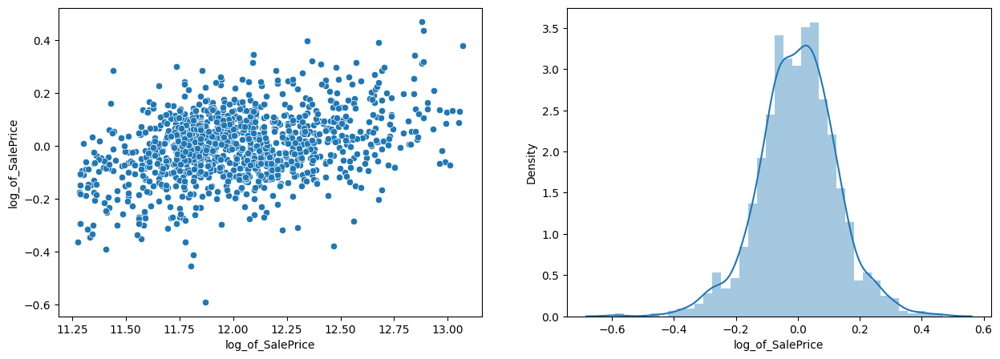

In [183]:
plot_residual(model_no_reg)

Residuals are as expected

## Model with Ridge Regularization

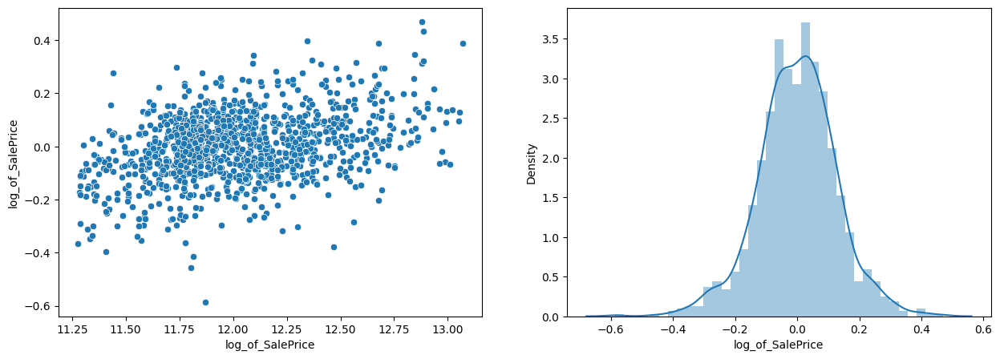

In [184]:
plot_residual(model_ridge)

Again, residuals are as expected

## Model with Lasso Regularization

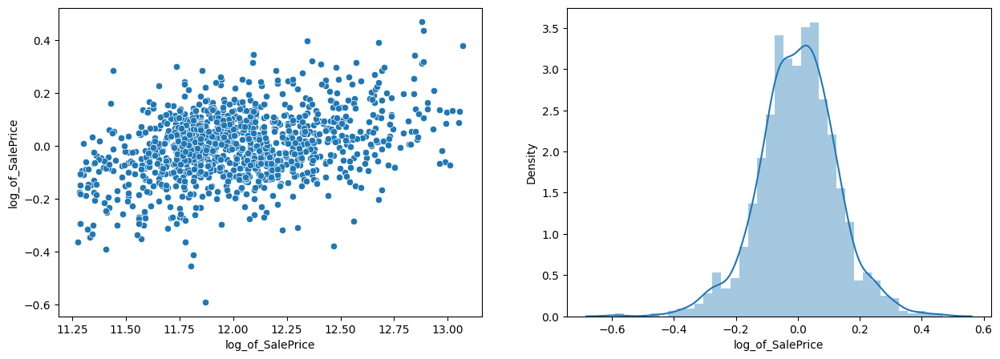

In [185]:
plot_residual(model_lasso)

Again, the same

# Step 5: Predictions and Evaluations on the test set

In [186]:
def predict_n_evaluate(model):
    y_test_pred = model.predict(X_test)
    test_r2_score = r2_score(y_true=y_test, y_pred=y_test_pred)
    print(f"R2-Score: {test_r2_score}")

## Model without Regularization

In [187]:
predict_n_evaluate(model_no_reg)

R2-Score: 0.8431290809682923


## Model with Ridge Regularization

In [188]:
predict_n_evaluate(model_ridge)

R2-Score: 0.8435258072437739


## Model with Lasso Regularization

In [189]:
predict_n_evaluate(model_lasso)

R2-Score: 0.8431290809682923


# Summary

On comparing the r2-scores from train and test set:
- Ridge has the best performance
- Next comes model without regularization
- Lasso is not worth the additional complexity if going for the best predictor model

# Additional Questions

## What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

In [190]:
print(f"Best alpha for Ridge: {best_alpha_ridge}")

Best alpha for Ridge: 2


In [191]:
print(f"Best alpha for Lasso: {best_alpha_lasso}")

Best alpha for Lasso: 0


In [ ]:
best_alpha_ridge_2x = best_alpha_ridge * 2

In [193]:
est = Ridge(alpha= best_alpha_ridge_2x)
model_ridge_2x_alpha = est.fit(X_train, y_train)

y_train_pred = model_ridge_2x_alpha.predict(X_train)
r2_score_train = r2_score(y_true=y_train, y_pred=y_train_pred)

y_test_pred = model_ridge_2x_alpha.predict(X_test)
r2_score_test = r2_score(y_true=y_test, y_pred=y_test_pred)

print(f"Ridge Regularization with double the best alpha value:")
print(f"Train R2-score: {r2_score_train}")
print(f"Test R2-score: {r2_score_test}")
print()

coef = [ (name,beta) for name,beta in zip(model_ridge_2x_alpha.feature_names_in_, model_ridge_2x_alpha.coef_) ]
coef_df = pd.DataFrame(coef, columns=["Feature", "Coefficient"])
coef_df['coef_abs'] = coef_df["Coefficient"].apply(np.abs)
coef_df = coef_df.sort_values(by=["coef_abs"], ascending=False).reset_index(drop=True).drop(columns=["coef_abs"])
print("Coefficients:")
print(coef_df)

Coefficients:
                                Feature  Coefficient
0                  Neighborhood|NridgHt     0.128265
1                   OverallCond|low_rat    -0.125193
2                      Functional|other    -0.115140
3                       BsmtExposure|Gd     0.112005
4                  ExterQual|low_rating    -0.111743
5                        BldgType|other    -0.106074
6                           MSZoning|RM    -0.101379
7                    OverallCond|ex_rat     0.098516
8                 SaleCondition|Partial     0.095495
9   GarageQual|other_rating_r_no_rating    -0.087641
10          YearRemodAdd|2000-till date     0.069169
11                  SaleCondition|other    -0.063065
12                     Foundation|PConc     0.060892
13                    GarageType|Attchd     0.053045
14                     Condition1|other    -0.052784
15               FireplaceQu|low_rating     0.048494
16                 HeatingQC|low_rating    -0.032289
17                  YearBuilt|19

When you compare this with the best alpha for Ridge Regression

In [194]:
print(f"R2-Score for Ridge Regularization with the best alpha value: {best_r2_score_ridge}")
print()

coef = [ (name,beta) for name,beta in zip(model_ridge.feature_names_in_, model_ridge.coef_) ]
coef_df = pd.DataFrame(coef, columns=["Feature", "Coefficient"])
coef_df['coef_abs'] = coef_df["Coefficient"].apply(np.abs)
coef_df = coef_df.sort_values(by=["coef_abs"], ascending=False).reset_index(drop=True).drop(columns=["coef_abs"])
print("Coefficients:")
print(coef_df)

R2-Score for Ridge Regularization with the best alpha value: 0.8705868605851732

Coefficients:
                                Feature  Coefficient
0                  Neighborhood|NridgHt     0.132842
1                   OverallCond|low_rat    -0.128209
2                      Functional|other    -0.117582
3                       BsmtExposure|Gd     0.114976
4                  ExterQual|low_rating    -0.111992
5                    OverallCond|ex_rat     0.110986
6                        BldgType|other    -0.108265
7                           MSZoning|RM    -0.102732
8                 SaleCondition|Partial     0.097118
9   GarageQual|other_rating_r_no_rating    -0.089207
10          YearRemodAdd|2000-till date     0.068555
11                  SaleCondition|other    -0.063730
12                     Foundation|PConc     0.060890
13                     Condition1|other    -0.053292
14                    GarageType|Attchd     0.052201
15               FireplaceQu|low_rating     0.048199
16  

There are very small changes in the coefficient, but the relative order has not changed. So, the most important predictor variables are the same as before, ie, say top 5 will be
- Neighborhood|NridgHt
- OverallCond|low_rat
- Functional|other
- OverallCond|ex_rat
- BsmtExposure|Gd

Since the best alpha value for the Lasso regression was 0, its double is also 0. Hence, no change in the coefficients for Lasso regression

## You have determined the optimal value of lambda for ridge and lasso regression during the assignment. Now, which one will you choose to apply and why?

Ridge, because from the results obtained, the best alpha value of lasso is 0, ie, no lasso at all.

## After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

The 5 most important predictor variables where:
- Neighborhood|NridgHt
- OverallCond|low_rat
- Functional|other
- OverallCond|ex_rat
- BsmtExposure|Gd
<br> Removing them

In [195]:
imp_cols = [ "Neighborhood|NridgHt", "OverallCond|low_rat", "Functional|other", "OverallCond|ex_rat", "BsmtExposure|Gd" ]
new_col_set = [ col for col in X_train.columns if col not in imp_cols ]
X_train_q3 = X_train[ new_col_set ]
X_test_q3 = X_test[ new_col_set ]

In [196]:
est = Lasso()
param_grid = {
    "alpha": [0, 0.0001, 0.0002, 0.0003, 0.0004, 0.0005]
}
grid_search = GridSearchCV(est, param_grid, cv=5, scoring="r2", return_train_score=True)
grid_search.fit(X_train_q3, y_train)

summary = pd.DataFrame(grid_search.cv_results_)
summary[['param_alpha', 'mean_test_score']]

,param_alpha,mean_test_score
0,0,0.841574
1,0.0001,0.841590
2,0.0002,0.841591
3,0.0003,0.841578
4,0.0004,0.841550
5,0.0005,0.841507


In [197]:
best_alpha_lasso = grid_search.best_params_['alpha']
print(f"Best Alpha: {best_alpha_lasso}")
best_r2_score_lasso = grid_search.best_score_
print(f"Best R2-Score: {best_r2_score_lasso}")
print()

model_lasso = grid_search.best_estimator_
coef = [ (name,beta) for name,beta in zip(model_lasso.feature_names_in_, model_lasso.coef_) ]
coef_df = pd.DataFrame(coef, columns=["Feature", "Coefficient"])
coef_df['coef_abs'] = coef_df["Coefficient"].apply(np.abs)
coef_df = coef_df.sort_values(by=["coef_abs"], ascending=False).reset_index(drop=True).drop(columns=["coef_abs"])
print("Coefficients:")
print(coef_df)

Best Alpha: 0.0002
Best R2-Score: 0.841590817122927

Coefficients:
                                Feature  Coefficient
0                  ExterQual|low_rating    -0.131568
1                 SaleCondition|Partial     0.123730
2                           MSZoning|RM    -0.106017
3                        BldgType|other    -0.092031
4   GarageQual|other_rating_r_no_rating    -0.085464
5           YearRemodAdd|2000-till date     0.080794
6                      Foundation|PConc     0.076517
7                   SaleCondition|other    -0.065185
8                FireplaceQu|low_rating     0.060912
9                     GarageType|Attchd     0.058314
10                     Condition1|other    -0.055383
11                   OverallCond|gd_rat     0.036140
12                 HeatingQC|low_rating    -0.033379
13                   Neighborhood|NAmes    -0.023019
14                  YearBuilt|1950-1999     0.021271
15                            GrLivArea     0.000381
16                           Bsm

As you can see, now the 5 most important predictor variables are:
- ExterQual|low_rating
- SaleCondition|Partial
- MSZoning|RM
- BldgType|other
- GarageQual|other_rating_r_no_rating